# Problem Statement
In the telecome industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecom industry experiences an average of 15-25% annual churn rate. And it cost 5-10 times more to acquire a new customer than to retain an existing one. For many incumbent operators, retaining high profitable customers is the number one business goal.

Our task: To identify the high risk churning customer and identify the main indicator of those churn customers among the high profitable custiomer.

Steps using during model building process:
1. Data Reading and Understanding
2. Data Cleaning
3. Data Visualization
4. Outlier Treatment
5. Data Preparation
6. Model Building

In [1093]:
# importing some usefull libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns',344)
pd.set_option('display.max_rows',344)

# import warnings
import warnings
warnings.filterwarnings('ignore')

# Step1: Data Reading and Understanding

In [1094]:
# read the data
churn = pd.read_csv('telecom_churn_data.csv', sep=",")
churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [1095]:
# check the shape of the data
churn.shape

(99999, 226)

In [1096]:
# defining the columns dtypes
def info_type(data):
    for i in data.columns:
        print(i+" : "+str(data[i].dtypes)+" : "+str(data[i].shape[0]))

In [1097]:
# checking the info of different columns
info_type(churn)

mobile_number : int64 : 99999
circle_id : int64 : 99999
loc_og_t2o_mou : float64 : 99999
std_og_t2o_mou : float64 : 99999
loc_ic_t2o_mou : float64 : 99999
last_date_of_month_6 : object : 99999
last_date_of_month_7 : object : 99999
last_date_of_month_8 : object : 99999
last_date_of_month_9 : object : 99999
arpu_6 : float64 : 99999
arpu_7 : float64 : 99999
arpu_8 : float64 : 99999
arpu_9 : float64 : 99999
onnet_mou_6 : float64 : 99999
onnet_mou_7 : float64 : 99999
onnet_mou_8 : float64 : 99999
onnet_mou_9 : float64 : 99999
offnet_mou_6 : float64 : 99999
offnet_mou_7 : float64 : 99999
offnet_mou_8 : float64 : 99999
offnet_mou_9 : float64 : 99999
roam_ic_mou_6 : float64 : 99999
roam_ic_mou_7 : float64 : 99999
roam_ic_mou_8 : float64 : 99999
roam_ic_mou_9 : float64 : 99999
roam_og_mou_6 : float64 : 99999
roam_og_mou_7 : float64 : 99999
roam_og_mou_8 : float64 : 99999
roam_og_mou_9 : float64 : 99999
loc_og_t2t_mou_6 : float64 : 99999
loc_og_t2t_mou_7 : float64 : 99999
loc_og_t2t_mou_8 : floa

All variables data type are in the correct format except the date variable

In [1098]:
# check the statistic summary of the numeric columns
churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

By seeing the summary of the numeric columns it seems there are some variables in the data which contains outliers and they are skewed distribution.

In [1099]:
# making a copy of data for keeping original data safe
churn1 = churn.copy()

# Step2: Data Cleaning
Steps include in data cleaning:
1. Handling Missing Value
2. Converting Date Variable Data Type
3. Filtering High Value Customers

In [1100]:
# for check
churn1.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

- There are some rows which has a large number of missing values we are going to fill them with zero.
- Because they are meaningfull missing.

In [1101]:
# check the missing rows
churn1.iloc[99800:100000,:]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
99800,7000523589,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,225.650,181.148,241.021,144.794,18.93,36.68,58.01,23.48,143.88,87.86,106.53,64.61,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,18.93,36.68,58.01,23.48,136.71,87.76,106.53,64.61,3.75,0.10,0.00,0.00,0.00,0.00,0.00,0.00,159.39,124.54,164.54,88.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.41,0.00,0.00,0.00,0.0,0.0,0.0,0.0,3.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,2.23,1.26,1.26,0.0,0.0,0.0,164.24,124.54,166.78,89.36,53.98,50.64,65.51,33.39,261.94,125.88,153.41,107.19,3.56,1.18,0.36,0.48,319.49,177.71,219.29,141.08,0.20,0.00,0.00,0.00,0.00,0.00,0.00,0.0

In [1102]:
# large number of missing rows filling with zero
row_miss = [202,275,1206,1232,1485,1663,2262,2470,3041,3274,3360,3423,3460,3506,3682,3758,4160,4190,4665,4821,5013,5266,5328,5514,5884,5886,5932,6017,6193,6198,6337,6344,6728,7039,7693,7922,8126,8381,8565,8624,8693,10128,10331,10655,10757,10804,10815,11053,11514,12037,12264,12366,12505,13195,13211,14161,14590,14749,14761,14902,15450,15803,15891,16192,16616,16862,17161,17258,17371,17405,17599,17658,17836,17875,17954,17984,18351,18474,19622,19633,20257,20635,21090,21433,21500,21567,21676,21962,22140,22219,22647,22758,22892,22936,22949,23070,23139,23291,23512,23546,23789,23866,24117,24331,24334,24338,24558,24687,24711,24896,25489,25623,26421,27124,27131,27153,27191,27200,27389,27847,27848,27908,28551,28583,28699,28819,28952,30014,30400,30460,30548,30604,30833,30872,30946,31526,31573,31803,31923,31971,32115,32368,32474,32988,33018,33547,34011,34796,34922,34935,35097,35401,35460,35752,36592,37108,37313,37405,37933,38069,38564,38737,39148,39359,39825,39897,40085,40144,40148,40276,40325,41365,41397,41543,41565,42827,43390,43885,43957,44040,44279,44833,45170,45426,46033,46295,46515,46858,46985,47055,47179,47315,47552,47699,47786,48138,48177,49153,49211,49582,49594,49772,49903,50080,50406,50491,50816,50888,50961,51222,51296,51645,52138,52266,52298,52400,52507,52697,52858,53149,53306,53368,53460,53850,53865,54126,54184,54504,54762,55351,55363,55411,55428,55543,55564,55775,55855,56067,56415,56479,57244,57525,57550,57826,58385,58582,58642,58833,58900,58910,59458,59519,59594,59972,60103,60378,60687,60972,61541,61916,62624,62682,63047,63353,63673,63774,63972,64025,64048,64494,64905,65181,65247,65446,66569,66670,66705,66857,66900,66988,67391,67977,68105,68195,68720,68725,69152,69760,69970,70094,70300,70972,71262,71813,72215,72320,72434,72561,74244,74659,74778,74798,74860,74921,74998,75163,75456,75738,75849,76057,76430,76506,76515,76887,76977,77134,78122,78379,78392,78656,78683,78896,78977,79014,79166,79269,79692,80040,80625,80634,80932,81243,81531,82087,82270,82281,82390,82965,83367,83464,83639,83941,84071,84073,84254,84506,84692,85839,86286,86681,87336,87623,87807,88011,88348,88539,88545,88642,88762,88785,88926,89002,89020,89550,89917,90103,90369,90661,91834,91889,91902,92826,93534,93706,93715,94408,94482,94772,95004,95032,95495,95939,96452,96800,96810,96966,97539,97762,97810,98232,98933,99993]
churn1.iloc[row_miss] = churn1.iloc[row_miss].fillna(0)

In [1103]:
# check the result
churn1.iloc[202:203,:]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
202,7001788209,109,0.0,0.0,0.0,6/30/2014,0,0,0,126.339,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,148,0,0,0,148,0,0,0,6/25/2014,0,0,0,148,0,0,0,0,0,0,0,0.0,0

In [1104]:
# check the percentage of missing values
100*(churn1.isnull().sum()/churn1.shape[0]).sort_values(ascending=False)

count_rech_2g_6             74.456745
date_of_last_rech_data_6    74.456745
count_rech_3g_6             74.456745
av_rech_amt_data_6          74.456745
max_rech_data_6             74.456745
total_rech_data_6           74.456745
arpu_3g_6                   74.456745
arpu_2g_6                   74.456745
night_pck_user_6            74.456745
fb_user_6                   74.456745
arpu_3g_7                   74.038740
count_rech_2g_7             74.038740
fb_user_7                   74.038740
count_rech_3g_7             74.038740
arpu_2g_7                   74.038740
av_rech_amt_data_7          74.038740
max_rech_data_7             74.038740
night_pck_user_7            74.038740
total_rech_data_7           74.038740
date_of_last_rech_data_7    74.038740
night_pck_user_9            73.686737
date_of_last_rech_data_9    73.686737
fb_user_9                   73.686737
arpu_2g_9                   73.686737
max_rech_data_9             73.686737
arpu_3g_9                   73.686737
total_rech_d

#### There are some variables that has more than 70% missing values so we are going to delete them.

In [1105]:
# removing most missing values variables
miss_cols = ['count_rech_2g_6','date_of_last_rech_data_6','count_rech_3g_6','av_rech_amt_data_6','max_rech_data_6','total_rech_data_6','arpu_3g_6','arpu_2g_6','night_pck_user_6','fb_user_6','arpu_3g_7','count_rech_2g_7','fb_user_7','count_rech_3g_7','arpu_2g_7','av_rech_amt_data_7','max_rech_data_7','night_pck_user_7','total_rech_data_7','date_of_last_rech_data_7','night_pck_user_9','date_of_last_rech_data_9','fb_user_9','arpu_2g_9','max_rech_data_9','arpu_3g_9','total_rech_data_9','av_rech_amt_data_9','count_rech_3g_9','count_rech_2g_9','fb_user_8','av_rech_amt_data_8','count_rech_3g_8','count_rech_2g_8','date_of_last_rech_data_8','total_rech_data_8','max_rech_data_8','arpu_3g_8','arpu_2g_8','night_pck_user_8']

churn1.drop(columns=miss_cols, axis=1, inplace=True)

In [1106]:
# check the result
100*(churn1.isnull().sum()/churn1.shape[0]).sort_values(ascending=False)

loc_ic_t2m_mou_9        7.353074
std_og_t2t_mou_9        7.353074
std_ic_t2f_mou_9        7.353074
std_ic_t2t_mou_9        7.353074
roam_og_mou_9           7.353074
loc_ic_mou_9            7.353074
loc_og_t2t_mou_9        7.353074
loc_ic_t2f_mou_9        7.353074
roam_ic_mou_9           7.353074
ic_others_9             7.353074
loc_og_mou_9            7.353074
std_ic_t2o_mou_9        7.353074
offnet_mou_9            7.353074
loc_ic_t2t_mou_9        7.353074
std_ic_mou_9            7.353074
onnet_mou_9             7.353074
og_others_9             7.353074
std_og_mou_9            7.353074
isd_ic_mou_9            7.353074
std_og_t2m_mou_9        7.353074
std_og_t2f_mou_9        7.353074
loc_og_t2f_mou_9        7.353074
std_og_t2c_mou_9        7.353074
spl_ic_mou_9            7.353074
isd_og_mou_9            7.353074
loc_og_t2c_mou_9        7.353074
spl_og_mou_9            7.353074
loc_og_t2m_mou_9        7.353074
std_ic_t2m_mou_9        7.353074
spl_ic_mou_8            4.987050
std_ic_t2f

#### There are some variables which has around 7% missing values we are going to impute them

In [1107]:
# check the values of the variable
churn1['loc_ic_t2m_mou_9'].describe()

count    92646.000000
mean       105.706311
std        165.286006
min          0.000000
25%         18.190000
50%         56.230000
75%        130.110000
max       5463.780000
Name: loc_ic_t2m_mou_9, dtype: float64

- As we can see the difference between mean and median is huge.
- So maybe chances are high that there are outlier in this variable.
- So we are imputing missing values with the median instead of mean for every variables whose difference between the mean and median is high.
- And if the difference is same then we are imputing missing values with the mean.

In [1108]:
# imputing missing value
churn1['loc_ic_t2m_mou_9'] = churn1['loc_ic_t2m_mou_9'].fillna(churn1['loc_ic_t2m_mou_9'].median())

In [1109]:
# check the result
churn1['loc_ic_t2m_mou_9'].isnull().sum()

0

In [1110]:
# check the values of the variable
churn1['std_og_t2t_mou_9'].describe()

count    92646.000000
mean        81.994513
std        266.672703
min          0.000000
25%          0.000000
50%          0.000000
75%         27.790000
max       9382.580000
Name: std_og_t2t_mou_9, dtype: float64

In [1111]:
# imputing missing value
churn1['std_og_t2t_mou_9'] = churn1['std_og_t2t_mou_9'].fillna(churn1['std_og_t2t_mou_9'].median())

In [1112]:
# check the result
churn1['std_og_t2t_mou_9'].isnull().sum()

0

In [1113]:
# check the values of the variable
churn1['std_ic_t2f_mou_9'].describe()

count    92646.000000
mean         2.164223
std         15.945385
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1431.960000
Name: std_ic_t2f_mou_9, dtype: float64

In [1114]:
# imputing missing value
churn1['std_ic_t2f_mou_9'] = churn1['std_ic_t2f_mou_9'].fillna(churn1['std_ic_t2f_mou_9'].mean())

In [1115]:
# check the result
churn1['std_ic_t2f_mou_9'].isnull().sum()

0

In [1116]:
# check the values of the variable
churn1['std_ic_t2t_mou_9'].describe()

count    92646.000000
mean         9.392569
std         53.266749
min          0.000000
25%          0.000000
50%          0.000000
75%          3.480000
max       3819.830000
Name: std_ic_t2t_mou_9, dtype: float64

In [1117]:
# imputing missing value
churn1['std_ic_t2t_mou_9'] = churn1['std_ic_t2t_mou_9'].fillna(churn1['std_ic_t2t_mou_9'].median())

In [1118]:
# check the result
churn1['std_ic_t2t_mou_9'].isnull().sum()

0

In [1119]:
# check the values of the variable
churn1['roam_og_mou_9'].describe()

count    92646.000000
mean         8.519319
std         58.317068
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4428.460000
Name: roam_og_mou_9, dtype: float64

In [1120]:
# imputing missing value
churn1['roam_og_mou_9'] = churn1['roam_og_mou_9'].fillna(churn1['roam_og_mou_9'].median())

In [1121]:
# check the result
churn1['roam_og_mou_9'].isnull().sum()

0

In [1122]:
# check the values of the variable
churn1['loc_ic_mou_9'].describe()

count    92646.000000
mean       163.922763
std        249.544815
min          0.000000
25%         31.690000
50%         90.980000
75%        202.005000
max      10796.290000
Name: loc_ic_mou_9, dtype: float64

In [1123]:
# imputing missing value
churn1['loc_ic_mou_9'] = churn1['loc_ic_mou_9'].fillna(churn1['loc_ic_mou_9'].median())

In [1124]:
# check the result
churn1['loc_ic_mou_9'].isnull().sum()

0

In [1125]:
# check the values of the variable
churn1['loc_og_t2t_mou_9'].describe()

count    92646.000000
mean        44.395802
std        147.710311
min          0.000000
25%          1.300000
50%         11.130000
75%         39.060000
max      10389.240000
Name: loc_og_t2t_mou_9, dtype: float64

In [1126]:
# imputing missing value
churn1['loc_og_t2t_mou_9'] = churn1['loc_og_t2t_mou_9'].fillna(churn1['loc_og_t2t_mou_9'].median())

In [1127]:
# check the result
churn1['loc_og_t2t_mou_9'].isnull().sum()

0

In [1128]:
# check the values of the variable
churn1['loc_ic_t2f_mou_9'].describe()

count    92646.000000
mean        12.121599
std         43.755063
min          0.000000
25%          0.000000
50%          0.940000
75%          8.090000
max       4318.280000
Name: loc_ic_t2f_mou_9, dtype: float64

In [1129]:
# imputing missing value
churn1['loc_ic_t2f_mou_9'] = churn1['loc_ic_t2f_mou_9'].fillna(churn1['loc_ic_t2f_mou_9'].median())

In [1130]:
# check the result
churn1['loc_ic_t2f_mou_9'].isnull().sum()

0

In [1131]:
# check the values of the variable
churn1['roam_ic_mou_9'].describe()

count    92646.000000
mean         6.316999
std         57.018015
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       8464.030000
Name: roam_ic_mou_9, dtype: float64

In [1132]:
# imputing missing value
churn1['roam_ic_mou_9'] = churn1['roam_ic_mou_9'].fillna(churn1['roam_ic_mou_9'].median())

In [1133]:
# check the result
churn1['roam_ic_mou_9'].isnull().sum()

0

In [1134]:
# check the values of the variable
churn1['ic_others_9'].describe()

count    92646.000000
mean         1.012858
std         12.355127
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1005.230000
Name: ic_others_9, dtype: float64

In [1135]:
# imputing missing value
churn1['ic_others_9'] = churn1['ic_others_9'].fillna(churn1['ic_others_9'].mean())

In [1136]:
# check the result
churn1['ic_others_9'].isnull().sum()

0

In [1137]:
# check the values of the variable
churn1['loc_og_mou_9'].describe()

count    92646.000000
mean       138.123066
std        245.578772
min          0.000000
25%         15.160000
50%         61.340000
75%        161.590000
max      11099.260000
Name: loc_og_mou_9, dtype: float64

In [1138]:
# imputing missing value
churn1['loc_og_mou_9'] = churn1['loc_og_mou_9'].fillna(churn1['loc_og_mou_9'].median())

In [1139]:
# check the result
churn1['loc_og_mou_9'].isnull().sum()

0

In [1140]:
# check the values of the variable
churn1['std_ic_t2o_mou_9'].describe()

count    92646.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2o_mou_9, dtype: float64

- As we can see there are every value as 0  so we are going to drop this variable as this is of no use.

In [1141]:
churn1.drop('std_ic_t2o_mou_9', axis=1, inplace=True)

In [1142]:
# check the values of the variable
churn1['offnet_mou_9'].describe()

count    92646.000000
mean       189.531875
std        318.959030
min          0.000000
25%         26.565000
50%         86.630000
75%        219.480000
max      10310.760000
Name: offnet_mou_9, dtype: float64

In [1143]:
# imputing missing value
churn1['offnet_mou_9'] = churn1['offnet_mou_9'].fillna(churn1['offnet_mou_9'].median())

In [1144]:
# check the result
churn1['offnet_mou_9'].isnull().sum()

0

In [1145]:
# check the values of the variable
churn1['loc_ic_t2t_mou_9'].describe()

count    92646.000000
mean        46.085968
std        139.866101
min          0.000000
25%          3.180000
50%         15.510000
75%         44.940000
max      10598.830000
Name: loc_ic_t2t_mou_9, dtype: float64

In [1146]:
# imputing missing value
churn1['loc_ic_t2t_mou_9'] = churn1['loc_ic_t2t_mou_9'].fillna(churn1['loc_ic_t2t_mou_9'].median())

In [1147]:
# check the result
churn1['loc_ic_t2t_mou_9'].isnull().sum()

0

In [1148]:
# check the values of the variable
churn1['std_ic_mou_9'].describe()

count    92646.000000
mean        31.097208
std        101.786507
min          0.000000
25%          0.000000
50%          5.280000
75%         25.540000
max       5956.660000
Name: std_ic_mou_9, dtype: float64

In [1149]:
# imputing missing value
churn1['std_ic_mou_9'] = churn1['std_ic_mou_9'].fillna(churn1['std_ic_mou_9'].median())

In [1150]:
# check the result
churn1['std_ic_mou_9'].isnull().sum()

0

In [1151]:
# check the values of the variable
churn1['onnet_mou_9'].describe()

count    92646.000000
mean       129.750997
std        307.940535
min          0.000000
25%          5.180000
50%         29.530000
75%        111.505000
max      10427.460000
Name: onnet_mou_9, dtype: float64

In [1152]:
# imputing missing value
churn1['onnet_mou_9'] = churn1['onnet_mou_9'].fillna(churn1['onnet_mou_9'].median())

In [1153]:
# check the result
churn1['onnet_mou_9'].isnull().sum()

0

In [1154]:
# check the values of the variable
churn1['og_others_9'].describe()

count    92646.000000
mean         0.047255
std          3.627768
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        787.790000
Name: og_others_9, dtype: float64

In [1155]:
# imputing missing value
churn1['og_others_9'] = churn1['og_others_9'].fillna(churn1['og_others_9'].median())

In [1156]:
# check the result
churn1['og_others_9'].isnull().sum()

0

In [1157]:
# check the values of the variable
churn1['std_og_mou_9'].describe()

count    92646.000000
mean       168.946589
std        404.430610
min          0.000000
25%          0.000000
50%          8.150000
75%        140.740000
max      11495.310000
Name: std_og_mou_9, dtype: float64

In [1158]:
# imputing missing value
churn1['std_og_mou_9'] = churn1['std_og_mou_9'].fillna(churn1['std_og_mou_9'].median())

In [1159]:
# check the result
churn1['std_og_mou_9'].isnull().sum()

0

In [1160]:
# check the values of the variable
churn1['isd_ic_mou_9'].describe()

count    92646.000000
mean         8.028887
std         63.373046
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5057.740000
Name: isd_ic_mou_9, dtype: float64

In [1161]:
# imputing missing value
churn1['isd_ic_mou_9'] = churn1['isd_ic_mou_9'].fillna(churn1['isd_ic_mou_9'].median())

In [1162]:
# check the result
churn1['isd_ic_mou_9'].isnull().sum()

0

In [1163]:
# check the values of the variable
churn1['std_og_t2m_mou_9'].describe()

count    92646.000000
mean        85.911572
std        260.913884
min          0.000000
25%          0.000000
50%          2.400000
75%         48.090000
max      10223.430000
Name: std_og_t2m_mou_9, dtype: float64

In [1164]:
# imputing missing value
churn1['std_og_t2m_mou_9'] = churn1['std_og_t2m_mou_9'].fillna(churn1['std_og_t2m_mou_9'].median())

In [1165]:
# check the result
churn1['std_og_t2m_mou_9'].isnull().sum()

0

In [1166]:
# check the values of the variable
churn1['std_og_t2f_mou_9'].describe()

count    92646.000000
mean         1.037952
std          8.244551
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        808.490000
Name: std_og_t2f_mou_9, dtype: float64

In [1167]:
# imputing missing value
churn1['std_og_t2f_mou_9'] = churn1['std_og_t2f_mou_9'].fillna(churn1['std_og_t2f_mou_9'].median())

In [1168]:
# check the result
churn1['std_og_t2f_mou_9'].isnull().sum()

0

In [1169]:
# check the values of the variable
churn1['loc_og_t2f_mou_9'].describe()

count    92646.000000
mean         3.639658
std         13.431144
min          0.000000
25%          0.000000
50%          0.000000
75%          1.930000
max        927.410000
Name: loc_og_t2f_mou_9, dtype: float64

In [1170]:
# imputing missing value
churn1['loc_og_t2f_mou_9'] = churn1['loc_og_t2f_mou_9'].fillna(churn1['loc_og_t2f_mou_9'].median())

In [1171]:
# check the result
churn1['loc_og_t2f_mou_9'].isnull().sum()

0

In [1172]:
# check the values of the variable
churn1['std_og_t2c_mou_9'].describe()

count    92646.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_og_t2c_mou_9, dtype: float64

In [1173]:
# drop the variable
churn1.drop('std_og_t2c_mou_9', axis=1, inplace=True)

In [1174]:
# check the values of the variable
churn1['spl_ic_mou_9'].describe()

count    92646.000000
mean         0.162447
std          0.526849
min          0.000000
25%          0.000000
50%          0.000000
75%          0.060000
max         62.380000
Name: spl_ic_mou_9, dtype: float64

In [1175]:
# imputing missing value
churn1['spl_ic_mou_9'] = churn1['spl_ic_mou_9'].fillna(churn1['spl_ic_mou_9'].mean())

In [1176]:
# check the result
churn1['spl_ic_mou_9'].isnull().sum()

0

In [1177]:
# check the values of the variable
churn1['isd_og_mou_9'].describe()

count    92646.000000
mean         0.720829
std         21.265670
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4244.530000
Name: isd_og_mou_9, dtype: float64

In [1178]:
# imputing missing value
churn1['isd_og_mou_9'] = churn1['isd_og_mou_9'].fillna(churn1['isd_og_mou_9'].mean())

In [1179]:
# check the result
churn1['isd_og_mou_9'].isnull().sum()

0

In [1180]:
# check the values of the variable
churn1['loc_og_t2c_mou_9'].describe()

count    92646.000000
mean         1.227510
std          5.607692
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        339.840000
Name: loc_og_t2c_mou_9, dtype: float64

In [1181]:
# imputing missing value
churn1['loc_og_t2c_mou_9'] = churn1['loc_og_t2c_mou_9'].fillna(churn1['loc_og_t2c_mou_9'].mean())

In [1182]:
# check the result
churn1['loc_og_t2c_mou_9'].isnull().sum()

0

In [1183]:
# check the values of the variable
churn1['spl_og_mou_9'].describe()

count    92646.000000
mean         4.394096
std         16.296164
min          0.000000
25%          0.000000
50%          0.000000
75%          3.190000
max       1635.710000
Name: spl_og_mou_9, dtype: float64

In [1184]:
# imputing missing value
churn1['spl_og_mou_9'] = churn1['spl_og_mou_9'].fillna(churn1['spl_og_mou_9'].mean())

In [1185]:
# check the result
churn1['spl_og_mou_9'].isnull().sum()

0

In [1186]:
# check the values of the variable
churn1['loc_og_t2m_mou_9'].describe()

count    92646.000000
mean        90.080428
std        158.454229
min          0.000000
25%          8.530000
50%         38.760000
75%        106.410000
max       4429.880000
Name: loc_og_t2m_mou_9, dtype: float64

In [1187]:
# imputing missing value
churn1['loc_og_t2m_mou_9'] = churn1['loc_og_t2m_mou_9'].fillna(churn1['loc_og_t2m_mou_9'].median())

In [1188]:
# check the result
churn1['loc_og_t2m_mou_9'].isnull().sum()

0

In [1189]:
# check the values of the variable
churn1['std_ic_t2m_mou_9'].describe()

count    92646.000000
mean        19.537894
std         74.765244
min          0.000000
25%          0.000000
50%          1.700000
75%         14.160000
max       5689.760000
Name: std_ic_t2m_mou_9, dtype: float64

In [1190]:
# imputing missing value
churn1['std_ic_t2m_mou_9'] = churn1['std_ic_t2m_mou_9'].fillna(churn1['std_ic_t2m_mou_9'].median())

In [1191]:
# check the result
100*(churn1.isnull().sum()/churn1.shape[0]).sort_values(ascending=False)

spl_ic_mou_8            4.987050
std_ic_t2o_mou_8        4.987050
std_og_t2m_mou_8        4.987050
roam_ic_mou_8           4.987050
ic_others_8             4.987050
std_ic_t2m_mou_8        4.987050
roam_og_mou_8           4.987050
std_ic_t2f_mou_8        4.987050
loc_og_t2t_mou_8        4.987050
std_ic_mou_8            4.987050
offnet_mou_8            4.987050
std_og_t2t_mou_8        4.987050
loc_og_t2m_mou_8        4.987050
loc_og_mou_8            4.987050
std_og_mou_8            4.987050
loc_og_t2f_mou_8        4.987050
isd_ic_mou_8            4.987050
loc_og_t2c_mou_8        4.987050
loc_ic_mou_8            4.987050
std_ic_t2t_mou_8        4.987050
std_og_t2f_mou_8        4.987050
loc_ic_t2m_mou_8        4.987050
loc_ic_t2f_mou_8        4.987050
og_others_8             4.987050
loc_ic_t2t_mou_8        4.987050
std_og_t2c_mou_8        4.987050
spl_og_mou_8            4.987050
onnet_mou_8             4.987050
isd_og_mou_8            4.987050
date_of_last_rech_9     4.370044
isd_ic_mou

- Now we can see there are some variables which have less than 5% missing values.
- We are going to drop these rows as these are very less missing values.

In [1192]:
99999-4987

95012

In [1193]:
churn1.shape

(99999, 184)

In [1194]:
churn1.dropna(inplace=True)

In [1195]:
churn1.shape

(86749, 184)

In [1196]:
# check the result
100*(churn1.isnull().sum()/churn1.shape[0]).sort_values(ascending=False)

sep_vbc_3g              0.0
std_og_t2f_mou_6        0.0
std_og_mou_8            0.0
std_og_mou_7            0.0
std_og_mou_6            0.0
std_og_t2c_mou_8        0.0
std_og_t2c_mou_7        0.0
std_og_t2c_mou_6        0.0
std_og_t2f_mou_9        0.0
std_og_t2f_mou_8        0.0
std_og_t2f_mou_7        0.0
std_og_t2m_mou_9        0.0
jun_vbc_3g              0.0
std_og_t2m_mou_8        0.0
std_og_t2m_mou_7        0.0
std_og_t2m_mou_6        0.0
std_og_t2t_mou_9        0.0
std_og_t2t_mou_8        0.0
std_og_t2t_mou_7        0.0
std_og_t2t_mou_6        0.0
loc_og_mou_9            0.0
loc_og_mou_8            0.0
std_og_mou_9            0.0
isd_og_mou_6            0.0
isd_og_mou_7            0.0
isd_og_mou_8            0.0
loc_ic_t2m_mou_7        0.0
loc_ic_t2m_mou_6        0.0
loc_ic_t2t_mou_9        0.0
loc_ic_t2t_mou_8        0.0
loc_ic_t2t_mou_7        0.0
loc_ic_t2t_mou_6        0.0
total_og_mou_9          0.0
total_og_mou_8          0.0
total_og_mou_7          0.0
total_og_mou_6      

- Now all the variables have a zero null values.
- As we know date variable is in the incorrect data type form.
- Lets convert them into pandas date time format.

In [1197]:
# check the date column data type
for col in churn1.columns:
    if 'date' in col:
        print(col + ' : ' + str(churn1[col].dtype))

last_date_of_month_6 : object
last_date_of_month_7 : object
last_date_of_month_8 : object
last_date_of_month_9 : object
date_of_last_rech_6 : object
date_of_last_rech_7 : object
date_of_last_rech_8 : object
date_of_last_rech_9 : object


In [1198]:
# convert date variables data type into pandas date time format
churn1['last_date_of_month_6'] = pd.to_datetime(churn1['last_date_of_month_6'])
churn1['last_date_of_month_7'] = pd.to_datetime(churn1['last_date_of_month_7'])
churn1['last_date_of_month_8'] = pd.to_datetime(churn1['last_date_of_month_8'])
churn1['last_date_of_month_9'] = pd.to_datetime(churn1['last_date_of_month_9'])
churn1['date_of_last_rech_6'] = pd.to_datetime(churn1['date_of_last_rech_6'])
churn1['date_of_last_rech_7'] = pd.to_datetime(churn1['date_of_last_rech_7'])
churn1['date_of_last_rech_8'] = pd.to_datetime(churn1['date_of_last_rech_8'])
churn1['date_of_last_rech_9'] = pd.to_datetime(churn1['date_of_last_rech_9'])

In [1199]:
# check the result
churn1[['last_date_of_month_6']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86749 entries, 1 to 99997
Data columns (total 1 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   last_date_of_month_6  86749 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1.3 MB


#### Now we are done with data cleaning

# Step3: Data Visualization
## Univariate Analysis

In [1200]:
# check the data 
churn1.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,0.00,0.00,0.00,1.83,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,9,11,5,74,384,283,121,44,154,65,50,2014-06-29,2014-07-31,2014-08-28,2014-09-30,44,23,30,0,0.0,108.07,365.47,0.0,0.0,0.0,0.0,0.00,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1006,0.0,0.0,0.00,0.0
2,7001625959,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,22.24,0.0,135.54,45.76,0.48,60.66,67.41,67.66,64.81,4.34,26.49,22.58,8.76,41.81,67.41,75.53,9

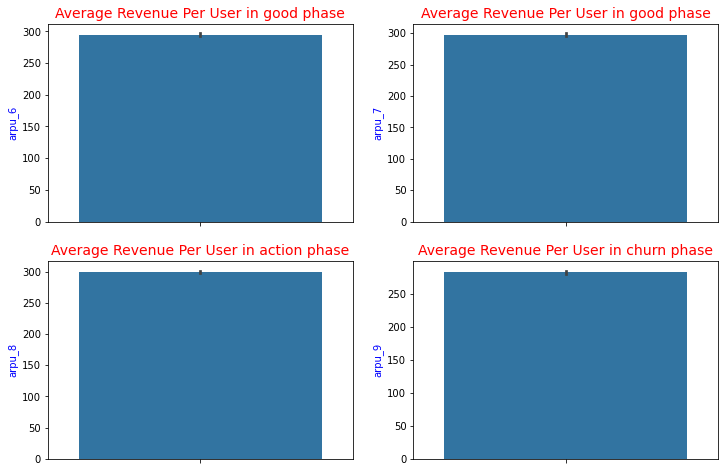

In [1201]:
# visualize average revenue per user
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.barplot(churn1['arpu_6'], orient='v')
plt.title('Average Revenue Per User in good phase', fontsize=14, color='r')
plt.ylabel('arpu_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.barplot(churn1['arpu_7'], orient='v')
plt.title('Average Revenue Per User in good phase', fontsize=14, color='r')
plt.ylabel('arpu_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.barplot(churn1['arpu_8'], orient='v')
plt.title('Average Revenue Per User in action phase', fontsize=14, color='r')
plt.ylabel('arpu_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.barplot(churn1['arpu_9'], orient='v')
plt.title('Average Revenue Per User in churn phase', fontsize=14, color='r')
plt.ylabel('arpu_9', fontsize=10, color='b')
plt.show()

- It seems with the help of bar chart we are not getting any specific insights from the `average revenue per user` variable.
- Lets try another chart

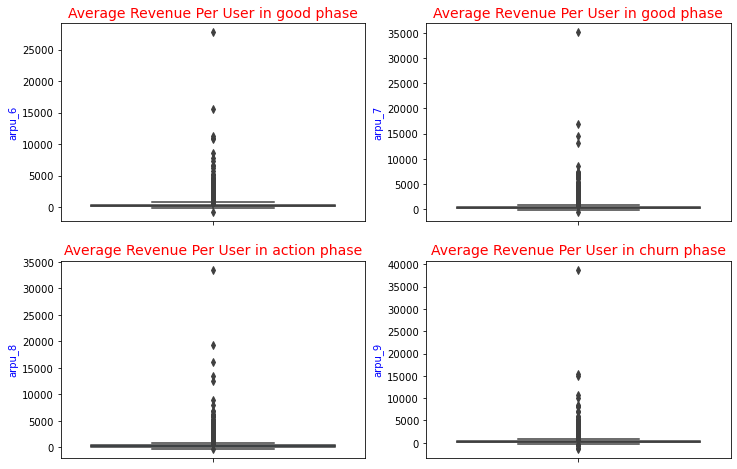

In [1202]:
# visualize average revenue per user
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.boxplot(churn1['arpu_6'], orient='v')
plt.title('Average Revenue Per User in good phase', fontsize=14, color='r')
plt.ylabel('arpu_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.boxplot(churn1['arpu_7'], orient='v')
plt.title('Average Revenue Per User in good phase', fontsize=14, color='r')
plt.ylabel('arpu_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.boxplot(churn1['arpu_8'], orient='v')
plt.title('Average Revenue Per User in action phase', fontsize=14, color='r')
plt.ylabel('arpu_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.boxplot(churn1['arpu_9'], orient='v')
plt.title('Average Revenue Per User in churn phase', fontsize=14, color='r')
plt.ylabel('arpu_9', fontsize=10, color='b')
plt.show()

- It seems this variable not giving any insights.
- Lets try another variable.

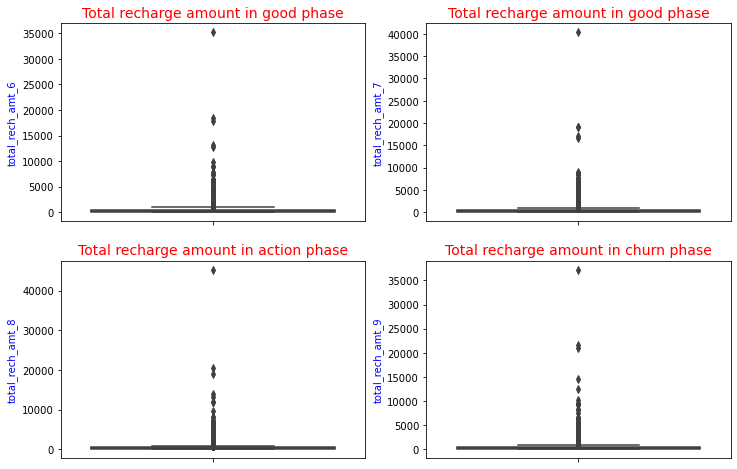

In [1203]:
# visualize total recharge amount
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.boxplot(churn1['total_rech_amt_6'], orient='v')
plt.title('Total recharge amount in good phase', fontsize=14, color='r')
plt.ylabel('total_rech_amt_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.boxplot(churn1['total_rech_amt_7'], orient='v')
plt.title('Total recharge amount in good phase', fontsize=14, color='r')
plt.ylabel('total_rech_amt_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.boxplot(churn1['total_rech_amt_8'], orient='v')
plt.title('Total recharge amount in action phase', fontsize=14, color='r')
plt.ylabel('total_rech_amt_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.boxplot(churn1['total_rech_amt_9'], orient='v')
plt.title('Total recharge amount in churn phase', fontsize=14, color='r')
plt.ylabel('total_rech_amt_9', fontsize=10, color='b')
plt.show()

- It seems this variable also not give much insights.
- Lets try another variable

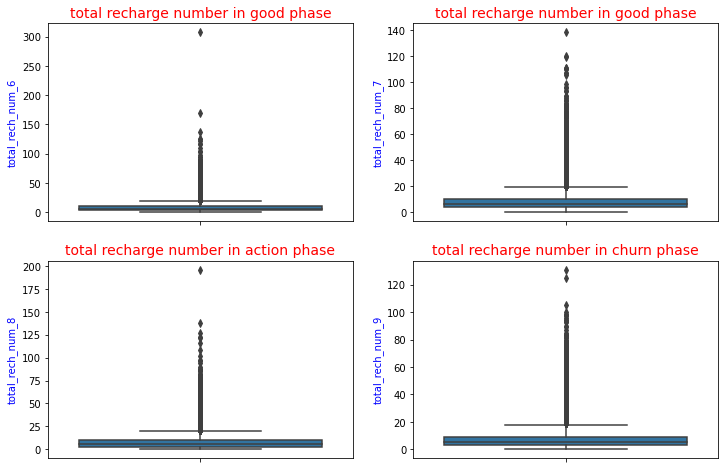

In [1204]:
# visualize total recharge number
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.boxplot(churn1['total_rech_num_6'], orient='v')
plt.title('total recharge number in good phase', fontsize=14, color='r')
plt.ylabel('total_rech_num_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.boxplot(churn1['total_rech_num_7'], orient='v')
plt.title('total recharge number in good phase', fontsize=14, color='r')
plt.ylabel('total_rech_num_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.boxplot(churn1['total_rech_num_8'], orient='v')
plt.title('total recharge number in action phase', fontsize=14, color='r')
plt.ylabel('total_rech_num_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.boxplot(churn1['total_rech_num_9'], orient='v')
plt.title('total recharge number in churn phase', fontsize=14, color='r')
plt.ylabel('total_rech_num_9', fontsize=10, color='b')
plt.show()

- It seems when customer wants to churn than their recharging volume is decresing a little bit

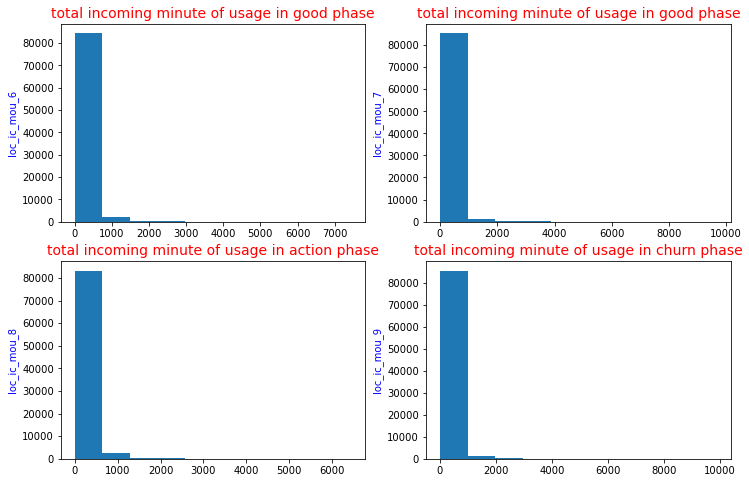

In [1205]:
# visualize total incoming minute of usage
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
plt.hist(churn1['loc_ic_mou_6'])
plt.title('total incoming minute of usage in good phase', fontsize=14, color='r')
plt.ylabel('loc_ic_mou_6', fontsize=10, color='b')
plt.subplot(2,2,2)
plt.hist(churn1['loc_ic_mou_7'])
plt.title('total incoming minute of usage in good phase', fontsize=14, color='r')
plt.ylabel('loc_ic_mou_7', fontsize=10, color='b')
plt.subplot(2,2,3)
plt.hist(churn1['loc_ic_mou_8'])
plt.title('total incoming minute of usage in action phase', fontsize=14, color='r')
plt.ylabel('loc_ic_mou_8', fontsize=10, color='b')
plt.subplot(2,2,4)
plt.hist(churn1['loc_ic_mou_9'])
plt.title('total incoming minute of usage in churn phase', fontsize=14, color='r')
plt.ylabel('loc_ic_mou_9', fontsize=10, color='b')
plt.show()

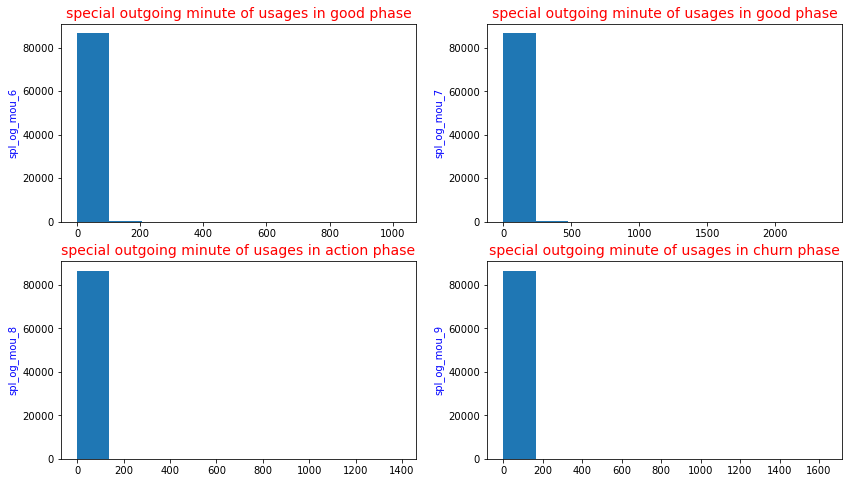

In [1206]:
# visualize special outgoing minute of usages
plt.figure(figsize=(14,8))
plt.subplot(2,2,1)
plt.hist(churn1['spl_og_mou_6'])
plt.title('special outgoing minute of usages in good phase', fontsize=14, color='r')
plt.ylabel('spl_og_mou_6', fontsize=10, color='b')
plt.subplot(2,2,2)
plt.hist(churn1['spl_og_mou_7'])
plt.title('special outgoing minute of usages in good phase', fontsize=14, color='r')
plt.ylabel('spl_og_mou_7', fontsize=10, color='b')
plt.subplot(2,2,3)
plt.hist(churn1['spl_og_mou_8'])
plt.title('special outgoing minute of usages in action phase', fontsize=14, color='r')
plt.ylabel('spl_og_mou_8', fontsize=10, color='b')
plt.subplot(2,2,4)
plt.hist(churn1['spl_og_mou_9'])
plt.title('special outgoing minute of usages in churn phase', fontsize=14, color='r')
plt.ylabel('spl_og_mou_9', fontsize=10, color='b')
plt.show()

#### It looks we are not getting any insights from the univariate analysis. Lets explore the Bivariate Analysis

## Bivariate Analysis

In [1207]:
# check the data
churn1.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,0.00,0.00,0.00,1.83,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,9,11,5,74,384,283,121,44,154,65,50,2014-06-29,2014-07-31,2014-08-28,2014-09-30,44,23,30,0,0.0,108.07,365.47,0.0,0.0,0.0,0.0,0.00,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1006,0.0,0.0,0.00,0.0
2,7001625959,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,22.24,0.0,135.54,45.76,0.48,60.66,67.41,67.66,64.81,4.34,26.49,22.58,8.76,41.81,67.41,75.53,9

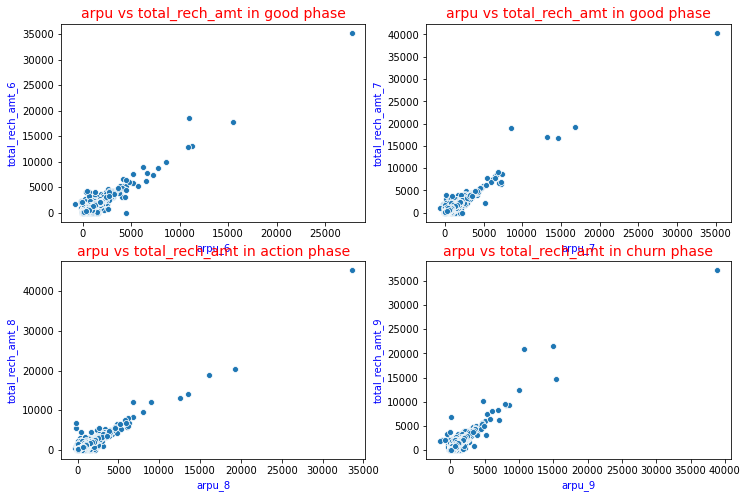

In [1208]:
# arpu vs total_rech_amt
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.scatterplot(churn1['arpu_6'], churn1['total_rech_amt_6'])
plt.title('arpu vs total_rech_amt in good phase', fontsize=14, color='r')
plt.xlabel('arpu_6', fontsize=10, color='b')
plt.ylabel('total_rech_amt_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.scatterplot(churn1['arpu_7'], churn1['total_rech_amt_7'])
plt.title('arpu vs total_rech_amt in good phase', fontsize=14, color='r')
plt.xlabel('arpu_7', fontsize=10,color='b')
plt.ylabel('total_rech_amt_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.scatterplot(churn1['arpu_8'],churn1['total_rech_amt_8'])
plt.title('arpu vs total_rech_amt in action phase', fontsize=14, color='r')
plt.xlabel('arpu_8', fontsize=10, color='b')
plt.ylabel('total_rech_amt_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.scatterplot(churn1['arpu_9'], churn1['total_rech_amt_9'])
plt.title('arpu vs total_rech_amt in churn phase', fontsize=14, color='r')
plt.xlabel('arpu_9', fontsize=10, color='b')
plt.ylabel('total_rech_amt_9', fontsize=10, color='b')
plt.show()

- It seems there is a linear relationship between average revenue per user and the total recharge amount by the user which is a obvious happen.
- There are some of the customers which looks in action phase start generating very less revenue but in terms of total recharge amount they are recharging good amount of money, maybe chances are high that these are those customers who wants to leave the service of our company.

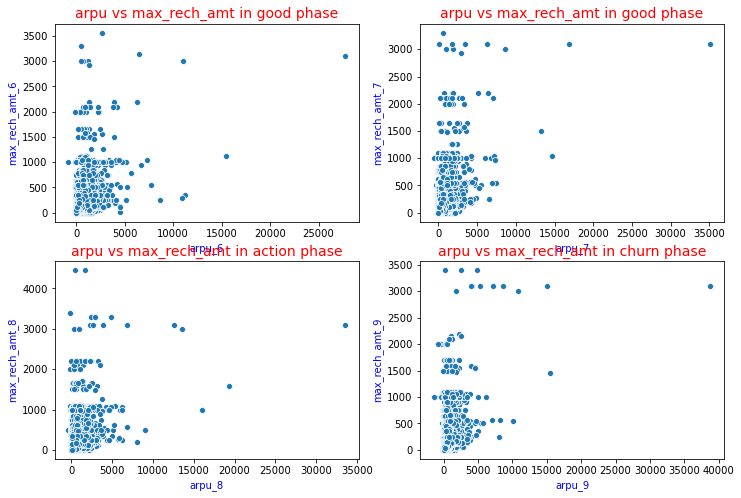

In [1209]:
# arpu vs max_rech_amt
plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.scatterplot(churn1['arpu_6'], churn1['max_rech_amt_6'])
plt.title('arpu vs max_rech_amt in good phase', fontsize=14, color='r')
plt.xlabel('arpu_6', fontsize=10, color='b')
plt.ylabel('max_rech_amt_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.scatterplot(churn1['arpu_7'], churn1['max_rech_amt_7'])
plt.title('arpu vs max_rech_amt in good phase', fontsize=14, color='r')
plt.xlabel('arpu_7', fontsize=10,color='b')
plt.ylabel('max_rech_amt_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.scatterplot(churn1['arpu_8'],churn1['max_rech_amt_8'])
plt.title('arpu vs max_rech_amt in action phase', fontsize=14, color='r')
plt.xlabel('arpu_8', fontsize=10, color='b')
plt.ylabel('max_rech_amt_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.scatterplot(churn1['arpu_9'], churn1['max_rech_amt_9'])
plt.title('arpu vs max_rech_amt in churn phase', fontsize=14, color='r')
plt.xlabel('arpu_9', fontsize=10, color='b')
plt.ylabel('max_rech_amt_9', fontsize=10, color='b')
plt.show()

- There are some customers who generate good amount of revenue at the maximum recharge amount of around 2000 in good phase.
- But those customers are not generating much revenue in the action phase.

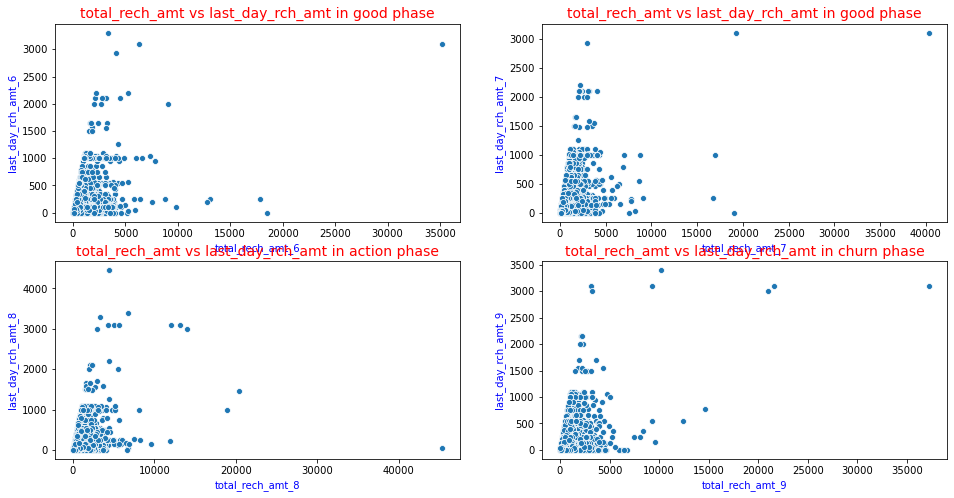

In [1210]:
# total_rech_amt vs last_day_rch_amt
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.scatterplot(churn1['total_rech_amt_6'], churn1['last_day_rch_amt_6'])
plt.title('total_rech_amt vs last_day_rch_amt in good phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_6', fontsize=10, color='b')
plt.ylabel('last_day_rch_amt_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.scatterplot(churn1['total_rech_amt_7'], churn1['last_day_rch_amt_7'])
plt.title('total_rech_amt vs last_day_rch_amt in good phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_7', fontsize=10,color='b')
plt.ylabel('last_day_rch_amt_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.scatterplot(churn1['total_rech_amt_8'],churn1['last_day_rch_amt_8'])
plt.title('total_rech_amt vs last_day_rch_amt in action phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_8', fontsize=10, color='b')
plt.ylabel('last_day_rch_amt_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.scatterplot(churn1['total_rech_amt_9'], churn1['last_day_rch_amt_9'])
plt.title('total_rech_amt vs last_day_rch_amt in churn phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_9', fontsize=10, color='b')
plt.ylabel('last_day_rch_amt_9', fontsize=10, color='b')
plt.show()

- There are some customers who make a large number of recharge amount at the last day at the time of action phase, maybe that is the sign of their churning behaviour.
- And also at the action phase there are very less customers whose last day recharge amount is between 100 and 1000 and the total recharge amount is between 100 and 9000.

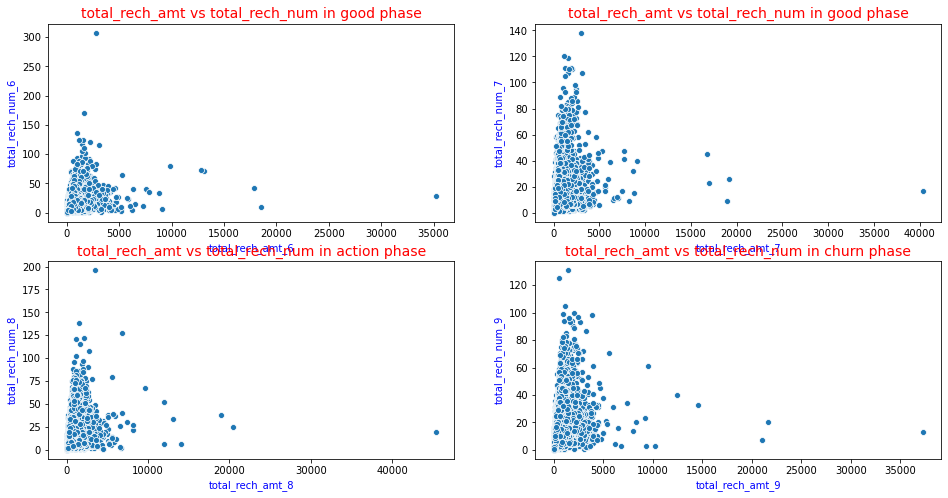

In [1211]:
# total_rech_num vs total_rech_amt
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.scatterplot(churn1['total_rech_amt_6'], churn1['total_rech_num_6'])
plt.title('total_rech_amt vs total_rech_num in good phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_6', fontsize=10, color='b')
plt.ylabel('total_rech_num_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.scatterplot(churn1['total_rech_amt_7'], churn1['total_rech_num_7'])
plt.title('total_rech_amt vs total_rech_num in good phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_7', fontsize=10,color='b')
plt.ylabel('total_rech_num_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.scatterplot(churn1['total_rech_amt_8'],churn1['total_rech_num_8'])
plt.title('total_rech_amt vs total_rech_num in action phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_8', fontsize=10, color='b')
plt.ylabel('total_rech_num_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.scatterplot(churn1['total_rech_amt_9'], churn1['total_rech_num_9'])
plt.title('total_rech_amt vs total_rech_num in churn phase', fontsize=14, color='r')
plt.xlabel('total_rech_amt_9', fontsize=10, color='b')
plt.ylabel('total_rech_num_9', fontsize=10, color='b')
plt.show()

- In good phases large number of customers are recharging large quantity of numbers and total recharge amount.
- But in the action phase their quantity of recharging a number is decreased, maybe these are those segment of customers who want to switch the provider.

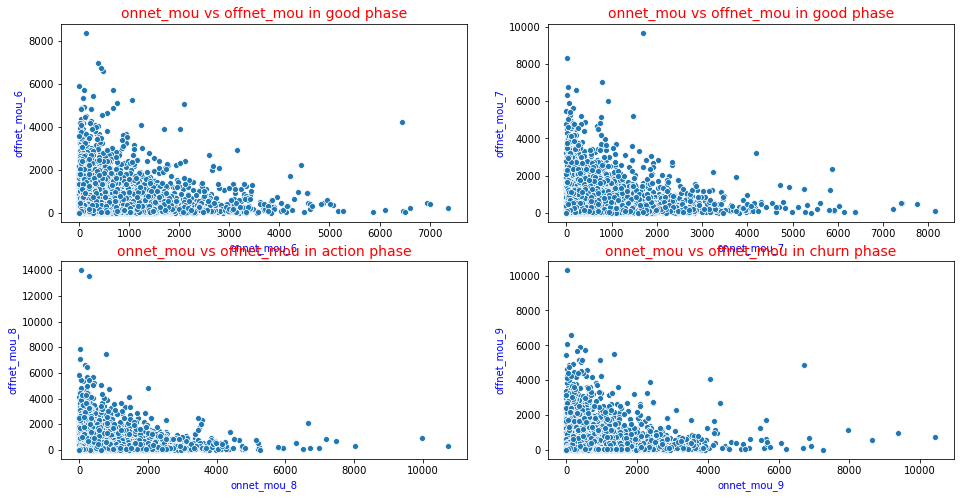

In [1212]:
# onnet_mou vs offnet_mou
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.scatterplot(churn1['onnet_mou_6'], churn1['offnet_mou_6'])
plt.title('onnet_mou vs offnet_mou in good phase', fontsize=14, color='r')
plt.xlabel('onnet_mou_6', fontsize=10, color='b')
plt.ylabel('offnet_mou_6', fontsize=10, color='b')
plt.subplot(2,2,2)
sns.scatterplot(churn1['onnet_mou_7'], churn1['offnet_mou_7'])
plt.title('onnet_mou vs offnet_mou in good phase', fontsize=14, color='r')
plt.xlabel('onnet_mou_7', fontsize=10,color='b')
plt.ylabel('offnet_mou_7', fontsize=10, color='b')
plt.subplot(2,2,3)
sns.scatterplot(churn1['onnet_mou_8'],churn1['offnet_mou_8'])
plt.title('onnet_mou vs offnet_mou in action phase', fontsize=14, color='r')
plt.xlabel('onnet_mou_8', fontsize=10, color='b')
plt.ylabel('offnet_mou_8', fontsize=10, color='b')
plt.subplot(2,2,4)
sns.scatterplot(churn1['onnet_mou_9'], churn1['offnet_mou_9'])
plt.title('onnet_mou vs offnet_mou in churn phase', fontsize=14, color='r')
plt.xlabel('onnet_mou_9', fontsize=10, color='b')
plt.ylabel('offnet_mou_9', fontsize=10, color='b')
plt.show()

- There are large numbers of customers who are using the calls within our networks in the good phase and not using the most of the calls within our network during the action phase.
- Chances are high that the customers who are not using large amount of calls within our networks are going to churn in the future.

# Step4: Outlier Treatment

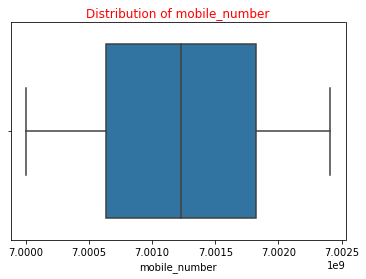

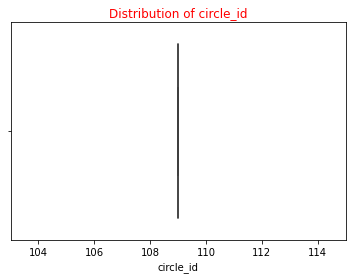

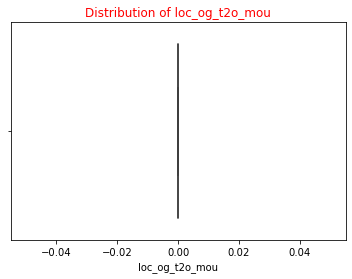

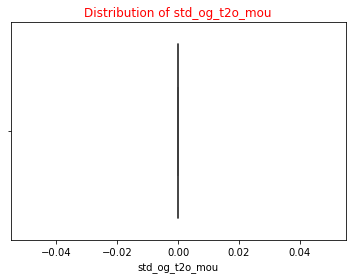

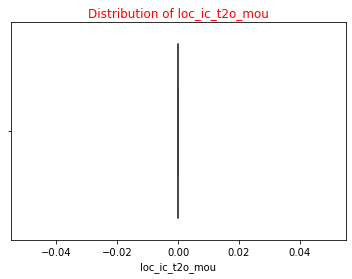

...

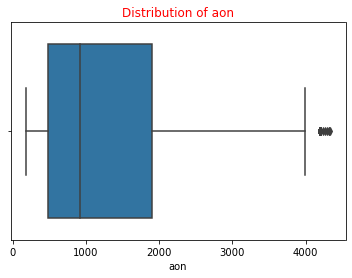

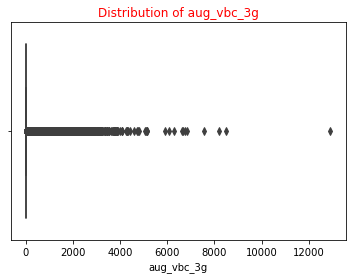

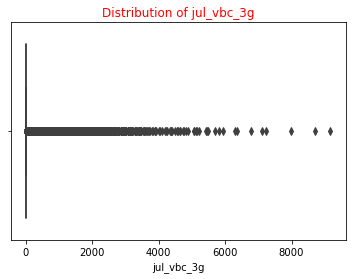

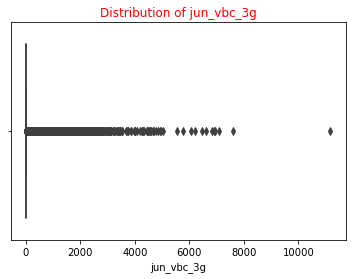

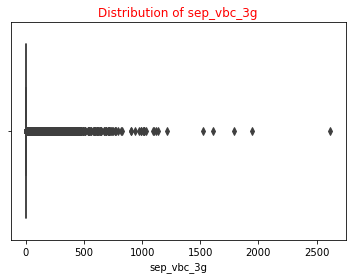

In [1213]:
# checking the outlier
for col in churn1.describe().columns:
    sns.boxplot(churn1[col])
    plt.title('Distribution of {}'.format(col), color='r')
    plt.show()

- As we can see there are many variables which contain outliers.
- We are going to treat only those variables which is useful for the model building.
- As we know that we have to find the `usage-based-churn` only so according to that only we are going to handle those variables outlier.
- And we are not treating the outlier of churn phase because these data are not available to us during final evaluation of our model on the unseen data.

In [1214]:
# handling the outlier
# for the average revenur per user variable we are not removing some of the upper outlier because high value customers can generate large amount of revenue for the company
# but as we see there are some lower point which is below the range so we are going to drop them
churn1 = churn1[~(churn1['arpu_6']<0)]
churn1 = churn1[~(churn1['arpu_7']<0)]
churn1 = churn1[~(churn1['arpu_8']<0)]

- Lets visualize some of the very high revenue generated customers

In [1215]:
# very high revenue
churn1[churn1['arpu_6']>10000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
33019,7002226643,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,10955.066,8609.460,13505.996,10787.982,0.00,0.00,0.00,0.00,177.53,58.44,107.03,32.43,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,159.73,53.86,47.08,32.43,0.00,0.31,0.0,0.00,0.00,0.00,0.00,0.00,159.73,54.18,47.08,32.43,0.00,0.0,0.00,0.00,11.71,0.00,59.95,0.00,6.08,4.26,0.0,0.0,0.0,0.0,0.0,17.79,4.26,59.95,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,177.53,58.44,107.03,32.43,0.03,0.35,0.00,0.00,82.54,20.81,26.53,44.61,4.59,0.00,0.83,0.05,87.18,21.16,27.36,44.66,0.00,0.00,0.0,0.00,0.00,0.00,12.81,8.83,1.93,0.0,0.0,0.0,0.0,0.0,0.0,1.93,0.00,12.81,8.83,89.11,21.16,40.18,53.49,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9,9,6,7,18500,19000,14000,21000,3000,3000,3000,3000,2014-06-27,2014-07-22,2014-08-28,2014-09-19,0,0,3000,3000,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2567,0.00,0.00,0.00,0.00
38610,7001150960,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,27731.088,35145.834,33543.624,38805.617,5.69,5.14,7.01,5.64,3231.81,3868.59,3625.43,4247.38,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,5.69,5.14,7.01,5.64,2.51,0.40,8.29,1.75,0.00,0.00,0.0,0.41,0.00,0.00,0.00,0.00,8.21,5.54,15.31,7.81,0.00,0.0,0.00,0.00,0.00,0.18,0.00,0.68,0.00,

In [1216]:
# very high revenue
churn1[churn1['arpu_7']>10000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
38610,7001150960,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,27731.088,35145.834,33543.624,38805.617,5.69,5.14,7.01,5.64,3231.81,3868.59,3625.43,4247.38,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,5.69,5.14,7.01,5.64,2.51,0.40,8.29,1.75,0.00,0.00,0.00,0.41,0.00,0.00,0.00,0.00000,8.21,5.54,15.31,7.81,0.0,0.0,0.0,0.0,0.00,0.18,0.00,0.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.18,0.00,0.68,3229.29,3868.01,3629.91,4244.530000,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,3237.51,3873.74,3645.23,4253.03,6.93,13.73,14.76,19.74,4.56,2.78,10.81,9.91,0.0,0.00,1.43,0.00,11.49,16.51,27.01,29.66,2.28,0.00,0.0,0.00,0.00,0.00,5.06,0.00,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,2.28,0.00,5.06,0.00,551.04,525.71,596.03,798.41,0.13,0.06,0.00,0.060000,536.99,504.01,556.74,767.63,0.13,5.11,7.19,1.050000,29,17,19,13,35190,40335,45320,37235,3100,3100,3100,3100,2014-06-25,2014-07-30,2014-08-31,2014-09-30,3100,3100,35,3100,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,460,0.00,0.00,0.00,0.00
51314,7000777972,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,15487.684,14624.089,16040.503,8160.738,0.18,0.00,0.00,0.00,5905.14,5490.28,5836.76,2974.49,0.0,0.0,1.0,0.0,0.0,0.0,139.98,25.86,0.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.60,0.00,0.00,0.00,1.83,0.00,7.85,0.00000,0.78,0.00

In [1217]:
# very high revenue
churn1[churn1['arpu_8']>10000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
33019,7002226643,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,10955.066,8609.460,13505.996,10787.982,0.00,0.00,0.00,0.00,177.53,58.44,107.03,32.43,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,159.73,53.86,47.08,32.43,0.00,0.31,0.0,0.00,0.00,0.00,0.00,0.0,159.73,54.18,47.08,32.43,0.00,0.00,0.0,0.0,11.71,0.00,59.95,0.00,6.08,4.26,0.00,0.00,0.0,0.0,0.0,17.79,4.26,59.95,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,177.53,58.44,107.03,32.43,0.03,0.35,0.00,0.00,82.54,20.81,26.53,44.61,4.59,0.00,0.83,0.05,87.18,21.16,27.36,44.66,0.00,0.00,0.0,0.00,0.00,0.00,12.81,8.83,1.93,0.00,0.00,0.00,0.0,0.0,0.0,1.93,0.00,12.81,8.83,89.11,21.16,40.18,53.49,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9,9,6,7,18500,19000,14000,21000,3000,3000,3000,3000,2014-06-27,2014-07-22,2014-08-28,2014-09-19,0,0,3000,3000,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2567,0.00,0.00,0.00,0.00
38610,7001150960,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,27731.088,35145.834,33543.624,38805.617,5.69,5.14,7.01,5.64,3231.81,3868.59,3625.43,4247.38,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,5.69,5.14,7.01,5.64,2.51,0.40,8.29,1.75,0.00,0.00,0.0,0.41,0.00,0.00,0.00,0.0,8.21,5.54,15.31,7.81,0.00,0.00,0.0,0.0,0.00,0.18,0.00,0.

- As we can see there are very less number of customers generating very high revenue
- So we are going to drop them

In [1218]:
# droping very high revenue generating customers
churn1 = churn1[~(churn1['arpu_6']>10000)]
churn1 = churn1[~(churn1['arpu_7']>10000)]
churn1 = churn1[~(churn1['arpu_8']>10000)]

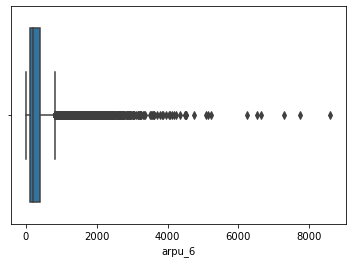

In [1219]:
# check the result
sns.boxplot(churn1['arpu_6']);

In [1220]:
# as we know high value customers can talk large number of minutes so after carefully analyse the data then we decide to remove them or not
# There are some of the customers who taking more then 6000 minutes of talking if these customers quantity is less then 10 then we are droping them
# check the customer
churn1[churn1['onnet_mou_6']>6000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2505,7001406214,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,3157.411,796.111,1664.808,1865.099,6459.34,2325.94,10752.56,10427.46,4213.94,289.19,294.18,712.64,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,6431.33,2248.41,10752.56,10389.24,4212.04,271.53,286.71,710.01,0.00,1.51,0.63,0.00,1.90,0.00,0.66,2.63,10643.38,2521.46,11039.91,11099.26,28.01,77.53,0.00,38.21,0.00,1.36,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,28.01,78.89,0.00,38.21,0.0,0.00,0.0,0.00,1.90,14.78,6.83,2.63,0.73,0.0,0.0,0.00,10674.03,2615.14,11046.74,11140.11,241.03,114.93,146.39,22.18,1375.81,1264.78,658.33,227.43,0.00,0.00,0.00,0.00,1616.84,1379.71,804.73,249.61,14.18,2.26,2.49,6.58,5.46,56.46,0.00,31.48,0.0,0.00,0.00,0.00,0.0,0.0,0.0,19.64,58.73,2.49,38.06,1637.23,1460.39,809.06,304.51,0.69,0.0,0.0,0.05,0.03,21.95,0.0,10.64,0.00,0.00,1.83,6.13,41,14,22,23,3803,808,2018,2141,250,110,144,130,2014-06-30,2014-07-29,2014-08-30,2014-09-29,110,30,130,130,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1216,0.00,0.00,0.0,0.0
22601,7002226622,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2584.969,3180.521,2953.879,994.922,6479.18,5919.48,6996.43,1809.31,82.86,96.36,113.08,24.71,0.0,0.00,0.00,5.86,0.0,0.00,0.00,43.46,268.91,288.23,336.21,76.91,78.68,93.28,81.49,24.71,0

In [1221]:
churn1[churn1['onnet_mou_7']>6000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1679,7002046288,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,522.311,1324.144,1000.158,26.127,1583.34,6372.53,4730.23,95.56,73.36,49.84,71.54,0.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1574.94,6371.98,4730.23,95.56,67.43,44.49,36.34,0.65,1.45,3.31,8.34,0.03,5.91,2.33,18.30,0.00,1643.83,6419.79,4774.93,96.24,6.95,0.00,0.00,0.00,0.00,0.00,2.06,0.00,0.0,0.25,0.00,0.00,0.0,0.0,0.0,6.95,0.25,2.06,0.00,0.0,0.00,0.0,0.00,11.08,13.68,32.48,1.19,0.93,0.0,0.00,0.00,1662.79,6433.73,4809.48,97.44,69.53,38.29,47.78,32.14,67.49,21.56,25.01,13.71,0.68,2.81,9.11,16.15,137.71,62.68,81.91,62.01,6.09,0.00,18.21,0.00,6.85,7.85,4.74,16.51,0.00,0.00,0.00,0.00,0.0,0.0,0.0,12.94,7.85,22.96,16.51,150.74,70.53,104.88,78.53,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.08,0.00,0.00,0.00,20,51,40,2,626,1493,1137,30,102,102,44,30,2014-06-30,2014-07-31,2014-08-27,2014-09-20,50,30,30,0,116.96,120.63,0.00,0.00,0.00,0.01,0.0,0.00,0,0,0,0,2,3,0,0,0,0,0,0,0,0,0,0,669,0.00,0.08,0.0,0.0
15119,7001212011,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,280.381,300.721,372.244,271.504,5878.53,6140.74,4335.11,3530.11,12.29,24.89,58.83,37.28,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5878.53,6140.74,4335.11,3530.11,12.29,23.33,52.43,35.51,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5890.83,6164.08,

In [1222]:
churn1[churn1['onnet_mou_8']>6000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2505,7001406214,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,3157.411,796.111,1664.808,1865.099,6459.34,2325.94,10752.56,10427.46,4213.94,289.19,294.18,712.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6431.33,2248.41,10752.56,10389.24,4212.04,271.53,286.71,710.01,0.00,1.51,0.63,0.00,1.90,0.00,0.66,2.63,10643.38,2521.46,11039.91,11099.26,28.01,77.53,0.00,38.21,0.00,1.36,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.01,78.89,0.00,38.21,0.0,0.00,0.0,0.00,1.90,14.78,6.83,2.63,0.73,0.0,0.00,0.00,10674.03,2615.14,11046.74,11140.11,241.03,114.93,146.39,22.18,1375.81,1264.78,658.33,227.43,0.00,0.00,0.00,0.00,1616.84,1379.71,804.73,249.61,14.18,2.26,2.49,6.58,5.46,56.46,0.00,31.48,0.00,0.0,0.00,0.00,0.0,0.0,0.0,19.64,58.73,2.49,38.06,1637.23,1460.39,809.06,304.51,0.69,0.00,0.00,0.05,0.03,21.95,0.0,10.64,0.00,0.00,1.83,6.13,41,14,22,23,3803,808,2018,2141,250,110,144,130,2014-06-30,2014-07-29,2014-08-30,2014-09-29,110,30,130,130,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1216,0.00,0.0,0.0,0.0
22394,7000019536,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2501.194,3043.403,3194.013,2698.897,4431.91,5864.74,6649.89,5638.23,2235.69,2362.46,2078.43,1743.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,48.86,22.19,21.29,7.96,166.78,79.18,112.49,

In [1223]:
# as they are very less so we are droping them
churn1 = churn1[~(churn1['onnet_mou_8']>6000)]
churn1 = churn1[~(churn1['onnet_mou_8']>6000)]
churn1 = churn1[~(churn1['onnet_mou_8']>6000)]

In [1224]:
# large minute usages to the other network
churn1[churn1['offnet_mou_6']>5800]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
33035,7001656523,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2854.958,4234.590,5035.192,3216.186,366.53,1692.81,291.94,4062.33,6962.46,9667.13,13547.84,4066.06,0.00,0.00,0.00,1.61,0.00,0.00,0.00,143.33,20.86,40.83,34.38,29.06,204.99,72.43,75.04,32.33,2.05,2.55,0.33,2.46,20.93,2.60,0.0,2.38,227.91,115.81,109.76,63.86,345.66,1651.98,257.56,3902.99,6430.08,9284.74,13411.21,3961.19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6775.74,10936.73,13668.78,7864.19,0.0,0.18,0.0,0.0,325.41,312.58,69.71,63.09,0.03,0.0,0.0,0.0,7329.11,11365.31,13848.26,7991.16,12.49,12.93,9.51,4.84,89.88,38.11,29.48,21.14,5.96,9.89,22.43,17.23,108.34,60.94,61.43,43.23,10.24,3.36,1.66,4.75,29.21,46.66,31.59,19.59,0.00,0.00,0.0,0.0,0.0,0.0,0.0,39.46,50.03,33.26,24.34,148.24,110.98,94.69,67.58,0.43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32,42,37,26,3360,4808,5909,3887,128,169,349,349,2014-06-30,2014-07-30,2014-08-30,2014-09-30,128,169,144,144,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,423,0.0,0.0,0.0,0.0
38116,7002284906,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2555.039,1854.366,1318.554,852.830,462.53,153.09,89.23,80.84,6584.69,4620.64,2538.99,1625.31,0.00,12.93,56.51,49.54,0.00,35.13,86.63,103.01,462.53,153.09,71.09,66.16,425.06,248.61,232.48,136.16,9.88,0.0

In [1225]:
# large minute usages to the other network
churn1[churn1['offnet_mou_7']>5800]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
6717,7001185933,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1832.850,3211.344,2631.845,836.250,3.86,11.51,150.79,16.06,3780.26,8316.36,6608.99,1999.14,1.51,0.00,0.00,0.00,29.45,0.00,0.00,0.00,3.03,11.16,18.51,3.18,19.36,13.46,27.79,31.43,0.00,0.00,0.00,0.00,0.00,2.95,0.00,3.53,22.39,24.63,46.31,34.61,0.83,0.35,132.28,12.88,3678.93,8271.78,6539.54,1948.21,0.0,0.0,0.0,0.13,0.0,0.0,0.0,3679.76,8272.13,6671.83,1961.23,0.0,0.00,0.0,0.0,52.51,31.11,41.64,19.36,0.00,0.0,0.0,0.0,3754.68,8327.88,6759.79,2015.21,20.34,6.24,19.56,3.58,16.11,16.86,15.84,13.86,0.90,0.00,0.71,0.46,37.36,23.11,36.13,17.91,0.00,3.98,0.80,0.91,36.09,83.86,69.99,86.86,0.00,0.0,0.0,0.14,0.0,0.0,0.0,36.09,87.84,70.79,87.93,73.46,112.91,106.93,105.84,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,1.95,0.00,0.0,91,62,77,27,2116,3786,3099,962,110,110,130,42,2014-06-30,2014-07-31,2014-08-31,2014-09-30,30,44,42,0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,472,0.25,0.0,0.0,0.0
23536,7000353457,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2236.325,2553.440,1841.016,2634.833,85.79,30.44,33.84,14.41,5694.48,6740.08,4642.64,6085.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.14,22.83,10.33,1.13,71.89,114.83,145.21,442.19,0.00,0.00,0.83,0.00,0.00,0.00,0.00,0.00,88.04,137.66

In [1226]:
# large minute usages to the other network
churn1[churn1['offnet_mou_8']>5800]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
6717,7001185933,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1832.850,3211.344,2631.845,836.250,3.86,11.51,150.79,16.06,3780.26,8316.36,6608.99,1999.14,1.51,0.00,0.00,0.00,29.45,0.00,0.00,0.00,3.03,11.16,18.51,3.18,19.36,13.46,27.79,31.43,0.00,0.00,0.00,0.00,0.00,2.95,0.00,3.53,22.39,24.63,46.31,34.61,0.83,0.35,132.28,12.88,3678.93,8271.78,6539.54,1948.21,0.0,0.0,0.00,0.13,0.0,0.0,0.0,3679.76,8272.13,6671.83,1961.23,0.0,0.00,0.0,0.0,52.51,31.11,41.64,19.36,0.00,0.0,0.0,0.0,3754.68,8327.88,6759.79,2015.21,20.34,6.24,19.56,3.58,16.11,16.86,15.84,13.86,0.90,0.00,0.71,0.46,37.36,23.11,36.13,17.91,0.00,3.98,0.80,0.91,36.09,83.86,69.99,86.86,0.00,0.00,0.0,0.14,0.0,0.0,0.0,36.09,87.84,70.79,87.93,73.46,112.91,106.93,105.84,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,1.95,0.00,0.00,91,62,77,27,2116,3786,3099,962,110,110,130,42,2014-06-30,2014-07-31,2014-08-31,2014-09-30,30,44,42,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,472,0.25,0.00,0.00,0.0
33035,7001656523,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2854.958,4234.590,5035.192,3216.186,366.53,1692.81,291.94,4062.33,6962.46,9667.13,13547.84,4066.06,0.00,0.00,0.00,1.61,0.00,0.00,0.00,143.33,20.86,40.83,34.38,29.06,204.99,72.43,75.04,32.33,2.05,2.55,0.33,2.46,20.93,2.60

In [1227]:
# as they are very less so we are droping them
churn1 = churn1[~(churn1['offnet_mou_6']>5800)]
churn1 = churn1[~(churn1['offnet_mou_7']>5800)]
churn1 = churn1[~(churn1['offnet_mou_8']>5800)]

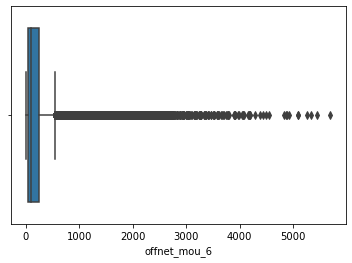

In [1228]:
# check the result
sns.boxplot(churn1['offnet_mou_6']);

In [1229]:
# large minute roaming incoming user
churn1[churn1['roam_ic_mou_6']>2000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
27526,7001925585,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,286.930,768.930,653.861,477.734,1.91,5.61,62.16,39.03,241.93,626.28,637.63,403.36,2307.91,3813.29,2898.34,1178.06,282.88,696.89,750.44,459.64,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.01,23.09,15.53,36.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,11,25,19,17,318,899,801,522,44,78,100,50,2014-06-30,2014-07-29,2014-08-31,2014-09-30,30,44,50,30,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,877,0.0,0.00,0.00,0.0
28436,7000294961,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,593.710,176.365,468.511,278.710,319.28,6.16,41.21,13.74,191.86,227.69,467.46,176.91,2613.31,2933.08,4169.81,36.41,397.34,233.86,468.29,16.90,80.19,0.00,3.54,13.74,29.04,0.00,32.54,139.38,0.00,0.00,0.00,1.43,0.00,0.00,0.58,0.00,109.24,0.00,36.09,154.56,3.10,0.00,0.00,0.00,1.44,0.00,1.00,17.51,0.0,0.0,0

In [1230]:
# large minute roaming incoming user
churn1[churn1['roam_ic_mou_7']>2000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
999,7000349909,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,52.630,689.172,259.206,405.166,0.00,44.16,21.39,2.53,70.48,822.61,383.56,413.13,69.31,2090.19,928.48,1067.06,48.28,866.78,404.96,415.66,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,22.20,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.20,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,22.20,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.00,2,10,6,3,0,1052,476,300,0,150,150,150,2014-06-17,2014-07-31,2014-08-31,2014-09-24,0,150,150,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,470,0.00,0.00,0.00,0.0
27526,7001925585,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,286.930,768.930,653.861,477.734,1.91,5.61,62.16,39.03,241.93,626.28,637.63,403.36,2307.91,3813.29,2898.34,1178.06,282.88,696.89,750.44,459.64,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.01,23.09,15.53,36.23,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.

In [1231]:
# large minute roaming incoming user
churn1[churn1['roam_ic_mou_8']>2000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1507,7000413270,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,89.791,91.997,106.652,98.958,17.73,69.49,69.43,45.56,2.79,3.89,14.99,8.29,297.49,1720.29,2098.99,2159.76,20.53,73.39,84.43,53.86,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.36,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,4,4,6,4,99,76,116,109,76,30,30,30,2014-06-20,2014-07-25,2014-08-20,2014-09-18,76,30,30,30,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,354,0.00,0.00,0.00,0.0
12388,7000301821,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,228.480,156.114,224.516,225.335,19.26,61.69,84.74,205.71,29.11,79.46,118.79,9.59,0.00,1566.88,2040.71,2216.89,0.00,131.33,204.16,215.31,19.26,5.28,0.00,0.00,29.11,4.55,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.05,4.70,0.00,48.38,9.83,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,

In [1232]:
# drop these customers
churn1 = churn1[~(churn1['roam_ic_mou_6']>2000)]
churn1 = churn1[~(churn1['roam_ic_mou_7']>2000)]
churn1 = churn1[~(churn1['roam_ic_mou_8']>2000)]

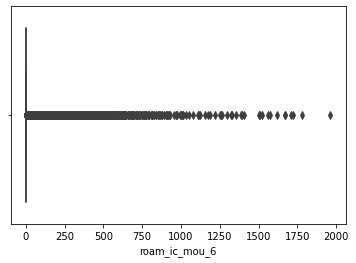

In [1233]:
# check the result
sns.boxplot(churn1['roam_ic_mou_6']);

In [1234]:
# large minute roaming incoming user
churn1[churn1['roam_og_mou_6']>2300]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
80034,7002162382,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2342.591,1680.238,2022.477,1598.513,2037.23,1006.18,3105.18,3975.99,863.03,678.36,687.79,1276.19,153.68,173.38,117.53,21.24,2337.16,1684.54,581.78,145.91,0.0,0.00,0.00,12.78,0.0,0.00,104.21,262.91,0.0,0.0,3.68,1.25,0.0,0.0,0.00,0.00000,0.0,0.00,107.89,276.94,523.5,0.00,2868.01,3859.71,39.6,0.00,234.99,969.61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,563.1,0.00,3103.01,4829.33,0.0,0.00,0.28,0.000000,0.0,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,563.1,0.00,3211.19,5106.28,10.98,0.00,0.66,6.39,0.35,0.00,26.11,38.71,0.0,0.00,9.28,0.00,11.33,0.00,36.06,45.11,2.08,0.00,6.33,11.46,0.0,0.00,20.91,26.34,0.0,0.0,0.0,8.880000,0.0,0.0,0.0,2.08,0.00,27.24,46.69,13.41,0.00,101.59,91.81,0.0,0.0,0.0,0.000000,0.0,0.00,38.28,0.00,0.0,0.0,0.0,0.000000,13,10,14,9,3300,2400,2917,2250,300,300,300,300,2014-06-28,2014-07-27,2014-08-29,2014-09-29,300,300,300,300,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2438,0.0,0.00,0.00,0.0
87578,7002338735,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,3606.703,2718.072,228.833,-0.500,2700.66,1222.14,32.88,29.53,454.53,526.29,107.24,86.63,1015.83,287.73,0.00,0.00,3161.79,1659.88,0.00,0.00,0.0,0.00,10.21,11.13,0.0,24.23,90.58,38.76,0.0,0.0,10.78,0.00,0.0,0.0,2.38,1.2

In [1235]:
# large minute roaming incoming user
churn1[churn1['roam_og_mou_7']>2300]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
74987,7000228995,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1288.7,2901.4,3911.5,3486.4,1395.78,2508.11,4490.78,3618.39,351.96,303.93,846.26,810.06,27.66,0.0,0.0,0.0,1747.74,2812.04,5337.04,4428.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13,5,5,2,4071,2933,4350,750,2933,2933,3100,500,2014-06-28,2014-07-19,2014-08-26,2014-09-21,2933,2933,3100,500,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,300,0.0,0.0,0.0,0.0


In [1236]:
# large minute roaming incoming user
churn1[churn1['roam_og_mou_8']>2300]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
18225,7000239096,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,393.124,1767.587,3321.178,2139.262,807.08,2220.64,4638.86,3125.96,118.38,1535.76,804.73,579.61,1.58,89.91,180.83,63.33,10.15,929.08,3493.36,1418.16,53.26,175.96,138.88,96.21,47.21,159.66,94.18,122.26,0.00,0.71,0.00,0.00,0.00,0.00,2.16,0.00,100.48,336.34,233.06,218.48,744.79,1705.83,1558.53,1865.93,70.03,785.14,158.26,201.99,0.00,0.00,0.00,0.0,0.0,0.0,0.0,814.83,2490.98,1716.79,2067.93,0.0,0.00,0.0,0.00,0.00,0.00,0.36,1.00,0.0,0.0,0.0,0.0,915.31,2827.33,1950.23,2287.41,8.63,68.03,86.59,76.61,37.01,54.86,47.19,45.41,0.00,0.06,0.00,2.98,45.64,122.96,133.79,125.01,2.25,4.34,3.04,2.43,3.66,3.64,2.64,28.31,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.91,7.99,5.69,30.74,51.56,130.96,139.49,155.76,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,5,21,32,21,440,2232,4496,2856,110,150,200,200,2014-06-29,2014-07-31,2014-08-31,2014-09-30,110,150,150,130,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,895,0.00,0.00,0.00,0.0
44826,7000616662,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1304.310,1309.738,5086.500,847.710,2052.68,1739.18,819.83,550.54,357.88,417.09,3033.01,614.41,0.00,26.74,1190.89,0.00,0.00,44.68,2860.51,0.00,213.43,48.68,69.43,109.18,39.54,54.01,159.18,133.13,54.53,

In [1237]:
# drop these customers
churn1 = churn1[~(churn1['roam_og_mou_6']>2300)]
churn1 = churn1[~(churn1['roam_og_mou_7']>2300)]
churn1 = churn1[~(churn1['roam_og_mou_8']>2300)]

In [1238]:
# large minute users
churn1[churn1['loc_og_t2t_mou_6']>4500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2643,7000047239,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1407.870,1420.250,1787.024,1239.455,5067.01,4312.68,3203.44,3321.64,350.28,595.28,440.29,327.18,0.0,310.04,0.00,195.98,0.0,212.59,0.00,244.04,5061.88,4215.91,3130.08,3065.51,309.74,414.79,207.59,151.58,23.19,24.36,37.33,38.68,0.18,0.00,0.30,0.00,5394.83,4655.08,3375.01,3255.78,4.86,6.78,72.58,21.08,17.14,32.71,158.78,128.26,0.26,1.40,0.00,0.00,0.0,0.0,0.0,22.28,40.89,231.36,149.34,0.0,0.0,1.01,2.41,3.51,7.04,41.26,2.46,2.96,0.0,0.0,0.0,5423.59,4703.03,3648.66,3410.01,885.64,355.74,263.06,211.58,159.53,345.91,260.16,119.36,32.38,17.88,29.93,48.79,1077.56,719.54,553.16,379.74,8.48,15.53,128.68,65.78,7.98,14.49,48.46,11.98,0.96,11.33,0.00,3.28,0.0,0.0,0.0,17.43,41.36,177.14,81.04,1095.28,760.91,731.24,461.06,0.28,0.0,0.0,0.26,0.00,0.00,0.00,0.0,0.00,0.00,0.93,0.00,37,41,28,21,1520,1640,2172,1412,110,200,229,130,2014-06-29,2014-07-31,2014-08-28,2014-09-29,110,30,130,130,554.45,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,199,0.00,0.00,0.00,0.0
15119,7001212011,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,280.381,300.721,372.244,271.504,5878.53,6140.74,4335.11,3530.11,12.29,24.89,58.83,37.28,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,5878.53,6140.74,4335.11,3530.11,12.29

In [1239]:
# large minute users
churn1[churn1['loc_og_t2t_mou_7']>4500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1679,7002046288,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,522.311,1324.144,1000.158,26.127,1583.34,6372.53,4730.23,95.56,73.36,49.84,71.54,0.68,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,1574.94,6371.98,4730.23,95.56,67.43,44.49,36.34,0.65,1.45,3.31,8.34,0.03,5.91,2.33,18.30,0.0,1643.83,6419.79,4774.93,96.24,6.95,0.00,0.00,0.00,0.00,0.00,2.06,0.00,0.00,0.25,0.00,0.00,0.0,0.0,0.0,6.95,0.25,2.06,0.00,0.0,0.0,0.0,0.0,11.08,13.68,32.48,1.19,0.93,0.0,0.0,0.0,1662.79,6433.73,4809.48,97.44,69.53,38.29,47.78,32.14,67.49,21.56,25.01,13.71,0.68,2.81,9.11,16.15,137.71,62.68,81.91,62.01,6.09,0.00,18.21,0.00,6.85,7.85,4.74,16.51,0.00,0.00,0.00,0.00,0.0,0.0,0.0,12.94,7.85,22.96,16.51,150.74,70.53,104.88,78.53,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.08,0.00,0.00,0.00,20,51,40,2,626,1493,1137,30,102,102,44,30,2014-06-30,2014-07-31,2014-08-27,2014-09-20,50,30,30,0,116.96,120.63,0.00,0.00,0.00,0.01,0.00,0.00,0,0,0,0,2,3,0,0,0,0,0,0,0,0,0,0,669,0.00,0.08,0.00,0.0
8596,7002231147,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,602.469,758.936,538.080,702.970,3569.34,4998.99,3648.38,3796.34,26.46,32.09,24.94,19.24,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,3569.34,4998.99,3648.38,3796.34,21.09,32.09,18.44,18.11,2.36,0.00,3.66,1.13,0.00,0.00,0.00,0.0,3592.81,5031.09,3670.49,3

In [1240]:
# large minute users
churn1[churn1['loc_og_t2t_mou_8']>4500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1679,7002046288,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,522.311,1324.144,1000.158,26.127,1583.34,6372.53,4730.23,95.56,73.36,49.84,71.54,0.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1574.94,6371.98,4730.23,95.56,67.43,44.49,36.34,0.65,1.45,3.31,8.34,0.03,5.91,2.33,18.3,0.0,1643.83,6419.79,4774.93,96.24,6.95,0.00,0.00,0.00,0.00,0.00,2.06,0.00,0.0,0.25,0.00,0.00,0.0,0.0,0.0,6.95,0.25,2.06,0.00,0.0,0.0,0.0,0.0,11.08,13.68,32.48,1.19,0.93,0.0,0.0,0.0,1662.79,6433.73,4809.48,97.44,69.53,38.29,47.78,32.14,67.49,21.56,25.01,13.71,0.68,2.81,9.11,16.15,137.71,62.68,81.91,62.01,6.09,0.00,18.21,0.00,6.85,7.85,4.74,16.51,0.00,0.0,0.0,0.0,0.0,0.0,0.0,12.94,7.85,22.96,16.51,150.74,70.53,104.88,78.53,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.08,0.0,0.0,0.00,20,51,40,2,626,1493,1137,30,102,102,44,30,2014-06-30,2014-07-31,2014-08-27,2014-09-20,50,30,30,0,116.96,120.63,0.00,0.00,0.0,0.01,0.0,0.0,0,0,0,0,2,3,0,0,0,0,0,0,0,0,0,0,669,0.0,0.08,0.0,0.0
43439,7000555348,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1096.978,1773.345,888.064,978.581,3289.33,7411.01,5134.03,6068.79,850.84,528.91,753.03,398.44,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3062.94,7163.21,4765.41,5845.94,466.16,318.99,557.38,187.04,2.41,0.86,3.80,8.80,0.00,0.00,0.0,0.0,3531.53,7483.08,5326.59,6041.79,226.38,247.

In [1241]:
# drop these customers
churn1 = churn1[~(churn1['loc_og_t2t_mou_6']>4500)]
churn1 = churn1[~(churn1['loc_og_t2t_mou_7']>4500)]
churn1 = churn1[~(churn1['loc_og_t2t_mou_8']>4500)]

In [1242]:
# large minute users
churn1[churn1['loc_og_t2m_mou_6']>3000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
26955,7000092897,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1594.599,1587.504,1200.981,138.360,75.96,126.09,13.36,3.93,3173.78,2744.63,1332.76,110.36,0.0,18.26,0.00,0.00,0.0,44.18,0.00,0.00,75.96,126.09,13.36,3.93,3101.78,2655.19,1320.09,101.28,18.93,12.44,11.69,0.60,0.00,0.00,0.00,0.0,3196.68,2793.74,1345.16,105.81,0.00,0.00,0.00,0.00,47.34,26.81,0.96,2.56,0.0,5.78,0.0,1.06,0.0,0.0,0.0,47.34,32.59,0.96,3.63,0.18,0.2,0.0,0.68,5.71,0.00,0.20,4.85,0.00,0.0,0.0,0.00,3249.93,2826.54,1346.33,114.98,31.18,23.53,10.16,2.46,791.13,567.06,628.39,139.86,9.14,17.96,3.80,5.91,831.46,608.56,642.36,148.24,0.00,0.00,0.00,0.00,41.44,46.78,11.94,9.41,0.00,0.0,0.0,2.00,0.0,0.0,0.0,41.44,46.78,11.94,11.41,1085.98,915.63,725.99,196.86,0.35,0.0,0.0,0.59,212.71,260.11,71.46,35.53,0.00,0.16,0.21,1.06,15,19,12,5,1783,1518,1254,216,252,150,252,130,2014-06-30,2014-07-25,2014-08-23,2014-09-27,110,120,252,130,316.98,140.33,95.14,131.76,1790.54,954.36,1106.41,2178.42,1,0,0,0,0,0,0,0,1,1,2,2,0,0,0,0,264,987.96,952.65,1022.52,0.0
53246,7000189460,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2403.107,1433.657,924.192,596.197,24.84,688.28,400.83,428.18,4065.01,564.68,281.68,35.41,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,24.84,688.28,400.83,428.18,4064.74,564.38,279.53,34.69,0

In [1243]:
# large minute users
churn1[churn1['loc_og_t2m_mou_7']>3000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
26419,7000844064,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,882.380,1993.400,1122.080,479.640,6.21,10.06,14.36,3.85,378.98,4525.24,2326.56,423.54,38.8,0.00,0.00,0.00,13.56,0.00,0.00,0.00,0.86,10.06,8.63,3.85,360.84,4456.74,2309.29,389.48,9.91,28.99,15.53,7.38,0.00,0.00,0.0,0.00000,371.63,4495.81,2333.46,400.71,0.00,0.00,5.73,0.00,0.00,31.59,1.73,25.99,0.0,7.89,0.0,0.68,0.0,0.0,0.0,0.00,39.49,7.46,26.68,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,0.000000,0.00,0.0,0.0,0.0,371.63,4535.31,2340.93,427.39,11.01,38.31,20.99,0.38,239.01,809.63,911.74,310.18,0.00,6.76,7.44,12.01,250.03,854.71,940.19,322.58,2.44,1.58,18.73,0.51,7.70,0.08,14.98,1.80,11.23,0.0,11.09,48.040000,0.0,0.0,0.0,21.38,1.66,44.81,50.36,271.41,856.38,985.01,1211.89,0.00,0.00,0.00,0.000000,0.00,0.0,0.0,838.88,0.00,0.00,0.00,0.060000,4,15,8,3,710,1690,1050,500,410,300,300,300,2014-06-29,2014-07-31,2014-08-24,2014-09-25,410,0,0,0,0.00,40.13,0.00,0.00,0.0,1647.08,0.0,0.0,0,0,0,0,0,1,0,0,0,2,0,0,0,1,0,0,803,522.56,758.34,0.0,8.67
28063,7002157149,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1653.049,2069.618,1596.942,1385.656,306.64,314.38,1916.89,1098.14,4059.04,5182.43,1803.69,1600.59,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.03,118.03,1779.28,705.01,2655.33,3509.96,390.98,273.54,0.00,0.00

In [1244]:
# large minute users
churn1[churn1['loc_og_t2m_mou_8']>3000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2688,7001195870,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,841.496,610.164,1563.563,1264.237,376.34,190.99,189.54,134.69,501.93,466.08,3588.83,2034.03,8.86,0.0,0.00,0.0,25.26,0.0,0.00,0.0,205.88,178.79,163.14,133.59,253.73,355.03,3463.08,1926.59,0.88,0.00,0.55,0.00,0.03,0.00,0.71,0.85000,460.49,533.83,3626.78,2060.19,165.88,12.19,26.39,1.10,217.46,111.04,115.84,105.71,0.0,0.0,0.0,0.00,0.0,0.0,0.0,383.34,123.24,142.24,106.81,0.0,0.0,0.0,0.000000,9.34,0.06,9.34,1.710000,0.00,0.0,0.0,0.0,853.19,657.14,3778.38,2168.73,188.86,223.16,139.98,156.03,256.36,325.93,270.71,240.68,0.0,0.00,0.00,0.00,445.23,549.09,410.69,396.71,10.94,13.64,17.88,0.83,17.16,26.76,4.39,22.46,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,28.11,40.41,22.28,23.29,473.34,589.51,432.98,420.01,0.0,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,14,12,17,15,930,674,2045,1292,110,110,200,144,2014-06-29,2014-07-29,2014-08-29,2014-09-30,110,70,200,0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2091,0.0,0.0,0.0,0.0
21257,7000165514,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,517.722,1137.148,1304.447,1360.557,144.48,153.71,68.24,122.29,868.61,2568.04,3397.48,3473.88,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,34.74,20.21,11.14,29.04,393.53,2539.41,3342.24,3348.26,0.00,0.0

In [1245]:
# drop these customers
churn1 = churn1[~(churn1['loc_og_t2m_mou_6']>3000)]
churn1 = churn1[~(churn1['loc_og_t2m_mou_7']>3000)]
churn1 = churn1[~(churn1['loc_og_t2m_mou_8']>3000)]

In [1246]:
# large minute users
churn1[churn1['loc_og_t2f_mou_6']>400]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2543,7002222912,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,900.236,602.552,451.562,467.618,43.88,73.09,158.78,65.16,862.14,524.48,251.29,316.86,0.00,0.00,0.00,45.76,0.00,0.00,0.00,46.13,30.64,73.09,158.78,48.13,354.88,307.68,206.06,210.63,499.64,209.79,42.31,62.11,0.00,0.00,0.00,0.00000,885.18,590.58,407.16,320.88,13.23,0.00,0.00,11.50,5.36,7.00,2.91,3.51,2.25,0.00,0.00,0.00,0.0,0.0,0.0,20.84,7.00,2.91,15.01,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.0,906.03,597.58,410.08,335.89,232.09,214.96,86.66,107.78,181.31,147.94,226.11,234.11,17.29,34.29,25.21,31.48,430.71,397.21,337.99,373.38,7.95,0.00,11.41,0.00,2.58,1.60,3.01,1.13,5.51,0.95,0.00,0.000000,0.0,0.0,0.0,16.04,2.55,14.43,1.13,446.76,399.76,352.43,374.51,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,5,4,2,2,1000,750,539,500,250,250,289,250,2014-06-26,2014-07-29,2014-08-28,2014-09-26,250,250,289,250,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1377,0.00,0.00,0.00,0.00
4895,7000267161,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1051.957,1069.324,1214.337,1420.823,317.16,465.99,317.34,425.56,966.74,862.84,1187.39,1004.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.16,465.99,317.34,425.56,467.93,435.79,646.18,796.98,486.0

In [1247]:
# large minute users
churn1[churn1['loc_og_t2f_mou_7']>400]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
4895,7000267161,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1051.957,1069.324,1214.337,1420.823,317.16,465.99,317.34,425.56,966.74,862.84,1187.39,1004.31,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,317.16,465.99,317.34,425.56,467.93,435.79,646.18,796.98,486.06,426.03,539.08,204.53,0.0,0.00,0.00,0.00000,1271.16,1327.83,1502.61,1427.08,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,2.13,0.00,0.0,0.0,0.0,0.00,0.00,2.13,0.00,0.00,0.00,0.00,0.000000,12.75,1.01,0.00,2.800000,0.00,0.00,0.00,0.0,1283.91,1328.84,1504.74,1429.88,141.93,239.73,133.46,282.41,431.31,365.79,306.81,348.21,20.26,13.89,3.03,17.89,593.51,619.43,443.31,648.53,0.00,0.00,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.85,0.000000,0.0,0.0,0.0,0.00,0.00,1.38,0.00,593.51,626.09,444.69,653.81,0.00,0.0,0.0,0.000000,0.00,6.66,0.00,5.28,0.00,0.00,0.00,0.000000,7,7,5,8,1254,1352,1148,1646,350,300,300,400,2014-06-27,2014-07-31,2014-08-27,2014-09-30,0,250,250,0,9.85,2.33,0.0,3.61,51.98,267.2,0.0,155.13,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1376,11.69,113.11,52.87,18.98
41478,7000244525,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,970.574,653.951,857.060,334.194,77.96,73.83,107.96,89.83,791.49,637.19,519.26,366.19,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,77.96,73.83,107.96,89.83,173.91,152.04,90.13,235.63,61

In [1248]:
# large minute users
churn1[churn1['loc_og_t2f_mou_8']>400]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
4895,7000267161,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1051.957,1069.324,1214.337,1420.823,317.16,465.99,317.34,425.56,966.74,862.84,1187.39,1004.31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,317.16,465.99,317.34,425.56,467.93,435.79,646.18,796.98,486.06,426.03,539.08,204.53,0.0,0.00,0.00,0.00,1271.16,1327.83,1502.61,1427.08,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,2.13,0.00,0.0,0.0,0.0,0.00,0.00,2.13,0.00,0.00,0.00,0.00,0.00,12.75,1.01,0.00,2.80,0.00,0.0,0.0,0.0,1283.91,1328.84,1504.74,1429.88,141.93,239.73,133.46,282.41,431.31,365.79,306.81,348.21,20.26,13.89,3.03,17.89,593.51,619.43,443.31,648.53,0.0,0.00,0.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.85,0.00,0.0,0.0,0.0,0.00,0.00,1.38,0.00,593.51,626.09,444.69,653.81,0.00,0.0,0.0,0.0,0.00,6.66,0.00,5.28,0.00,0.00,0.00,0.00,7,7,5,8,1254,1352,1148,1646,350,300,300,400,2014-06-27,2014-07-31,2014-08-27,2014-09-30,0,250,250,0,9.85,2.33,0.0,3.61,51.98,267.2,0.0,155.13,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1376,11.69,113.11,52.87,18.98
41478,7000244525,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,970.574,653.951,857.060,334.194,77.96,73.83,107.96,89.83,791.49,637.19,519.26,366.19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,77.96,73.83,107.96,89.83,173.91,152.04,90.13,235.63,617.58,481.84,428.01,130.56,0.0,0.00,0.00,

In [1249]:
# drop these customers
churn1 = churn1[~(churn1['loc_og_t2f_mou_6']>400)]
churn1 = churn1[~(churn1['loc_og_t2f_mou_7']>400)]
churn1 = churn1[~(churn1['loc_og_t2f_mou_8']>400)]

In [1250]:
# large minute users
churn1[churn1['loc_og_t2c_mou_6']>250]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
33826,7002378689,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,184.510,179.857,188.773,512.307,35.19,27.56,7.94,80.68,540.43,91.86,93.13,124.71,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,35.19,27.56,7.94,80.68,29.43,42.74,10.59,94.73,0.00,0.00,0.00,0.00,328.29,2.29,0.00,5.51,64.63,70.31,18.54,175.41,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,511.53,52.19,85.29,32.01,1.59,0.0,0.00,0.0,577.76,122.51,103.84,207.43,486.18,495.81,42.99,230.03,151.49,191.24,134.58,224.69,0.00,3.51,7.00,0.00,637.68,690.58,184.58,454.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,4.36,0.0,0.0,0.0,0.0,0.00,0.00,4.36,0.00,637.83,690.58,188.94,454.83,0.15,0.0,0.0,0.10,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,16,11,17,21,204,205,217,603,37,110,25,130,2014-06-30,2014-07-30,2014-08-31,2014-09-28,10,10,9,0,0.0,0.0,91.97,152.13,0.0,0.0,0.0,0.0,0,0,0,0,0,0,3,7,0,0,0,0,0,0,0,0,2352,0.0,0.0,0.0,0.0
36998,7000123844,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,830.744,621.947,372.750,296.066,917.39,899.69,700.66,360.91,1523.39,1236.66,135.09,84.74,0.0,0.00,0.0,1.09,0.0,0.00,0.0,5.74,36.46,56.78,36.28,29.88,60.89,98.24,38.78,35.98,2.41,0.80,0.00,0.71,271.44,569.71,36.19,7.53,99.78,155.83,75.06,66.58,880.93,842.91,664.38,325.91,

In [1251]:
# large minute users
churn1[churn1['loc_og_t2c_mou_7']>250]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1176,7000833469,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,177.956,656.207,1246.656,822.697,0.21,11.16,13.98,11.11,248.18,1527.36,3286.13,2213.86,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.21,7.81,7.66,0.00,0.00,8.94,18.63,16.58,0.00,0.00,0.00,0.00,20.26,361.34,40.29,7.13000,0.21,16.76,26.29,16.58,0.00,3.35,6.31,11.11,238.61,1509.03,3258.44,2192.28,0.00,0.00,0.00,0.00,0.0,0.0,0.0,238.61,1512.38,3264.76,2203.39,0.00,0.0,0.0,0.000000,29.83,370.14,49.34,12.180000,0.00,0.0,0.0,0.0,268.66,1899.29,3340.41,2232.16,0.00,4.81,7.01,1.75,1.48,28.16,46.31,50.51,0.00,0.00,0.00,0.00,1.48,32.98,53.33,52.26,0.23,0.00,2.00,0.00,1.55,37.14,18.98,33.06,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,1.78,37.14,20.98,33.06,3.46,70.83,74.31,87.56,0.20,0.60,0.0,2.230000,0.00,0.00,0.00,0.00,0.00,0.10,0.00,0.000000,11,16,14,10,202,871,1408,976,36,130,144,130,2014-06-29,2014-07-31,2014-08-29,2014-09-23,20,130,130,130,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1088,0.0,0.0,0.00,0.0
4345,7000673335,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,678.636,1021.141,779.155,203.776,424.03,444.56,1025.29,397.78,555.99,1201.81,902.56,166.81,0.0,0.0,0.00,5.36,0.0,0.0,0.00,18.04,14.69,14.68,35.13,4.06,162.61,109.14,81.66,22.99,0.00,1.20,0.00,0.00,0.00,334.43,351.83,

In [1252]:
# large minute users
churn1[churn1['loc_og_t2c_mou_8']>250]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
4345,7000673335,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,678.636,1021.141,779.155,203.776,424.03,444.56,1025.29,397.78,555.99,1201.81,902.56,166.81,0.00,0.00,0.0,5.36,0.00,0.00,0.00,18.04,14.69,14.68,35.13,4.06,162.61,109.14,81.66,22.99,0.0,1.20,0.00,0.00,0.00,334.43,351.83,103.74,177.31,125.03,116.79,27.06,409.33,429.88,990.16,377.71,277.43,619.66,468.48,31.74,0.00,0.56,0.00,0.0,0.0,0.0,0.0,686.76,1050.11,1458.64,409.46,0.0,0.0,0.0,0.00,120.14,481.09,358.09,112.58,0.81,0.0,0.00,0.0,985.04,1656.24,1933.54,549.11,25.88,16.53,57.09,2.65,113.54,167.28,148.18,36.33,2.13,0.90,0.00,0.00,141.56,184.71,205.28,38.98,5.76,9.28,23.08,3.41,7.61,3.84,3.13,4.13,0.0,25.98,2.88,0.00,0.0,0.0,0.0,13.38,39.11,29.09,7.54,156.53,223.83,234.38,46.83,0.00,0.00,0.0,0.00,1.58,0.00,0.00,0.00,0.00,0.00,0.00,0.29,16,37,32,8,684,1174,920,212,110,110,50,44,2014-06-30,2014-07-31,2014-08-30,2014-09-29,50,50,42,0,6.99,0.04,0.0,0.0,200.66,668.1,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,1,5,0,0,489,0.0,0.00,37.18,0.0
13845,7000531579,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,112.302,173.988,148.056,25.657,3.54,54.63,43.43,2.03,147.11,321.43,386.68,97.09,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,3.54,54.59,43.43,2.03,67.89,68.36,86.59,27.08,0.0,0.05,0.00,0.00,68.54,165.96,278.28,55.0

In [1253]:
# drop these customers
churn1 = churn1[~(churn1['loc_og_t2c_mou_6']>250)]
churn1 = churn1[~(churn1['loc_og_t2c_mou_7']>250)]
churn1 = churn1[~(churn1['loc_og_t2c_mou_8']>250)]

In [1254]:
# large minute users
churn1[churn1['loc_og_mou_6']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
983,7000808568,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,372.681,307.594,305.311,318.610,4038.18,2382.88,1700.66,2823.98,72.31,35.89,28.86,13.56,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4038.18,2382.88,1700.66,2823.98,55.68,35.21,28.86,13.48,0.00,0.68,0.00,0.00,8.38,0.00,0.00,0.00,4093.86,2418.78,1729.53,2837.46,0.00,0.00,0.00,0.00,3.81,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,3.81,0.00,0.00,0.00,0.0,0.0,0.00,0.0,12.81,0.39,0.70,0.08,0.00,0.0,0.0,0.0,4110.49,2419.18,1730.23,2837.54,136.34,123.18,332.59,22.13,204.89,77.59,152.53,159.04,0.00,10.34,23.53,3.01,341.24,211.13,508.66,184.19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.73,2.81,3.58,11.31,0.0,0.0,0.0,0.73,2.81,3.58,11.31,341.98,213.94,512.24,195.51,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,7,7,3,7,465,365,331,375,297,297,297,297,2014-06-26,2014-07-24,2014-08-24,2014-09-30,30,0,24,24,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,836,0.00,0.00,0.00,0.00
3640,7000675877,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2091.663,1202.446,1350.458,806.875,3408.78,1897.19,2046.43,1042.49,834.11,481.81,518.83,236.63,3.85,3.76,0.0,30.74,160.63,291.11,0.0,37.06,3313.08,1609.94,2046.06,1014.31,750.53,453.36,505.63,219.49,3.93,9.81,11.99,5.41,4.36,2.80,0.00,0.

In [1255]:
# large minute users
churn1[churn1['loc_og_mou_7']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
39632,7000950637,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,269.000,270.240,397.347,340.620,3893.88,4138.08,3597.78,2705.73,288.03,436.88,542.33,384.73,0.0,0.0,0.0,7.81,0.0,0.0,0.0,36.16,3893.88,4138.08,3592.26,2676.21,234.58,300.33,303.58,160.18,53.44,20.04,28.14,14.48,0.00,0.00,0.0,0.00,4181.91,4458.46,3923.99,2850.88,0.00,0.00,5.51,0.23,0.00,116.49,209.16,203.18,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,116.49,214.68,203.41,0.0,0.0,1.43,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,4181.91,4574.96,4140.11,3054.29,81.53,84.89,77.74,63.56,213.23,225.38,220.31,135.11,3.66,6.28,7.38,26.63,298.43,316.56,305.44,225.31,0.23,6.96,0.00,0.00,0.69,0.08,0.00,0.68,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.93,7.04,0.00,0.68,305.06,325.61,305.44,226.19,0.0,0.2,0.0,0.0,4.96,0.0,0.00,0.00,0.73,1.79,0.0,0.20,5,5,4,3,0,600,200,300,0,300,200,300,2014-06-18,2014-07-30,2014-08-26,2014-09-20,0,300,200,300,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2925,0.00,0.00,0.00,0.00
39849,7001399048,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,700.765,1515.111,1064.372,982.604,3852.63,3963.43,2945.69,3316.76,245.41,160.39,126.01,206.78,0.0,0.0,0.0,2.73,0.0,0.0,0.0,0.75,3777.93,3900.08,2906.91,3223.78,100.43,136.64,115.63,190.61,4.08,1.80,3.59,1.40,0.81,1.03,0.0

In [1256]:
# large minute users
churn1[churn1['loc_og_mou_8']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
12436,7002220114,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,485.103,609.130,1958.606,1499.442,57.81,316.06,1890.79,1170.04,572.73,584.81,2185.41,1710.18,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,57.81,314.18,1890.79,1170.04,566.19,572.11,2161.68,1677.54,1.90,1.61,19.54,27.39,0.86,5.68,0.0,0.00,625.91,887.91,4072.03,2874.99,0.00,1.88,0.00,0.00,3.76,0.26,4.18,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,3.76,2.14,4.18,0.00,0.0,0.0,0.0,0.0,0.86,10.81,0.00,5.23,0.00,0.0,0.0,0.0,630.54,900.88,4076.21,2880.23,78.29,73.34,226.96,110.89,336.26,290.88,268.41,413.04,134.38,144.71,157.88,182.59,548.94,508.94,653.26,706.54,0.00,0.00,0.00,0.00,5.26,3.68,2.58,4.66,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.26,3.68,2.58,4.66,554.21,512.63,655.84,711.21,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8,12,26,19,530,810,2337,1703,110,128,144,150,2014-06-30,2014-07-31,2014-08-31,2014-09-29,0,128,130,150,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1860,0.00,0.00,0.0,0.0
26694,7001902825,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,510.410,781.090,809.405,407.735,2776.73,3410.54,3460.31,1143.96,303.06,462.63,766.39,292.54,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,2776.73,3410.54,3460.31,1143.96,280.09,454.66,756.91,290.01,1.04,5.99,2.74,0.00,0.63,0.00,0.

In [1257]:
# drop these customers
churn1 = churn1[~(churn1['loc_og_mou_6']>4000)]
churn1 = churn1[~(churn1['loc_og_mou_7']>4000)]
churn1 = churn1[~(churn1['loc_og_mou_8']>4000)]

In [1258]:
# large minute users
churn1[churn1['std_og_t2t_mou_6']>5300]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
26100,7000581714,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2971.288,2878.055,2164.079,50.250,6504.34,8157.78,5193.66,54.03,52.46,77.93,49.13,20.51,0.0,0.00,0.98,5.18,0.0,0.00,76.64,75.96,21.89,24.11,15.56,0.0,42.91,14.76,21.19,0.00,0.0,0.0,0.0,0.0,0.0,35.99,11.38,11.93,64.81,38.88,36.76,0.00,6482.44,8133.66,5116.78,0.00,9.21,21.86,12.59,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6491.66,8155.53,5129.38,0.00,0.0,0.00,0.0,0.0,39.46,91.23,40.06,0.00,1.99,0.0,0.0,0.00,6597.94,8285.64,5206.21,0.00,2.91,14.99,8.29,0.0,40.89,8.38,37.59,0.00,0.0,0.0,0.0,0.0,43.81,23.38,45.89,0.00,51.79,51.64,22.44,0.00,0.00,11.48,9.51,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,51.79,63.13,31.96,0.00,95.61,86.99,77.86,0.00,0.0,0.0,0.0,0.0,0.0,0.48,0.0,0.0,0.00,0.0,0.0,0.0,47,53,39,2,3497,3424,2456,0,250,200,200,0,2014-06-30,2014-07-31,2014-08-24,2014-09-30,110,130,200,0,1.99,2.98,1.23,0.0,7860.52,5570.27,5922.3,0.0,0,1,0,0,1,1,0,0,0,0,0,0,9,10,8,0,530,826.47,143.12,0.0,0.0
63432,7000682354,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2929.930,2206.176,1442.837,1122.105,6944.36,5128.98,2508.99,1352.23,442.71,293.46,484.28,1052.06,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.70,0.00,2.88,0.0,429.44,289.16,366.39,206.59,0.0,0.0,0.0,0.0,0.0,1.01,84.04,1.01,430.14,289.16,369.28,206.59,6943.66

In [1259]:
# large minute users
churn1[churn1['std_og_t2t_mou_7']>5300]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
5598,7001888424,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1712.283,2279.542,1989.933,2340.972,3829.08,5329.36,4254.06,4475.54,556.83,392.04,369.21,232.13,0.00,0.0,0.00,16.93,0.00,0.0,0.00,801.19,9.61,8.98,2.41,4.55,49.01,23.23,44.51,23.01,0.00,0.00,0.00,0.00,5.46,0.28,0.00,0.00,58.63,32.21,46.93,27.56,3819.46,5320.38,4251.64,3740.76,494.83,329.76,309.84,137.51,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4314.29,5650.14,4561.49,3878.28,0.0,0.33,0.0,0.0,17.74,40.96,15.86,0.63,0.00,0.0,0.0,0.76,4390.68,5723.66,4624.29,3907.24,3.04,2.49,2.69,0.71,16.03,16.86,36.08,19.56,0.18,0.00,0.00,0.00,19.26,19.36,38.78,20.28,75.08,32.66,8.06,41.61,10.04,0.94,26.83,0.11,0.00,0.00,0.00,0.00,0.0,0.0,0.0,85.13,33.61,34.89,41.73,104.39,56.59,73.68,62.54,0.0,0.0,0.0,0.53,0.00,3.61,0.00,0.00,0.0,0.00,0.00,0.00,9,8,6,10,2620,2459,2600,2496,750,750,750,750,2014-06-25,2014-07-25,2014-08-27,2014-09-29,550,110,350,250,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,771,0.00,0.00,0.0,0.0
26100,7000581714,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2971.288,2878.055,2164.079,50.250,6504.34,8157.78,5193.66,54.03,52.46,77.93,49.13,20.51,0.00,0.0,0.98,5.18,0.00,0.0,76.64,75.96,21.89,24.11,15.56,0.00,42.91,14.76,21.19,0.00,0.00,0.00,0.00,0.00,0.00,35.99,11.38,11.93,

In [1260]:
# large minute users
churn1[churn1['std_og_t2t_mou_8']>5300]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
31169,7000464988,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,892.639,1238.316,846.167,682.789,1567.81,5531.74,5930.21,3256.98,159.03,191.51,187.08,192.23,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,50.69,39.14,55.89,65.44,19.73,66.39,63.96,48.61,0.0,0.0,0.00,0.00,8.05,0.0,4.53,0.26,70.43,105.54,119.86,114.06,1517.11,5492.59,5874.31,3191.53,99.76,79.16,82.54,136.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1616.88,5571.76,5956.86,3328.36,0.0,0.0,0.0,0.0,41.05,89.13,106.44,45.94,0.6,0.0,0.0,0.0,1728.96,5766.44,6183.18,3488.38,34.76,31.74,18.21,38.59,33.59,69.03,38.76,50.33,0.0,0.0,0.00,0.0,68.36,100.78,56.98,88.93,16.38,21.38,61.31,25.59,27.23,34.44,23.74,17.73,2.69,2.81,3.96,0.48,0.0,0.0,0.0,46.31,58.64,89.03,43.81,119.44,159.43,146.01,188.01,0.0,0.0,0.0,0.00,4.76,0.0,0.0,55.26,0.0,0.00,0.00,0.00,18,27,41,38,1255,1297,1040,742,128,169,169,144,2014-06-30,2014-07-31,2014-08-31,2014-09-30,128,0,144,0,0.0,0.0,0.0,0.0,308.34,0.0,0.0,0.0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,0,642,0.0,0.0,0.0,0.0
72280,7000744485,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1263.698,3277.909,2607.658,2339.599,1611.71,7399.71,5776.84,4993.09,537.26,505.64,218.51,314.41,276.99,0.0,0.0,0.0,864.73,0.0,0.0,0.0,8.49,66.36,93.38,43.56,23.91,104.51,55.23,110.08,0.0,1.9,2.33,5.14,0.00,0.0,0.00,0.00,32.41,

In [1261]:
# drop these customers
churn1 = churn1[~(churn1['std_og_t2t_mou_6']>5300)]
churn1 = churn1[~(churn1['std_og_t2t_mou_7']>5300)]
churn1 = churn1[~(churn1['std_og_t2t_mou_8']>5300)]

In [1262]:
# large minute users
churn1[churn1['std_og_t2m_mou_6']>4600]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
3922,7000991656,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2113.830,1906.282,294.901,1104.408,263.51,143.63,55.11,125.84,5442.49,4541.89,228.26,2363.24,0.0,63.81,320.89,231.43,0.0,126.54,283.38,218.29,86.39,56.26,0.00,26.59,335.71,485.31,0.00,85.74,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,422.11,541.58,0.00,112.34,177.11,71.78,0.00,34.89,5088.78,3938.43,0.00,2115.36,0.00,0.0,0.0,0.0,0.0,0.0,0.0,5265.89,4010.21,0.00,2150.26,0.00,0.0,0.0,0.0,18.44,13.51,0.00,8.18,0.0,0.0,0.0,0.0,5706.46,4565.31,0.00,2270.79,548.21,388.56,0.00,155.11,81.03,60.44,0.00,29.71,0.00,0.00,0.00,0.43,629.24,449.01,0.00,185.26,5.64,7.23,0.00,0.03,15.26,34.61,0.00,20.81,0.23,0.00,0.00,0.00,0.0,0.0,0.0,21.14,41.84,0.00,20.84,662.86,492.43,0.00,206.11,0.0,0.0,0.00,0.00,12.46,1.56,0.0,0.0,0.00,0.00,0.00,0.0,26,23,9,13,2554,2208,386,1276,169,110,130,130,2014-06-29,2014-07-28,2014-08-31,2014-09-30,169,110,50,130,0.00,98.37,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2416,0.0,0.0,0.0,0.0
8495,7000120890,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2084.746,1854.763,445.477,559.371,96.53,180.41,90.48,115.28,4930.58,3835.23,456.83,480.34,0.0,65.89,178.31,0.00,0.0,521.16,212.46,0.00,78.81,102.68,45.03,107.56,250.51,150.54,137.89,337.68,15.61,24.86,9.31,33.73,0.0,0.0,0.0,

In [1263]:
# large minute users
churn1[churn1['std_og_t2m_mou_7']>4600]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
6402,7000851710,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1510.919,2139.022,987.521,189.116,135.29,102.66,90.79,0.00,3248.23,4952.29,1872.89,9.25,0.00,0.00,1.63,0.00,0.00,0.00,33.53,0.00,57.73,23.84,14.61,0.00,347.39,293.33,83.51,0.00,43.69,18.13,5.18,0.00,12.46,0.00,0.00,0.00,448.83,335.31,103.31,0.00,77.56,78.81,76.18,0.00,2825.49,4624.46,1735.44,9.25,12.78,0.00,0.0,0.0,0.0,0.0,0.0,2915.84,4703.28,1811.63,9.25,0.0,0.00,0.0,0.0,19.51,23.49,17.56,0.00,0.86,0.0,0.0,0.0,3385.06,5062.09,1932.51,9.25,61.03,47.44,14.71,0.00,263.13,186.59,69.78,0.00,32.86,16.91,9.49,0.00,357.03,250.96,93.99,0.00,17.53,16.56,23.80,0.00,12.93,70.33,30.98,0.00,0.0,13.95,2.31,0.00,0.0,0.0,0.0,30.46,100.84,57.09,0.00,387.81,443.43,151.09,0.00,0.00,0.0,0.00,0.00,0.31,62.03,0.00,0.00,0.00,29.58,0.0,0.00,19,29,8,7,1817,2551,1037,305,110,198,250,175,2014-06-30,2014-07-31,2014-08-26,2014-09-30,110,150,0,175,0.00,700.21,0.00,4.85,0.00,0.00,0.0,0.0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,642,0.0,0.0,0.00,0.0
6571,7000539264,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1650.479,2469.288,1349.072,1396.778,148.38,79.13,35.13,789.41,2469.76,5260.39,2236.14,1965.74,54.96,11.59,28.39,5.61,1349.48,299.51,381.89,149.63,18.04,12.49,11.29,8.56,60.24,145.34,107.08,55.13,0.00,0.26,0.00,0.00,2.

In [1264]:
# large minute users
churn1[churn1['std_og_t2m_mou_8']>4600]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
19438,7000686557,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1504.418,1668.406,1656.590,1456.634,74.96,45.24,8.38,73.38,4182.96,4533.96,4642.53,4031.61,0.00,0.00,0.0,0.06,0.00,0.00,0.0,10.36,8.45,1.56,1.23,3.80,16.59,39.48,23.38,16.34,0.00,0.00,0.00,0.00,0.78,0.00,0.00,0.00,25.04,41.04,24.61,20.14,66.51,43.68,7.14,69.58,4165.58,4494.48,4611.89,3995.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4232.09,4538.16,4619.04,4065.34,0.0,0.0,0.0,0.0,0.78,0.26,11.63,9.98,0.00,0.0,0.0,0.0,4257.93,4579.48,4655.29,4095.48,8.91,9.66,49.49,29.01,38.18,45.24,50.46,39.59,0.00,0.00,2.96,0.00,47.09,54.91,102.93,68.61,0.00,0.00,1.25,2.46,24.54,43.89,11.88,15.71,0.00,0.0,0.0,0.00,0.0,0.0,0.0,24.54,43.89,13.13,18.18,71.64,166.38,117.98,99.66,0.0,0.0,0.0,0.00,0.00,67.56,1.91,12.86,0.00,0.00,0.00,0.00,18,23,15,16,1870,1976,1831,1747,110,130,149,149,2014-06-30,2014-07-31,2014-08-30,2014-09-29,110,130,149,50,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1139,0.0,0.00,0.0,0.00
22453,7001421064,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,0.020,22.788,1660.373,1654.679,0.00,5.38,362.18,376.14,0.00,11.38,5240.76,5909.81,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,5.38,291.33,276.71,0.00,11.38,21.88,17.19,0.00,0.00,0.00,0.00,0.00,0.00,0.96,1.58,0.00,16.76,313.21,

In [1265]:
# drop these customers
churn1 = churn1[~(churn1['std_og_t2m_mou_6']>4600)]
churn1 = churn1[~(churn1['std_og_t2m_mou_7']>4600)]
churn1 = churn1[~(churn1['std_og_t2m_mou_8']>4600)]

In [1266]:
# large minute users
churn1[churn1['std_og_t2f_mou_6']>340]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
82808,7000489759,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1484.886,604.923,742.735,606.975,913.76,328.61,581.08,523.68,948.01,580.54,761.38,506.36,0.0,0.0,0.0,3.58,0.0,0.0,0.0,51.49,0.74,15.88,17.83,4.36,5.43,48.26,61.16,18.41,0.0,0.0,0.01,0.0,31.73,5.91,3.6,15.21,6.18,64.14,79.01,22.78,913.01,312.73,563.24,496.06,278.54,525.53,696.59,440.09,628.56,0.0,0.0,0.0,0.0,0.0,0.0,1820.13,838.26,1259.84,936.16,0.0,0.0,0.0,0.0,38.03,7.88,13.66,22.51,1.78,0.0,0.0,0.0,1866.13,910.29,1352.53,981.46,4.48,5.34,0.86,0.25,89.73,125.78,148.98,87.21,0.0,1.41,0.0,0.0,94.21,132.54,149.84,87.46,60.66,40.38,2.78,3.74,6.54,55.19,62.14,64.23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67.21,95.58,64.93,67.98,169.13,228.13,214.78,155.44,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.69,0.0,0.0,0.0,10,9,8,5,1306,766,926,616,250,250,200,250,2014-06-29,2014-07-28,2014-08-26,2014-09-29,0,110,200,0,617.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,308,0.0,0.0,0.0,0.0


In [1267]:
# large minute users
churn1[churn1['std_og_t2f_mou_7']>340]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
154,7002233336,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1542.158,1734.042,1347.585,828.064,608.14,660.88,586.83,472.11,2069.43,2572.94,1688.24,1270.83,9.06,0.0,7.09,0.00,52.59,0.0,103.11,0.00,34.58,46.04,21.93,39.56,406.16,322.54,215.86,195.91,20.03,16.54,11.59,11.93,0.00,0.0,0.00,0.00,460.78,385.14,249.39,247.41,546.21,614.83,539.91,432.54,1328.28,1844.83,1177.68,1018.51,278.99,389.01,204.96,44.46,0.0,0.0,0.0,2153.49,2848.68,1922.56,1495.53,0.00,0.00,0.00,0.00,10.70,0.00,0.00,0.00,0.0,0.0,0.0,0.0,2624.98,3233.83,2171.96,1742.94,7.18,11.49,42.69,112.78,272.83,221.34,131.99,87.61,1.86,1.71,6.74,7.08,281.88,234.56,181.44,207.48,372.94,263.13,155.84,258.51,295.24,237.16,170.76,172.64,194.24,139.16,135.38,139.01,0.0,0.0,0.0,862.44,639.46,461.99,570.18,1163.68,874.03,643.44,777.66,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,19.35,0.00,0.00,0.00,6,4,7,9,1666,1672,1754,1221,1000,1000,550,550,2014-06-21,2014-07-20,2014-08-25,2014-09-29,1000,550,550,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2477,5.68,0.00,0.00,0.00
8725,7001144384,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1575.977,1215.451,1361.777,1710.971,115.64,114.03,119.84,143.48,873.28,607.74,728.33,1138.49,1.75,0.0,0.00,0.00,12.33,0.0,0.00,0.00,114.54,114.03,119.

In [1268]:
# large minute users
churn1[churn1['std_og_t2f_mou_8']>340]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
8725,7001144384,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1575.977,1215.451,1361.777,1710.971,115.64,114.03,119.84,143.48,873.28,607.74,728.33,1138.49,1.75,0.0,0.0,0.0,12.33,0.0,0.0,0.0,114.54,114.03,119.84,143.48,65.71,30.91,57.34,15.21,0.31,1.33,3.16,0.00,0.0,0.0,0.0,0.00,180.58,146.28,180.36,158.69,0.00,0.00,0.00,0.00,633.96,30.86,150.89,314.78,162.04,544.63,516.91,808.49,0.0,0.0,0.0,796.01,575.49,667.81,1123.28,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,976.59,721.78,848.18,1281.98,103.61,70.41,93.23,59.69,49.36,36.98,27.04,27.46,0.0,0.99,0.95,2.46,152.98,108.39,121.23,89.63,0.0,0.00,0.60,1.26,96.91,99.21,84.51,208.81,225.21,815.46,728.91,1020.11,0.0,0.0,0.0,322.13,914.68,814.03,1230.19,475.11,1023.73,935.43,1320.28,0.0,0.2,0.00,0.0,0.00,0.31,0.00,0.00,0.0,0.13,0.16,0.44,9,11,8,8,1670,1511,1770,1952,279,279,339,398,2014-06-25,2014-07-27,2014-08-27,2014-09-27,279,110,200,250,22.47,1.5,0.15,1.41,1501.91,919.91,527.15,478.67,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1726,20.04,194.57,296.24,19.6
10689,7000144836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,467.385,530.975,695.962,958.520,19.11,37.59,76.41,80.88,552.01,712.19,760.31,835.44,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,16.89,27.01,22.26,10.89,85.28,126.21,99.13,73.31,0.00,0.00,0.00,0.0

In [1269]:
# drop these customers
churn1 = churn1[~(churn1['std_og_t2f_mou_6']>340)]
churn1 = churn1[~(churn1['std_og_t2f_mou_7']>340)]
churn1 = churn1[~(churn1['std_og_t2f_mou_8']>340)]

In [1270]:
# large minute users
churn1[churn1['std_og_mou_6']>5500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
73,7002402996,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2401.829,1873.764,722.368,734.423,2020.84,3220.46,1074.98,1308.29,3897.06,1247.11,304.48,302.79,0.0,0.0,0.0,16.11,0.0,0.0,0.0,5.86,78.76,41.79,37.56,37.99,255.29,151.91,112.09,148.99,0.1,2.34,0.78,0.0,0.0,0.0,0.0,0.0,334.16,196.06,150.44,186.99,1942.08,3178.66,1037.41,1266.96,3640.44,1092.84,191.59,151.26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5582.53,4271.51,1229.01,1418.23,0.0,0.0,0.0,0.0,1.21,9.39,2.21,4.13,11.9,0.0,0.0,0.0,5929.81,4476.98,1381.68,1609.36,53.81,50.83,28.68,42.34,171.01,165.86,203.89,144.78,2.00,0.56,0.0,0.0,226.83,217.26,232.58,187.13,9.04,5.81,13.38,5.51,26.69,83.14,37.46,53.48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.74,88.96,50.84,58.99,262.58,306.23,295.51,270.26,0.0,0.0,0.0,0.0,0.0,0.0,12.08,24.13,0.0,0.0,0.0,0.0,33,27,9,11,2759,2294,716,936,150,150,130,130,2014-06-30,2014-07-31,2014-08-31,2014-09-30,110,150,30,130,0.0,154.08,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2283,0.0,0.0,0.0,0.0
47500,7000842678,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2265.415,2608.653,1623.896,663.609,4210.71,5242.64,3710.13,1457.06,1696.11,1294.06,368.83,32.63,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,3.38,6.29,15.06,0.00,10.33,21.74,17.26,22.16,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,13.71,28.04,3

In [1271]:
# large minute users
churn1[churn1['std_og_mou_7']>5500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
29428,7001792989,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,912.758,1897.161,1374.272,645.265,804.19,3755.26,3605.56,1741.53,1147.89,1926.73,169.79,26.26,10.89,0.0,0.00,0.00,125.23,0.0,0.00,0.00,4.25,11.89,9.69,9.11,7.43,6.08,22.38,2.64,0.0,0.0,0.00,0.0,0.00,29.83,0.00,0.00,11.68,17.98,32.08,11.76,756.74,3743.36,3595.86,1732.41,1058.43,1888.54,147.41,23.61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1815.18,5631.91,3743.28,1756.03,0.0,0.0,0.0,0.0,1.20,52.28,37.04,9.38,0.00,0.0,0.0,0.0,1828.06,5702.18,3812.41,1777.18,2.83,0.00,0.00,3.93,2.81,5.03,13.08,4.09,0.43,0.00,0.00,0.0,6.08,5.03,13.08,8.03,15.08,0.08,17.09,4.63,5.98,8.79,4.16,10.44,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.06,8.88,21.26,15.08,27.14,13.91,34.34,23.11,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,18,33,47,30,1036,2173,1586,747,110,128,130,50,2014-06-30,2014-07-29,2014-08-31,2014-09-10,50,128,30,20,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1723,0.0,0.0,0.0,0.0
47500,7000842678,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2265.415,2608.653,1623.896,663.609,4210.71,5242.64,3710.13,1457.06,1696.11,1294.06,368.83,32.63,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,3.38,6.29,15.06,0.00,10.33,21.74,17.26,22.16,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,13.71,28.04,32.33,22.16,4207.33,523

In [1272]:
# large minute users
churn1[churn1['std_og_mou_8']>5500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
40314,7000342689,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2332.308,1635.902,2290.142,1693.665,4549.89,4292.04,5201.56,2673.68,926.68,479.34,556.81,684.53,0.0,20.09,0.0,0.0,0.0,102.28,0.0,0.0,29.08,28.93,14.14,31.01,512.09,236.69,147.11,295.19,18.18,13.64,11.76,50.01,1.03,5.33,5.71,8.83,559.36,279.28,173.03,376.23,4520.81,4201.89,5187.41,2642.66,385.93,183.96,385.74,330.48,0.00,0.0,0.0,0.0,0.0,0.0,0.0,4906.74,4385.86,5573.16,2973.14,0.0,0.0,0.0,0.0,13.68,17.69,16.28,11.63,1.18,0.0,0.0,0.0,5480.98,4682.84,5762.48,3361.01,10.64,4.71,8.01,1.43,137.34,95.71,81.66,159.09,35.24,24.58,41.99,56.94,183.24,125.01,131.68,217.48,140.31,14.34,21.01,51.73,38.41,51.88,48.23,35.33,0.0,0.50,0.00,0.00,0.0,0.0,0.0,178.73,66.73,69.24,87.06,362.66,193.29,201.21,306.29,0.26,0.0,0.0,0.83,0.0,0.00,0.00,0.00,0.41,1.55,0.28,0.91,25,37,43,38,2735,1867,2647,1955,150,150,150,150,2014-06-29,2014-07-31,2014-08-31,2014-09-30,150,110,50,0,220.11,200.49,2204.67,2882.07,0.00,0.00,0.00,0.00,0,0,0,0,0,1,1,4,0,0,0,0,1,0,1,0,474,0.00,0.00,0.00,0.0
60681,7001750633,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2771.300,2760.735,2928.323,1820.596,2585.08,1923.96,4380.18,4203.59,2677.26,2445.16,1398.89,1132.18,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,86.28,117.44,57.16,123.43,150.16,140.8

In [1273]:
# drop these customers
churn1 = churn1[~(churn1['std_og_mou_6']>5500)]
churn1 = churn1[~(churn1['std_og_mou_7']>5500)]
churn1 = churn1[~(churn1['std_og_mou_8']>5500)]

In [1274]:
# large minute users
churn1[churn1['isd_og_mou_6']>800]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
48098,7002068607,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2531.780,2549.465,2679.850,2887.839,22.73,33.24,23.14,25.86,1026.44,1144.94,1075.53,1210.14,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,22.03,8.51,12.01,25.86,111.71,248.99,161.24,189.98,0.50,2.91,4.05,0.0,1.36,0.00,0.00,0.00,134.24,260.43,177.31,215.84,0.70,24.73,11.13,0.00,43.16,42.26,17.64,19.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43.86,66.99,28.78,19.28,869.69,850.76,892.61,1000.88,5.71,14.34,7.49,9.89,8.64,0.0,0.0,0.0,1062.18,1192.54,1106.21,1245.91,53.38,37.46,34.71,56.59,97.86,142.36,88.91,134.21,1.23,0.53,0.28,0.28,152.48,180.36,123.91,191.09,4.06,0.00,0.00,0.00,0.08,4.59,18.94,8.44,0.51,4.38,0.00,0.00,0.0,0.0,0.0,4.66,8.98,18.94,8.44,184.68,370.39,246.06,374.81,0.0,0.0,0.0,0.66,13.28,173.21,87.88,164.24,14.24,7.83,15.31,10.35,42,38,42,42,2971,2890,3135,3425,110,150,150,130,2014-06-30,2014-07-30,2014-08-30,2014-09-30,110,150,30,30,6.86,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1672,0.0,0.0,0.0,0.0
69968,7000439270,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,7748.779,7386.464,6210.072,4528.352,383.59,419.98,553.09,581.43,1448.96,1645.58,1100.96,884.41,0.0,0.0,190.68,390.83,0.0,0.0,313.16,529.44,312.76,345.43,347.43,318.09,508.28,739.43,358.26,324.04,6.86,4.11,3.53,2.2,0

In [1275]:
# large minute users
churn1[churn1['isd_og_mou_7']>800]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
48098,7002068607,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2531.780,2549.465,2679.850,2887.839,22.73,33.24,23.14,25.86,1026.44,1144.94,1075.53,1210.14,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,22.03,8.51,12.01,25.86,111.71,248.99,161.24,189.98,0.50,2.91,4.05,0.0,1.36,0.0,0.0,0.00,134.24,260.43,177.31,215.84,0.70,24.73,11.13,0.00,43.16,42.26,17.64,19.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43.86,66.99,28.78,19.28,869.69,850.76,892.61,1000.88,5.71,14.34,7.49,9.89,8.64,0.0,0.0,0.0,1062.18,1192.54,1106.21,1245.91,53.38,37.46,34.71,56.59,97.86,142.36,88.91,134.21,1.23,0.53,0.28,0.28,152.48,180.36,123.91,191.09,4.06,0.00,0.00,0.00,0.08,4.59,18.94,8.44,0.51,4.38,0.0,0.0,0.0,0.0,0.0,4.66,8.98,18.94,8.44,184.68,370.39,246.06,374.81,0.0,0.0,0.0,0.66,13.28,173.21,87.88,164.24,14.24,7.83,15.31,10.35,42,38,42,42,2971,2890,3135,3425,110,150,150,130,2014-06-30,2014-07-30,2014-08-30,2014-09-30,110,150,30,30,6.86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1672,0.0,0.0,0.0,0.0
69968,7000439270,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,7748.779,7386.464,6210.072,4528.352,383.59,419.98,553.09,581.43,1448.96,1645.58,1100.96,884.41,0.0,0.0,190.68,390.83,0.0,0.0,313.16,529.44,312.76,345.43,347.43,318.09,508.28,739.43,358.26,324.04,6.86,4.11,3.53,2.2,0.00,0.

In [1276]:
# large minute users
churn1[churn1['isd_og_mou_8']>800]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
48098,7002068607,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2531.780,2549.465,2679.850,2887.839,22.73,33.24,23.14,25.86,1026.44,1144.94,1075.53,1210.14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.03,8.51,12.01,25.86,111.71,248.99,161.24,189.98,0.50,2.91,4.05,0.0,1.36,0.00,0.00,0.00,134.24,260.43,177.31,215.84,0.70,24.73,11.13,0.0,43.16,42.26,17.64,19.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43.86,66.99,28.78,19.28,869.69,850.76,892.61,1000.88,5.71,14.34,7.49,9.89,8.64,0.0,0.0,0.0,1062.18,1192.54,1106.21,1245.91,53.38,37.46,34.71,56.59,97.86,142.36,88.91,134.21,1.23,0.53,0.28,0.28,152.48,180.36,123.91,191.09,4.06,0.00,0.00,0.00,0.08,4.59,18.94,8.44,0.51,4.38,0.00,0.00,0.0,0.0,0.0,4.66,8.98,18.94,8.44,184.68,370.39,246.06,374.81,0.0,0.0,0.0,0.66,13.28,173.21,87.88,164.24,14.24,7.83,15.31,10.35,42,38,42,42,2971,2890,3135,3425,110,150,150,130,2014-06-30,2014-07-30,2014-08-30,2014-09-30,110,150,30,30,6.86,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1672,0.0,0.0,0.0,0.0
80414,7002208655,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,8598.530,4122.626,8058.772,3169.604,202.11,405.18,267.11,156.33,603.06,694.89,635.88,382.68,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,111.41,295.86,266.08,138.13,507.86,594.64,517.84,289.51,1.78,25.89,19.26,0.0,2.98,3.21,2.49,1.33

In [1277]:
# drop these customers
churn1 = churn1[~(churn1['isd_og_mou_6']>800)]
churn1 = churn1[~(churn1['isd_og_mou_7']>800)]
churn1 = churn1[~(churn1['isd_og_mou_8']>800)]

In [1278]:
# large minute users
churn1[churn1['spl_og_mou_6']>600]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
51231,7000128790,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,258.044,208.713,242.520,216.972,37.91,21.69,31.51,47.36,804.21,500.36,762.71,621.89,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,37.91,21.69,31.51,47.36,139.96,154.39,174.33,128.96,17.66,13.19,27.01,14.08,0.00,0.00,0.00,0.00000,195.54,189.29,232.86,190.41,0.00,0.00,0.00,0.00,9.04,0.70,3.11,8.29,1.56,0.00,0.0,0.0,0.0,0.0,0.0,10.61,0.70,3.11,8.29,0.00,0.0,0.0,0.000000,635.96,332.06,558.24,470.540000,6.20,0.0,0.00,0.0,848.33,522.06,794.23,669.26,29.28,26.73,21.96,29.03,123.31,101.11,128.21,91.44,26.11,3.13,1.73,4.31,178.71,130.98,151.91,124.79,0.00,0.00,0.00,0.00,0.90,0.00,2.28,2.29,0.00,0.00,0.0,0.000000,0.0,0.0,0.0,0.90,0.00,2.28,2.29,180.04,130.98,154.19,127.09,0.34,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,0.08,0.00,0.00,0.000000,12,11,5,10,320,284,240,250,50,44,150,50,2014-06-30,2014-07-31,2014-08-26,2014-09-27,30,30,50,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,785,0.0,0.0,0.0,0.0
59871,7000856262,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,254.914,375.538,310.353,250.940,309.76,360.99,324.18,178.23,478.21,68.99,51.18,56.46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.11,25.74,9.74,11.16,13.43,25.66,16.33,33.36,0.00,0.00,0.38,0.00,5.08,4.65,8.96,4.96000,27.54,51.41,26.46,44.53,295.64

In [1279]:
# large minute users
churn1[churn1['spl_og_mou_7']>600]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
3710,7001536282,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1097.333,1175.803,1224.204,1116.835,897.18,921.88,577.34,651.89,920.51,1977.78,1328.79,935.36,0.00,0.0,0.0,1.01,0.00,0.0,0.0,11.81,117.01,79.41,73.91,110.41,189.41,169.33,251.96,500.14,2.18,0.00,1.63,1.06,8.61,4.16,6.18,2.59000,308.61,248.74,327.51,611.63,779.93,842.46,503.43,540.38,713.18,735.53,613.16,373.41,0.23,29.43,17.61,1.98,0.0,0.0,0.0,1493.34,1607.43,1134.21,915.78,0.00,0.0,0.0,0.000000,18.93,1125.31,475.66,54.510000,2.81,0.00,0.0,0.0,1823.71,2981.49,1937.39,1581.93,51.83,24.98,20.76,47.24,80.81,56.14,42.01,118.23,0.00,0.78,2.68,2.00,132.64,81.91,65.46,167.48,27.84,11.88,33.13,29.94,10.63,8.66,44.33,27.93,0.00,1.03,0.00,0.000000,0.0,0.0,0.0,38.48,21.58,77.46,57.88,171.13,103.49,142.93,227.49,0.0,0.00,0.0,0.000000,0.0,0.0,0.0,2.13,0.00,0.00,0.00,0.000000,19,21,18,13,1210,1552,1411,1277,110,128,144,130,2014-06-30,2014-07-31,2014-08-31,2014-09-29,30,128,130,0,259.87,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1054,0.0,0.0,0.0,0.0
43584,7000237328,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,264.272,342.511,312.344,270.518,33.36,29.48,58.09,31.28,321.73,374.63,370.13,508.41,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,3.41,7.41,8.21,15.43,6.86,12.88,11.88,18.34,0.00,0.00

In [1280]:
# large minute users
churn1[churn1['spl_og_mou_8']>600]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
62111,7001264005,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,39.310,44.977,120.876,40.062,0.00,5.70,19.13,2.94,694.38,1951.59,690.26,10.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,5.70,19.13,2.94,0.00,5.41,58.14,0.00,0.00,3.21,34.49,2.58,0.00,8.93,0.00,0.00,0.00,14.33,111.78,5.53,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.59,0.0,0.0,0.0,697.33,2372.51,654.48,116.84,270.69,0.0,0.0,0.0,968.63,2386.84,766.26,122.38,25.79,90.43,11.73,4.34,2.20,0.00,5.29,2.46,20.43,0.88,36.93,21.63,48.43,91.31,53.96,28.44,0.00,0.00,0.00,0.00,0.00,0.00,1.40,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,1.40,0.00,48.43,91.31,55.36,28.44,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,1,6,3,2,0,70,130,50,0,50,130,50,2014-06-13,2014-07-29,2014-08-26,2014-09-09,0,50,0,50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,371,0.00,0.00,0.00,0.0
68110,7001213129,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1536.582,810.742,407.567,123.550,1158.99,928.99,643.83,223.41,2451.94,552.78,859.58,511.78,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.73,2.01,23.53,15.11,37.18,23.39,14.89,2.21,0.00,0.00,0.00,0.00,0.00,3.94,7.79,0.00,48.91,25.41,38.43,17.33,1147.26,926.98,620.29,208.29,2414.76,479.64,111.01,32.84,0.0,0.0,0.0,0.0,0.

In [1281]:
# drop these customers
churn1 = churn1[~(churn1['spl_og_mou_6']>600)]
churn1 = churn1[~(churn1['spl_og_mou_7']>600)]
churn1 = churn1[~(churn1['spl_og_mou_8']>600)]

In [1282]:
# large outgoing users
churn1[churn1['og_others_6']>80]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
35341,7001860597,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,133.090,298.017,268.637,251.704,13.53,30.24,9.46,5.85,93.19,72.79,174.18,97.86,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,13.53,29.93,9.46,5.85,67.14,55.04,70.29,78.56,6.93,11.13,1.03,18.44,0.0,0.0,0.00,0.0,87.61,96.11,80.79,102.86,0.00,0.31,0.00,0.00,18.98,6.61,1.78,0.85,0.00,0.00,0.00,0.00,0.0,0.0,0.0,18.98,6.93,1.78,0.85,0.13,0.0,13.56,0.0,0.00,0.61,87.96,0.00,83.63,0.00,0.0,67.38,190.36,103.66,184.11,171.09,26.24,62.99,21.49,10.91,90.44,94.96,104.84,76.29,22.96,32.26,11.86,177.59,139.66,190.23,138.21,264.81,12.18,45.56,0.00,0.00,4.84,1.23,2.28,0.00,0.50,1.33,0.00,0.00,0.0,0.0,0.0,17.53,48.13,2.28,0.00,261.04,297.78,223.56,362.98,0.0,0.0,0.0,0.0,101.29,58.36,83.06,98.16,2.54,1.04,0.00,0.00,6,5,2,2,0,350,500,250,0,350,500,250,2014-06-27,2014-07-30,2014-08-16,2014-09-25,0,0,500,0,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1055,6.87,42.71,11.83,13.42
35640,7001609698,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,264.453,285.791,285.465,279.422,45.29,110.11,89.21,95.08,235.01,182.29,261.21,244.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,37.43,109.88,89.21,89.48,174.89,171.99,198.69,204.21,14.53,10.31,43.21,19.34,0.0,0.0,0.00,0.0,226.86,292.19,331.13,313.04,0.00

In [1283]:
# large outgoing users
churn1[churn1['og_others_7']>80]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
18026,7002272909,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,332.398,323.272,317.961,18.350,628.38,695.09,661.43,28.96,37.01,60.76,62.39,5.35,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,47.99,9.89,10.81,0.00,16.99,7.74,19.59,3.80,0.00,0.00,0.00,0.00,0.00,13.49,23.51,1.55,64.99,17.64,30.41,3.80,580.38,685.19,650.61,28.96,20.01,53.01,12.94,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,600.39,738.21,663.56,28.96,0.00,0.00,0.00,0.00,0.00,13.49,45.21,1.55,0.00,98.21,3.33,0.00,665.39,867.58,742.53,34.31,24.81,59.09,82.89,38.54,63.76,65.23,36.81,32.58,0.00,0.00,0.00,0.00,88.58,124.33,119.71,71.13,0.75,1.79,0.23,0.13,0.00,2.36,9.40,32.38,0.00,0.00,2.00,0.00,0.0,0.0,0.0,0.75,4.16,11.63,32.51,89.33,128.49,131.34,103.96,0.00,0.0,0.0,0.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4,5,10,4,287,366,391,0,110,110,150,0,2014-06-23,2014-07-25,2014-08-31,2014-09-20,110,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,873,0.00,0.00,0.00,0.0
35640,7001609698,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,264.453,285.791,285.465,279.422,45.29,110.11,89.21,95.08,235.01,182.29,261.21,244.26,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,37.43,109.88,89.21,89.48,174.89,171.99,198.69,204.21,14.53,10.31,43.21,19.34,0.00,0.00,0.00,0.00,226.86,292.19,331.13,313.04,0.0

In [1284]:
# large outgoing users
churn1[churn1['og_others_8']>80]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
11633,7000441137,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,228.710,837.827,347.790,329.450,28.36,79.54,40.71,29.99,272.01,743.64,356.39,408.06,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,24.31,38.83,40.71,27.49,121.79,296.36,88.08,116.13,4.46,12.99,3.88,12.49,0.00,0.0,0.00,0.0,150.58,348.19,132.68,156.13,4.04,40.71,0.00,2.50,145.74,428.46,264.43,271.73,0.00,5.81,0.00,5.83,0.0,0.0,0.0,149.79,474.99,264.43,280.06,0.0,0.00,0.00,0.0,2.73,0.00,1.13,1.86,0.00,23.56,101.66,36.33,303.11,846.76,499.91,474.39,23.61,51.08,187.39,28.86,109.23,94.86,123.03,41.89,6.76,22.69,32.04,6.71,139.61,168.64,342.48,77.48,2.95,0.00,4.93,4.38,175.39,213.61,169.19,72.18,0.00,5.21,19.79,99.09,0.0,0.0,0.0,178.34,218.83,193.93,175.66,322.31,394.56,621.71,456.46,0.11,0.0,0.05,0.06,4.23,7.08,85.25,203.24,0.00,0.00,0.00,0.00,10,13,30,6,141,898,476,216,90,252,130,130,2014-06-27,2014-07-30,2014-08-31,2014-09-29,7,0,130,0,43.22,58.38,49.76,19.41,1704.78,1007.11,617.22,487.91,0,0,0,0,0,0,0,0,1,1,0,1,0,1,13,2,209,401.46,881.97,1288.0,0.0
19776,7001540743,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,186.151,187.670,159.273,336.640,88.91,166.01,100.71,93.71,73.94,53.08,129.04,161.14,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,84.54,143.71,90.78,83.76,70.74,40.14,102.39,73.24,2.79,12.36,25.54,80

In [1285]:
# drop these customers
churn1 = churn1[~(churn1['og_others_6']>80)]
churn1 = churn1[~(churn1['og_others_7']>80)]
churn1 = churn1[~(churn1['og_others_8']>80)]

In [1286]:
# large minute users
churn1[churn1['total_og_mou_6']>5000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
844,7000138471,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2561.259,2619.907,1125.737,0.000,2099.68,1478.21,1302.31,29.53,5081.01,5194.83,1019.23,86.63,83.23,381.08,337.13,0.0,732.86,604.24,699.51,0.0,894.01,1068.34,304.36,11.13,83.19,157.33,58.54,38.76,0.78,0.00,0.00,0.00,0.00,0.00,0.30,1.22751,977.99,1225.68,362.91,61.34,1041.19,294.64,520.79,0.00,4428.63,4547.41,736.89,2.40,0.0,0.91,0.0,0.0,0.0,0.0,0.0,5469.83,4842.98,1257.69,8.15,0.00,0.0,0.0,0.720829,2.18,5.76,3.71,4.394096,3.03,0.0,0.0,0.0,6453.04,6074.43,1624.33,0.00,729.73,986.38,213.38,15.51,141.51,259.79,87.46,56.23,17.11,5.99,4.59,0.94,888.36,1252.18,305.44,90.98,5.06,23.84,20.74,0.00,63.86,498.51,69.31,1.70,3.61,2.51,0.0,2.164223,0.0,0.0,0.0,72.54,524.88,90.06,5.28,960.91,1777.06,395.51,0.00,0.00,0.0,0.00,0.162447,0.0,0.00,0.0,0.0,0.00,0.00,0.00,1.012858,30,33,13,3,3197,3391,1366,0,120,150,150,0,2014-06-30,2014-07-31,2014-08-26,2014-09-29,120,150,0,0,0.00,0.03,0.0,0.00,0.00,0.0,0.00,0.00,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,781,0.0,0.00,0.00,0.0
19227,7001724372,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2063.742,2096.600,1803.500,1560.100,4577.23,4535.08,3359.68,3067.39,907.41,506.54,932.71,435.71,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,1.66,3.30,9.24,20.48,32.79,35.96,51.03,10.

In [1287]:
# large minute users
churn1[churn1['total_og_mou_7']>5000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
844,7000138471,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2561.259,2619.907,1125.737,0.000,2099.68,1478.21,1302.31,29.53,5081.01,5194.83,1019.23,86.63,83.23,381.08,337.13,0.00,732.86,604.24,699.51,0.00,894.01,1068.34,304.36,11.13,83.19,157.33,58.54,38.76,0.78,0.00,0.00,0.00,0.00,0.0,0.3,1.22751,977.99,1225.68,362.91,61.34,1041.19,294.64,520.79,0.00,4428.63,4547.41,736.89,2.40,0.0,0.91,0.0,0.0,0.0,0.0,0.0,5469.83,4842.98,1257.69,8.15,0.0,0.0,0.0,0.720829,2.18,5.76,3.71,4.394096,3.03,0.0,0.0,0.0,6453.04,6074.43,1624.33,0.00,729.73,986.38,213.38,15.51,141.51,259.79,87.46,56.23,17.11,5.99,4.59,0.94,888.36,1252.18,305.44,90.98,5.06,23.84,20.74,0.00,63.86,498.51,69.31,1.70,3.61,2.51,0.0,2.164223,0.0,0.0,0.0,72.54,524.88,90.06,5.28,960.91,1777.06,395.51,0.00,0.00,0.0,0.00,0.162447,0.0,0.00,0.00,0.00,0.00,0.0,0.00,1.012858,30,33,13,3,3197,3391,1366,0,120,150,150,0,2014-06-30,2014-07-31,2014-08-26,2014-09-29,120,150,0,0,0.0,0.03,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,781,0.0,0.0,0.0,0.0
19227,7001724372,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2063.742,2096.600,1803.500,1560.100,4577.23,4535.08,3359.68,3067.39,907.41,506.54,932.71,435.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.66,3.30,9.24,20.48,32.79,35.96,51.03,10.31,3.

In [1288]:
# large minute users
churn1[churn1['total_og_mou_8']>5000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
7236,7000090739,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,761.619,1480.694,2105.130,2332.153,1638.36,2510.91,3484.41,513.78,79.59,1427.19,1730.71,5706.76,3.13,0.0,0.0,0.00,48.36,0.0,0.0,0.00,32.63,37.63,63.39,56.54,47.26,72.79,109.28,85.89,0.00,0.61,5.98,0.00,0.93,0.00,0.00,0.15,79.89,111.04,178.66,142.44,1559.28,2473.28,3421.01,457.23,30.41,1353.78,1613.79,5620.71,0.0,0.0,0.0,0.00,0.0,0.0,0.0,1589.69,3827.06,5034.81,6077.94,0.0,0.00,0.0,0.01,1.66,0.00,16.94,5.38,0.00,0.0,0.0,0.0,1671.26,3938.11,5230.43,6225.79,13.14,24.08,17.28,8.18,30.51,76.58,200.14,82.91,0.00,0.65,2.83,6.86,43.66,101.31,220.26,97.96,34.81,1324.99,345.64,24.33,0.00,237.56,291.19,243.74,0.00,0.0,0.0,0.00,0.0,0.0,0.0,34.81,1562.56,636.84,268.08,78.63,1663.93,857.11,374.84,0.15,0.00,0.00,0.00,0.00,0.00,0.00,8.79,0.00,0.05,0.00,0.00,11,20,28,24,906,1764,2610,2895,110,128,150,150,2014-06-28,2014-07-31,2014-08-31,2014-09-30,110,0,150,130,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,284,0.00,0.00,0.0,0.00
23753,7000930710,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1237.226,1513.852,6255.086,3973.152,524.71,444.18,869.61,751.63,1545.04,1294.69,4756.66,2416.28,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,387.13,227.56,231.49,456.79,226.16,63.06,232.43,650.56,3

In [1289]:
# drop these customers
churn1 = churn1[~(churn1['total_og_mou_6']>5000)]
churn1 = churn1[~(churn1['total_og_mou_7']>5000)]
churn1 = churn1[~(churn1['total_og_mou_8']>5000)]

In [1290]:
# large minute users
churn1[churn1['loc_ic_t2t_mou_6']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
23976,7001813445,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,381.690,190.842,512.898,513.212,82.24,114.38,86.56,98.96,285.48,593.48,712.09,901.93,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,82.24,110.91,85.54,96.28,276.39,567.44,586.78,893.03,7.48,2.09,3.88,3.41,0.00,0.00,0.00,0.00000,366.13,680.46,676.21,992.73,0.00,3.46,1.01,2.68,1.59,23.91,121.43,1.83,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1.59,27.38,122.44,4.51,0.0,0.0,0.0,0.000000,0.00,0.01,0.00,7.630000,0.00,0.0,0.0,0.0,367.73,707.86,798.66,1004.88,5315.59,9324.66,5883.08,9396.03,198.78,343.59,313.66,473.36,10.96,1.64,5.88,4.76,5525.34,9669.91,6202.63,9874.16,0.00,0.00,9.74,28.78,5.16,26.54,21.79,8.43,0.00,1.56,14.98,8.280000,0.0,0.0,0.0,5.16,28.11,46.53,45.49,5530.79,9699.01,6256.38,9923.18,0.00,0.00,0.00,0.150000,0.00,0.00,0.00,0.00,0.28,0.98,7.21,3.360000,3,1,4,9,450,225,605,687,225,225,225,225,2014-06-30,2014-07-18,2014-08-29,2014-09-29,225,225,25,130,0.00,0.00,12.23,113.12,0.00,0.00,0.00,0.0,0,0,0,0,0,0,1,4,0,0,0,0,0,0,0,0,2960,0.00,0.00,0.00,0.0
32537,7001137143,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,193.376,439.399,176.892,0.000,78.49,31.43,42.06,29.53,54.68,40.78,26.06,86.63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,78.49,31.43,42.06,11.13,45.41,29.44,25.19,38.76,2.83,1.08,0.86,0.00,5.06,4.11,0.00,1.22

In [1291]:
# large minute users
churn1[churn1['loc_ic_t2t_mou_7']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
8648,7002002188,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,332.383,318.419,500.517,133.677,269.13,243.48,251.66,15.43,154.41,119.73,119.23,19.41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,269.13,243.48,251.66,15.43,154.41,115.34,111.71,18.81,0.00,3.75,4.43,0.59,0.00,0.00,0.00,0.00000,423.54,362.58,367.81,34.84,0.00,0.00,0.00,0.00,0.00,0.63,3.08,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.63,3.08,0.00,0.00,0.0,0.00,0.000000,6.83,0.76,1.64,6.490000,1.86,0.0,0.0,0.0,432.24,363.98,372.54,41.34,2969.18,4920.76,2653.14,395.29,160.13,386.94,289.29,356.86,0.00,0.65,10.09,0.50,3129.31,5308.36,2952.54,752.66,0.00,16.49,0.00,0.00,4.96,1.99,13.93,9.08,0.00,0.00,28.96,22.250000,0.0,0.0,0.0,4.96,18.49,42.89,31.33,3134.28,5326.86,2995.44,783.99,0.00,0.0,0.0,0.000000,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.000000,10,14,16,10,387,389,594,153,120,100,130,50,2014-06-28,2014-07-30,2014-08-29,2014-09-29,9,30,30,14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1081,0.00,0.00,0.00,0.0
23976,7001813445,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,381.690,190.842,512.898,513.212,82.24,114.38,86.56,98.96,285.48,593.48,712.09,901.93,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,82.24,110.91,85.54,96.28,276.39,567.44,586.78,893.03,7.48,2.09,3.88,3.41,0.00,0.00,0.00,0.00000

In [1292]:
# large minute users
churn1[churn1['loc_ic_t2t_mou_8']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
23976,7001813445,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,381.690,190.842,512.898,513.212,82.24,114.38,86.56,98.96,285.48,593.48,712.09,901.93,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,82.24,110.91,85.54,96.28,276.39,567.44,586.78,893.03,7.48,2.09,3.88,3.41,0.0,0.0,0.0,0.0,366.13,680.46,676.21,992.73,0.00,3.46,1.01,2.68,1.59,23.91,121.43,1.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.59,27.38,122.44,4.51,0.0,0.0,0.0,0.0,0.0,0.01,0.00,7.63,0.00,0.0,0.0,0.0,367.73,707.86,798.66,1004.88,5315.59,9324.66,5883.08,9396.03,198.78,343.59,313.66,473.36,10.96,1.64,5.88,4.76,5525.34,9669.91,6202.63,9874.16,0.00,0.00,9.74,28.78,5.16,26.54,21.79,8.43,0.0,1.56,14.98,8.28,0.0,0.0,0.0,5.16,28.11,46.53,45.49,5530.79,9699.01,6256.38,9923.18,0.00,0.0,0.0,0.15,0.0,0.0,0.00,0.0,0.28,0.98,7.21,3.36,3,1,4,9,450,225,605,687,225,225,225,225,2014-06-30,2014-07-18,2014-08-29,2014-09-29,225,225,25,130,0.00,0.0,12.23,113.12,0.0,0.0,0.0,0.00,0,0,0,0,0,0,1,4,0,0,0,0,0,0,0,0,2960,0.0,0.0,0.0,0.0
44634,7000146771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,93.870,131.228,192.571,151.885,23.84,15.78,6.71,54.04,59.33,100.81,203.29,107.88,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.84,15.78,6.71,54.04,59.33,99.31,203.29,79.91,0.00,0.85,0.00,2.30,0.0,0.0,0.0,0.0,83.18,115.94,210.01,136.26,0.00,0.00,0.00,0

In [1293]:
# drop these customers
churn1 = churn1[~(churn1['loc_ic_t2t_mou_6']>4000)]
churn1 = churn1[~(churn1['loc_ic_t2t_mou_7']>4000)]
churn1 = churn1[~(churn1['loc_ic_t2t_mou_8']>4000)]

In [1294]:
# large minute users
churn1[churn1['loc_ic_t2m_mou_6']>3500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
868,7000064896,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1079.903,573.424,580.059,378.445,59.16,53.66,32.83,19.04,754.74,262.18,262.29,163.84,0.00,0.00,0.0,991.88,0.00,0.00,0.0,7.28,59.16,53.66,32.83,19.04,753.84,257.38,260.51,152.98,0.90,4.15,1.78,3.58,0.00,0.00,0.00,6.00000,813.91,315.19,295.13,175.61,0.0,0.0,0.00,0.00,0.00,0.65,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.65,0.00,0.00,0.0,0.0,0.0,0.000000,0.00,0.00,1.85,0.860000,0.00,0.0,0.0,0.0,813.91,315.84,296.98,176.48,190.81,136.11,166.61,112.61,4450.74,4027.03,3635.73,2949.49,6.73,1.15,36.94,27.08,4648.29,4164.29,3839.29,3089.19,0.00,0.00,0.00,0.00,19.23,10.34,3.13,0.05,0.00,0.0,0.00,0.000000,0.0,0.0,0.0,19.23,10.34,3.13,0.05,4667.61,4174.64,3857.63,3089.24,0.08,0.0,0.0,0.000000,0.0,0.00,0.0,0.0,0.00,0.00,15.19,0.000000,19,9,13,16,1288,597,679,437,154,152,252,61,2014-06-29,2014-07-26,2014-08-29,2014-09-26,44,110,10,46,22.13,32.25,52.26,25.22,996.04,615.92,921.65,121.44,1,0,0,0,0,1,0,5,0,0,1,0,1,1,0,0,228,781.7,344.44,866.42,18.68
3307,7000407220,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,26.435,175.224,22.130,0.000,3.33,0.00,11.19,29.53,21.44,9.64,14.29,86.63,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,3.33,0.00,11.19,11.13,18.09,6.73,13.44,38.76,2.08,0.00,0.00,0.00,0.00,0.00,0.00,1.2

In [1295]:
# large minute users
churn1[churn1['loc_ic_t2m_mou_7']>3500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
868,7000064896,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1079.903,573.424,580.059,378.445,59.16,53.66,32.83,19.04,754.74,262.18,262.29,163.84,0.0,0.0,0.0,991.88,0.0,0.0,0.0,7.28,59.16,53.66,32.83,19.04,753.84,257.38,260.51,152.98,0.90,4.15,1.78,3.58,0.0,0.0,0.0,6.0,813.91,315.19,295.13,175.61,0.00,0.0,0.0,0.00,0.00,0.65,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.65,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00,1.85,0.86,0.00,0.0,0.0,0.0,813.91,315.84,296.98,176.48,190.81,136.11,166.61,112.61,4450.74,4027.03,3635.73,2949.49,6.73,1.15,36.94,27.08,4648.29,4164.29,3839.29,3089.19,0.00,0.00,0.00,0.00,19.23,10.34,3.13,0.05,0.00,0.00,0.00,0.00,0.0,0.0,0.0,19.23,10.34,3.13,0.05,4667.61,4174.64,3857.63,3089.24,0.08,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,15.19,0.00,19,9,13,16,1288,597,679,437,154,152,252,61,2014-06-29,2014-07-26,2014-08-29,2014-09-26,44,110,10,46,22.13,32.25,52.26,25.22,996.04,615.92,921.65,121.44,1,0,0,0,0,1,0,5,0,0,1,0,1,1,0,0,228,781.70,344.44,866.42,18.68
19542,7001639936,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,213.133,182.731,198.125,140.323,19.23,3.79,10.68,26.98,65.34,28.68,17.06,48.26,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,17.36,3.79,10.68,16.89,63.21,28.43,10.56,42.78,2.13,0.25,0.28,0.88,0.0,0.0,0.0,0.0,82.71,32.48,21.53,60.56

In [1296]:
# large minute users
churn1[churn1['loc_ic_t2m_mou_8']>3500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
868,7000064896,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1079.903,573.424,580.059,378.445,59.16,53.66,32.83,19.04,754.74,262.18,262.29,163.84,0.00,0.00,0.0,991.88,0.00,0.00,0.0,7.28,59.16,53.66,32.83,19.04,753.84,257.38,260.51,152.98,0.90,4.15,1.78,3.58,0.00,0.00,0.00,6.00,813.91,315.19,295.13,175.61,0.00,0.00,0.00,0.00,0.00,0.65,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.65,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,1.85,0.86,0.00,0.0,0.0,0.0,813.91,315.84,296.98,176.48,190.81,136.11,166.61,112.61,4450.74,4027.03,3635.73,2949.49,6.73,1.15,36.94,27.08,4648.29,4164.29,3839.29,3089.19,0.00,0.00,0.00,0.00,19.23,10.34,3.13,0.05,0.00,0.00,0.00,0.00,0.0,0.0,0.0,19.23,10.34,3.13,0.05,4667.61,4174.64,3857.63,3089.24,0.08,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.00,0.00,15.19,0.00,19,9,13,16,1288,597,679,437,154,152,252,61,2014-06-29,2014-07-26,2014-08-29,2014-09-26,44,110,10,46,22.13,32.25,52.26,25.22,996.04,615.92,921.65,121.44,1,0,0,0,0,1,0,5,0,0,1,0,1,1,0,0,228,781.70,344.44,866.42,18.68
3759,7000175672,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,283.798,267.575,297.868,283.814,8.14,6.44,29.66,31.58,179.59,211.06,296.56,111.94,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,8.14,6.43,29.66,31.58,177.58,211.06,293.81,99.21,0.00,0.00,0.00,0.00,0.00,0.00,0.85,0.00,185

In [1297]:
# drop these customers
churn1 = churn1[~(churn1['loc_ic_t2m_mou_6']>3500)]
churn1 = churn1[~(churn1['loc_ic_t2m_mou_7']>3500)]
churn1 = churn1[~(churn1['loc_ic_t2m_mou_8']>3500)]

In [1298]:
# large minute users
churn1[churn1['loc_ic_t2f_mou_6']>1200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
366,7001353233,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,607.854,405.517,405.690,517.670,25.43,12.98,7.58,13.26,342.94,169.41,183.76,200.03,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,25.43,12.69,7.58,11.19,321.08,150.78,179.71,168.66,20.99,18.91,0.95,24.11,0.00,0.00,0.00,0.00,367.51,182.39,188.24,203.98,0.00,0.00,0.00,2.06,0.00,0.00,3.10,6.33,0.86,0.0,0.0,0.0,0.0,0.0,0.0,0.86,0.00,3.10,8.39,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.91,0.15,0.0,0.0,0.0,368.53,182.39,191.34,213.29,34.78,21.33,21.36,30.39,319.23,114.94,147.96,180.01,1678.41,193.29,7.64,16.96,2032.43,329.58,176.98,227.38,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.40,0.00,14.61,14.35,33.51,0.0,0.0,0.0,0.00,14.61,14.35,35.91,2102.71,457.21,247.48,285.78,0.00,0.00,0.00,0.00,70.28,112.58,55.84,22.13,0.00,0.43,0.30,0.34,11,10,5,9,719,465,408,582,198,120,198,198,2014-06-28,2014-07-30,2014-08-25,2014-09-28,41,54,50,50,30.75,36.81,224.32,136.66,657.41,2758.36,1510.91,667.23,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,266,1548.65,2649.60,598.33,21.14
28753,7001416442,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,65.335,51.517,33.038,52.022,0.00,0.16,0.00,4.54,26.63,43.29,30.66,46.59,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.16,0.00,4.54,26.63,40.53,24.36,27.18,0.00,0.00,0.00,6.24,0.00,0.00,0.00,0.00,26.63,40.69,24.

In [1299]:
# large minute users
churn1[churn1['loc_ic_t2f_mou_7']>1200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2668,7001405152,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,474.991,290.660,236.056,743.472,5.54,42.11,7.83,9.84,270.13,407.49,287.36,724.84,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,5.54,42.11,7.83,9.84,208.91,302.58,236.28,653.54,43.18,104.48,50.33,59.91,12.68,0.00,0.00,0.00,257.64,449.18,294.44,723.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.35,0.0,0.00,1.01,0.0,0.0,0.0,5.35,0.00,0.00,1.01,0.0,0.43,0.75,0.0,12.68,0.00,0.00,15.31,0.0,0.0,0.0,0.0,275.68,449.61,295.19,739.64,14.41,66.19,3.46,4.09,271.31,301.69,149.34,288.46,460.63,1402.08,937.26,817.06,746.36,1769.98,1090.08,1109.63,0.00,0.68,0.00,0.00,0.25,0.00,0.48,1.51,94.03,0.00,0.00,162.03,0.0,0.0,0.0,94.28,0.68,0.48,163.54,912.63,1794.44,1137.08,1328.86,0.21,0.0,0.00,0.00,64.88,21.09,45.73,53.36,6.88,2.68,0.78,2.31,5,5,3,7,145,580,283,854,145,250,250,250,2014-06-26,2014-07-23,2014-08-27,2014-09-29,145,250,0,0,2.59,0.00,0.00,0.87,310.15,0.00,0.00,475.75,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,3631,0.00,155.69,137.02,0.00
10593,7001511466,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,153.386,247.839,41.105,0.000,3.24,1.71,0.00,0.00,64.36,108.29,0.00,4.18,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,3.24,1.71,0.00,0.00,62.53,81.78,0.00,0.00,1.83,0.88,0.00,0.00,0.00,2.98,0.00,0.00,67.61,84.38,0.00,0.00,0.00,0.00

In [1300]:
# large minute users
churn1[churn1['loc_ic_t2f_mou_8']>1200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
33981,7000113183,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,676.318,332.058,421.981,587.993,0.05,1.71,0.63,10.83,524.89,133.23,260.58,331.26,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.05,1.71,0.63,10.83,524.79,133.23,260.58,331.26,0.09,0.00,0.00,0.00,0.00,0.00,0.00,0.0,524.94,134.94,261.21,342.09,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,524.94,134.94,261.21,342.09,26.16,14.29,7.93,113.88,1281.39,638.43,797.88,781.59,846.63,1385.86,1459.69,1668.78,2154.19,2038.59,2265.51,2564.26,0.00,0.00,0.00,0.00,6.34,26.43,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,6.34,26.43,0.00,0.00,2160.61,2065.63,2265.83,2564.26,0.06,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.60,0.31,0.00,31,22,31,30,745,378,481,677,50,50,50,50,2014-06-30,2014-07-31,2014-08-31,2014-09-30,30,10,9,9,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,783,0.00,0.00,0.00,0.00
34299,7000590879,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,580.869,806.924,1624.220,1165.390,289.33,249.63,485.93,27.09,206.49,350.23,504.03,105.53,199.49,88.76,196.76,0.0,44.84,0.10,28.54,0.0,57.51,83.98,167.78,26.26,119.81,316.68,410.96,94.29,1.31,0.80,10.54,9.23,0.00,0.00,0.00,0.0,178.64,401.46

In [1301]:
# drop these customers
churn1 = churn1[~(churn1['loc_ic_t2f_mou_6']>1200)]
churn1 = churn1[~(churn1['loc_ic_t2f_mou_7']>1200)]
churn1 = churn1[~(churn1['loc_ic_t2f_mou_8']>1200)]

In [1302]:
# large minute users
churn1[churn1['loc_ic_mou_6']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
5391,7002029992,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,140.455,135.477,228.006,426.990,15.06,13.48,17.54,269.21,63.99,89.28,191.19,358.49,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,15.06,13.31,17.54,259.19,62.93,82.94,180.51,356.26,0.66,0.30,0.00,2.23,0.00,0.00,5.58,0.00,78.66,96.56,198.06,617.69,0.00,0.16,0.00,10.01,0.00,4.26,0.00,0.00,0.40,0.0,0.0,0.0,0.0,0.0,0.0,0.40,4.43,0.00,10.01,0.0,0.00,0.0,0.0,1.38,3.24,13.24,0.99,0.93,0.0,0.0,0.0,81.38,104.24,211.31,628.71,3321.13,3007.81,2261.89,402.94,1146.78,234.89,407.08,1413.73,10.33,12.44,0.00,2.46,4478.24,3255.16,2668.98,1819.14,6.43,0.00,0.00,6.16,6.94,33.99,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,13.38,33.99,0.00,6.16,4491.63,3289.16,2668.98,1826.74,0.00,0.0,0.0,0.00,0.00,0.00,0.00,1.43,0.00,0.00,0.00,0.0,8,8,8,14,150,190,230,517,30,30,30,144,2014-06-27,2014-07-28,2014-08-27,2014-09-28,30,30,30,30,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,558,0.00,0.00,0.00,0.0
19934,7000006891,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,556.330,336.028,326.751,493.132,10.49,5.04,2.56,16.43,5.04,24.59,22.09,19.18,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,10.49,5.04,2.56,16.43,5.01,19.74,22.09,18.51,0.00,0.00,0.00,0.66,0.00,2.49,0.36,0.00,15.51,24.79,24.66,35.61,0.00,0.00,0.00,0.00,

In [1303]:
# large minute users
churn1[churn1['loc_ic_mou_7']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
45257,7002237885,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,41.690,39.710,90.610,92.149,2.86,4.13,7.03,787.64,66.09,30.89,58.29,30.53,0.00,0.0,0.0,455.58,0.0,0.0,0.0,7.04,0.65,3.76,5.61,787.64,11.98,6.04,3.11,2.40,0.0,0.00,4.48,0.00,1.61,0.0,0.0,0.00,12.63,9.81,13.21,790.04,2.21,0.36,1.41,0.0,23.96,11.68,46.51,21.08,0.53,0.0,0.0,0.0,0.0,0.0,0.0,26.71,12.04,47.93,21.08,0.0,0.03,0.0,0.0,29.68,13.13,4.18,0.00,0.0,0.0,0.0,0.0,69.03,35.03,65.33,811.13,3999.03,3984.03,3879.93,2784.84,15.78,19.66,14.56,15.41,6.89,3.16,0.00,1.48,4021.71,4006.86,3894.49,2801.74,24.46,11.96,25.14,0.0,183.41,233.68,262.93,124.68,66.56,0.43,0.41,0.00,0.0,0.0,0.0,274.44,246.08,288.49,124.68,4299.13,4353.79,4334.01,3056.63,0.0,0.0,0.0,0.0,2.41,100.14,149.64,130.19,0.54,0.69,1.36,0.00,5,11,6,19,0,95,47,175,0,36,32,50,2014-06-23,2014-07-26,2014-08-22,2014-09-26,0,36,0,41,3.81,85.18,3.99,8.53,1397.0,1549.59,1060.67,240.61,0,0,0,0,0,0,0,0,1,2,1,1,0,0,0,3,445,37.86,551.79,370.25,0.0
51193,7000145772,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,528.415,259.773,402.828,437.591,33.48,10.08,44.28,63.03,338.18,107.03,132.78,185.71,144.41,0.0,0.0,0.00,41.3,0.0,0.0,0.00,30.83,10.08,44.28,63.03,295.36,105.69,132.78,177.63,0.0,0.00,0.00,1.49,0.00,0.0,0.0,4.88,326.19,115.78,177.06,242.

In [1304]:
# large minute users
churn1[churn1['loc_ic_mou_8']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
6026,7000852084,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,398.473,477.946,283.953,342.059,25.81,178.91,93.94,100.99,303.61,209.18,101.76,130.88,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,25.81,178.91,93.94,100.96,301.51,204.81,97.01,130.88,2.09,1.84,0.83,0.00,0.00,0.0,0.0,0.00,329.43,385.58,191.79,231.84,0.00,0.0,0.0,0.03,0.00,2.51,1.63,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,2.51,1.63,0.03,0.0,0.0,0.0,0.0,4.24,6.86,11.34,2.89,0.96,0.0,0.0,0.0,334.64,394.96,204.78,234.78,2170.21,2197.51,3343.39,4308.38,1158.51,336.16,1091.59,2069.81,17.01,14.09,5.11,2.09,3345.74,2547.78,4440.11,6380.29,0.00,0.00,0.61,1.05,6.46,15.78,0.00,0.78,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.46,15.78,0.61,1.83,3364.21,2564.19,4441.59,6382.13,0.00,0.20,0.0,0.00,0.00,0.0,0.0,0.0,12.0,0.43,0.86,0.00,13,13,8,9,550,485,305,405,110,110,65,130,2014-06-30,2014-07-31,2014-08-31,2014-09-30,110,50,20,25,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1055,0.00,0.00,0.00,0.0
39683,7000802443,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,535.944,343.043,494.434,350.984,677.04,353.98,1116.89,577.73,210.26,56.31,62.39,95.31,57.06,130.5,0.0,0.0,59.61,24.1,0.0,0.0,617.83,329.88,1116.89,577.73,209.86,56.31,60.48,94.51,0.00,0.00,1.91,0.00,0.00,0.0,0.0,0.00,827.69,386.19,1179.29,672

In [1305]:
# drop these customers
churn1 = churn1[~(churn1['loc_ic_mou_6']>4000)]
churn1 = churn1[~(churn1['loc_ic_mou_7']>4000)]
churn1 = churn1[~(churn1['loc_ic_mou_8']>4000)]

In [1306]:
# large minute users
churn1[churn1['std_ic_t2t_mou_6']>2100]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
4321,7002029042,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,511.894,410.180,88.040,2.150,406.88,715.39,157.26,0.00,244.69,186.08,19.81,0.00,0.00,0.00,5.81,1.36,0.00,0.00,0.03,0.00,11.29,17.44,2.70,0.00,28.04,1.96,0.00,0.00,15.68,7.86,0.00,0.00,0.78,0.0,0.0,0.00000,55.03,27.28,2.70,0.00,395.58,697.94,154.53,0.00,196.94,176.24,19.81,0.00,2.55,0.0,0.0,0.0,0.0,0.0,0.0,595.08,874.19,174.34,0.00,0.0,0.00,0.0,0.000000,1.46,0.00,0.00,0.000000,0.00,0.0,0.0,0.0,651.58,901.48,177.04,0.00,11.06,18.36,3.79,0.00,11.15,1.21,0.00,0.00,68.53,11.99,6.81,0.00,90.74,31.58,10.61,0.00,2603.53,2920.86,51.91,0.00,205.34,85.99,84.59,0.00,6.15,5.83,0.00,0.000000,0.0,0.0,0.0,2815.03,3012.69,136.51,0.00,2905.78,3044.28,147.13,0.00,0.00,0.0,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,11,12,4,5,638,546,0,20,274,169,0,20,2014-06-30,2014-07-29,2014-08-10,2014-09-30,0,0,0,0,1.32,0.00,0.00,0.00,795.26,0.00,0.00,0.00,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,539,255.91,356.78,17.39,0.0
26057,7000165093,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1643.231,1877.306,1372.943,940.254,977.29,1237.04,892.91,615.44,388.13,312.48,50.36,58.96,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.23,7.18,2.29,6.21,370.33,224.99,46.04,54.01,5.88,62.91,2.34,2.00,0.00,0.0,0.0,0.00000,376.44,295.

In [1307]:
# large minute users
churn1[churn1['std_ic_t2t_mou_7']>2100]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
4321,7002029042,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,511.894,410.180,88.040,2.150,406.88,715.39,157.26,0.00,244.69,186.08,19.81,0.00,0.00,0.00,5.81,1.36,0.00,0.00,0.03,0.00,11.29,17.44,2.70,0.00,28.04,1.96,0.00,0.00,15.68,7.86,0.00,0.00,0.78,0.0,0.0,0.00000,55.03,27.28,2.70,0.00,395.58,697.94,154.53,0.00,196.94,176.24,19.81,0.00,2.55,0.00,0.0,0.00,0.0,0.0,0.0,595.08,874.19,174.34,0.00,0.0,0.00,0.00,0.000000,1.46,0.00,0.00,0.000000,0.00,0.0,0.0,0.0,651.58,901.48,177.04,0.00,11.06,18.36,3.79,0.00,11.15,1.21,0.00,0.00,68.53,11.99,6.81,0.00,90.74,31.58,10.61,0.00,2603.53,2920.86,51.91,0.00,205.34,85.99,84.59,0.00,6.15,5.83,0.00,0.000000,0.0,0.0,0.0,2815.03,3012.69,136.51,0.00,2905.78,3044.28,147.13,0.00,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,11,12,4,5,638,546,0,20,274,169,0,20,2014-06-30,2014-07-29,2014-08-10,2014-09-30,0,0,0,0,1.32,0.00,0.00,0.00,795.26,0.00,0.00,0.00,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,539,255.91,356.78,17.39,0.0
26057,7000165093,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1643.231,1877.306,1372.943,940.254,977.29,1237.04,892.91,615.44,388.13,312.48,50.36,58.96,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.23,7.18,2.29,6.21,370.33,224.99,46.04,54.01,5.88,62.91,2.34,2.00,0.00,0.0,0.0,0.00000,376.44,295

In [1308]:
# large minute users
churn1[churn1['std_ic_t2t_mou_8']>2100]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
26057,7000165093,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1643.231,1877.306,1372.943,940.254,977.29,1237.04,892.91,615.44,388.13,312.48,50.36,58.96,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.23,7.18,2.29,6.21,370.33,224.99,46.04,54.01,5.88,62.91,2.34,2.00,0.00,0.00,0.00,0.00,376.44,295.09,50.69,62.23,977.06,1229.86,890.61,609.23,11.91,10.64,1.96,2.94,0.00,0.00,0.00,0.00,0.0,0.0,0.0,988.98,1240.51,892.58,612.18,0.0,5.08,0.0,2.45,1.01,10.64,4.06,1.44,0.73,0.0,0.0,0.0,1367.18,1551.34,947.34,678.31,0.93,4.29,8.46,18.66,363.69,333.31,162.28,58.59,63.94,20.68,6.89,5.19,428.58,358.29,177.64,82.46,2527.08,2452.41,2833.61,1949.29,33.98,289.16,168.91,1.21,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2561.06,2741.58,3002.53,1950.51,2989.64,3099.88,3180.18,2043.91,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.93,0.00,0.00,0.00,0.00,11,11,6,9,1858,1902,1484,1005,500,500,500,252,2014-06-28,2014-07-31,2014-08-19,2014-09-27,500,0,130,250,16.48,41.15,24.13,19.50,1360.39,1329.20,1620.04,961.23,0,0,0,0,0,0,0,0,1,1,2,1,0,0,0,0,909,861.40,716.42,654.32,0.00
42643,7002114063,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1154.065,1696.683,1192.020,1719.005,1008.01,1510.16,512.68,1233.46,220.23,210.43,169.48,161.39,0.00,0.00,18.83,970.38,0.00,0.00,7.36,478.88,763.43,1059.93,85.68,30.3

In [1309]:
# drop these customers
churn1 = churn1[~(churn1['std_ic_t2t_mou_6']>2100)]
churn1 = churn1[~(churn1['std_ic_t2t_mou_7']>2100)]
churn1 = churn1[~(churn1['std_ic_t2t_mou_8']>2100)]

In [1310]:
# large minute users
churn1[churn1['std_ic_t2m_mou_6']>3000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
12898,7000043449,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1075.422,234.572,709.805,859.945,98.44,128.03,195.11,163.26,1822.46,266.13,1430.19,1454.39,24.13,0.0,0.0,0.0,16.85,0.0,0.0,0.0,3.91,12.34,8.58,20.73,205.38,7.51,20.44,145.41,0.0,0.00,0.00,0.00,3.71,19.14,16.16,5.49,209.29,19.86,29.03,166.14,94.53,115.68,186.53,142.53,1581.79,240.61,1392.89,1280.56,0.0,0.0,0.0,5.65,0.0,0.0,0.0,1676.33,356.29,1579.43,1428.74,0.0,0.0,0.0,0.0,20.38,27.56,23.69,30.59,0.0,0.0,0.0,0.0,1906.01,403.73,1632.16,1625.49,6.59,10.48,14.23,16.99,137.84,25.61,19.33,55.08,0.00,0.0,0.00,0.00,144.44,36.09,33.56,72.08,200.29,63.31,300.11,266.89,4630.23,1614.94,5645.86,5689.76,9.79,6.1,11.16,0.0,0.0,0.0,0.0,4840.33,1684.36,5957.14,5956.66,4984.78,1720.46,5990.71,6028.74,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,16,6,16,23,1264,270,849,1021,250,70,130,130,2014-06-29,2014-07-29,2014-08-28,2014-09-30,0,50,61,61,57.92,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,221,0.0,0.0,0.0,0.0
39694,7001852835,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,151.751,109.856,75.014,124.776,7.34,10.38,7.28,25.39,98.43,41.96,48.96,82.04,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.54,10.38,7.28,25.39,32.91,18.24,13.99,41.71,0.0,1.78,3.46,6.73,0.00,0.00,0.00,0.00,39.46,30.41

In [1311]:
# large minute users
churn1[churn1['std_ic_t2m_mou_7']>3000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1478,7000200607,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,119.763,313.728,194.236,97.930,67.54,54.14,61.28,25.28,44.24,169.64,43.19,7.51,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,2.83,5.68,0.73,0.00,40.64,27.58,25.26,3.66,0.00,0.00,0.0,0.00,0.0,6.65,0.0,0.00000,43.48,33.26,25.99,3.66,64.71,48.46,60.54,25.28,3.59,128.29,17.93,3.84,0.0,0.0,0.0,0.00,0.0,0.0,0.0,68.31,176.76,78.48,29.13,0.0,0.0,0.0,0.000000,0.21,22.79,2.04,0.700000,1.33,0.0,0.0,0.0,113.34,232.83,106.53,33.49,1.59,2.63,0.00,0.00,37.11,238.83,29.31,0.48,0.68,0.00,0.00,0.00,39.39,241.46,29.31,0.48,177.93,220.71,145.98,40.76,2555.01,6141.88,5512.76,16.28,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,2732.94,6362.59,5658.74,57.04,2772.34,6604.06,5688.28,57.53,0.0,0.00,0.05,0.000000,0.00,0.00,0.0,0.00,0.00,0.0,0.16,0.000000,6,11,10,3,118,364,225,116,44,50,55,79,2014-06-30,2014-07-30,2014-08-24,2014-09-25,10,40,0,0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,708,0.0,0.0,0.0,0.0
13315,7000161812,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,883.006,559.334,35.036,0.000,0.00,0.03,0.00,29.53,1821.68,1060.39,7.81,86.63,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,11.13,0.00,0.00,0.00,38.76,0.00,0.00,0.0,0.00,0.0,0.00,0.0,1.22751,0.00,0.00,0.00,61.34,0.00,0.03,0.00,0.00,1821.6

In [1312]:
# large minute users
churn1[churn1['std_ic_t2m_mou_8']>3000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1478,7000200607,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,119.763,313.728,194.236,97.930,67.54,54.14,61.28,25.28,44.24,169.64,43.19,7.51,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.83,5.68,0.73,0.00,40.64,27.58,25.26,3.66,0.00,0.00,0.00,0.00,0.00,6.65,0.00,0.00,43.48,33.26,25.99,3.66,64.71,48.46,60.54,25.28,3.59,128.29,17.93,3.84,0.0,0.0,0.0,0.00,0.0,0.0,0.0,68.31,176.76,78.48,29.13,0.0,0.0,0.0,0.0,0.21,22.79,2.04,0.70,1.33,0.0,0.0,0.0,113.34,232.83,106.53,33.49,1.59,2.63,0.00,0.00,37.11,238.83,29.31,0.48,0.68,0.00,0.00,0.00,39.39,241.46,29.31,0.48,177.93,220.71,145.98,40.76,2555.01,6141.88,5512.76,16.28,0.00,0.00,0.00,0.00,0.0,0.0,0.0,2732.94,6362.59,5658.74,57.04,2772.34,6604.06,5688.28,57.53,0.0,0.00,0.05,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.16,0.00,6,11,10,3,118,364,225,116,44,50,55,79,2014-06-30,2014-07-30,2014-08-24,2014-09-25,10,40,0,0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,708,0.0,0.0,0.0,0.0
12898,7000043449,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1075.422,234.572,709.805,859.945,98.44,128.03,195.11,163.26,1822.46,266.13,1430.19,1454.39,24.13,0.00,0.00,0.00,16.85,0.00,0.00,0.00,3.91,12.34,8.58,20.73,205.38,7.51,20.44,145.41,0.00,0.00,0.00,0.00,3.71,19.14,16.16,5.49,209.29,19.86,29.03,166.14,94.53,115.

In [1313]:
# drop these customers
churn1 = churn1[~(churn1['std_ic_t2m_mou_8']>3000)]
churn1 = churn1[~(churn1['std_ic_t2m_mou_8']>3000)]
churn1 = churn1[~(churn1['std_ic_t2m_mou_8']>3000)]

In [1314]:
# large minute users
churn1[churn1['std_ic_t2f_mou_6']>620]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
18071,7001200874,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,358.581,485.422,400.391,289.469,315.71,25.09,13.78,0.00,302.11,134.53,91.24,230.19,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,6.19,11.36,13.58,0.00,276.93,117.44,90.61,230.19,23.51,17.08,0.63,0.00,0.0,0.0,0.00,0.00,306.64,145.89,104.83,230.19,309.51,13.73,0.20,0.00,0.00,0.00,0.00,0.00,1.66,0.00,0.00,0.00,0.0,0.0,0.0,311.18,13.73,0.20,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,617.83,159.63,105.03,230.19,27.46,24.98,4.06,0.48,165.73,254.49,1636.59,1370.91,3.81,10.64,26.98,0.86,197.01,290.13,1667.64,1372.26,610.86,841.09,3.40,0.00,0.00,16.73,0.00,0.00,736.06,258.21,0.00,0.00,0.0,0.0,0.0,1346.93,1116.04,3.40,0.00,1543.94,1406.18,1671.04,1372.26,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,10,8,8,7,454,513,470,312,90,110,91,91,2014-06-23,2014-07-30,2014-08-31,2014-09-30,50,50,67,0,0.0,81.51,191.35,3.33,0.00,464.65,396.23,526.98,0,0,0,0,0,0,0,0,0,0,0,0,0,3,3,2,754,169.01,129.52,0.0,0.0
18902,7001270684,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,202.681,244.096,213.340,168.170,19.06,49.34,7.48,6.08,191.19,204.58,190.26,140.38,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,19.06,38.38,3.58,6.08,164.08,153.99,152.66,119.34,3.08,2.51,15.13,0.33,0.0,0.0,0.00,0.00,186.23,194.

In [1315]:
# large minute users
churn1[churn1['std_ic_t2f_mou_7']>620]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
15389,7000142613,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,888.434,767.334,1014.103,450.330,61.36,16.69,3.56,6.94,325.01,525.28,541.48,457.58,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,61.36,16.69,3.56,3.58,300.03,457.18,501.14,448.06,5.04,11.83,21.74,6.88,0.00,0.0,0.00,0.00,366.44,485.71,526.46,458.53,0.00,0.00,0.00,0.00,0.10,0.00,2.30,0.00,19.83,56.26,16.28,5.99,0.0,0.0,0.0,19.93,56.26,18.58,5.99,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,386.38,541.98,545.04,464.53,123.74,32.61,22.96,90.56,136.88,268.63,780.21,625.78,4.01,1.63,6.03,3.98,264.64,302.88,809.21,720.33,0.00,0.00,0.00,0.13,2.83,6.86,3.58,0.75,504.48,922.38,76.93,95.83,0.0,0.0,0.0,507.31,929.24,80.51,96.71,771.96,1232.13,889.73,817.04,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,9,11,9,8,1115,978,1097,700,252,252,252,150,2014-06-21,2014-07-31,2014-08-30,2014-09-28,200,100,252,150,237.84,72.31,6.86,183.95,1495.9,1507.87,1327.32,1447.33,0,0,0,0,0,0,0,0,2,2,2,1,0,0,0,0,341,70.83,155.86,242.02,0.0
52984,7001377137,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,925.600,836.601,891.350,669.779,1565.23,1142.09,1222.76,1187.41,268.14,621.44,272.83,106.74,392.24,0.00,45.13,0.0,178.26,0.00,30.41,0.0,184.59,155.58,120.83,79.46,224.56,491.11,199.76,103.38,2.24,7.91,5.21,

In [1316]:
# large minute users
churn1[churn1['std_ic_t2f_mou_8']>620]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
16641,7000109085,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,365.799,331.510,213.489,185.594,82.36,43.53,54.71,34.38,249.46,159.13,175.46,178.19,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,82.09,43.53,54.71,34.38,236.51,150.79,166.26,165.89,0.00,0.00,2.00,0.00,0.0,0.0,0.00,0.00,318.61,194.33,222.98,200.28,0.26,0.00,0.00,0.00,11.53,4.81,1.49,5.96,1.41,2.28,5.69,6.33,0.0,0.0,0.0,13.21,7.09,7.19,12.29,0.00,0.00,0.00,0.00,0.00,1.23,0.00,0.00,0.0,0.0,0.0,0.0,331.83,202.66,230.18,212.58,50.26,26.84,65.93,39.94,189.54,176.36,213.83,303.08,32.38,30.69,39.03,89.39,272.19,233.91,318.79,432.43,0.00,0.00,8.35,0.00,33.18,12.29,28.19,22.11,616.98,382.71,781.08,1022.49,0.0,0.0,0.0,650.16,395.01,817.63,1044.61,922.36,628.93,1136.43,1477.04,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9,2,6,4,700,154,233,247,154,154,100,114,2014-06-30,2014-07-25,2014-08-20,2014-09-30,128,0,0,100,163.43,363.44,0.00,0.00,0.00,0.00,0.00,0.00,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1486,0.00,0.00,0.00,0.00
18439,7000948826,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,141.447,301.105,255.646,348.564,42.06,186.11,91.39,175.96,176.28,196.01,176.93,213.09,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,34.56,134.41,91.39,140.13,113.36,186.91,161.01,172.26,0.30,8.38,4.63,1.45,0.0,0.0,0.00,0.00,

In [1317]:
# drop these customers
churn1 = churn1[~(churn1['std_ic_t2f_mou_6']>620)]
churn1 = churn1[~(churn1['std_ic_t2f_mou_7']>620)]
churn1 = churn1[~(churn1['std_ic_t2f_mou_8']>620)]

In [1318]:
# large minute users
churn1[churn1['std_ic_mou_6']>2500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
33823,7000936415,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,298.380,284.780,216.060,175.710,16.73,24.14,34.93,48.79,280.44,241.76,167.44,123.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.73,24.14,34.93,48.79,269.51,225.06,166.06,121.89,1.16,0.88,0.00,0.00,0.00,0.00,0.00,0.00,287.41,250.09,200.99,170.69,0.00,0.00,0.00,0.00,9.76,15.81,1.38,1.81,0.00,0.00,0.00,0.00,0.0,0.0,0.0,9.76,15.81,1.38,1.81,0.0,0.0,0.0,0.0,0.00,0.00,0.71,0.00,0.0,0.0,0.0,0.0,297.18,265.91,203.09,172.51,44.04,63.16,64.59,105.69,17.49,30.23,54.69,20.09,0.00,0.00,0.00,0.00,61.54,93.39,119.29,125.79,0.00,0.00,0.00,0.00,2749.39,2836.79,1848.28,2115.23,0.00,0.00,0.00,2.06,0.0,0.0,0.0,2749.39,2836.79,1848.28,2117.29,2810.94,2930.19,1967.58,2243.09,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,7,5,4,1,356,220,258,130,90,110,86,130,2014-06-27,2014-07-25,2014-08-22,2014-09-11,0,0,86,130,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,490,0.00,0.00,0.00,0.00
35724,7002218314,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,485.000,327.719,483.057,590.374,488.93,190.88,897.64,376.26,227.88,243.88,882.09,421.73,0.00,6.13,7.98,701.64,0.00,3.18,6.23,408.53,31.19,45.28,196.36,144.46,78.66,56.31,113.36,86.66,28.91,18.33,12.25,0.00,24.83,11.31,35.51,22.33,138

In [1319]:
# large minute users
churn1[churn1['std_ic_mou_7']>2500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
13315,7000161812,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,883.006,559.334,35.036,0.000,0.00,0.03,0.00,29.53,1821.68,1060.39,7.81,86.63,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.13,0.00,0.00,0.00,38.76,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1.22751,0.00,0.00,0.00,61.34,0.00,0.03,0.00,0.00,1821.68,1060.39,7.81,2.40,0.0,0.0,0.0,0.00,0.0,0.0,0.0,1821.68,1060.43,7.81,8.15,0.0,0.0,0.0,0.720829,0.00,0.00,0.00,4.394096,0.00,0.0,0.0,0.0,1821.68,1060.43,7.81,0.00,0.00,0.00,0.00,15.51,0.00,0.00,0.00,56.23,0.00,0.00,0.00,0.94,0.00,0.00,0.00,90.98,0.00,0.00,0.00,0.00,1444.09,3470.38,855.01,1.70,0.00,0.00,0.0,2.164223,0.0,0.0,0.0,1444.09,3470.38,855.01,5.28,1444.44,3470.38,855.01,0.00,0.00,0.0,0.0,0.162447,0.00,0.00,0.00,0.00,0.35,0.00,0.00,1.012858,57,40,4,2,1026,630,30,0,36,20,10,0,2014-06-30,2014-07-31,2014-08-26,2014-09-16,20,10,0,0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,376,0.0,0.0,0.0,0.0
33823,7000936415,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,298.380,284.780,216.060,175.710,16.73,24.14,34.93,48.79,280.44,241.76,167.44,123.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.73,24.14,34.93,48.79,269.51,225.06,166.06,121.89,1.16,0.88,0.00,0.00,0.00,0.0,0.0,0.00000,287.41,250.09,200.99,170.69,0.00,0.00,0.00,0.0

In [1320]:
# large minute users
churn1[churn1['std_ic_mou_8']>2500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
15131,7000137972,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,360.399,1079.809,987.509,757.957,299.76,575.54,539.58,411.13,562.56,1863.21,1330.61,1156.84,1559.59,269.69,0.00,0.00,295.11,78.80,0.0,0.00,94.34,80.76,131.84,52.44,44.36,336.78,363.13,184.03,0.00,0.00,0.35,0.95,5.50,0.0,21.41,49.08,138.71,417.54,495.33,237.43,178.49,492.64,407.73,358.68,253.88,1455.18,946.86,971.86,0.0,0.0,0.00,0.00,0.0,0.0,0.0,432.38,1947.83,1354.59,1330.54,0.0,0.00,0.00,0.00,5.50,11.41,55.01,76.01,0.00,0.0,0.0,0.0,576.59,2376.79,1904.94,1643.99,7.73,44.74,236.51,241.28,166.44,573.28,716.21,1072.86,0.00,37.09,6.71,0.61,174.18,655.13,959.44,1314.76,421.98,1323.78,2070.88,1383.83,275.63,1000.53,1707.06,1433.71,0.00,0.00,0.00,0.00,0.0,0.0,0.0,697.61,2324.31,3777.94,2817.54,871.79,2994.11,4800.41,4136.93,0.00,0.00,0.0,0.00,0.00,14.66,57.74,4.61,0.00,0.00,5.26,0.00,11,11,11,8,1023,1041,1099,797,120,200,200,239,2014-06-26,2014-07-31,2014-08-29,2014-09-26,120,200,130,0,0.00,0.00,2.00,80.32,0.0,0.0,0.00,0.0,0,0,0,0,0,0,1,2,0,0,0,0,0,0,0,0,1230,0.00,0.00,0.0,0.0
15514,7002343097,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,111.305,24.130,51.836,31.109,15.21,0.58,2.06,5.28,24.61,25.28,42.06,19.29,594.43,0.00,0.00,0.00,24.48,0.00,0.0,0.00,7.61,0.28,1.88,3.48,3.66,24.76,36.19

In [1321]:
# drop these customers
churn1 = churn1[~(churn1['std_ic_mou_6']>2500)]
churn1 = churn1[~(churn1['std_ic_mou_7']>2500)]
churn1 = churn1[~(churn1['std_ic_mou_8']>2500)]

In [1322]:
# large minute users
churn1[churn1['total_ic_mou_6']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
7452,7001894139,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,236.848,381.470,447.383,792.901,48.58,106.44,58.78,32.48,131.08,236.91,203.68,187.78,0.00,0.00,0.0,7.79,0.00,0.00,0.0,12.23,48.58,106.44,58.78,30.99,121.09,209.39,186.49,171.08,3.00,10.34,17.18,3.04,0.00,0.00,0.00,0.00,172.68,326.19,262.46,205.13,0.00,0.00,0.00,0.00,1.48,5.88,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,1.48,5.88,0.00,0.00,4.00,1.76,2.34,0.00,1.50,11.28,0.00,3.53,0.00,0.0,0.0,0.0,179.66,345.13,264.81,208.66,90.31,49.01,43.18,82.86,175.61,145.56,131.86,86.44,0.00,0.00,3.98,1.56,265.93,194.58,179.03,170.88,19.23,0.00,2.66,0.00,0.00,0.21,7.51,0.83,0.0,1.71,0.00,0.00,0.0,0.0,0.0,19.23,1.93,10.18,0.83,4379.09,1729.88,762.69,171.83,0.00,0.00,0.0,0.11,4066.69,1525.96,573.48,0.00,27.23,7.40,0.00,0.00,4,4,4,6,310,400,605,933,200,200,252,252,2014-06-27,2014-07-26,2014-08-28,2014-09-28,200,200,200,252,0.00,0.00,29.97,39.66,0.00,0.00,923.77,1931.44,0,0,0,0,0,0,0,0,0,0,1,2,0,0,0,0,790,0.00,0.00,0.00,0.00
37842,7001434511,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,280.828,451.402,520.672,353.616,87.24,97.38,61.39,157.23,151.53,348.56,335.88,525.66,148.48,127.73,0.0,0.00,5.29,9.09,0.0,0.00,10.06,47.78,33.54,75.61,93.94,123.76,142.56,173.83,4.19,8.16,7.46,9.81,0.00,0.00,0.00,0.00,108.2

In [1323]:
# large minute users
churn1[churn1['total_ic_mou_7']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
71514,7000132551,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,263.707,358.365,1136.440,939.302,1.01,87.19,190.48,198.28,26.36,40.09,546.08,318.43,0.0,0.0,0.00,40.84,0.0,0.0,0.00,49.73,1.01,32.84,188.34,157.46,24.96,28.78,156.78,110.64,0.26,1.36,20.04,34.39,0.0,0.0,0.0,0.0,26.24,62.99,365.18,302.51,0.00,54.34,2.13,0.00,0.95,1.56,36.18,41.31,0.0,0.0,0.0,20.93,0.0,0.0,0.0,0.95,55.91,38.31,62.24,0.18,8.38,333.06,102.21,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,27.38,127.29,736.56,466.98,49.04,101.34,108.58,106.28,5.99,17.19,55.34,72.64,2.41,0.0,10.11,3.10,57.46,118.54,174.04,182.03,74.73,61.61,3.93,7.99,15.85,40.44,18.99,29.94,0.0,6.73,0.00,7.98,0.0,0.0,0.0,90.58,108.79,22.93,45.93,7074.59,4972.53,313.41,347.89,0.0,0.0,0.0,0.0,6789.41,4512.64,116.43,119.93,137.13,232.53,0.00,0.00,4,3,10,7,308,367,1617,1054,198,198,289,349,2014-06-26,2014-07-30,2014-08-31,2014-09-27,110,59,289,349,399.87,13.56,97.82,70.69,437.51,407.28,1383.75,1673.60,1,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,796,1072.98,419.65,832.21,0.0
71747,7000595074,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1262.925,3514.388,3482.649,1758.933,57.93,671.61,368.98,129.06,7.15,17.89,3.69,6.43,0.0,0.0,1105.41,327.48,0.0,0.0,60.48,1.11,2.84,2.99,5.34,0.00,2.40,4.09,0.99,2.65,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,5

In [1324]:
# large minute users
churn1[churn1['total_ic_mou_8']>4000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
90716,7001610235,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,556.135,195.168,181.013,212.938,230.79,57.19,57.03,82.99,749.84,117.79,109.26,59.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.36,0.00,0.68,1.71,108.18,28.81,18.16,19.44,6.26,2.73,0.0,0.0,0.0,0.0,0.0,0.0,120.81,31.54,18.84,21.16,224.43,57.19,56.34,81.28,634.38,85.99,89.99,39.59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,858.81,143.19,146.34,120.88,1.01,0.25,0.29,0.0,0.0,0.0,1.08,0.00,0.0,0.0,0.0,0.0,980.64,174.99,166.58,142.04,6.59,4.21,2.11,25.51,80.56,74.26,115.31,137.38,5.83,0.8,0.0,0.00,92.99,79.28,117.43,162.89,7.83,7.38,4.16,5.38,6.48,12.64,16.56,7.88,0.0,0.0,0.00,0.0,0.0,0.0,0.0,14.31,20.03,20.73,13.26,177.46,896.46,4238.54,5241.46,0.0,0.0,0.0,0.0,70.14,743.88,4100.38,5057.74,0.00,53.26,0.00,7.54,15,6,13,11,689,157,237,284,90,67,50,67,2014-06-30,2014-07-24,2014-08-29,2014-09-30,41,0,50,30,0.0,0.0,0.0,0.02,0.0,0.0,7.54,0.0,0,0,0,0,0,0,1,2,0,0,0,0,0,0,0,0,1028,0.0,0.0,0.0,0.0
93716,7001235151,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,86.000,191.475,154.500,311.082,9.84,6.46,49.51,103.69,33.61,126.36,37.26,152.26,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.84,6.46,49.51,102.01,2.06,4.79,8.78,118.66,0.73,0.00,0.0,0.0,0.0,0.0,0.0,0.0,12.64,11.26,58.29,220.68,0.00,0.00,0.00,1.68,30.53,113.94,28.25,33.18,0.0,0.0

In [1325]:
# drop these customers
churn1 = churn1[~(churn1['total_ic_mou_6']>4000)]
churn1 = churn1[~(churn1['total_ic_mou_7']>4000)]
churn1 = churn1[~(churn1['total_ic_mou_8']>4000)]

In [1326]:
# large minute users
churn1[churn1['spl_ic_mou_6']>5]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
60034,7000764216,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,361.258,371.383,215.569,428.102,64.24,0.18,0.0,0.0,350.91,8.43,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39.66,0.18,0.0,0.0,80.71,6.53,0.0,0.0,8.86,0.0,0.0,0.0,0.00,0.00,0.0,0.00,129.24,6.71,0.0,0.0,24.58,0.0,0.0,0.0,255.16,1.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,279.74,1.9,0.0,0.0,0.0,0.0,0.0,0.0,8.78,0.00,0.0,0.00,1.08,0.0,0.0,0.0,418.86,8.61,0.0,0.00,32.64,19.74,19.04,44.89,194.98,151.89,91.59,75.56,67.91,16.74,8.28,17.41,295.54,188.39,118.93,137.88,11.06,17.69,0.21,1.28,2.21,4.01,6.54,8.78,0.00,0.0,0.0,1.91,0.0,0.0,0.0,13.28,21.71,6.76,11.98,333.11,225.16,126.53,156.29,19.76,13.46,0.33,0.84,0.00,0.0,0.00,0.0,4.51,1.58,0.49,5.58,7,11,4,4,401,372,252,504,120,252,252,252,2014-06-29,2014-07-22,2014-08-24,2014-09-29,41,252,0,0,0.96,1.33,10.74,0.19,986.61,2102.40,2335.98,3548.39,1,0,0,0,0,0,0,0,1,2,2,4,0,1,0,0,438,342.75,141.4,659.81,0.0
99793,7001739688,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,551.810,299.000,133.840,0.000,11.66,7.49,0.0,0.0,232.44,47.49,0.0,0.15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.66,7.49,0.0,0.0,208.28,33.28,0.0,0.0,2.08,0.0,0.0,0.0,2.38,14.21,0.0,0.15,222.03,40.78,0.0,0.0,0.00,0.0,0.0,0.0,6.79,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.79,0.0,0.0,0.0,0.0,0.0,0.0

In [1327]:
# large minute users
churn1[churn1['spl_ic_mou_7']>5]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
8162,7000087857,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,414.060,321.873,344.232,488.835,3.18,5.98,10.21,28.61,51.56,55.98,78.96,75.83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.18,5.98,7.63,10.39,37.04,39.78,55.26,47.03,0.36,0.00,0.00,0.00,8.48,13.18,21.11,3.86,40.59,45.76,62.89,57.43,0.00,0.00,2.58,18.21,5.66,3.01,1.79,24.93,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.66,3.01,4.38,43.14,0.0,0.00,0.00,0.00,8.48,13.18,21.89,3.86,0.00,0.0,0.0,0.0,54.74,61.96,89.18,104.44,386.28,984.21,197.94,1080.88,1580.88,1242.18,1222.78,1642.76,92.41,75.49,63.61,47.86,2059.58,2301.89,1484.34,2771.51,5.08,3.41,219.78,70.06,36.19,86.01,1891.68,1014.08,1.1,144.59,0.00,0.00,0.0,0.0,0.0,42.38,234.03,2111.46,1084.14,2166.39,2550.83,3633.26,3907.84,0.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,64.43,7.89,37.44,52.18,18,16,11,19,484,406,364,560,98,98,154,98,2014-06-30,2014-07-29,2014-08-27,2014-09-29,10,50,30,0,576.63,374.11,285.66,271.17,974.57,379.97,245.29,578.06,0,0,1,0,4,2,0,3,0,0,0,0,0,0,0,0,184,444.41,728.36,1327.17,13.11
12575,7002103934,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,427.243,531.724,1056.702,389.622,178.09,82.59,74.53,80.04,228.56,340.11,785.29,169.28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,178.09,82.59,73.78,80.04,216.58,329.09,780.63,168.16,6.93,8.06,4.66,1.11,0.00,2.95,0.

In [1328]:
# large minute users
churn1[churn1['spl_ic_mou_8']>5]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
69115,7000963807,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,282.680,380.060,354.600,165.430,132.84,237.76,206.09,96.36,222.69,259.08,221.11,103.61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,132.84,230.83,205.09,96.36,188.09,204.79,127.88,78.44,12.88,10.28,61.83,14.54,6.45,0.00,13.85,0.00,333.83,445.91,394.81,189.36,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,15.26,18.46,11.76,10.61,0.0,0.0,0.0,15.26,18.46,11.76,10.61,0.0,0.0,0.0,0.0,6.45,32.46,20.63,0.00,0.0,0.0,0.0,0.0,355.54,496.84,427.21,199.98,59.48,43.93,60.61,38.38,198.24,239.86,140.58,156.83,23.29,35.28,18.06,38.91,281.03,319.08,219.26,234.13,0.0,0.0,0.0,0.0,0.08,3.76,0.00,10.26,2.53,4.96,15.34,12.81,0.0,0.0,0.0,2.61,8.73,15.34,23.08,329.08,375.99,317.13,315.04,0.00,0.00,5.59,0.05,0.0,0.0,0.0,0.00,45.43,48.18,76.91,57.78,6,5,4,1,236,401,390,130,72,120,130,130,2014-06-26,2014-07-30,2014-08-23,2014-09-02,41,41,130,130,0.0,32.69,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2773,0.0,0.0,0.0,0.0
72520,7001488993,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.288,121.781,154.144,61.591,8.56,20.94,52.53,11.08,22.48,107.99,103.06,53.23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.56,20.94,52.53,11.08,11.56,58.41,67.48,48.49,0.64,10.81,0.20,0.00,0.54,0.79,5.23,0.94,20.78,90.18,120.21,59.58,0.0,0.0,0.0,0.0,9.71,

In [1329]:
# drop these customers
churn1 = churn1[~(churn1['spl_ic_mou_6']>5)]
churn1 = churn1[~(churn1['spl_ic_mou_7']>5)]
churn1 = churn1[~(churn1['spl_ic_mou_8']>5)]

In [1330]:
# large minute users
churn1[churn1['isd_ic_mou_6']>2000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
83115,7000798913,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,254.7,336.8,313.4,149.863,9.16,14.43,28.08,0.96,86.43,88.56,177.03,0.68,0.0,0.0,14.23,128.99,0.0,0.0,7.56,1.64,9.16,14.43,21.26,0.0,13.78,33.83,49.89,0.0,2.95,0.0,2.26,0.0,0.0,0.0,0.0,0.0,25.89,48.26,73.43,0.0,0.0,0.0,5.66,0.0,68.91,54.73,118.44,0.0,0.68,0.0,0.0,0.0,0.0,0.0,0.0,69.59,54.73,124.11,0.0,0.0,7.01,1.31,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,95.59,110.01,198.86,0.0,12.91,17.09,29.43,0.0,43.01,30.53,83.81,0.0,20.89,10.43,71.46,0.0,76.83,58.06,184.71,0.0,0.0,4.16,4.61,0.0,64.01,92.18,67.88,0.0,0.7,12.73,0.35,0.0,0.0,0.0,0.0,64.71,109.08,72.84,0.0,2215.58,2618.28,2608.26,0.0,0.0,0.0,0.0,0.0,2073.81,2385.51,2350.41,0.0,0.21,65.61,0.28,0.0,2,4,2,4,200,400,200,100,200,200,200,100,2014-06-21,2014-07-29,2014-08-15,2014-09-29,200,200,200,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,531,96.41,227.17,191.0,0.0


In [1331]:
# large minute users
churn1[churn1['isd_ic_mou_7']>2000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
10677,7000858026,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,302.290,393.166,834.654,475.480,48.31,124.94,146.48,123.01,129.93,152.44,582.36,281.84,4.69,17.64,48.41,11.39,10.09,10.16,34.64,15.75,23.71,69.84,37.36,12.01,102.33,113.03,508.78,206.49,1.71,0.81,0.50,0.25,0.00,0.0,0.0,0.0,127.76,183.69,546.64,218.76,20.59,53.11,104.23,107.28,17.18,20.33,40.38,63.06,0.00,0.00,0.00,0.00,0.0,0.0,0.0,37.78,73.44,144.61,170.34,2.59,10.08,2.93,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,168.14,267.23,694.19,389.11,6.41,32.81,10.41,20.93,138.43,55.04,989.63,251.19,0.31,0.00,0.88,1.73,145.16,87.86,1000.93,273.86,77.28,52.46,106.04,67.26,14.73,30.34,168.63,23.49,0.00,0.00,5.08,1.35,0.0,0.0,0.0,92.01,82.81,279.76,92.11,2042.21,2810.53,1842.76,365.98,0.0,0.0,0.0,0.0,1767.39,2631.34,562.06,0.00,37.63,8.50,0.00,0.00,5,6,7,8,220,538,790,520,110,150,150,130,2014-06-19,2014-07-30,2014-08-31,2014-09-29,110,128,130,0,12.12,0.00,18.42,26.51,153.25,0.00,616.21,0.07,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,793,211.82,0.39,72.65,0.0
14883,7001124223,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,51.536,77.830,21.740,49.119,26.98,7.39,2.94,5.84,51.16,16.19,11.53,25.16,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,26.98,7.39,2.94,5.84,48.44,13.71,11.53,25.16,0.00,0.00,0.00,0.00,0.00,0.0,0.0,

In [1332]:
# large minute users
churn1[churn1['isd_ic_mou_8']>2000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
8679,7002257243,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,45.917,65.423,112.164,108.226,68.66,44.86,92.08,17.36,10.06,28.23,81.11,117.43,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.26,0.26,0.15,0.00,0.45,3.79,1.51,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.08,0.00,0.71,4.06,1.66,68.66,44.59,91.81,17.21,10.01,27.78,77.31,115.83,0.00,0.0,0.0,0.00,0.0,0.0,0.0,78.68,72.38,169.13,133.04,0.00,0.00,0.00,0.00,0.04,0.00,0.00,0.08,0.00,0.0,0.0,0.0,78.73,73.09,173.19,134.79,8.24,66.16,25.86,68.33,82.39,162.26,133.96,90.69,0.38,4.73,0.00,2.05,91.03,233.16,159.83,161.08,23.51,94.66,280.79,7.58,699.61,590.36,29.53,50.63,0.0,32.65,0.00,5.59,0.0,0.0,0.0,723.13,717.68,310.33,63.81,1466.06,2282.46,2521.84,2363.51,0.00,0.00,0.11,0.15,651.71,1221.49,2051.56,2138.36,0.18,110.11,0.00,0.10,4,6,5,5,40,76,148,116,20,36,128,50,2014-06-27,2014-07-25,2014-08-30,2014-09-30,20,0,20,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,346,0.00,0.00,0.00,0.00
35611,7001811108,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,344.511,325.687,399.661,534.156,53.38,52.46,34.41,73.08,114.88,74.36,121.26,144.78,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,53.38,52.46,34.41,72.63,110.66,73.91,107.06,133.94,0.00,0.00,0.00,0.00,1.36,0.00,0.00,2.91,164.04,126.38,141.48,206.58,0.0

In [1333]:
# drop these customers
churn1 = churn1[~(churn1['isd_ic_mou_6']>2000)]
churn1 = churn1[~(churn1['isd_ic_mou_7']>2000)]
churn1 = churn1[~(churn1['isd_ic_mou_8']>2000)]

In [1334]:
# large incoming others
churn1[churn1['ic_others_6']>530]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
8709,7001832650,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.946,127.179,96.594,211.180,139.26,114.21,49.39,202.04,93.16,73.48,46.96,166.93,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.86,15.86,11.21,47.69,60.13,22.76,11.48,44.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,76.99,38.63,22.69,92.04,122.39,98.34,38.18,154.34,33.03,50.71,35.48,92.18,0.00,0.00,0.0,30.4,0.0,0.0,0.0,155.43,149.06,73.66,276.93,0.00,0.0,0.00,0.00,2.73,0.45,0.43,0.40,0.45,0.00,0.00,0.0,235.61,188.14,96.79,369.38,29.38,23.63,34.79,17.96,102.89,27.53,39.23,75.44,419.86,279.83,238.14,446.81,552.14,330.99,312.18,540.23,8.00,0.35,13.34,2.31,107.58,105.29,64.93,64.23,2.58,30.46,0.00,0.00,0.0,0.0,0.0,118.16,136.11,78.28,66.54,1258.56,975.28,946.36,1041.68,0.60,0.0,0.43,0.75,0.00,0.00,0.00,0.00,587.64,508.16,555.46,434.14,4,4,4,7,201,150,115,263,65,50,65,61,2014-06-22,2014-07-21,2014-08-28,2014-09-30,50,50,0,0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1142,0.0,0.0,0.0,0.0
31626,7002227976,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,172.940,241.109,192.910,68.990,40.79,38.09,13.11,13.26,138.81,135.79,268.84,53.98,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.11,0.00,0.94,0.01,34.88,33.78,43.61,11.38,0.00,0.60,0.00,0.00,0.00,0.00,0.00,0.00,35.99,34.38,44.56,11.39,39.68,3

In [1335]:
# large incoming others
churn1[churn1['ic_others_7']>530]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
31626,7002227976,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,172.940,241.109,192.910,68.990,40.79,38.09,13.11,13.26,138.81,135.79,268.84,53.98,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,1.11,0.00,0.94,0.01,34.88,33.78,43.61,11.38,0.00,0.60,0.00,0.00,0.00,0.00,0.00,0.00,35.99,34.38,44.56,11.39,39.68,38.09,12.16,13.24,102.73,101.41,225.23,42.59,1.20,0.00,0.00,0.00,0.0,0.0,0.0,143.61,139.51,237.39,55.84,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,179.61,173.89,281.96,67.24,94.29,231.91,358.64,130.91,21.18,31.73,29.78,7.08,185.69,107.84,0.00,0.00,301.18,371.49,388.43,137.99,1.38,0.90,9.66,0.00,30.99,0.03,41.18,8.53,0.00,0.00,0.00,0.00,0.0,0.0,0.0,32.38,0.93,50.84,8.53,884.71,1406.16,1098.16,1151.76,0.00,0.0,0.00,0.00,0.00,0.00,25.15,0.00,551.14,1033.73,633.73,1005.23,5,4,3,3,350,144,150,86,200,116,150,86,2014-06-30,2014-07-24,2014-08-25,2014-09-29,150,116,0,0,1.70,45.53,61.95,0.00,48.88,353.08,301.24,0.00,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,483,0.00,0.00,0.00,0.0
45113,7002080032,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,466.376,434.851,426.682,268.122,157.31,168.38,207.73,91.93,743.26,500.96,584.69,397.19,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,85.44,79.09,79.36,63.29,325.11,348.36,330.49,294.14,6.06,6.71,5.93,5.34,0.00,0.00,0.25,0.00,416.63,434

In [1336]:
# large incoming others
churn1[churn1['ic_others_8']>530]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
8709,7001832650,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.946,127.179,96.594,211.180,139.26,114.21,49.39,202.04,93.16,73.48,46.96,166.93,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,16.86,15.86,11.21,47.69,60.13,22.76,11.48,44.34,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,76.99,38.63,22.69,92.04,122.39,98.34,38.18,154.34,33.03,50.71,35.48,92.18,0.00,0.00,0.00,30.40,0.0,0.0,0.0,155.43,149.06,73.66,276.93,0.00,0.00,0.00,0.00,2.73,0.45,0.43,0.40,0.45,0.00,0.00,0.00,235.61,188.14,96.79,369.38,29.38,23.63,34.79,17.96,102.89,27.53,39.23,75.44,419.86,279.83,238.14,446.81,552.14,330.99,312.18,540.23,8.00,0.35,13.34,2.31,107.58,105.29,64.93,64.23,2.58,30.46,0.00,0.00,0.0,0.0,0.0,118.16,136.11,78.28,66.54,1258.56,975.28,946.36,1041.68,0.60,0.00,0.43,0.75,0.00,0.00,0.00,0.00,587.64,508.16,555.46,434.14,4,4,4,7,201,150,115,263,65,50,65,61,2014-06-22,2014-07-21,2014-08-28,2014-09-30,50,50,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1142,0.00,0.0,0.0,0.00
9357,7000718929,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,347.633,293.546,492.779,424.514,68.08,91.14,75.19,126.11,418.04,384.74,469.51,398.63,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,68.08,91.14,75.19,126.11,409.63,379.96,456.18,376.61,7.86,4.78,11.51,1.89,0.00,0.0,0.00,0.00,485.58,47

In [1337]:
# drop these customers
churn1 = churn1[~(churn1['ic_others_6']>530)]
churn1 = churn1[~(churn1['ic_others_7']>530)]
churn1 = churn1[~(churn1['ic_others_8']>530)]

In [1338]:
# large recharge number
churn1[churn1['total_rech_num_6']>100]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
15971,7000110327,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1239.855,1353.282,1421.616,892.264,251.33,222.14,314.69,118.64,320.64,311.29,359.63,236.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,250.58,222.14,314.23,118.64,256.28,169.94,206.79,112.86,1.08,0.00,0.26,0.0,0.40,0.00,0.00,0.48,507.94,392.09,521.29,231.51,0.75,0.00,0.46,0.00,5.73,0.00,0.00,8.46,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.48,0.00,0.46,8.46,56.43,141.34,152.56,114.49,61.06,116.48,115.79,97.76,30.41,0.0,0.0,0.0,662.34,649.93,790.13,452.24,109.56,89.89,90.56,88.14,93.68,405.49,592.66,164.03,2.25,0.00,4.50,0.00,205.49,495.39,687.73,252.18,0.76,0.00,2.68,5.09,6.09,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,6.86,0.00,2.68,5.09,214.79,496.83,690.89,258.03,0.36,0.0,0.00,0.36,1.61,0.36,0.0,0.0,0.45,1.06,0.48,0.38,117,119,116,65,1419,1550,1632,1014,30,65,30,30,2014-06-30,2014-07-31,2014-08-31,2014-09-30,20,20,20,20,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,724,0.0,0.00,0.0,0.0
27336,7001037920,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1314.417,599.916,0.010,42.130,2714.98,1053.68,0.03,26.01,134.84,174.08,0.45,0.00,0.00,115.08,17.81,48.46,0.00,84.69,0.48,26.01,8.84,2.00,0.00,0.00,12.54,10.13,0.00,0.00,0.00,0.00,0.00,0.0,3.16,2.10,0.00,0.00,21.39,12.13,0.00,0.00,2

In [1339]:
# large recharge number
churn1[churn1['total_rech_num_7']>100]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
320,7000959346,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1415.186,1754.735,229.575,-1.000,120.19,236.14,1.71,29.53,2082.18,2532.03,408.54,86.63,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,119.81,235.84,1.71,11.13,2066.71,2530.14,408.44,38.76,0.33,0.93,0.10,0.00,0.46,0.00,0.00,1.22751,2186.86,2766.93,410.26,61.34,0.38,0.30,0.00,0.00,8.56,0.89,0.00,2.40,0.00,0.0,0.00,0.0,0.0,0.0,0.0,8.94,1.19,0.00,8.15,0.00,0.00,0.00,0.720829,12.23,20.78,1.11,4.394096,13.38,0.0,0.0,0.0,2221.43,2788.91,411.38,0.00,14.69,74.68,0.00,15.51,1616.08,2509.88,69.34,56.23,10.59,21.11,0.00,0.94,1641.38,2605.68,69.34,90.98,0.25,0.00,0.00,0.00,59.88,11.33,0.00,1.70,0.0,1.01,0.00,2.164223,0.0,0.0,0.0,60.13,12.34,0.00,5.28,1701.69,2619.14,69.34,0.00,0.18,0.36,0.0,0.162447,0.00,0.00,0.0,0.0,0.00,0.74,0.00,1.012858,63,110,22,2,1634,2023,260,0,50,50,30,0,2014-06-30,2014-07-31,2014-08-28,2014-09-22,30,20,0,0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,896,0.00,0.00,0.00,0.0
12231,7002184814,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,472.235,1396.892,1305.036,587.275,263.11,2041.68,842.44,309.76,212.23,443.81,1381.33,330.31,544.16,1.33,0.00,9.33,475.34,26.34,0.00,102.39,0.00,6.46,6.79,2.78,0.00,40.94,17.94,14.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00000,

In [1340]:
# large recharge number
churn1[churn1['total_rech_num_8']>100]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2331,7002073432,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,875.900,882.134,955.925,955.837,1221.69,941.14,819.79,903.63,311.51,583.86,827.99,798.56,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,270.48,186.08,150.08,166.51,92.56,153.08,157.29,181.26,0.00,0.0,0.00,0.0,0.30,0.0,0.00,0.00000,363.04,339.16,307.38,347.78,951.21,755.06,669.71,737.11,218.64,430.69,670.69,617.29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1169.86,1185.76,1340.41,1354.41,0.00,0.00,0.00,0.000000,0.56,0.08,0.53,0.000000,0.00,0.0,0.0,0.0,1533.48,1525.01,1648.33,1702.19,10.21,59.93,38.78,34.04,55.49,156.99,149.66,117.88,0.59,7.59,8.93,0.00,66.31,224.53,197.38,151.93,5.01,31.76,6.46,3.98,2.98,14.46,11.81,10.43,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,7.99,46.23,18.28,14.41,74.61,270.91,215.66,166.44,0.29,0.0,0.0,0.100000,0.00,0.00,0.0,0.0,0.00,0.15,0.00,0.000000,94,96,102,105,997,1007,1087,1097,67,67,67,67,2014-06-30,2014-07-31,2014-08-31,2014-09-30,10,10,10,10,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,391,0.0,0.0,0.0,0.0
15971,7000110327,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1239.855,1353.282,1421.616,892.264,251.33,222.14,314.69,118.64,320.64,311.29,359.63,236.31,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,250.58,222.14,314.23,118.64,256.28,169.94,206.79,112.86,1.08,0.0,0.26,0.0

In [1341]:
# drop these customers
churn1 = churn1[~(churn1['total_rech_num_6']>100)]
churn1 = churn1[~(churn1['total_rech_num_7']>100)]
churn1 = churn1[~(churn1['total_rech_num_8']>100)]

In [1342]:
# very large total recharge amount
churn1[churn1['total_rech_amt_6']>6000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
9989,7002133673,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,6515.060,1923.951,323.721,5232.410,85.59,61.08,30.41,56.26,302.19,179.23,195.61,160.41,86.83,43.53,3.28,2.70,119.34,62.59,5.79,5.30,13.51,21.39,21.28,43.98,184.81,104.19,101.64,108.78,17.68,8.63,6.41,6.83,0.00,0.00,0.00,0.00000,216.01,134.23,129.34,159.59,37.56,28.66,8.05,11.68,13.69,14.81,82.26,40.09,1.16,0.00,0.56,0.0,0.0,0.0,0.0,52.43,43.48,90.88,51.78,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.000000,0.00,0.0,0.0,0.0,268.44,177.71,220.23,211.38,43.91,39.94,15.31,140.11,292.29,95.13,88.64,206.18,82.54,51.48,81.68,70.09,418.76,186.56,185.64,416.39,28.83,21.38,7.99,46.78,7.38,18.03,1.70,29.23,0.45,0.00,7.89,0.000000,0.0,0.0,0.0,36.66,39.41,17.59,76.01,455.48,226.11,203.24,493.21,0.05,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.13,0.00,0.800000,4,2,2,1,6250,3000,3000,3100,3150,3000,3000,3100,2014-06-15,2014-07-19,2014-08-28,2014-09-23,3100,0,3000,3100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,488,0.00,0.00,0.00,0.00
10484,7000474568,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,5220.209,5451.082,8989.682,5412.545,144.46,183.68,159.36,190.66,1075.11,941.49,1190.44,907.54,633.94,705.98,706.43,420.46,1219.58,1125.18,1349.81,891.06,0.00,0.00,0.00,22.91,0.00,0.

In [1343]:
# very large total recharge amount
churn1[churn1['total_rech_amt_7']>6000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
3850,7000695220,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1160.864,6453.689,856.770,0.000,11.51,61.23,6.00,29.53,37.41,276.63,5.23,86.63,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.16,33.54,6.00,11.13,13.86,79.63,0.38,38.76,2.18,17.46,0.00,0.00,0.0,0.00,0.00,1.22751,24.21,130.64,6.38,61.34,3.35,27.68,0.00,0.00,0.00,28.13,0.00,2.40,0.46,0.00,0.00,0.0,0.0,0.0,0.0,3.81,55.81,0.00,8.15,62.21,630.53,19.71,0.720829,0.00,0.00,0.00,4.394096,0.0,0.0,0.0,0.0,90.24,816.99,26.10,0.00,21.31,56.63,1.06,15.51,12.98,102.41,0.66,56.23,2.79,6.11,0.16,0.94,37.09,165.16,1.90,90.98,0.00,24.16,0.00,0.00,0.00,7.85,0.00,1.70,0.00,1.28,0.00,2.164223,0.0,0.0,0.0,0.00,33.29,0.00,5.28,47.58,530.79,1.90,0.00,0.00,0.0,0.0,0.162447,4.60,330.19,0.00,0.00,5.88,2.13,0.00,1.012858,6,9,1,2,1686,8234,0,0,1000,2199,0,0,2014-06-27,2014-07-28,2014-08-20,2014-09-24,1000,35,0,0,22.65,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,994,6.61,50.00,0.00,0.00
10484,7000474568,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,5220.209,5451.082,8989.682,5412.545,144.46,183.68,159.36,190.66,1075.11,941.49,1190.44,907.54,633.94,705.98,706.43,420.46,1219.58,1125.18,1349.81,891.06,0.00,0.00,0.00,22.91,0.00,0.00,0.00,15.26,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00000,0.00,0.00,0.00,

In [1344]:
# very large total recharge amount
churn1[churn1['total_rech_amt_8']>6000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
10484,7000474568,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,5220.209,5451.082,8989.682,5412.545,144.46,183.68,159.36,190.66,1075.11,941.49,1190.44,907.54,633.94,705.98,706.43,420.46,1219.58,1125.18,1349.81,891.06,0.00,0.00,0.00,22.91,0.00,0.00,0.00,15.26,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00000,0.00,0.00,0.00,38.18,0.00,0.00,0.00,41.68,0.00,0.00,0.00,74.48,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,116.16,0.00,0.00,0.00,52.790000,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,0.0,0.00,0.00,0.00,207.14,0.00,0.00,0.00,0.93,0.00,0.00,0.00,7.73,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.66,0.00,0.00,0.00,8.69,0.00,0.00,0.00,59.98,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.00,68.68,0.00,0.00,0.00,84.58,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,7.23,0.00,0.00,0.00,0.000000,40,41,52,34,7560,7728,11959,7448,500,500,500,500,2014-06-29,2014-07-30,2014-08-29,2014-09-30,200,229,229,250,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,252,0.00,0.0,0.00,0.00
34226,7000778516,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,6258.497,5141.633,4876.820,4789.199,76.74,89.93,87.83,111.91,1214.01,866.38,1154.11,1254.58,4.78,0.00,0.00,0.00,11.16,0.00,0.00,0.00,51.91,89.93,86.64,111.91,641.29,554.63,814.76,969.39,28.59,8.39,9.79,62.61,0.0,11.35,0.06,1.08000,721.81,

In [1345]:
# drop these customers
churn1 = churn1[~(churn1['total_rech_amt_6']>6000)]
churn1 = churn1[~(churn1['total_rech_amt_7']>6000)]
churn1 = churn1[~(churn1['total_rech_amt_8']>6000)]

In [1346]:
# very large maximum recharge amount
churn1[churn1['max_rech_amt_6']>2200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
59586,7001441602,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1178.051,1137.380,1398.351,1682.068,136.53,180.84,137.49,86.94,1164.28,659.28,913.08,1261.21,18.21,0.00,70.28,0.00,20.85,0.00,155.71,0.00,90.93,150.59,78.96,36.36,623.63,365.16,383.23,618.21,267.93,174.46,178.48,270.44,4.05,0.00,0.00,0.0,982.49,690.23,640.68,925.03,40.49,30.24,31.29,50.58,185.26,92.14,192.43,267.31,52.66,17.19,25.46,12.78,0.0,0.0,0.0,278.43,139.59,249.19,330.68,12.56,10.29,16.54,21.21,16.61,0.00,0.00,71.23,0.0,0.0,0.0,0.0,1290.11,840.13,906.43,1348.16,77.68,97.03,100.71,30.09,468.53,294.43,315.11,333.78,267.39,146.16,190.59,248.69,813.61,537.63,606.43,612.58,26.21,15.79,22.91,45.03,185.78,102.04,116.08,199.76,19.78,12.93,37.26,27.48,0.0,0.0,0.0,231.78,130.78,176.26,272.28,1082.21,673.71,809.76,897.01,0.01,0.0,0.00,0.00,36.79,5.29,27.06,2.06,0.00,0.00,0.00,10.08,6,3,5,4,3000,0,1500,1550,3000,0,1500,1000,2014-06-27,2014-07-25,2014-08-25,2014-09-29,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,750,0.0,0.00,0.0,0.00
70067,7002386694,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2652.521,1993.841,2143.223,858.496,1438.91,738.88,1512.78,516.91,1177.11,1012.64,719.38,496.54,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,147.31,120.63,152.81,37.34,

In [1347]:
# very large maximum recharge amount
churn1[churn1['max_rech_amt_7']>2200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
30018,7000533507,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,443.250,92.700,1586.622,880.982,13.89,47.11,527.83,635.98,14.48,9.93,160.99,204.99,0.51,6.83,17.86,25.94,28.38,57.04,115.89,311.76,0.00,0.00,193.34,152.61,0.00,0.00,18.66,20.81,0.00,0.00,0.00,0.00,0.0,0.71,5.76,0.0,0.00,0.00,212.01,173.43,0.00,0.00,271.71,273.91,0.00,0.00,77.11,81.86,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,348.83,355.78,0.00,0.00,0.00,0.00,0.00,0.00,12.08,0.0,0.00,0.0,0.0,0.0,0.00,0.00,572.93,529.21,0.00,0.00,42.29,83.93,0.00,0.00,14.06,17.56,0.00,0.00,4.64,15.65,0.00,0.00,61.01,117.14,0.00,0.00,1.41,4.96,0.00,0.00,15.84,24.46,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,17.26,29.43,0.00,0.00,78.28,147.01,0.00,0.0,0.0,0.43,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2,3,2,1,0,3100,67,26,0,3100,67,26,2014-06-21,2014-07-10,2014-08-25,2014-09-23,0,0,67,26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,487,18.31,0.00,0.00,0.0
36408,7002222940,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1514.395,1730.550,1785.326,4062.299,10.93,1.76,7.48,4.73,167.34,235.99,199.48,392.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.90,1.76,7.48,4.73,9.19,68.99,54.43,27.59,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,10.09,70.76,61.91,32.33,10.03,0.00,0.00,0.00,3.53,0.00,0.00,0.46,

In [1348]:
# very large maximum recharge amount
churn1[churn1['max_rech_amt_8']>2200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
20668,7001986114,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1301.921,2613.910,2466.737,2725.212,18.84,14.48,26.13,38.69,482.11,631.04,571.21,579.16,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.28,12.76,20.38,31.66,207.04,162.03,178.89,175.53,45.71,86.09,62.49,79.39,0.00,0.00,0.0,0.0,258.04,260.89,261.78,286.59,12.54,1.71,5.74,7.03,225.88,371.91,329.81,315.66,3.46,7.43,0.0,8.56,0.0,0.0,0.0,241.89,381.06,335.56,331.26,56.59,57.83,74.34,59.63,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,556.54,699.79,671.69,677.49,10.09,45.74,27.71,51.44,86.96,100.91,128.24,114.53,1.16,3.11,6.39,3.13,98.23,149.78,162.36,169.11,8.43,4.29,4.08,9.59,109.69,165.33,157.93,99.33,0.00,0.00,0.55,0.00,0.0,0.0,0.0,118.13,169.63,162.56,108.93,236.71,334.39,345.28,297.64,0.00,0.0,0.0,0.00,20.34,13.98,18.93,19.59,0.00,0.99,1.41,0.00,5,1,3,7,3205,1649,4085,1650,1649,1649,3299,500,2014-06-24,2014-07-17,2014-08-25,2014-09-29,1649,1649,0,0,12.26,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,663,0.00,0.00,0.00,0.0
39316,7002171702,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2559.289,1831.413,2888.880,2439.266,283.68,162.48,265.83,216.28,1065.39,836.66,2077.01,1735.04,0.00,48.71,65.59,55.33,0.00,145.11,255.99,184.66,109.16,115.99,176.34,125.13,961.18,654.21,1763.36,145

In [1349]:
# drop these customers
churn1 = churn1[~(churn1['max_rech_amt_6']>2200)]
churn1 = churn1[~(churn1['max_rech_amt_7']>2200)]
churn1 = churn1[~(churn1['max_rech_amt_8']>2200)]

In [1350]:
# very large recharge amount
churn1[churn1['last_day_rch_amt_6']>1700]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1570,7001056381,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,826.820,740.740,1426.350,1227.700,170.11,22.14,96.71,74.49,344.66,249.18,681.43,521.84,98.26,159.79,313.01,0.00,184.79,112.81,223.66,0.00,35.69,4.33,30.24,27.71,149.04,66.63,299.68,191.23,91.31,39.96,80.81,110.64,0.00,0.0,5.88,0.00,276.06,110.93,410.74,329.59,34.38,9.39,53.48,45.61,12.68,27.33,12.69,152.53,5.19,13.10,28.50,52.48,0.0,0.0,0.0,52.26,49.83,94.68,250.63,1.31,0.89,0.16,0.10,0.33,0.00,48.88,16.01,0.0,0.0,0.0,0.0,329.98,161.66,554.48,596.34,13.54,8.29,42.26,37.24,82.04,48.59,227.64,296.86,74.29,6.29,10.89,17.74,169.89,63.19,280.81,351.86,46.18,18.48,105.16,77.03,13.99,16.61,14.24,33.38,5.64,0.00,13.71,33.39,0.0,0.0,0.0,65.83,35.09,133.13,143.81,419.21,254.53,443.96,500.89,0.00,0.00,0.0,0.00,183.48,156.23,30.01,5.21,0.00,0.00,0.00,0.00,2,1,1,3,2100,0,0,500,2100,0,0,500,2014-06-23,2014-07-16,2014-08-16,2014-09-20,2100,0,0,500,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2302,62.25,0.31,0.57,30.1
23031,7000953041,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1274.353,1725.513,998.724,1539.634,309.26,186.18,139.68,167.61,1248.89,1331.11,870.34,989.44,0.00,38.69,214.46,38.33,0.00,60.94,348.23,57.36,261.79,115.74,33.19,34.49,886.49,911.61,508.94,771.29,1

In [1351]:
# very large recharge amount
churn1[churn1['last_day_rch_amt_7']>1700]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
22160,7001470002,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1050.274,771.833,892.860,1353.508,146.41,157.64,113.73,296.41,513.96,815.53,580.91,799.23,0.00,46.28,18.81,0.00,0.00,39.38,24.36,0.00,104.14,104.83,71.79,280.76,306.06,413.91,262.86,430.09,203.49,343.78,292.93,361.38,0.00,0.00,0.00,0.00,613.71,862.53,627.59,1072.24,42.26,40.11,30.24,15.64,3.36,8.48,3.53,1.13,0.00,16.71,8.89,6.61,0.0,0.0,0.0,45.63,65.31,42.68,23.39,1.03,0.00,0.00,0.00,0.00,5.94,0.00,0.00,0.00,0.0,0.0,0.00,660.38,933.79,670.28,1095.64,61.54,60.99,37.03,134.16,227.26,379.31,224.81,325.98,94.89,109.18,132.89,135.61,383.71,549.49,394.74,595.76,17.66,18.08,17.83,16.71,1.25,0.43,9.24,4.18,0.00,7.09,13.59,7.88,0.0,0.0,0.0,18.91,25.61,40.68,28.78,409.81,576.59,438.18,624.54,0.00,0.0,0.00,0.00,7.18,0.00,2.75,0.00,0.00,1.48,0.00,0.00,2,3,2,4,274,2199,0,1871,274,2199,0,750,2014-06-15,2014-07-22,2014-08-28,2014-09-22,274,2199,0,97,30.17,0.00,0.00,30.66,232.18,0.00,0.00,339.11,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,3104,299.37,377.13,246.09,25.58
23874,7001292215,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1171.095,821.828,1249.646,1322.555,1512.83,747.16,1192.44,2160.26,414.56,1041.36,1451.59,884.14,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,120.94,62.91,176.39,66.43,172.31,182.36,599.9

In [1352]:
# very large recharge amount
churn1[churn1['last_day_rch_amt_8']>1700]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
5180,7000481925,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,376.134,1267.155,1425.710,1553.465,157.81,868.64,568.26,1469.58,774.86,3668.29,1766.64,3584.29,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,31.09,163.31,116.83,57.73,212.14,674.76,403.21,436.58,12.84,28.01,5.63,7.46,4.78,3.14,0.96,2.61000,256.09,866.09,525.68,501.78,126.71,705.33,451.43,1411.84,538.56,2948.96,1326.66,3136.44,6.03,13.38,26.81,0.55,0.0,0.0,0.0,671.31,3667.68,1804.91,4548.84,0.00,0.00,0.0,0.000000,5.26,3.16,4.31,3.240000,0.00,0.0,0.0,0.0,932.68,4536.94,2334.91,5053.88,0.99,7.21,4.29,0.00,3.98,20.53,11.89,7.91,0.01,0.00,0.00,0.00,4.99,27.74,16.19,7.91,6.63,9.86,2.18,2.84,6.06,11.43,5.91,15.98,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,12.69,21.29,8.09,18.83,17.69,49.04,24.29,27.16,0.0,0.0,0.0,0.000000,0.00,0.0,0.00,0.41,0.00,0.00,0.00,0.000000,1,2,1,2,1001,2011,2100,2011,1001,1010,2100,1010,2014-06-05,2014-07-11,2014-08-23,2014-09-23,1001,1010,2100,1010,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,653,0.0,0.00,0.00,0.0
20393,7001036780,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,425.750,115.833,252.334,701.963,14.74,125.36,388.71,832.96,8.83,19.21,91.91,168.36,9.38,9.71,0.0,0.0,23.58,55.76,0.0,0.0,0.00,20.26,101.41,114.69,0.00,14.94,55.29,93.49,0.00,0.00,0.00,20.05,

In [1353]:
# drop these customers
churn1 = churn1[~(churn1['last_day_rch_amt_6']>1700)]
churn1 = churn1[~(churn1['last_day_rch_amt_7']>1700)]
churn1 = churn1[~(churn1['last_day_rch_amt_8']>1700)]

In [1354]:
# large volume net users
churn1[churn1['vol_2g_mb_6']>4500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
398,7000388932,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,538.090,816.761,655.533,130.438,25.11,12.63,0.00,0.00,80.56,30.73,0.00,0.00,0.20,0.00,0.00,0.00,1.93,0.00,0.00,0.00,22.46,10.89,0.00,0.00,42.19,26.71,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,64.66,37.61,0.00,0.00,2.65,1.73,0.00,0.00,7.51,0.00,0.00,0.00,28.91,4.01,0.0,0.0,0.0,0.0,0.0,39.08,5.74,0.00,0.00,0.0,0.0,0.0,0.0,0.21,4.94,0.00,0.73,3.81,0.0,0.0,0.0,107.78,48.31,0.00,0.73,13.71,13.88,6.86,13.26,48.43,38.31,22.99,19.26,0.00,0.65,0.00,2.66,62.14,52.84,29.86,35.19,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.01,5.59,0.00,0.00,0.00,0.0,0.0,0.0,5.59,0.00,0.00,1.01,67.74,52.84,30.04,36.21,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.18,0.00,19,16,5,1,553,954,770,154,198,154,154,154,2014-06-25,2014-07-31,2014-08-31,2014-09-11,10,154,154,154,4504.24,4138.19,3413.30,535.33,0.00,0.00,0.00,0.00,2,5,5,1,0,0,0,0,0,0,0,0,0,0,0,0,558,0.00,0.0,0.00,0.00
7015,7002350863,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,959.666,1236.814,1602.138,1317.491,112.26,57.53,213.66,324.16,1322.49,1266.98,1964.86,1452.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.98,41.94,17.68,32.51,86.41,66.96,82.39,58.71,79.26,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.73,108.91,100.08,91.23,165.68,70.31,39.84,181.14,237.49,1243.9

In [1355]:
# large volume net users
churn1[churn1['vol_2g_mb_7']>4500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
3569,7002204417,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,822.637,941.817,676.026,709.540,122.34,34.91,53.43,88.69,63.03,94.76,154.03,159.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.48,1.06,0.46,0.56,0.98,0.49,1.71,1.05,0.00,0.00,0.00,0.00,0.00,0.00,11.68,7.88,5.46,1.56,2.18,1.61,117.86,33.84,52.96,88.13,45.63,90.99,128.11,136.34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,163.49,124.84,181.08,224.48,0.0,0.0,0.0,0.0,16.63,5.16,24.19,23.66,0.00,0.0,0.0,0.0,185.59,131.58,207.46,249.76,5.83,22.11,1.78,2.83,2.89,3.84,8.59,5.73,0.00,0.00,0.00,0.00,8.73,25.96,10.38,8.56,31.58,39.08,10.89,8.41,4.86,1.26,17.33,4.28,0.0,0.64,0.00,0.00,0.0,0.0,0.0,36.44,40.99,28.23,12.69,45.18,66.96,43.33,22.08,0.00,0.00,0.56,0.81,0.00,0.0,1.53,0.0,0.0,0.0,2.61,0.00,50,60,38,46,940,1090,758,957,50,30,198,198,2014-06-30,2014-07-31,2014-08-31,2014-09-30,20,20,20,0,0.00,5471.05,7374.19,148.34,0.00,0.00,0.00,4298.50,0,0,1,1,0,1,11,12,0,0,0,0,0,0,0,0,352,0.00,0.00,0.00,0.0
7015,7002350863,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,959.666,1236.814,1602.138,1317.491,112.26,57.53,213.66,324.16,1322.49,1266.98,1964.86,1452.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.98,41.94,17.68,32.51,86.41,66.96,82.39,58.71,79.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.73,108.91,100.08,91.23,165.68,70.31,3

In [1356]:
# large volume net users
churn1[churn1['vol_2g_mb_8']>4500]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
3569,7002204417,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,822.637,941.817,676.026,709.540,122.34,34.91,53.43,88.69,63.03,94.76,154.03,159.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.48,1.06,0.46,0.56,0.98,0.49,1.71,1.05,0.00,0.00,0.00,0.00,0.00,0.00,11.68,7.88,5.46,1.56,2.18,1.61,117.86,33.84,52.96,88.13,45.63,90.99,128.11,136.34,0.0,0.00,0.00,0.0,0.0,0.0,0.0,163.49,124.84,181.08,224.48,0.0,0.0,0.0,0.0,16.63,5.16,24.19,23.66,0.00,0.0,0.0,0.0,185.59,131.58,207.46,249.76,5.83,22.11,1.78,2.83,2.89,3.84,8.59,5.73,0.00,0.00,0.00,0.00,8.73,25.96,10.38,8.56,31.58,39.08,10.89,8.41,4.86,1.26,17.33,4.28,0.00,0.64,0.00,0.00,0.0,0.0,0.0,36.44,40.99,28.23,12.69,45.18,66.96,43.33,22.08,0.00,0.0,0.56,0.81,0.00,0.0,1.53,0.00,0.00,0.00,2.61,0.00,50,60,38,46,940,1090,758,957,50,30,198,198,2014-06-30,2014-07-31,2014-08-31,2014-09-30,20,20,20,0,0.00,5471.05,7374.19,148.34,0.00,0.00,0.00,4298.50,0,0,1,1,0,1,11,12,0,0,0,0,0,0,0,0,352,0.00,0.00,0.00,0.0
7015,7002350863,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,959.666,1236.814,1602.138,1317.491,112.26,57.53,213.66,324.16,1322.49,1266.98,1964.86,1452.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.98,41.94,17.68,32.51,86.41,66.96,82.39,58.71,79.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.73,108.91,100.08,91.23,165.68,70

In [1357]:
# drop these customers
churn1 = churn1[~(churn1['vol_2g_mb_6']>4500)]
churn1 = churn1[~(churn1['vol_2g_mb_7']>4500)]
churn1 = churn1[~(churn1['vol_2g_mb_8']>4500)]

In [1358]:
# large volume net users
churn1[churn1['vol_3g_mb_6']>15000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
13453,7001934180,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,898.153,101.447,6.350,275.936,0.00,0.00,0.91,37.68,0.41,3.60,2.41,15.81,0.0,0.0,0.70,0.0,0.0,3.6,3.11,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.98,0.00,0.00,0.00,0.00,0.41,3.6,0.00,4.90,0.00,0.00,0.00,0.98,0.00,0.00,0.00,37.68,0.00,0.00,0.21,9.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.21,47.61,0.0,0.00,0.00,0.00,0.41,0.00,0.00,4.90,0.0,0.0,0.0,0.0,0.41,0.00,0.21,53.49,0.00,0.00,0.00,0.55,2.91,0.00,0.50,2.58,0.41,0.00,0.00,0.00,3.33,0.00,0.50,3.13,0.00,0.00,1.94,2.31,10.49,0.00,44.53,21.99,0.00,0.00,0.00,0.00,0.0,0.0,0.0,10.49,0.00,46.48,24.31,13.83,0.00,46.98,27.44,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,11,4,7,7,1058,140,130,252,252,110,130,252,2014-06-22,2014-07-30,2014-08-23,2014-09-29,0,0,0,0,38.51,0.00,52.61,1.34,15738.88,0.00,13227.38,8114.75,0,0,0,0,0,0,0,0,7,0,4,3,0,0,0,0,805,516.20,0.00,3034.90,0.00
21341,7002326220,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2942.101,2222.642,1300.051,3037.607,20.36,39.61,36.43,73.51,52.49,119.99,42.24,103.78,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,20.16,35.56,36.43,73.51,34.89,67.11,27.98,38.51,0.90,5.51,7.43,49.28,6.56,0.0,2.55,0.61,55.96,108.19,71.84,161.31,0.00,4.05,0.00,0.00,0.00,0.00,0.00,0.00,0.51,26.53,6.73,10.35,0.0,

In [1359]:
# large volume net users
churn1[churn1['vol_3g_mb_7']>15000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
6051,7001744666,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,986.201,1875.538,1944.208,19.839,0.00,0.00,0.00,0.00,8.34,0.00,0.00,0.00,0.0,0.0,0.0,88.79,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,2.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,2.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.63,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,5.63,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,8.34,0.00,0.00,0.00,0.73,0.78,0.50,0.00,6.73,24.11,7.91,0.00,0.38,0.98,0.25,0.00,7.84,25.88,8.66,0.00,0.00,0.00,0.00,0.00,22.91,0.00,0.68,0.00,0.83,0.00,0.00,0.00,0.0,0.0,0.0,23.74,0.00,0.68,0.00,32.66,26.41,10.46,0.00,0.20,0.53,0.0,0.0,0.53,0.00,0.00,0.00,0.33,0.00,1.11,0.00,6,5,7,1,1160,2206,2287,24,655,1255,951,24,2014-06-20,2014-07-25,2014-08-31,2014-09-28,50,951,26,24,0.00,5.79,3.77,0.00,6935.19,15115.51,13440.72,0.00,0,0,0,0,0,0,0,0,2,2,3,0,0,0,0,0,251,351.96,26.97,0.00,0.00
13254,7000583419,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,53.180,100.910,54.850,59.110,1.83,38.89,10.86,1.58,48.84,6.49,13.18,51.61,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,1.83,1.25,8.30,1.58,4.93,3.03,7.89,28.24,0.00,3.46,0.00,7.51,0.00,0.00,0.00,0.0,6.76,7.74,16.19,37.34,0.00,37.64,2.56,0.00,35.46,0.00,1.33,15.84,8.45,0.0,0.00,0.0,0.0,0.0,0.0,43.91,37.64,3.89,15

In [1360]:
# large volume net users
churn1[churn1['vol_3g_mb_8']>15000]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
2399,7001385639,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,729.413,645.398,2318.816,2251.241,560.64,547.36,145.36,397.84,237.03,388.14,311.69,384.91,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,111.41,62.81,31.16,31.46,178.23,265.24,76.91,96.63,1.18,0.00,0.00,0.00,10.51,6.34,2.45,16.96,290.83,328.06,108.08,128.09,449.23,484.54,114.19,366.38,34.08,116.54,192.91,204.44,0.00,0.0,0.00,0.0,0.0,0.0,0.0,483.31,601.09,307.11,570.83,0.0,0.0,0.00,0.0,23.81,6.34,46.43,83.83,1.18,0.0,0.0,0.0,799.14,935.51,461.63,782.76,41.64,69.49,52.33,18.88,62.93,92.58,75.79,74.34,51.11,78.31,63.89,11.88,155.69,240.39,192.03,105.11,5.86,0.0,2.68,1.28,10.76,26.64,0.00,4.99,0.00,0.0,0.0,0.0,0.0,0.0,0.0,16.63,26.64,2.68,6.28,173.28,267.04,195.46,111.59,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.94,0.00,0.74,0.20,30,18,63,93,838,789,2589,2632,50,65,252,77,2014-06-29,2014-07-31,2014-08-31,2014-09-30,44,0,46,77,1107.49,245.11,365.47,0.15,16.50,0.00,15654.64,15337.29,0,0,1,0,7,2,26,35,0,0,3,0,0,0,27,49,945,92.33,0.00,0.00,0.0
46998,7001932509,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2645.595,3201.223,821.585,2158.279,0.00,0.00,0.00,0.00,1.34,0.00,10.46,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,1.03,0.00,3.31,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.03,0.00,3.31,0.00,0

In [1361]:
# drop these customers
churn1 = churn1[~(churn1['vol_3g_mb_6']>15000)]
churn1 = churn1[~(churn1['vol_3g_mb_7']>15000)]
churn1 = churn1[~(churn1['vol_3g_mb_8']>15000)]

In [1362]:
# large volume net users
churn1[churn1['monthly_2g_6']>3]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
5334,7000793028,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,522.959,261.474,286.196,0.000,0.00,0.00,0.00,0.00,0.00,0.00,5.23,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,4.84,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,5.23,0.0,0.0,0.0,0.0,0.0,0.00,0.00,5.23,0.00,0.00,0.00,0.80,0.00,16.86,12.03,2.08,0.00,0.00,0.00,0.00,0.00,16.86,12.03,2.88,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,19.81,20.98,2.99,0.54,0.00,0.0,0.0,0.00,2.95,8.95,0.0,0.48,0.00,0.0,0.11,0.06,5,4,5,2,462,308,337,0,154,154,154,0,2014-06-29,2014-07-22,2014-08-24,2014-09-29,154,154,0,0,3436.19,1119.44,0.00,0.00,0.00,1783.45,2077.24,0.00,4,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,584,37.63,972.10,0.00,0.0
49924,7000824234,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1152.757,1221.564,1060.097,690.420,346.03,454.76,305.11,164.41,191.24,231.46,58.46,34.53,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,346.03,454.76,305.11,164.41,189.44,222.01,17.34,23.68,1.79,4.31,2.23,7.81,0.0,5.13,20.26,0.0,537.28,681.09,324.69,195.91,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.03,0.0,0.0,

In [1363]:
# large volume net users
churn1[churn1['monthly_2g_7']>3]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1089,7000204297,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,130.450,521.791,432.129,213.802,0.00,0.00,0.00,0.00,0.00,0.83,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.83,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.83,0.00,0.00,0.00,4.15,7.79,0.00,9.08,1.99,10.88,0.00,1.81,0.0,0.61,0.00,10.89,6.14,19.29,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.75,0.58,0.0,0.0,0.0,0.0,0.00,0.75,0.58,0.00,10.96,6.89,19.88,0.05,0.06,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.05,3,6,4,2,154,616,510,252,154,154,202,252,2014-06-23,2014-07-29,2014-08-22,2014-09-07,154,154,202,252,1296.00,926.67,5.56,10.03,0.00,3035.19,2906.00,1479.70,1,4,2,0,0,0,1,0,0,0,0,1,0,0,1,0,488,647.08,1371.81,0.0,0.0
26881,7002097868,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,7.590,636.572,240.750,91.391,9.29,6.16,12.91,8.98,5.51,17.14,37.19,40.86,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,9.29,6.16,12.91,8.98,4.61,4.16,36.36,23.44,0.89,1.15,0.83,0.0,0.0,0.0,0.00,0.0,14.81,11.48,50.11,32.43,0.0,0.0,0.0,0.0,0.00,0.46,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.46,0.00,0.00,0.0,0.0,0.0,0.0,1.05,12.04,0.0

In [1364]:
# large volume net users
churn1[churn1['monthly_2g_8']>3]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
20343,7001705927,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1432.429,1001.870,1873.663,847.955,727.29,756.69,1411.19,1184.86,149.54,132.14,124.83,76.39,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,130.46,58.56,123.91,64.29,125.04,101.39,62.53,65.04,0.63,2.13,3.21,4.43,0.0,0.63,14.38,0.0,256.14,162.09,189.66,133.78,596.83,698.13,1287.28,1120.56,23.34,5.85,7.01,6.43,0.51,2.01,0.0,0.0,0.0,0.0,0.0,620.69,705.99,1294.29,1126.99,0.0,0.0,0.03,0.48,0.00,21.26,52.03,0.00,0.0,0.0,0.0,0.0,876.84,889.36,1536.03,1261.26,27.51,34.51,37.46,15.86,37.61,53.44,32.96,38.54,0.00,0.69,16.49,2.04,65.13,88.66,86.93,56.46,29.81,19.66,9.14,5.79,1.24,0.00,7.08,0.40,0.00,0.00,0.00,0.00,0.0,0.0,0.0,31.06,19.66,16.23,6.19,96.19,108.33,103.16,64.76,0.00,0.0,0.00,0.18,0.0,0.0,0.00,0.0,0.00,0.00,0.00,1.91,14,11,19,9,1642,1208,2196,1000,198,198,252,175,2014-06-28,2014-07-31,2014-08-30,2014-09-29,110,130,175,130,73.59,118.42,2671.83,2619.15,3093.95,1241.55,990.81,0.00,3,1,4,2,0,0,0,0,0,0,1,0,0,0,0,0,934,536.02,993.67,882.48,0.00
23506,7000001507,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,255.620,210.948,530.672,270.134,91.46,0.00,0.00,6.31,146.43,0.00,0.00,11.06,0.00,0.00,0.00,0.08,0.00,0.00,0.00,2.64,0.00,0.00,0.00,0.00,1.23,0.00,0.00,2.30,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.

In [1365]:
# drop these customers
churn1 = churn1[~(churn1['monthly_2g_6']>3)]
churn1 = churn1[~(churn1['monthly_2g_7']>3)]
churn1 = churn1[~(churn1['monthly_2g_8']>3)]

In [1366]:
# large volume net users
churn1[churn1['sachet_2g_6']>26]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
28466,7001301906,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,681.015,611.425,542.752,527.702,0.00,1.90,3.30,0.73,0.95,16.56,18.76,5.43,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.58,0.00,0.00,14.34,15.38,2.71,0.0,0.00,0.00,0.00,0.00,1.51,3.36,2.71000,0.00,14.34,15.96,2.71,0.00,1.9,2.71,0.73,0.00,0.70,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.60,2.71,0.73,0.0,0.0,0.0,0.000000,0.95,3.29,5.84,2.710000,0.20,0.0,0.0,0.0,1.15,20.24,24.53,6.16,8.41,2.89,7.06,15.08,194.16,132.83,81.24,105.68,0.00,3.29,0.00,0.78,202.58,139.03,88.31,121.54,0.00,0.51,0.00,0.00,0.00,8.26,0.71,1.01,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,0.00,8.78,0.71,1.01,223.09,149.94,89.03,125.76,0.0,0.0,0.0,0.000000,13.78,2.13,0.0,3.19,6.73,0.00,0.0,0.000000,63,53,46,35,775,697,620,600,25,30,30,46,2014-06-30,2014-07-31,2014-08-29,2014-09-30,25,25,25,46,30.82,35.13,44.31,37.03,3056.02,2425.77,2210.92,2312.29,0,0,0,0,32,27,29,24,0,0,0,0,29,21,13,14,674,969.75,722.28,358.22,320.07
35289,7001909871,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,880.184,455.618,630.903,697.366,46.09,15.51,23.24,54.53,108.39,75.64,27.26,24.93,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,28.58,15.51,8.11,13.31,39.18,52.18,14.36,17.88,0.0,0.00,0.00,0.00,21.23,19.71,7.14,6.41000,67.76,67.69,22.48,31.19,17.51,0.0,15.13,4

In [1367]:
# large volume net users
churn1[churn1['sachet_2g_7']>26]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1251,7000824701,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,230.844,487.843,320.218,436.734,17.94,10.28,44.58,6.04,12.34,4.90,10.81,12.79,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,4.43,1.35,19.66,4.86,0.00,4.80,4.53,0.95,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00000,4.43,6.15,24.19,5.81,13.51,8.93,24.91,1.18,3.33,0.00,6.28,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.84,8.93,31.19,1.18,0.0,0.0,0.00,0.000000,9.44,4.29,0.81,12.660000,1.23,0.0,0.0,0.0,31.96,19.38,56.21,19.66,35.76,36.61,22.21,3.33,11.13,22.54,1.28,1.06,0.00,0.00,0.00,0.00,46.89,59.16,23.49,4.39,2.74,30.23,9.56,27.81,1.86,0.00,6.44,0.00,0.00,0.00,0.00,0.000000,0.0,0.0,0.0,4.61,30.23,16.01,27.81,51.51,89.39,39.54,32.21,0.0,0.0,0.0,0.000000,0.00,0.00,0.03,0.00,0.00,0.0,0.00,0.000000,14,35,21,37,272,575,375,505,30,25,98,25,2014-06-25,2014-07-30,2014-08-31,2014-09-29,17,25,0,0,960.49,2539.75,2004.26,2571.63,0.00,0.00,0.00,0.00,0,0,0,0,10,29,12,33,0,0,0,0,0,0,0,0,692,0.00,0.00,0.00,0.00
28466,7001301906,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,681.015,611.425,542.752,527.702,0.00,1.90,3.30,0.73,0.95,16.56,18.76,5.43,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.58,0.00,0.00,14.34,15.38,2.71,0.00,0.00,0.00,0.00,0.00,1.51,3.36,2.71000,0.00,14.34,15.96,2.71,0.00,1.90,2.71,0.73,0.00,0.70,0.00,0.00,0

In [1368]:
# large volume net users
churn1[churn1['sachet_2g_8']>26]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1644,7002375169,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,405.263,784.810,826.422,489.279,7.99,31.86,36.54,53.94,29.41,140.99,131.94,143.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.99,31.86,36.54,53.94,28.14,118.23,121.79,136.69,0.45,18.26,2.68,0.95,0.00,0.00,0.00,0.00,36.59,168.36,161.03,191.59,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.28,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.28,0.0,0.0,0.0,0.0,1.86,9.99,12.98,8.98,2.95,0.0,0.0,0.0,41.41,178.36,174.01,203.86,27.56,46.68,31.34,27.81,27.09,56.33,95.19,73.48,0.00,3.79,0.00,0.13,54.66,106.81,126.54,101.43,0.00,2.45,0.00,0.00,0.15,13.69,0.00,7.06,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.15,16.14,0.00,7.06,54.81,122.96,126.54,108.49,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,36,62,60,37,474,886,955,561,30,41,46,46,2014-06-30,2014-07-31,2014-08-31,2014-09-30,30,25,46,25,179.76,0.22,2.49,1.69,1223.69,2154.01,2397.67,1012.35,0,0,0,0,19,22,27,3,0,0,0,0,10,20,23,11,437,114.59,19.84,100.04,2.11
28466,7001301906,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,681.015,611.425,542.752,527.702,0.00,1.90,3.30,0.73,0.95,16.56,18.76,5.43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.58,0.00,0.00,14.34,15.38,2.71,0.00,0.00,0.00,0.00,0.00,1.51,3.36,2.71,0.00,14.34,15.96,2.71,0.00,1.90,2.71,0.73,0.00,0.70,0.00

In [1369]:
# drop these customers
churn1 = churn1[~(churn1['sachet_2g_6']>26)]
churn1 = churn1[~(churn1['sachet_2g_7']>26)]
churn1 = churn1[~(churn1['sachet_2g_8']>26)]

In [1370]:
# large volume net users
churn1[churn1['monthly_3g_6']>8]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
34785,7000041403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2220.710,559.650,1215.157,1755.219,19.36,91.99,3.96,13.13,161.21,164.01,406.78,590.19,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4.43,1.24,3.03,4.46,13.31,310.03,525.33,2.48,6.81,3.73,0.98,0.2,0.0,0.00,0.0,6.94,24.56,315.01,529.34,19.36,87.56,2.71,10.10,154.06,143.88,93.01,54.49,0.00,0.00,0.0,0.0,0.0,0.0,0.0,173.43,231.44,95.73,64.59,0.00,0.00,0.0,9.38,1.74,3.74,7.86,3.64,0.38,0.0,0.0,0.0,182.51,259.76,418.61,606.98,1.19,5.63,0.93,0.35,7.39,15.93,231.01,569.14,5.71,8.74,8.46,236.86,14.31,30.31,240.41,806.36,28.86,35.94,54.68,0.69,7.84,39.94,58.78,58.64,0.00,0.00,0.00,0.0,0.0,0.0,0.0,36.71,75.89,113.46,59.34,51.03,106.21,353.88,870.28,0.0,0.0,0.0,0.00,0.00,0.00,0.00,4.56,0.0,0.0,0.0,0.0,33,17,18,19,2570,644,1431,2050,455,152,252,252,2014-06-30,2014-07-31,2014-08-28,2014-09-25,198,152,202,150,0.13,1.59,11.21,54.24,13312.62,1537.53,3575.02,6592.64,1,0,0,0,7,6,4,1,9,0,2,4,1,6,4,1,257,498.81,68.59,3.97,0.0
51881,7000412242,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2277.029,2582.112,1008.686,1654.573,7.18,5.68,31.93,33.04,231.74,244.18,238.04,133.44,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,7.18,5.68,31.93,33.04,222.11,215.29,229.38,131.81,0.00,0.00,4.93,0.00,0.0,0.0,0.00,0.0,229.29,220.98,

In [1371]:
# large volume net users
churn1[churn1['monthly_3g_7']>8]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
37604,7000147328,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,577.870,435.990,380.920,452.250,33.59,54.03,59.03,16.51,188.03,279.31,213.79,73.44,4.20,0.00,0.00,0.00,2.73,0.00,0.00,0.00,26.34,38.88,45.06,13.24,88.18,140.23,131.04,66.14,3.51,3.53,2.28,0.00,0.00,17.00,0.85,0.00,118.04,182.64,178.39,79.39,7.24,15.14,13.96,3.26,93.59,119.06,78.13,7.29,0.00,0.0,2.33,0.0,0.0,0.0,0.0,100.84,134.21,94.43,10.56,0.00,0.00,0.00,0.00,0.00,17.73,0.85,0.00,1.30,0.0,0.0,0.0,220.19,334.59,273.68,89.96,33.19,45.64,38.39,11.49,87.88,156.99,145.86,38.83,6.48,15.04,10.36,3.38,127.56,217.69,194.63,53.71,41.56,33.03,34.91,14.44,304.36,428.09,30.93,33.81,0.00,2.66,1.96,0.00,0.0,0.0,0.0,345.93,463.79,67.81,48.26,473.49,681.49,262.44,101.98,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20,16,10,14,572,436,395,432,200,200,200,130,2014-06-30,2014-07-31,2014-08-31,2014-09-30,0,0,0,130,32.02,28.97,187.30,97.46,5419.61,7250.07,3817.43,4700.86,0,0,0,0,0,0,0,0,7,9,5,7,6,1,1,3,387,2767.06,679.56,889.69,0.00
38363,7001389270,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1679.019,2171.107,2204.039,1615.400,10.03,5.09,1.13,8.06,318.26,225.96,312.59,559.29,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.03,5.09,1.13,8.06,10.68,5.76,16.26,30.96,0.00,0.00,1.83,3.00,2.08,16.19

In [1372]:
# large volume net users
churn1[churn1['monthly_3g_8']>8]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
55317,7002120403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1523.456,2202.723,2294.659,2067.475,173.93,8.34,106.98,125.09,388.09,66.23,44.46,124.13,10.28,1.28,0.00,0.00,46.76,0.00,0.00,0.00,150.31,8.34,33.48,47.23,51.08,34.43,38.13,93.18,1.18,0.00,2.31,0.00,0.0,0.00,0.00,0.00,202.58,42.78,73.93,140.41,7.46,0.00,73.49,77.86,305.21,27.40,4.01,30.61,0.00,0.00,0.00,0.0,0.0,0.0,0.0,312.68,27.40,77.51,108.48,0.00,0.00,0.0,0.33,0.00,4.40,0.00,0.00,0.00,0.0,0.0,0.0,515.26,74.58,151.44,249.23,29.19,26.36,24.46,23.51,116.36,53.51,33.91,53.41,0.00,0.00,0.71,0.00,145.56,79.88,59.09,76.93,0.00,0.00,9.04,0.03,14.56,26.66,25.33,0.49,0.00,0.00,0.00,0.00,0.0,0.0,0.0,14.56,26.66,34.38,0.53,160.13,150.61,98.31,159.31,0.00,0.00,0.0,0.00,0.00,33.74,4.83,81.84,0.00,10.31,0.0,0.0,16,15,16,10,1734,2551,2465,2518,252,505,252,252,2014-06-26,2014-07-30,2014-08-29,2014-09-27,0,252,252,252,1086.98,64.04,111.28,6.03,4966.32,10357.68,9910.52,9403.08,0,0,0,0,2,3,0,0,5,9,10,9,0,0,0,0,1421,3849.81,5822.26,508.12,0.00
70026,7002310460,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1394.386,4038.527,2505.420,1349.190,80.59,426.19,266.86,7.39,464.56,938.64,946.13,258.09,60.88,235.39,271.94,59.73,417.71,1378.63,1221.49,265.49,41.21,0.00,0.00,0.00,39.31,0.00,0.00,0.00,0.00,0.00,0.

In [1373]:
# drop these customers
churn1 = churn1[~(churn1['monthly_3g_6']>8)]
churn1 = churn1[~(churn1['monthly_3g_7']>8)]
churn1 = churn1[~(churn1['monthly_3g_8']>8)]

In [1374]:
# large volume net users
churn1[churn1['sachet_3g_6']>18]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1703,7000313925,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,91.071,122.494,194.809,30.924,4.24,4.69,38.99,8.14,19.96,9.49,47.79,10.74,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,4.24,4.69,38.99,8.14,19.83,1.63,45.08,10.74,0.13,0.00,0.00,0.00,0.00,4.15,1.08,0.00000,24.21,6.33,84.08,18.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.000000,0.00,9.26,2.71,0.000000,0.00,0.0,0.0,0.0,24.21,15.59,86.79,18.89,11.28,12.94,44.96,38.41,47.16,46.66,187.43,74.03,230.71,83.13,57.13,93.58,289.16,142.74,289.53,206.03,0.00,0.00,5.96,0.00,0.00,0.00,5.29,0.00,0.00,3.33,2.83,0.000000,0.0,0.0,0.0,0.00,3.33,14.09,0.00,289.16,146.08,303.63,206.51,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.48,0.00,0.00,0.00,0.000000,31,26,21,5,89,131,219,40,15,20,50,20,2014-06-30,2014-07-29,2014-08-31,2014-09-29,0,14,0,20,172.06,132.65,109.02,1.37,0.00,0.00,0.00,0.00,0,0,0,0,1,2,5,0,0,0,0,0,22,15,7,2,1035,0.00,0.00,0.00,0.00
7382,7001005362,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1530.154,1634.281,1355.465,1989.948,175.69,68.89,58.96,24.01,371.39,356.19,244.78,315.59,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,175.69,68.89,58.96,24.01,344.01,351.78,244.78,311.93,0.00,4.41,0.00,2.13,9.33,0.00,0.00,0.00000,519.71,425.09,303.74,338.08,0.00,0.00

In [1375]:
# large volume net users
churn1[churn1['sachet_3g_7']>18]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
7382,7001005362,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1530.154,1634.281,1355.465,1989.948,175.69,68.89,58.96,24.01,371.39,356.19,244.78,315.59,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,175.69,68.89,58.96,24.01,344.01,351.78,244.78,311.93,0.00,4.41,0.00,2.13,9.33,0.00,0.00,0.00000,519.71,425.09,303.74,338.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.000000,28.56,0.81,1.11,3.690000,1.81,0.0,0.0,0.0,550.09,425.91,304.86,341.78,47.58,92.56,61.76,48.38,347.66,410.94,345.31,356.84,0.60,1.90,1.48,1.33,395.84,505.41,408.56,406.56,0.63,0.00,0.00,0.00,1.71,3.78,6.71,1.13,0.31,0.00,0.0,0.000000,0.0,0.0,0.0,2.66,3.78,6.71,1.13,398.51,509.19,418.66,407.69,0.00,0.00,0.00,0.000000,0.00,0.00,3.38,0.00,0.00,0.0,0.0,0.000000,45,38,35,40,1841,1867,1562,2418,110,252,144,252,2014-06-28,2014-07-31,2014-08-31,2014-09-27,110,0,0,144,0.00,6.26,0.58,1.22,8925.62,5234.52,9284.49,13111.77,0,0,0,0,0,0,0,0,0,1,0,1,29,22,25,23,1377,131.77,63.44,0.00,0.00
30892,7000817905,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,881.056,823.850,102.924,0.000,0.00,0.38,0.00,29.53,0.00,0.90,0.00,86.63,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.38,0.00,11.13,0.00,0.60,0.00,38.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.22751,0.00,0.98,0.0

In [1376]:
# large volume net users
churn1[churn1['sachet_3g_8']>18]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
6175,7002186781,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,558.242,616.818,1004.319,1373.077,3.30,1.68,9.48,2.98,116.91,69.51,26.44,24.76,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.76,2.31,76.01,42.48,10.34,23.41,0.00,0.00,0.00,0.00,2.11,18.84,4.43,0.00,76.01,42.48,11.11,25.73,3.30,1.68,8.71,0.66,32.59,1.21,0.00,1.35,0.00,0.0,0.0,0.0,0.0,0.0,0.0,35.89,2.89,8.71,2.01,0.00,0.0,0.00,0.00,8.29,25.81,21.91,0.01,0.00,0.0,0.0,0.0,120.21,71.19,41.74,27.76,0.00,0.61,0.00,0.00,29.28,19.94,17.53,25.19,0.00,0.00,0.00,8.70,29.28,20.56,17.53,33.89,0.60,0.00,0.05,0.93,16.36,5.08,1.28,8.21,0.00,0.00,0.00,0.00,0.0,0.0,0.0,16.96,5.08,1.33,9.14,48.78,25.64,19.34,44.36,0.00,0.00,0.48,0.24,0.00,0.00,0.00,0.00,2.53,0.0,0.00,1.06,48,48,51,46,632,705,1177,1596,52,49,179,179,2014-06-30,2014-07-30,2014-08-31,2014-09-30,25,20,30,0,66.00,9.96,118.00,26.59,991.27,1655.33,4272.47,7721.85,0,0,0,0,11,15,22,0,0,0,3,6,10,17,21,12,360,0.00,0.00,0.00,0.00
7382,7001005362,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1530.154,1634.281,1355.465,1989.948,175.69,68.89,58.96,24.01,371.39,356.19,244.78,315.59,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,175.69,68.89,58.96,24.01,344.01,351.78,244.78,311.93,0.00,4.41,0.00,2.13,9.33,0.00,0.00,0.00,519.71,425.09,303.74,338.08,0.00,0.00,0.00,0.0

In [1377]:
# drop these customers
churn1 = churn1[~(churn1['sachet_3g_6']>18)]
churn1 = churn1[~(churn1['sachet_3g_7']>18)]
churn1 = churn1[~(churn1['sachet_3g_8']>18)]

In [1378]:
# very large number of days
churn1[churn1['aon']>4200]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
4440,7001314811,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.512,155.572,109.887,211.438,6.51,9.44,19.76,25.74,162.53,198.33,99.36,188.73,0.0,14.73,0.00,0.0,0.0,3.08,0.00,0.0,3.38,9.44,19.76,20.96,88.01,134.28,70.78,59.49,16.33,32.48,24.51,6.51,0.0,0.00,0.00,0.0,107.73,176.21,115.06,86.98,3.13,0.00,0.00,4.78,9.84,3.25,4.06,45.28,48.33,14.16,0.00,77.43,0.0,0.0,0.0,61.31,17.41,4.06,127.49,0.00,0.00,0.00,0.00,0.0,11.06,0.00,0.00,0.0,0.0,0.0,0.0,169.04,204.69,119.13,214.48,0.38,12.48,3.18,1.43,64.31,45.64,45.68,35.94,9.24,6.94,8.36,6.64,73.94,65.08,57.23,44.03,0.00,0.00,0.00,0.00,84.91,92.23,43.89,99.36,0.00,1.23,8.11,3.16,0.0,0.0,0.0,84.91,93.46,52.01,102.53,158.86,158.54,109.24,146.56,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2,4,4,6,33,233,163,233,33,200,130,200,2014-06-30,2014-07-27,2014-08-23,2014-09-27,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4337,0.00,0.00,0.00,0.0
13723,7001383716,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,187.960,194.390,160.348,150.254,12.06,10.85,0.16,0.13,56.31,62.48,35.48,21.93,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.0,12.06,2.35,0.16,0.13,23.83,35.18,11.64,10.29,0.00,0.03,0.00,0.00,0.0,0.00,0.00,0.0,35.89,37.56,11.81,10.43,0.00,8.50,0.00,0.00,25.58,27.26,18.19,1

In [1379]:
# drop these customers
churn1 = churn1[~(churn1['aon']>4200)]

In [1380]:
# large volume net users
churn1[churn1['jun_vbc_3g']>5700]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
11530,7001734436,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,860.260,991.630,857.930,922.800,833.09,398.96,319.78,298.49,494.66,489.36,500.26,626.56,373.36,240.64,203.39,248.04,125.88,196.84,177.58,287.39,769.38,292.01,190.44,44.56,298.93,193.98,118.21,285.03,9.33,12.94,58.91,52.06,0.98,0.00,0.00,0.00000,1077.64,498.94,367.58,381.66,19.04,64.48,111.86,158.83,104.19,128.04,132.21,97.16,0.00,0.00,0.00,0.00,0.0,0.0,0.0,123.24,192.53,244.08,255.99,0.00,0.00,0.00,0.000000,0.98,0.00,30.80,0.000000,0.00,0.0,0.0,0.0,1201.88,691.48,642.46,637.66,306.63,130.21,112.28,57.74,280.34,225.36,113.76,381.98,88.68,62.38,75.91,30.68,675.66,417.96,301.96,470.41,50.98,90.28,201.91,97.86,163.19,171.44,128.06,217.64,28.05,1.01,4.48,20.510000,0.0,0.0,0.0,242.23,262.74,334.46,336.03,919.03,745.19,643.96,823.94,0.21,0.0,0.00,0.000000,0.00,5.43,2.03,0.00,0.91,59.04,5.49,17.490000,8,10,8,8,750,1000,800,1200,250,250,300,300,2014-06-24,2014-07-28,2014-08-25,2014-09-30,250,250,0,300,274.70,0.00,0.00,12.85,13567.96,13029.45,12158.32,7426.04,0,0,0,0,0,0,0,0,1,2,1,1,0,0,0,0,432,0.00,0.00,7080.38,91.19
14171,7001156549,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,3006.131,3073.002,1594.922,1452.597,119.54,189.86,118.24,28.51,946.56,903.41,444.39,332.73,0.00,0.00,20.16,122.34,

In [1381]:
# large volume net users
churn1[churn1['jul_vbc_3g']>5700]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
32708,7001221633,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1853.937,1159.298,1070.526,1209.778,213.08,207.78,254.49,210.71,107.99,155.33,175.11,170.08,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,213.08,207.78,254.49,210.71,86.28,138.76,168.39,157.14,3.53,0.99,3.36,3.54,0.00,0.00,0.0,0.00,302.89,347.54,426.26,371.41,0.00,0.00,0.00,0.00,9.06,15.56,3.35,1.18,0.00,0.00,0.00,0.00,0.0,0.0,0.0,9.06,15.56,3.35,1.18,0.00,0.00,0.00,0.00,9.11,0.00,0.0,8.20,0.0,0.0,0.0,0.0,321.08,363.11,429.61,380.79,275.18,239.73,291.46,195.91,126.09,83.08,190.33,142.79,4.28,2.58,13.43,1.18,405.56,325.39,495.23,339.89,1.88,0.00,0.00,0.00,2.03,0.69,0.00,3.36,0.00,0.00,0.00,0.00,0.0,0.0,0.0,3.91,0.69,0.00,3.36,409.48,326.09,495.23,343.26,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7,12,6,9,2234,1324,1225,1430,855,855,855,951,2014-06-26,2014-07-31,2014-08-25,2014-09-23,855,44,50,37,419.50,288.16,98.37,11.22,5657.49,8291.55,3372.31,5846.57,1,0,0,0,0,0,1,1,2,1,1,1,0,0,0,0,1748,2676.62,7237.78,4942.25,0.00
35391,7000747032,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,218.635,362.603,236.195,88.846,54.36,14.74,20.26,17.66,21.11,10.43,12.74,26.23,2.06,0.00,15.91,0.0,5.54,0.00,5.54,0.0,1.35,2.08,5.98,10.13,3.48,9.84,12.11,10.69,0.00,0.58,0.63,0.70,13.33,0.00,0.0,0.00,

In [1382]:
# large volume net users
churn1[churn1['aug_vbc_3g']>5700]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
30626,7000404794,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1509.061,1337.966,556.066,1078.072,125.26,109.16,93.53,143.36,147.23,200.99,151.79,202.29,0.00,11.00,8.91,34.78,0.00,9.15,6.38,30.60,124.24,100.74,88.96,130.41,124.56,128.59,101.03,126.91,2.48,3.23,0.71,0.83,0.00,0.13,0.00,0.00,251.29,232.58,190.71,258.16,1.01,8.03,0.88,2.11,20.18,27.79,46.79,49.99,0.00,10.11,0.55,0.00,0.0,0.0,0.0,21.19,45.94,48.23,52.11,0.00,0.00,0.00,0.00,0.00,22.48,0.00,4.78,0.0,0.0,0.0,0.00,272.49,301.01,238.94,315.06,156.61,155.44,135.21,94.43,71.61,43.43,32.78,79.63,0.88,1.59,0.36,0.41,229.11,200.48,168.36,174.48,0.71,0.45,0.06,0.00,2.54,19.11,10.31,19.76,0.00,0.00,0.00,0.00,0.0,0.0,0.0,3.26,19.56,10.38,19.76,246.26,221.26,179.81,194.24,0.21,0.0,0.0,0.0,0.00,0.00,0.0,0.0,13.66,1.21,1.06,0.00,8,7,5,5,1508,1803,652,1055,252,951,252,755,2014-06-25,2014-07-31,2014-08-30,2014-09-29,252,951,252,0,115.97,147.10,573.62,107.53,3760.10,909.86,4393.18,5109.85,0,0,0,0,1,0,0,0,3,2,1,1,1,0,0,0,766,5886.86,990.81,2384.39,0.00
31210,7000299029,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,269.547,1779.636,1055.006,1073.316,0.00,0.00,0.00,0.98,14.09,0.98,1.05,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.98,13.78,0.98,1.05,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0

In [1383]:
# drop these customers
churn1 = churn1[~(churn1['jun_vbc_3g']>5700)]
churn1 = churn1[~(churn1['jul_vbc_3g']>5700)]
churn1 = churn1[~(churn1['aug_vbc_3g']>5700)]

#### Done with outlier treatment

# Step5: Data Preparation
Steps included:
1. Finding High Value Customers
2. Train and Test Split
3. Derive Variable
4. Dummy Variable
5. Feature Scaling
6. Balance the Data
7. Checking the correlation

## Finding High Value Customers

In [1384]:
# check the data
churn1.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,0.00,0.00,0.00,1.83,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,9,11,5,74,384,283,121,44,154,65,50,2014-06-29,2014-07-31,2014-08-28,2014-09-30,44,23,30,0,0.0,108.07,365.47,0.0,0.0,0.0,0.0,0.00,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1006,0.0,0.0,0.00,0.0
2,7001625959,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,22.24,0.0,135.54,45.76,0.48,60.66,67.41,67.66,64.81,4.34,26.49,22.58,8.76,41.81,67.41,75.53,9

In [1385]:
# finding average recharge of good months
churn1['avg_rech_gm'] = (churn1['total_rech_amt_6']+churn1['total_rech_amt_7'])/2

In [1386]:
# check the result
churn1.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,0.00,0.00,0.00,1.83,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,9,11,5,74,384,283,121,44,154,65,50,2014-06-29,2014-07-31,2014-08-28,2014-09-30,44,23,30,0,0.0,108.07,365.47,0.0,0.0,0.0,0.0,0.00,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1006,0.0,0.0,0.00,0.0,229.0
2,7001625959,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,22.24,0.0,135.54,45.76,0.48,60.66,67.41,67.66,64.81,4.34,26.49,22.58,8.76,4

In [1387]:
# finding 70% of the average recharge amount of good month
hvc_per = np.percentile(churn1['avg_rech_gm'],70)
hvc_per

386.5

In [1388]:
# defining high value customers
churn1['hvc'] = churn1['avg_rech_gm'].apply(lambda x: 1 if x>=hvc_per else 0)
churn1.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.00,12.49,15.01,0.00,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,15.01,26.83,104.23,423.28,188.04,0.00,0.00,0.00,0.00,1.83,0.00,0.0,0.00,0.00,0.00,0.00,0.00,4,9,11,5,74,384,283,121,44,154,65,50,2014-06-29,2014-07-31,2014-08-28,2014-09-30,44,23,30,0,0.0,108.07,365.47,0.0,0.0,0.0,0.0,0.00,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,1006,0.0,0.0,0.00,0.0,229.0,0
2,7001625959,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,22.24,0.0,135.54,45.76,0.48,60.66,67.41,67.66,64.81,4.34,26.49,22.58,

In [1389]:
# check the result
churn1[['avg_rech_gm','hvc']].head(20)

,avg_rech_gm,hvc
1,229.0,0
2,241.5,0
3,270.0,0
4,273.0,0
5,60.0,0
6,360.5,0
7,1185.0,1
8,519.0,1
9,207.5,0
12,110.0,0


In [1390]:
# retaining only high value customers for model building
churn1 = churn1[churn1['hvc']==1]

In [1391]:
# check the shape
churn1.shape

(25696, 186)

In [1392]:
# check the data of churn phase
churn_col = []
for col in churn1.columns:
    if '9' in col:
        churn_col.append(col)
churn1[churn_col].head()

,last_date_of_month_9,arpu_9,onnet_mou_9,offnet_mou_9,roam_ic_mou_9,roam_og_mou_9,loc_og_t2t_mou_9,loc_og_t2m_mou_9,loc_og_t2f_mou_9,loc_og_t2c_mou_9,loc_og_mou_9,std_og_t2t_mou_9,std_og_t2m_mou_9,std_og_t2f_mou_9,std_og_mou_9,isd_og_mou_9,spl_og_mou_9,og_others_9,total_og_mou_9,loc_ic_t2t_mou_9,loc_ic_t2m_mou_9,loc_ic_t2f_mou_9,loc_ic_mou_9,std_ic_t2t_mou_9,std_ic_t2m_mou_9,std_ic_t2f_mou_9,std_ic_mou_9,total_ic_mou_9,spl_ic_mou_9,isd_ic_mou_9,ic_others_9,total_rech_num_9,total_rech_amt_9,max_rech_amt_9,date_of_last_rech_9,last_day_rch_amt_9,vol_2g_mb_9,vol_3g_mb_9,monthly_2g_9,sachet_2g_9,monthly_3g_9,sachet_3g_9
7,2014-09-30,500.000,29.53,86.63,0.0,0.00,11.13,38.76,0.00,1.22751,61.34,0.00,2.40,0.00,8.15,0.720829,4.394096,0.0,0.00,15.51,56.23,0.94,90.98,0.00,1.70,2.164223,5.28,0.00,0.162447,0.0,1.012858,3,0,0,2014-09-30,0,0.0,0.0,0,0,0,0
8,2014-09-30,166.787,33.46,108.71,0.0,0.00,26.13,34.58,0.00,0.00000,60.71,7.33,74.13,0.00,81.46,0.000000,0.000000,0.0,142.18,4.03,17.34,0.00,21.38,0.00,13.53,0.000000,13.53,34.91,0.000000,0.0,0.000000,15,186,36,2014-09-30,0,0.0,0.0,0,0,0,0
16,2014-09-30,206.490,31.34,224.39,0.0,0.00,26.88,201.49,4.66,0.00000,233.04,4.46,13.79,4.43,22.69,0.000000,0.000000,0.0,255.74,50.23,172.86,65.21,288.31,16.66,29.58,0.000000,46.24,334.56,0.000000,0.0,0.000000,1,220,220,2014-09-10,220,0.0,0.0,0,0,0,0
17,2014-09-30,257.583,558.51,87.89,0.0,17.98,36.41,9.38,0.00,0.00000,45.79,504.11,78.51,0.00,582.63,0.000000,2.640000,0.0,631.08,40.91,43.86,0.71,85.49,0.00,1.63,0.000000,1.63,87.13,0.000000,0.0,0.000000,10,335,130,2014-09-29,0,0.0,0.0,0,0,0,0
21,2014-09-30,578.596,161.63,869.89,0.0,0.00,29.98,107.54,0.00,0.00000,137.53,131.64,762.34,0.00,893.99,0.000000,0.000000,0.0,1031.53,17.99,113.46,8.41,139.88,16.74,95.98,0.000000,112.73,252.61,0.000000,0.0,0.000000,17,680,50,2014-09-30,30,0.0,0.0,0,0,0,0


In [1393]:
# making a copy of data 
churn2 = churn1.copy()

In [1394]:
# creating total incoming calls variable
churn2['total_ic_mou_9'] = churn2['roam_ic_mou_9']+churn2['loc_ic_t2t_mou_9']+churn2['loc_ic_t2m_mou_9']+churn2['loc_ic_t2f_mou_9']+churn2['loc_ic_mou_9']+churn2['std_ic_t2t_mou_9']+churn2['std_ic_t2m_mou_9']+churn2['std_ic_t2f_mou_9']+churn2['std_ic_mou_9']+churn2['total_ic_mou_9']+churn2['spl_ic_mou_9']+churn2['isd_ic_mou_9']+churn2['ic_others_9']

In [1395]:
# check the result
churn2['total_ic_mou_9'].head()

7      173.979528
8      104.720000
16    1003.650000
17     261.360000
21     757.800000
Name: total_ic_mou_9, dtype: float64

In [1396]:
# creating total outgoing calls variable
churn2['total_og_mou_9'] = churn2['roam_og_mou_9']+churn2['loc_og_t2t_mou_9']+churn2['loc_og_t2m_mou_9']+churn2['loc_og_t2f_mou_9']+churn2['loc_og_t2c_mou_9']+churn2['loc_og_mou_9']+churn2['std_og_t2t_mou_9']+churn2['std_og_t2m_mou_9']+churn2['std_og_t2f_mou_9']+churn2['std_og_mou_9']+churn2['isd_og_mou_9']+churn2['spl_og_mou_9']+churn2['og_others_9']+churn2['total_og_mou_9']

In [1397]:
# check the result
churn2['total_og_mou_9'].head()

7      128.122435
8      426.520000
16     767.180000
17    1908.530000
21    3094.550000
Name: total_og_mou_9, dtype: float64

In [1398]:
# creating total 2g usages variable
churn2['total_2g_mb_9'] = churn2['vol_2g_mb_9']+churn2['monthly_2g_9']+churn2['sachet_2g_9']

In [1399]:
# check the result
churn2['total_2g_mb_9'].tail()

99965     0.00
99970     1.00
99974     0.00
99986    10.14
99988     1.05
Name: total_2g_mb_9, dtype: float64

In [1400]:
# creating total 3g usages variable
churn2['total_3g_mb_9'] = churn2['vol_3g_mb_9']+churn2['monthly_3g_9']+churn2['sachet_3g_9']

In [1401]:
# check the result
churn2['total_3g_mb_9'].tail()

99965      0.00
99970      0.00
99974      0.00
99986    941.48
99988    393.34
Name: total_3g_mb_9, dtype: float64

In [1402]:
# finding the churn customer
churn2['criteria'] = churn2['total_ic_mou_9']+churn2['total_og_mou_9']+churn2['total_2g_mb_9']+churn2['total_3g_mb_9']
churn2['churn'] = churn2['criteria'].apply(lambda x: 1 if x==0 else 0)

In [1403]:
# check the result
churn2['churn'].value_counts()

0    25680
1       16
Name: churn, dtype: int64

- As we can see there is imbalance in the data.
- Which we have to treat for the model building.

In [1404]:
# removing the churn phase data
for col in churn2.columns:
    if '9' in col:
        churn2.drop(columns=[col], axis=1, inplace=True)

In [1405]:
# check the result
churn2.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,churn
7,7000701601,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,1,302.101963,0
8,7001524846,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.0,0.0,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,2014-06-25,2014-07-31,2014-08-30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,519.0,1,531.240000,0
16,7000875565,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,10.26,0.0,0.0,0.00,315.91,215.64,205.93,7.89,2.58,3.23,22.99,64.51,18.29,0.00,0.00,0.00,0.0,0.

## Train and Test Split

In [1406]:
# importing train test split library
from sklearn.model_selection import train_test_split

In [1407]:
# creating X and y
X = churn2.drop('churn', axis=1)
y = churn2['churn']

In [1408]:
# check the result
X.shape, y.shape

((25696, 145), (25696,))

In [1409]:
# splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=100)

In [1410]:
# check the result
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((17987, 145), (17987,), (7709, 145), (7709,))

## Derive Variable

In [1411]:
# check the data
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.23,2.49,0.00,12.21,2.30,11.83,0.0,0.0,0.0,0.0,0.0,0.0,15.44,4.79,11.83,0.00,22.49,0.00,0.53,19.31,3.03,0.0,0.0,0.0,47

In [1412]:
# Check the frequency of max_rech_amt_6 variable
rech_amt_freq_6 = X_train['max_rech_amt_6'].value_counts(normalize=True)
rech_amt_freq_6

110     0.292767
120     0.076333
50      0.063824
252     0.057152
154     0.054206
128     0.053928
250     0.051148
200     0.030689
30      0.020348
90      0.017957
198     0.017624
36      0.015900
67      0.015122
150     0.013899
350     0.013454
550     0.013287
145     0.010786
100     0.010007
152     0.009840
500     0.008840
44      0.007839
1000    0.006560
0       0.006227
179     0.006116
300     0.005726
169     0.005393
229     0.005282
98      0.004948
279     0.004726
71      0.004559
269     0.004448
65      0.004281
398     0.003892
60      0.003725
339     0.003280
459     0.003225
455     0.003058
400     0.003002
325     0.002947
274     0.002335
20      0.002279
330     0.002224
91      0.002113
202     0.002001
379     0.001946
70      0.001890
505     0.001890
215     0.001779
565     0.001779
655     0.001779
195     0.001723
319     0.001668
33      0.001612
750     0.001557
1050    0.001557
41      0.001557
159     0.001501
599     0.001334
225     0.0013

In [1413]:
# check their running total
rech_amt_freq_6.cumsum()

110     0.292767
120     0.369100
50      0.432924
252     0.490076
154     0.544282
128     0.598210
250     0.649358
200     0.680047
30      0.700395
90      0.718352
198     0.735976
36      0.751876
67      0.766998
150     0.780897
350     0.794351
550     0.807639
145     0.818424
100     0.828432
152     0.838272
500     0.847112
44      0.854951
1000    0.861511
0       0.867738
179     0.873853
300     0.879580
169     0.884972
229     0.890254
98      0.895202
279     0.899928
71      0.904487
269     0.908934
65      0.913215
398     0.917107
60      0.920832
339     0.924112
459     0.927336
455     0.930394
400     0.933396
325     0.936343
274     0.938678
20      0.940957
330     0.943181
91      0.945294
202     0.947295
379     0.949241
70      0.951131
505     0.953022
215     0.954801
565     0.956580
655     0.958359
195     0.960082
319     0.961750
33      0.963362
750     0.964919
1050    0.966476
41      0.968032
159     0.969534
599     0.970868
225     0.9722

- As we can see after 200 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 8 values we are leave them as it is.

In [1414]:
# instantiting top 8 variables
top_max_rech_6 = rech_amt_freq_6.cumsum()[:8].index
top_max_rech_6

Int64Index([110, 120, 50, 252, 154, 128, 250, 200], dtype='int64')

In [1415]:
# instantiating a variable
X_train['max_rech_cat_6'] = np.where(X_train['max_rech_amt_6'].isin(top_max_rech_6), X_train['max_rech_amt_6'], 'others')

In [1416]:
# check the result
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93,110
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21,others
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.23,2.49,0.00,12.21,2.30,11.83,0.0,0.0,0.0,0.0,0.0,0.0,15.44,4.79,11.83,0.00,22.49,0.00,0.53

In [1417]:
# Check the frequency of max_rech_amt_6 variable
rech_amt_freq_6 = X_test['max_rech_amt_6'].value_counts(normalize=True)
rech_amt_freq_6

110     0.284084
120     0.084966
50      0.062265
154     0.059930
252     0.057206
128     0.055130
250     0.046569
200     0.031911
30      0.021144
36      0.014918
67      0.014788
198     0.014658
350     0.014269
90      0.014269
150     0.014269
550     0.013231
152     0.011545
145     0.011156
500     0.010896
100     0.010118
0       0.008043
44      0.006875
300     0.006097
179     0.005578
169     0.005448
98      0.004929
60      0.004929
1000    0.004929
229     0.004670
398     0.004670
279     0.004540
65      0.004540
325     0.004021
71      0.003762
455     0.003762
269     0.003243
70      0.003113
505     0.002724
1050    0.002465
379     0.002335
215     0.002335
20      0.002335
655     0.002205
159     0.002205
400     0.002205
339     0.002075
91      0.001946
330     0.001946
459     0.001816
274     0.001816
319     0.001686
750     0.001557
195     0.001557
41      0.001427
33      0.001427
202     0.001427
86      0.001427
565     0.001297
125     0.0012

In [1418]:
# check their running total
rech_amt_freq_6.cumsum()

110     0.284084
120     0.369049
50      0.431314
154     0.491244
252     0.548450
128     0.603580
250     0.650149
200     0.682060
30      0.703204
36      0.718122
67      0.732910
198     0.747568
350     0.761837
90      0.776106
150     0.790375
550     0.803606
152     0.815151
145     0.826307
500     0.837203
100     0.847321
0       0.855364
44      0.862239
300     0.868336
179     0.873914
169     0.879362
98      0.884291
60      0.889220
1000    0.894150
229     0.898820
398     0.903489
279     0.908030
65      0.912570
325     0.916591
71      0.920353
455     0.924115
269     0.927358
70      0.930471
505     0.933195
1050    0.935660
379     0.937995
215     0.940329
20      0.942664
655     0.944870
159     0.947075
400     0.949280
339     0.951356
91      0.953301
330     0.955247
459     0.957063
274     0.958879
319     0.960566
750     0.962122
195     0.963679
41      0.965106
33      0.966533
202     0.967960
86      0.969386
565     0.970684
125     0.9719

- As we can see after 200 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 8 values we are leave them as it is.

In [1419]:
# instantiting top 8 variables
top_max_rech_6 = rech_amt_freq_6.cumsum()[:8].index
top_max_rech_6

Int64Index([110, 120, 50, 154, 252, 128, 250, 200], dtype='int64')

In [1420]:
# instantiating a variable
X_test['max_rech_cat_6'] = np.where(X_test['max_rech_amt_6'].isin(top_max_rech_6), X_test['max_rech_amt_6'], 'others')

In [1421]:
# check the result
X_test.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6
29304,7002360771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,781.758,679.418,737.822,1295.39,1117.31,1400.73,434.94,346.06,444.38,0.00,0.00,0.00,0.00,0.00,0.00,102.16,151.93,156.68,162.06,254.13,174.99,0.00,0.81,0.00,0.00,0.00,0.00,264.23,406.88,331.68,1193.23,965.38,1244.04,248.94,91.11,260.74,0.0,0.0,0.00,0.0,0.0,0.0,1442.18,1056.49,1504.79,0.00,0.00,0.00,24.43,0.00,9.33,0.85,0.0,0.0,1731.69,1463.38,1845.81,45.14,55.46,57.99,59.63,77.66,85.99,0.00,0.00,0.00,104.78,133.13,143.99,26.76,13.31,27.18,8.53,3.61,50.54,0.00,0.48,0.00,0.0,0.0,0.0,35.29,17.41,77.73,141.03,195.61,248.11,0.00,0.0,0.0,0.00,11.26,21.98,0.94,33.79,4.40,10,9,8,867,855,910,110,128,130,2014-06-27,2014-07-29,2014-08-31,110,128,130,0.00,0.00,0.0,0.00,0.00,0.0,0,0,0,1,1,1,0,0,0,0,0,0,1192,0.00,0.00,0.00,0.0,861.0,1,7648.58,110
46648,7001028836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,412.051,134.255,272.994,1057.06,2136.33,2343.78,5.34,4.76,1.71,0.46,0.00,0.00,57.35,0.00,0.00,999.71,2136.33,2343.78,5.34,4.76,1.71,0.00,0.00,0.00,0.00,0.00,0.00,1005.06,2141.09,2345.49,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1005.06,2141.09,2345.49,4.06,3.06,2.78,5.23,0.99,5.66,0.30,0.00,0.00,9.59,4.06,8.44,0.00,2.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,2.25,0.00,10.48,6.46,8.66,0.41,0.0,0.0,0.00,0.00,0.00,0.46,0.15,0.21,9,8,7,515,423,228,252,250,102,2014-06-26,2014-07-30,2014-08-29,21,250,102,8.69,0.00,0.0,411.90,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,303,0.00,385.36,341.63,0.0,469.0,1,5599.64,252
80770,7002275128,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,567.293,782.234,420.631,561.78,121.36,342.31,280.06,817.14,579.96,91.41,93.28,20.66,179.69,938.51,76.44,0.00,0.00,5.74,75.16,0.00,38.73,0.20,0.00,0.00,0.00,0.00,0.13,75.36,0.00,44.48,472.49,0.00,327.31,108.24,0.00,465.54,0.0,0.0,0.00,0.0,0.0,0.0

In [1422]:
# Check the frequency of max_rech_amt_7 variable
rech_amt_freq_7 = X_train['max_rech_amt_7'].value_counts(normalize=True)
rech_amt_freq_7

110     0.209707
128     0.087730
50      0.070162
130     0.063435
252     0.059932
120     0.051926
154     0.051926
250     0.047034
150     0.030967
200     0.029577
30      0.022294
198     0.020014
67      0.015456
36      0.013232
169     0.012954
550     0.012565
65      0.011175
350     0.010619
152     0.009896
145     0.008895
100     0.008673
229     0.008339
0       0.008173
500     0.008117
398     0.008006
279     0.007227
179     0.006505
44      0.006338
300     0.006282
1000    0.005560
98      0.005059
339     0.004503
459     0.004003
400     0.003669
455     0.003669
619     0.003280
325     0.003169
274     0.002335
655     0.002224
330     0.002224
225     0.002113
20      0.002113
750     0.002001
215     0.002001
565     0.002001
202     0.002001
195     0.001946
70      0.001890
1050    0.001890
77      0.001612
41      0.001445
790     0.001445
48      0.001390
91      0.001390
33      0.001390
505     0.001334
440     0.001334
297     0.001223
102     0.0012

In [1423]:
# check their running total
rech_amt_freq_7.cumsum()

110     0.209707
128     0.297437
50      0.367599
130     0.431034
252     0.490966
120     0.542892
154     0.594818
250     0.641852
150     0.672819
200     0.702396
30      0.724690
198     0.744705
67      0.760160
36      0.773392
169     0.786346
550     0.798910
65      0.810085
350     0.820704
152     0.830600
145     0.839495
100     0.848168
229     0.856507
0       0.864680
500     0.872797
398     0.880803
279     0.888030
179     0.894535
44      0.900873
300     0.907155
1000    0.912715
98      0.917774
339     0.922277
459     0.926280
400     0.929949
455     0.933619
619     0.936899
325     0.940068
274     0.942403
655     0.944627
330     0.946851
225     0.948963
20      0.951076
750     0.953077
215     0.955079
565     0.957080
202     0.959082
195     0.961027
70      0.962918
1050    0.964808
77      0.966420
41      0.967866
790     0.969311
48      0.970701
91      0.972091
33      0.973481
505     0.974815
440     0.976149
297     0.977373
102     0.9785

- As we can see after 200 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 10 values we are leave them as it is.

In [1424]:
# instantiting top 10 variables
top_max_rech_7 = rech_amt_freq_7.cumsum()[:10].index
top_max_rech_7

Int64Index([110, 128, 50, 130, 252, 120, 154, 250, 150, 200], dtype='int64')

In [1425]:
# instantiating a variable
X_train['max_rech_cat_7'] = np.where(X_train['max_rech_amt_7'].isin(top_max_rech_7), X_train['max_rech_amt_7'], 'others')

In [1426]:
# check the result
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93,110,110
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21,others,others
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.23,2.49,0.00,12.21,2.30,11.83,0.0,0.0,0.0,0.0,0.0,0.0,15.44,4.79,

In [1427]:
# Check the frequency of max_rech_amt_7 variable
rech_amt_freq_7 = X_test['max_rech_amt_7'].value_counts(normalize=True)
rech_amt_freq_7

110     0.204955
128     0.088338
50      0.071215
252     0.061227
154     0.059152
130     0.058114
120     0.056298
250     0.047736
200     0.029057
150     0.028538
198     0.020366
30      0.019458
67      0.016345
169     0.013361
65      0.013361
350     0.012842
36      0.012194
550     0.011934
145     0.009469
500     0.008561
44      0.008432
152     0.008172
100     0.008172
279     0.007913
229     0.007653
179     0.006875
0       0.006616
300     0.005837
398     0.005708
1000    0.005578
455     0.005318
98      0.005318
459     0.004540
339     0.003892
325     0.003632
202     0.003373
400     0.002984
330     0.002724
274     0.002594
20      0.002335
70      0.002335
655     0.002075
1050    0.002075
619     0.001946
215     0.001816
849     0.001816
750     0.001686
33      0.001686
56      0.001557
91      0.001557
565     0.001427
77      0.001427
41      0.001427
297     0.001427
505     0.001297
86      0.001297
220     0.001297
225     0.001167
195     0.0011

In [1428]:
# check their running total
rech_amt_freq_7.cumsum()

110     0.204955
128     0.293294
50      0.364509
252     0.425736
154     0.484888
130     0.543002
120     0.599300
250     0.647036
200     0.676093
150     0.704631
198     0.724997
30      0.744455
67      0.760799
169     0.774160
65      0.787521
350     0.800363
36      0.812557
550     0.824491
145     0.833960
500     0.842522
44      0.850953
152     0.859126
100     0.867298
279     0.875211
229     0.882864
179     0.889739
0       0.896355
300     0.902192
398     0.907900
1000    0.913478
455     0.918796
98      0.924115
459     0.928655
339     0.932546
325     0.936178
202     0.939551
400     0.942535
330     0.945259
274     0.947853
20      0.950188
70      0.952523
655     0.954599
1050    0.956674
619     0.958620
215     0.960436
849     0.962252
750     0.963938
33      0.965625
56      0.967181
91      0.968738
565     0.970165
77      0.971592
41      0.973019
297     0.974445
505     0.975743
86      0.977040
220     0.978337
225     0.979504
195     0.9806

- As we can see after 150 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 10 values we are leave them as it is.

In [1429]:
# instantiting top 10 variables
top_max_rech_7 = rech_amt_freq_7.cumsum()[:10].index
top_max_rech_7

Int64Index([110, 128, 50, 252, 154, 130, 120, 250, 200, 150], dtype='int64')

In [1430]:
# instantiating a variable
X_test['max_rech_cat_7'] = np.where(X_test['max_rech_amt_7'].isin(top_max_rech_7), X_test['max_rech_amt_7'], 'others')

In [1431]:
# check the result
X_test.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7
29304,7002360771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,781.758,679.418,737.822,1295.39,1117.31,1400.73,434.94,346.06,444.38,0.00,0.00,0.00,0.00,0.00,0.00,102.16,151.93,156.68,162.06,254.13,174.99,0.00,0.81,0.00,0.00,0.00,0.00,264.23,406.88,331.68,1193.23,965.38,1244.04,248.94,91.11,260.74,0.0,0.0,0.00,0.0,0.0,0.0,1442.18,1056.49,1504.79,0.00,0.00,0.00,24.43,0.00,9.33,0.85,0.0,0.0,1731.69,1463.38,1845.81,45.14,55.46,57.99,59.63,77.66,85.99,0.00,0.00,0.00,104.78,133.13,143.99,26.76,13.31,27.18,8.53,3.61,50.54,0.00,0.48,0.00,0.0,0.0,0.0,35.29,17.41,77.73,141.03,195.61,248.11,0.00,0.0,0.0,0.00,11.26,21.98,0.94,33.79,4.40,10,9,8,867,855,910,110,128,130,2014-06-27,2014-07-29,2014-08-31,110,128,130,0.00,0.00,0.0,0.00,0.00,0.0,0,0,0,1,1,1,0,0,0,0,0,0,1192,0.00,0.00,0.00,0.0,861.0,1,7648.58,110,128
46648,7001028836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,412.051,134.255,272.994,1057.06,2136.33,2343.78,5.34,4.76,1.71,0.46,0.00,0.00,57.35,0.00,0.00,999.71,2136.33,2343.78,5.34,4.76,1.71,0.00,0.00,0.00,0.00,0.00,0.00,1005.06,2141.09,2345.49,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1005.06,2141.09,2345.49,4.06,3.06,2.78,5.23,0.99,5.66,0.30,0.00,0.00,9.59,4.06,8.44,0.00,2.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,2.25,0.00,10.48,6.46,8.66,0.41,0.0,0.0,0.00,0.00,0.00,0.46,0.15,0.21,9,8,7,515,423,228,252,250,102,2014-06-26,2014-07-30,2014-08-29,21,250,102,8.69,0.00,0.0,411.90,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,303,0.00,385.36,341.63,0.0,469.0,1,5599.64,252,250
80770,7002275128,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,567.293,782.234,420.631,561.78,121.36,342.31,280.06,817.14,579.96,91.41,93.28,20.66,179.69,938.51,76.44,0.00,0.00,5.74,75.16,0.00,38.73,0.20,0.00,0.00,0.00,0.00,0.13,75.36,0.00,44.48,472.49,0.00,327.31,108.24,0.00,465.54,0

In [1432]:
# Check the frequency of max_rech_amt_8 variable
rech_amt_freq_8 = X_train['max_rech_amt_8'].value_counts(normalize=True)
rech_amt_freq_8

130     0.236727
50      0.078223
144     0.059487
252     0.056040
150     0.053038
250     0.043921
154     0.043643
0       0.034080
30      0.033079
200     0.026575
169     0.019959
198     0.019625
100     0.017735
67      0.015734
36      0.013121
65      0.012287
550     0.011786
149     0.010452
128     0.009840
350     0.009340
152     0.008506
179     0.008395
145     0.008117
44      0.007950
229     0.007839
500     0.007450
398     0.007283
110     0.007116
20      0.006116
300     0.005504
98      0.005448
339     0.004892
140     0.004448
1000    0.004336
77      0.004336
455     0.004225
279     0.004003
175     0.003947
619     0.003781
70      0.003725
400     0.003614
459     0.003225
119     0.002502
330     0.002391
289     0.002335
239     0.002279
325     0.002001
91      0.002001
215     0.001946
41      0.001946
10      0.001890
565     0.001723
164     0.001723
274     0.001723
750     0.001723
1098    0.001612
202     0.001612
25      0.001612
655     0.0015

In [1433]:
# check their running total
rech_amt_freq_8.cumsum()

130     0.236727
50      0.314950
144     0.374437
252     0.430478
150     0.483516
250     0.527436
154     0.571079
0       0.605159
30      0.638239
200     0.664813
169     0.684772
198     0.704398
100     0.722133
67      0.737866
36      0.750987
65      0.763273
550     0.775060
149     0.785512
128     0.795352
350     0.804692
152     0.813198
179     0.821593
145     0.829710
44      0.837661
229     0.845500
500     0.852949
398     0.860232
110     0.867349
20      0.873464
300     0.878968
98      0.884417
339     0.889309
140     0.893757
1000    0.898093
77      0.902430
455     0.906655
279     0.910658
175     0.914605
619     0.918386
70      0.922110
400     0.925724
459     0.928949
119     0.931450
330     0.933841
289     0.936176
239     0.938456
325     0.940457
91      0.942458
215     0.944404
41      0.946350
10      0.948240
565     0.949964
164     0.951687
274     0.953411
750     0.955134
1098    0.956747
202     0.958359
25      0.959971
655     0.9614

- As we can see after 200 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 10 values we are leave them as it is.

In [1434]:
# instantiting top 10 variables
top_max_rech_8 = rech_amt_freq_8.cumsum()[:10].index
top_max_rech_8

Int64Index([130, 50, 144, 252, 150, 250, 154, 0, 30, 200], dtype='int64')

In [1435]:
# instantiating a variable
X_train['max_rech_cat_8'] = np.where(X_train['max_rech_amt_8'].isin(top_max_rech_8), X_train['max_rech_amt_8'], 'others')

In [1436]:
# check the result
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93,110,110,50
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21,others,others,others
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.23,2.49,0.00,12.21,2.30,11.83,0.0,0.0,0.

In [1437]:
# Check the frequency of max_rech_amt_8 variable
rech_amt_freq_8 = X_test['max_rech_amt_8'].value_counts(normalize=True)
rech_amt_freq_8

130     0.223764
50      0.077312
252     0.058633
144     0.057595
150     0.050461
154     0.045920
250     0.043456
0       0.033597
30      0.032949
200     0.025944
198     0.019717
169     0.019717
67      0.018161
100     0.017642
65      0.015437
36      0.012972
149     0.010248
179     0.010118
550     0.009729
128     0.009469
350     0.009210
110     0.008821
44      0.008821
145     0.008302
152     0.007524
229     0.007524
455     0.007264
500     0.007264
398     0.007135
98      0.006745
175     0.006616
20      0.006226
339     0.005448
77      0.005318
1000    0.004929
300     0.004670
140     0.004540
279     0.003373
70      0.003243
400     0.002854
655     0.002854
349     0.002724
459     0.002724
215     0.002724
239     0.002465
119     0.002465
619     0.002335
289     0.002205
202     0.002205
330     0.002075
91      0.002075
10      0.002075
164     0.001946
86      0.001816
46      0.001816
25      0.001816
274     0.001686
61      0.001686
565     0.0016

In [1438]:
# check their running total
rech_amt_freq_8.cumsum()

130     0.223764
50      0.301077
252     0.359709
144     0.417304
150     0.467765
154     0.513685
250     0.557141
0       0.590738
30      0.623687
200     0.649630
198     0.669348
169     0.689065
67      0.707225
100     0.724867
65      0.740304
36      0.753275
149     0.763523
179     0.773641
550     0.783370
128     0.792840
350     0.802050
110     0.810870
44      0.819691
145     0.827993
152     0.835517
229     0.843041
455     0.850305
500     0.857569
398     0.864704
98      0.871449
175     0.878065
20      0.884291
339     0.889739
77      0.895058
1000    0.899987
300     0.904657
140     0.909197
279     0.912570
70      0.915813
400     0.918666
655     0.921520
349     0.924244
459     0.926968
215     0.929693
239     0.932157
119     0.934622
619     0.936957
289     0.939162
202     0.941367
330     0.943443
91      0.945518
10      0.947594
164     0.949539
86      0.951356
46      0.953172
25      0.954988
274     0.956674
61      0.958360
565     0.9600

- As we can see after 30 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 9 values we are leave them as it is.

In [1439]:
# instantiting top 9 variables
top_max_rech_8 = rech_amt_freq_8.cumsum()[:9].index
top_max_rech_8

Int64Index([130, 50, 252, 144, 150, 154, 250, 0, 30], dtype='int64')

In [1440]:
# instantiating a variable
X_test['max_rech_cat_8'] = np.where(X_test['max_rech_amt_8'].isin(top_max_rech_8), X_test['max_rech_amt_8'], 'others')

In [1441]:
# check the result
X_test.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8
29304,7002360771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,781.758,679.418,737.822,1295.39,1117.31,1400.73,434.94,346.06,444.38,0.00,0.00,0.00,0.00,0.00,0.00,102.16,151.93,156.68,162.06,254.13,174.99,0.00,0.81,0.00,0.00,0.00,0.00,264.23,406.88,331.68,1193.23,965.38,1244.04,248.94,91.11,260.74,0.0,0.0,0.00,0.0,0.0,0.0,1442.18,1056.49,1504.79,0.00,0.00,0.00,24.43,0.00,9.33,0.85,0.0,0.0,1731.69,1463.38,1845.81,45.14,55.46,57.99,59.63,77.66,85.99,0.00,0.00,0.00,104.78,133.13,143.99,26.76,13.31,27.18,8.53,3.61,50.54,0.00,0.48,0.00,0.0,0.0,0.0,35.29,17.41,77.73,141.03,195.61,248.11,0.00,0.0,0.0,0.00,11.26,21.98,0.94,33.79,4.40,10,9,8,867,855,910,110,128,130,2014-06-27,2014-07-29,2014-08-31,110,128,130,0.00,0.00,0.0,0.00,0.00,0.0,0,0,0,1,1,1,0,0,0,0,0,0,1192,0.00,0.00,0.00,0.0,861.0,1,7648.58,110,128,130
46648,7001028836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,412.051,134.255,272.994,1057.06,2136.33,2343.78,5.34,4.76,1.71,0.46,0.00,0.00,57.35,0.00,0.00,999.71,2136.33,2343.78,5.34,4.76,1.71,0.00,0.00,0.00,0.00,0.00,0.00,1005.06,2141.09,2345.49,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1005.06,2141.09,2345.49,4.06,3.06,2.78,5.23,0.99,5.66,0.30,0.00,0.00,9.59,4.06,8.44,0.00,2.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,2.25,0.00,10.48,6.46,8.66,0.41,0.0,0.0,0.00,0.00,0.00,0.46,0.15,0.21,9,8,7,515,423,228,252,250,102,2014-06-26,2014-07-30,2014-08-29,21,250,102,8.69,0.00,0.0,411.90,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,303,0.00,385.36,341.63,0.0,469.0,1,5599.64,252,250,others
80770,7002275128,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,567.293,782.234,420.631,561.78,121.36,342.31,280.06,817.14,579.96,91.41,93.28,20.66,179.69,938.51,76.44,0.00,0.00,5.74,75.16,0.00,38.73,0.20,0.00,0.00,0.00,0.00,0.13,75.36,0.00,44.48,472.49,0.00,3

- As we know `total_rech_num` is a categorical variable and it contains more than 50 values.
- So we are going to derive some other variable from it for reducing their values.
- And drop these variables because they are contain huge amount of values.

In [1442]:
# Check the frequency of total_rech_num_6 variable
rech_num_freq_6 = X_train['total_rech_num_6'].value_counts(normalize=True)
rech_num_freq_6

7     0.086451
8     0.086451
6     0.083505
9     0.076222
5     0.067438
10    0.065158
11    0.057931
12    0.048924
4     0.047979
13    0.039695
14    0.034303
15    0.031912
3     0.026241
16    0.025463
17    0.023072
18    0.018847
19    0.017624
20    0.014622
21    0.013176
22    0.012342
23    0.011620
2     0.011286
25    0.010118
24    0.009785
26    0.007561
27    0.006838
28    0.005949
29    0.005782
30    0.005393
31    0.004781
32    0.003725
1     0.003669
36    0.003391
33    0.003336
35    0.002947
34    0.002446
37    0.002279
38    0.002001
40    0.001445
39    0.001390
44    0.001279
43    0.001279
47    0.001223
49    0.001112
41    0.001112
51    0.001056
42    0.001056
46    0.000945
45    0.000890
48    0.000667
53    0.000556
52    0.000556
58    0.000389
56    0.000389
55    0.000389
57    0.000334
54    0.000334
59    0.000334
65    0.000278
50    0.000278
61    0.000222
66    0.000222
60    0.000167
69    0.000167
62    0.000167
74    0.000167
76    0.00

In [1443]:
# check their running total
rech_num_freq_6.cumsum()

7     0.086451
8     0.172903
6     0.256407
9     0.332629
5     0.400067
10    0.465225
11    0.523156
12    0.572080
4     0.620059
13    0.659754
14    0.694057
15    0.725969
3     0.752210
16    0.777673
17    0.800745
18    0.819592
19    0.837216
20    0.851837
21    0.865014
22    0.877356
23    0.888975
2     0.900261
25    0.910380
24    0.920165
26    0.927726
27    0.934564
28    0.940513
29    0.946295
30    0.951687
31    0.956469
32    0.960193
1     0.963863
36    0.967254
33    0.970590
35    0.973536
34    0.975983
37    0.978262
38    0.980264
40    0.981709
39    0.983099
44    0.984378
43    0.985656
47    0.986879
49    0.987991
41    0.989103
51    0.990160
42    0.991216
46    0.992161
45    0.993051
48    0.993718
53    0.994274
52    0.994830
58    0.995219
56    0.995608
55    0.995997
57    0.996331
54    0.996664
59    0.996998
65    0.997276
50    0.997554
61    0.997776
66    0.997999
60    0.998165
69    0.998332
62    0.998499
74    0.998666
76    0.99

- As we can see after 17 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 15 values we are leave them as it is.

In [1444]:
# instantiting top 15 variables
top_rech_num_6 = rech_num_freq_6.cumsum()[:15].index
top_rech_num_6

Int64Index([7, 8, 6, 9, 5, 10, 11, 12, 4, 13, 14, 15, 3, 16, 17], dtype='int64')

In [1445]:
# instantiating a variable
X_train['rech_num_cat_6'] = np.where(X_train['total_rech_num_6'].isin(top_rech_num_6), X_train['total_rech_num_6'], 'others')

In [1446]:
# check the result
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93,110,110,50,10
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21,others,others,others,5
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.23,2.49,0.00,12.21,2

In [1447]:
# Check the frequency of total_rech_num_6 variable
rech_num_freq_6 = X_test['total_rech_num_6'].value_counts(normalize=True)
rech_num_freq_6

7     0.085874
6     0.084576
8     0.079388
9     0.077831
10    0.067454
5     0.066156
11    0.058633
12    0.048385
4     0.045920
13    0.042807
14    0.035283
15    0.030614
16    0.027241
3     0.025425
17    0.020885
18    0.020496
20    0.016604
19    0.015566
21    0.013102
22    0.012712
2     0.011545
23    0.011026
24    0.010637
25    0.009469
26    0.007653
28    0.006097
27    0.005967
1     0.005318
29    0.005318
30    0.005318
32    0.005189
33    0.004410
31    0.003502
34    0.003502
35    0.002984
36    0.002594
37    0.002335
41    0.002205
42    0.001946
40    0.001816
38    0.001427
44    0.001297
47    0.001297
45    0.001167
43    0.001038
39    0.001038
58    0.000908
53    0.000649
59    0.000649
50    0.000649
51    0.000519
46    0.000519
52    0.000519
49    0.000389
55    0.000389
48    0.000389
56    0.000259
65    0.000259
68    0.000259
72    0.000259
61    0.000259
67    0.000259
77    0.000259
62    0.000259
63    0.000259
60    0.000130
64    0.00

In [1448]:
# check their running total
rech_num_freq_6.cumsum()

7     0.085874
6     0.170450
8     0.249838
9     0.327669
10    0.395123
5     0.461279
11    0.519912
12    0.568297
4     0.614217
13    0.657024
14    0.692308
15    0.722921
16    0.750162
3     0.775587
17    0.796472
18    0.816967
20    0.833571
19    0.849137
21    0.862239
22    0.874951
2     0.886496
23    0.897522
24    0.908159
25    0.917629
26    0.925282
28    0.931379
27    0.937346
1     0.942664
29    0.947983
30    0.953301
32    0.958490
33    0.962901
31    0.966403
34    0.969905
35    0.972889
36    0.975483
37    0.977818
41    0.980023
42    0.981969
40    0.983785
38    0.985212
44    0.986509
47    0.987806
45    0.988974
43    0.990012
39    0.991049
58    0.991957
53    0.992606
59    0.993255
50    0.993903
51    0.994422
46    0.994941
52    0.995460
49    0.995849
55    0.996238
48    0.996627
56    0.996887
65    0.997146
68    0.997406
72    0.997665
61    0.997925
67    0.998184
77    0.998443
62    0.998703
63    0.998962
60    0.999092
64    0.99

- As we can see after 16 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 13 values we are leave them as it is.

In [1449]:
# instantiting top 13 variables
top_rech_num_6 = rech_num_freq_6.cumsum()[:13].index
top_rech_num_6

Int64Index([7, 6, 8, 9, 10, 5, 11, 12, 4, 13, 14, 15, 16], dtype='int64')

In [1450]:
# instantiating a variable
X_test['rech_num_cat_6'] = np.where(X_test['total_rech_num_6'].isin(top_rech_num_6), X_test['total_rech_num_6'], 'others')

In [1451]:
# check the result
X_test.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6
29304,7002360771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,781.758,679.418,737.822,1295.39,1117.31,1400.73,434.94,346.06,444.38,0.00,0.00,0.00,0.00,0.00,0.00,102.16,151.93,156.68,162.06,254.13,174.99,0.00,0.81,0.00,0.00,0.00,0.00,264.23,406.88,331.68,1193.23,965.38,1244.04,248.94,91.11,260.74,0.0,0.0,0.00,0.0,0.0,0.0,1442.18,1056.49,1504.79,0.00,0.00,0.00,24.43,0.00,9.33,0.85,0.0,0.0,1731.69,1463.38,1845.81,45.14,55.46,57.99,59.63,77.66,85.99,0.00,0.00,0.00,104.78,133.13,143.99,26.76,13.31,27.18,8.53,3.61,50.54,0.00,0.48,0.00,0.0,0.0,0.0,35.29,17.41,77.73,141.03,195.61,248.11,0.00,0.0,0.0,0.00,11.26,21.98,0.94,33.79,4.40,10,9,8,867,855,910,110,128,130,2014-06-27,2014-07-29,2014-08-31,110,128,130,0.00,0.00,0.0,0.00,0.00,0.0,0,0,0,1,1,1,0,0,0,0,0,0,1192,0.00,0.00,0.00,0.0,861.0,1,7648.58,110,128,130,10
46648,7001028836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,412.051,134.255,272.994,1057.06,2136.33,2343.78,5.34,4.76,1.71,0.46,0.00,0.00,57.35,0.00,0.00,999.71,2136.33,2343.78,5.34,4.76,1.71,0.00,0.00,0.00,0.00,0.00,0.00,1005.06,2141.09,2345.49,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1005.06,2141.09,2345.49,4.06,3.06,2.78,5.23,0.99,5.66,0.30,0.00,0.00,9.59,4.06,8.44,0.00,2.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,2.25,0.00,10.48,6.46,8.66,0.41,0.0,0.0,0.00,0.00,0.00,0.46,0.15,0.21,9,8,7,515,423,228,252,250,102,2014-06-26,2014-07-30,2014-08-29,21,250,102,8.69,0.00,0.0,411.90,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,303,0.00,385.36,341.63,0.0,469.0,1,5599.64,252,250,others,9
80770,7002275128,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,567.293,782.234,420.631,561.78,121.36,342.31,280.06,817.14,579.96,91.41,93.28,20.66,179.69,938.51,76.44,0.00,0.00,5.74,75.16,0.00,38.73,0.20,0.00,0.00,0.00,0.00,0.13,75.36,0.00

In [1452]:
# Check the frequency of total_rech_num_7 variable
rech_num_freq_7 = X_train['total_rech_num_7'].value_counts(normalize=True)
rech_num_freq_7

6     0.087118
7     0.079446
5     0.077667
8     0.076222
9     0.068827
10    0.060544
4     0.056374
11    0.051648
12    0.047312
13    0.037138
3     0.034581
14    0.033469
15    0.027186
16    0.025908
17    0.022572
18    0.020682
20    0.016512
19    0.016401
2     0.015066
21    0.014344
22    0.012398
23    0.012175
24    0.010341
25    0.008729
26    0.007339
28    0.006505
27    0.006505
29    0.005949
30    0.005504
1     0.005282
32    0.004281
33    0.004225
31    0.004058
34    0.003669
35    0.002724
39    0.002669
36    0.002446
37    0.002446
38    0.002168
40    0.001946
44    0.001557
42    0.001445
41    0.001445
45    0.001334
43    0.001279
46    0.001223
51    0.001001
48    0.000890
47    0.000778
50    0.000667
0     0.000667
54    0.000667
52    0.000612
57    0.000445
60    0.000445
58    0.000445
66    0.000389
55    0.000389
49    0.000334
59    0.000334
53    0.000334
70    0.000278
61    0.000278
56    0.000222
62    0.000167
64    0.000167
68    0.00

In [1453]:
# check their running total
rech_num_freq_7.cumsum()

6     0.087118
7     0.166565
5     0.244232
8     0.320454
9     0.389281
10    0.449825
4     0.506199
11    0.557847
12    0.605159
13    0.642297
3     0.676878
14    0.710346
15    0.737533
16    0.763440
17    0.786012
18    0.806694
20    0.823206
19    0.839606
2     0.854673
21    0.869017
22    0.881414
23    0.893590
24    0.903931
25    0.912659
26    0.919998
28    0.926502
27    0.933007
29    0.938956
30    0.944460
1     0.949741
32    0.954022
33    0.958248
31    0.962306
34    0.965975
35    0.968700
39    0.971368
36    0.973814
37    0.976261
38    0.978429
40    0.980375
44    0.981931
42    0.983377
41    0.984822
45    0.986157
43    0.987435
46    0.988658
51    0.989659
48    0.990549
47    0.991327
50    0.991994
0     0.992661
54    0.993329
52    0.993940
57    0.994385
60    0.994830
58    0.995274
66    0.995664
55    0.996053
49    0.996386
59    0.996720
53    0.997053
70    0.997331
61    0.997609
56    0.997832
62    0.997999
64    0.998165
68    0.99

- As we can see after 16 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 14 values we are leave them as it is.

In [1454]:
# instantiting top 14 variables
top_rech_num_7 = rech_num_freq_7.cumsum()[:14].index
top_rech_num_7

Int64Index([6, 7, 5, 8, 9, 10, 4, 11, 12, 13, 3, 14, 15, 16], dtype='int64')

In [1455]:
# instantiating a variable
X_train['rech_num_cat_7'] = np.where(X_train['total_rech_num_7'].isin(top_rech_num_7), X_train['total_rech_num_7'], 'others')

In [1456]:
# check the result
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6,rech_num_cat_7
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93,110,110,50,10,12
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21,others,others,others,5,6
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.

In [1457]:
# Check the frequency of total_rech_num_7 variable
rech_num_freq_7 = X_test['total_rech_num_7'].value_counts(normalize=True)
rech_num_freq_7

6     0.086393
7     0.081204
5     0.078999
8     0.074458
10    0.066156
9     0.063951
4     0.055909
11    0.052017
12    0.049812
13    0.038656
14    0.034894
3     0.032430
15    0.027889
16    0.027760
17    0.022441
18    0.018550
19    0.018290
20    0.016604
2     0.014528
21    0.012064
24    0.010896
25    0.010767
22    0.010377
23    0.010377
26    0.007394
27    0.007264
28    0.007005
32    0.005708
31    0.005578
29    0.005318
1     0.004929
30    0.004281
35    0.003373
36    0.002854
33    0.002594
38    0.002594
39    0.002205
34    0.001946
37    0.001816
43    0.001686
40    0.001557
41    0.001557
42    0.001427
45    0.001297
48    0.001297
46    0.001167
59    0.000778
49    0.000649
57    0.000649
52    0.000519
47    0.000389
56    0.000389
64    0.000389
75    0.000389
51    0.000389
0     0.000389
54    0.000389
50    0.000389
61    0.000389
62    0.000259
58    0.000259
80    0.000259
68    0.000259
44    0.000259
60    0.000259
73    0.000259
53    0.00

In [1458]:
# check their running total
rech_num_freq_7.cumsum()

6     0.086393
7     0.167596
5     0.246595
8     0.321053
10    0.387210
9     0.451161
4     0.507070
11    0.559087
12    0.608899
13    0.647555
14    0.682449
3     0.714879
15    0.742768
16    0.770528
17    0.792969
18    0.811519
19    0.829809
20    0.846413
2     0.860942
21    0.873006
24    0.883902
25    0.894669
22    0.905046
23    0.915424
26    0.922817
27    0.930082
28    0.937087
32    0.942794
31    0.948372
29    0.953690
1     0.958620
30    0.962901
35    0.966273
36    0.969127
33    0.971721
38    0.974316
39    0.976521
34    0.978467
37    0.980283
43    0.981969
40    0.983526
41    0.985082
42    0.986509
45    0.987806
48    0.989104
46    0.990271
59    0.991049
49    0.991698
57    0.992347
52    0.992865
47    0.993255
56    0.993644
64    0.994033
75    0.994422
51    0.994811
0     0.995200
54    0.995590
50    0.995979
61    0.996368
62    0.996627
58    0.996887
80    0.997146
68    0.997406
44    0.997665
60    0.997925
73    0.998184
53    0.99

- As we can see after 16 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 14 values we are leave them as it is.

In [1459]:
# instantiting top 14 variables
top_rech_num_7 = rech_num_freq_7.cumsum()[:14].index
top_rech_num_7

Int64Index([6, 7, 5, 8, 10, 9, 4, 11, 12, 13, 14, 3, 15, 16], dtype='int64')

In [1460]:
# instantiating a variable
X_test['rech_num_cat_7'] = np.where(X_test['total_rech_num_7'].isin(top_rech_num_7), X_test['total_rech_num_7'], 'others')

In [1461]:
# check the result
X_test.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6,rech_num_cat_7
29304,7002360771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,781.758,679.418,737.822,1295.39,1117.31,1400.73,434.94,346.06,444.38,0.00,0.00,0.00,0.00,0.00,0.00,102.16,151.93,156.68,162.06,254.13,174.99,0.00,0.81,0.00,0.00,0.00,0.00,264.23,406.88,331.68,1193.23,965.38,1244.04,248.94,91.11,260.74,0.0,0.0,0.00,0.0,0.0,0.0,1442.18,1056.49,1504.79,0.00,0.00,0.00,24.43,0.00,9.33,0.85,0.0,0.0,1731.69,1463.38,1845.81,45.14,55.46,57.99,59.63,77.66,85.99,0.00,0.00,0.00,104.78,133.13,143.99,26.76,13.31,27.18,8.53,3.61,50.54,0.00,0.48,0.00,0.0,0.0,0.0,35.29,17.41,77.73,141.03,195.61,248.11,0.00,0.0,0.0,0.00,11.26,21.98,0.94,33.79,4.40,10,9,8,867,855,910,110,128,130,2014-06-27,2014-07-29,2014-08-31,110,128,130,0.00,0.00,0.0,0.00,0.00,0.0,0,0,0,1,1,1,0,0,0,0,0,0,1192,0.00,0.00,0.00,0.0,861.0,1,7648.58,110,128,130,10,9
46648,7001028836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,412.051,134.255,272.994,1057.06,2136.33,2343.78,5.34,4.76,1.71,0.46,0.00,0.00,57.35,0.00,0.00,999.71,2136.33,2343.78,5.34,4.76,1.71,0.00,0.00,0.00,0.00,0.00,0.00,1005.06,2141.09,2345.49,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1005.06,2141.09,2345.49,4.06,3.06,2.78,5.23,0.99,5.66,0.30,0.00,0.00,9.59,4.06,8.44,0.00,2.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,2.25,0.00,10.48,6.46,8.66,0.41,0.0,0.0,0.00,0.00,0.00,0.46,0.15,0.21,9,8,7,515,423,228,252,250,102,2014-06-26,2014-07-30,2014-08-29,21,250,102,8.69,0.00,0.0,411.90,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,303,0.00,385.36,341.63,0.0,469.0,1,5599.64,252,250,others,9,8
80770,7002275128,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,567.293,782.234,420.631,561.78,121.36,342.31,280.06,817.14,579.96,91.41,93.28,20.66,179.69,938.51,76.44,0.00,0.00,5.74,75.16,0.00,38.73,0.20,0.00,0.00,0.00,0

In [1462]:
# Check the frequency of total_rech_num_8 variable
rech_num_freq_8 = X_train['total_rech_num_8'].value_counts(normalize=True)
rech_num_freq_8

4     0.079168
5     0.078779
6     0.077500
3     0.069161
7     0.068994
8     0.067827
9     0.058709
2     0.053539
10    0.053094
11    0.047590
12    0.036471
13    0.034191
14    0.027853
1     0.024962
15    0.024796
16    0.021738
17    0.017235
18    0.016456
19    0.014121
20    0.013176
21    0.011453
23    0.009396
22    0.008951
24    0.008840
25    0.006394
26    0.005560
30    0.005337
27    0.005059
28    0.005004
29    0.004170
32    0.004058
33    0.003947
31    0.003781
34    0.002835
36    0.002613
35    0.002224
39    0.002168
37    0.001779
38    0.001779
42    0.001668
40    0.001668
41    0.001501
43    0.001501
45    0.001112
44    0.001056
47    0.000945
50    0.000890
46    0.000834
52    0.000667
0     0.000667
49    0.000556
56    0.000500
57    0.000445
48    0.000445
51    0.000389
55    0.000389
62    0.000389
54    0.000389
60    0.000334
53    0.000334
61    0.000278
65    0.000278
59    0.000222
68    0.000222
76    0.000167
64    0.000167
63    0.00

In [1463]:
# check their running total
rech_num_freq_8.cumsum()

4     0.079168
5     0.157947
6     0.235448
3     0.304609
7     0.373603
8     0.441430
9     0.500139
2     0.553678
10    0.606772
11    0.654361
12    0.690832
13    0.725024
14    0.752877
1     0.777840
15    0.802635
16    0.824373
17    0.841608
18    0.858064
19    0.872185
20    0.885362
21    0.896814
23    0.906210
22    0.915161
24    0.924001
25    0.930394
26    0.935954
30    0.941291
27    0.946350
28    0.951354
29    0.955523
32    0.959582
33    0.963529
31    0.967310
34    0.970145
36    0.972758
35    0.974982
39    0.977150
37    0.978929
38    0.980708
42    0.982376
40    0.984044
41    0.985545
43    0.987046
45    0.988158
44    0.989214
47    0.990160
50    0.991049
46    0.991883
52    0.992550
0     0.993217
49    0.993773
56    0.994274
57    0.994718
48    0.995163
51    0.995552
55    0.995942
62    0.996331
54    0.996720
60    0.997053
53    0.997387
61    0.997665
65    0.997943
59    0.998165
68    0.998388
76    0.998555
64    0.998721
63    0.99

- As we can see after 15 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 15 values we are leave them as it is.

In [1464]:
# instantiting top 15 variables
top_rech_num_8 = rech_num_freq_8.cumsum()[:15].index
top_rech_num_8

Int64Index([4, 5, 6, 3, 7, 8, 9, 2, 10, 11, 12, 13, 14, 1, 15], dtype='int64')

In [1465]:
# instantiating a variable
X_train['rech_num_cat_8'] = np.where(X_train['total_rech_num_8'].isin(top_rech_num_8), X_train['total_rech_num_8'], 'others')

In [1466]:
# check the result
X_train.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6,rech_num_cat_7,rech_num_cat_8
5991,7000365769,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,0.0,0.0,0.0,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,10,12,16,826,340,430,110,110,50,2014-06-29,2014-07-18,2014-08-31,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,0.0,583.0,1,1172.93,110,110,50,10,12,others
37320,7001904914,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,0.0,0.0,0.0,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,5,6,4,48,796,427,48,398,379,2014-06-26,2014-07-29,2014-08-31,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,0.0,422.0,1,2271.21,others,others,others,5,6,4
98900,7001449403,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46

In [1467]:
# Check the frequency of total_rech_num_8 variable
rech_num_freq_8 = X_test['total_rech_num_8'].value_counts(normalize=True)
rech_num_freq_8

5     0.081204
4     0.080425
6     0.073032
3     0.067583
7     0.067454
8     0.066286
9     0.063822
2     0.052795
10    0.052147
11    0.047477
12    0.038526
13    0.033727
1     0.029057
14    0.028149
15    0.025036
16    0.022441
17    0.019198
18    0.014658
19    0.014528
20    0.010637
24    0.010248
23    0.009988
22    0.009210
21    0.008951
25    0.006486
26    0.006356
29    0.005708
27    0.005059
28    0.005059
31    0.004540
30    0.003762
39    0.003113
37    0.002854
36    0.002465
35    0.002465
32    0.002335
40    0.002205
34    0.002075
33    0.001816
43    0.001686
38    0.001557
45    0.001297
44    0.001167
48    0.000908
47    0.000908
46    0.000908
50    0.000778
41    0.000649
49    0.000649
57    0.000649
42    0.000519
0     0.000389
69    0.000389
63    0.000389
59    0.000389
56    0.000389
60    0.000259
52    0.000259
67    0.000259
64    0.000259
61    0.000259
81    0.000259
54    0.000259
62    0.000259
70    0.000259
68    0.000130
72    0.00

In [1468]:
# check their running total
rech_num_freq_8.cumsum()

5     0.081204
4     0.161629
6     0.234661
3     0.302244
7     0.369698
8     0.435984
9     0.499805
2     0.552601
10    0.604748
11    0.652225
12    0.690751
13    0.724478
1     0.753535
14    0.781684
15    0.806719
16    0.829161
17    0.848359
18    0.863017
19    0.877546
20    0.888183
24    0.898430
23    0.908419
22    0.917629
21    0.926579
25    0.933065
26    0.939421
29    0.945129
27    0.950188
28    0.955247
31    0.959787
30    0.963549
39    0.966662
37    0.969516
36    0.971981
35    0.974445
32    0.976780
40    0.978986
34    0.981061
33    0.982877
43    0.984563
38    0.986120
45    0.987417
44    0.988585
48    0.989493
47    0.990401
46    0.991309
50    0.992087
41    0.992736
49    0.993384
57    0.994033
42    0.994552
0     0.994941
69    0.995330
63    0.995719
59    0.996108
56    0.996498
60    0.996757
52    0.997016
67    0.997276
64    0.997535
61    0.997795
81    0.998054
54    0.998314
62    0.998573
70    0.998833
68    0.998962
72    0.99

- As we can see after 14 the gap of their running total is very less.
- So after that whatever value is present we consider them as `Others` and starting 14 values we are leave them as it is.

In [1469]:
# instantiting top 14 variables
top_rech_num_8 = rech_num_freq_8.cumsum()[:14].index
top_rech_num_8

Int64Index([5, 4, 6, 3, 7, 8, 9, 2, 10, 11, 12, 13, 1, 14], dtype='int64')

In [1470]:
# instantiating a variable
X_test['rech_num_cat_8'] = np.where(X_test['total_rech_num_8'].isin(top_rech_num_8), X_test['total_rech_num_8'], 'others')

In [1471]:
# check the result
X_test.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_rech_gm,hvc,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6,rech_num_cat_7,rech_num_cat_8
29304,7002360771,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,781.758,679.418,737.822,1295.39,1117.31,1400.73,434.94,346.06,444.38,0.00,0.00,0.00,0.00,0.00,0.00,102.16,151.93,156.68,162.06,254.13,174.99,0.00,0.81,0.00,0.00,0.00,0.00,264.23,406.88,331.68,1193.23,965.38,1244.04,248.94,91.11,260.74,0.0,0.0,0.00,0.0,0.0,0.0,1442.18,1056.49,1504.79,0.00,0.00,0.00,24.43,0.00,9.33,0.85,0.0,0.0,1731.69,1463.38,1845.81,45.14,55.46,57.99,59.63,77.66,85.99,0.00,0.00,0.00,104.78,133.13,143.99,26.76,13.31,27.18,8.53,3.61,50.54,0.00,0.48,0.00,0.0,0.0,0.0,35.29,17.41,77.73,141.03,195.61,248.11,0.00,0.0,0.0,0.00,11.26,21.98,0.94,33.79,4.40,10,9,8,867,855,910,110,128,130,2014-06-27,2014-07-29,2014-08-31,110,128,130,0.00,0.00,0.0,0.00,0.00,0.0,0,0,0,1,1,1,0,0,0,0,0,0,1192,0.00,0.00,0.00,0.0,861.0,1,7648.58,110,128,130,10,9,8
46648,7001028836,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,412.051,134.255,272.994,1057.06,2136.33,2343.78,5.34,4.76,1.71,0.46,0.00,0.00,57.35,0.00,0.00,999.71,2136.33,2343.78,5.34,4.76,1.71,0.00,0.00,0.00,0.00,0.00,0.00,1005.06,2141.09,2345.49,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,1005.06,2141.09,2345.49,4.06,3.06,2.78,5.23,0.99,5.66,0.30,0.00,0.00,9.59,4.06,8.44,0.00,2.25,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,2.25,0.00,10.48,6.46,8.66,0.41,0.0,0.0,0.00,0.00,0.00,0.46,0.15,0.21,9,8,7,515,423,228,252,250,102,2014-06-26,2014-07-30,2014-08-29,21,250,102,8.69,0.00,0.0,411.90,0.00,0.0,0,0,0,0,0,1,1,0,0,0,0,0,303,0.00,385.36,341.63,0.0,469.0,1,5599.64,252,250,others,9,8,7
80770,7002275128,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,567.293,782.234,420.631,561.78,121.36,342.31,280.06,817.14,579.96,91.41,93.28,20.66,179.69,938.51,76.44,0.00,0.00,5.74,75.16,0.00,38.73,0.

In [1472]:
# drop the high number of categorical variable
X_train.drop(columns=['total_rech_num_6','total_rech_num_7','total_rech_num_8'], axis=1, inplace=True)
X_test.drop(columns=['total_rech_num_6','total_rech_num_7','total_rech_num_8'], axis=1, inplace=True)

In [1473]:
# check the result
X_train.shape, X_test.shape

((17987, 148), (7709, 148))

- There are some of the variables which is not of any use such as `mobile_number, circle_id, last_date_of_month`, etc.
- So we are going to drop them.

In [1474]:
# drop the some of the variables
X_train.drop(columns=['mobile_number','circle_id','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8','hvc','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','sep_vbc_3g'], axis=1, inplace=True)
X_test.drop(columns=['mobile_number','circle_id','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8','hvc','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','sep_vbc_3g'], axis=1, inplace=True)

In [1475]:
# check the result
X_train.shape, X_test.shape

((17987, 129), (7709, 129))

In [1476]:
# check the data
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_gm,criteria,max_rech_cat_6,max_rech_cat_7,max_rech_cat_8,rech_num_cat_6,rech_num_cat_7,rech_num_cat_8
5991,656.924,343.587,376.948,278.96,100.36,21.23,894.93,379.96,418.91,0.0,0.0,0.0,0.00,0.0,0.0,12.13,6.94,0.31,140.54,101.83,63.89,0.45,0.00,0.00,6.46,12.06,21.64,153.13,108.78,64.21,266.83,93.41,20.91,740.04,254.11,312.73,0.0,0.0,0.0,1006.88,347.53,333.64,0.00,0.00,0.00,17.08,34.86,49.56,0.0,0.0,0.0,1177.09,491.18,447.43,1.51,0.00,2.11,36.86,35.61,29.29,4.54,0.15,0.43,42.93,35.76,31.84,7.51,2.20,0.06,0.84,2.51,9.43,0.00,0.00,0.00,8.36,4.71,9.49,51.29,40.48,41.59,0.00,0.00,0.25,0.00,0.00,0.00,0.00,0.00,0.00,826,340,430,110,110,50,110,30,20,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,186,0.0,0.0,0.0,583.0,1172.93,110,110,50,10,12,others
37320,458.374,163.103,444.910,118.53,158.53,122.91,88.79,51.19,110.14,0.0,0.0,0.0,0.00,0.0,0.0,118.53,158.53,122.91,19.79,40.84,78.49,9.36,10.33,26.99,35.44,0.00,0.00,147.69,209.71,228.41,0.00,0.00,0.00,10.09,0.01,1.91,0.0,0.0,0.0,10.09,0.01,1.91,0.00,0.00,0.00,51.06,0.00,2.73,0.0,0.0,0.0,208.86,209.73,233.06,102.83,90.93,122.19,111.98,104.83,144.44,53.01,35.43,15.14,267.83,231.19,281.79,9.69,0.70,0.00,17.04,14.19,2.14,1.49,4.58,2.08,28.24,19.48,4.23,297.88,250.94,286.58,0.11,0.00,0.00,0.00,0.00,0.00,1.68,0.26,0.54,48,796,427,48,398,379,0,398,379,33.9,0.0,0.0,296.61,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,2693,0.0,0.0,0.0,422.0,2271.21,others,others,others,5,6,4
98900,469.863,608.264,181.537,169.03,108.86,47.76,301.33,221.63,91.63,0.0,0.0,0.0,0.00,0.0,0.0,165.79,106.36,47.76,278.29,188.06,66.73,10.28,0.15,12.59,0.00,5.43,0.46,454.38,294.58,127.09,3.23,2.49,0.00,12.21,2.30,11.83,0.0,0.0,0.0,15.44,4.79,11.83,0.00,22.49,0.00,0.53,19.31,3.03,0.0,0.0,0.0,470.36,341.19,141.96,9.98,11.54,2.08,79.58,24.63,15.71,1.38,0.00,0.00,90.94,36.18,17.79,1.58,0.00,0.00,1.61,0.00,2.11,0.00,0.00,0.00,3.19,0.00,2.11,94.14,40.16,19.91,0.00,0.00,0.00,0.00,3.98,0.00,0.00,0.00,0.00,480,700,210,110,250,100,50,50,30,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,673,0.0,0.0,0.0,590.0,535.70,110,250,others,12,12,4
17608,171.130,1757.573,1081.972,0.00,0.00,0.00,14.96,296.61,114.68,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.35,11.01,12.53,1.38,125.23,11.46,0.00,0.00,0.00,1.73,136.24,23.99,0.00,0.00,0.00,0.00,0.00,0.00,0.0,

## Dummy Variable

In [1477]:
# creating a dummy variable
X_train1 = pd.get_dummies(X_train, columns=['monthly_2g_6','monthly_2g_7','monthly_2g_8','sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7','sachet_3g_8','max_rech_cat_6','max_rech_cat_7','max_rech_cat_8','rech_num_cat_6','rech_num_cat_7','rech_num_cat_8'], prefix=['mon_2g_6','mon_2g_7','mon_2g_8','less_mon_2g_6','less_mon_2g_7','less_mon_2g_8','mon_3g_6','mon_3g_7','mon_3g_8','less_mon_3g_6','less_mon_3g_7','less_mon_3g_8','top_max_rech_6','top_max_rech_7','top_max_rech_8','top_rech_num_6','top_rech_num_7','top_rech_num_8'], drop_first=True)
X_test1 = pd.get_dummies(X_test, columns=['monthly_2g_6','monthly_2g_7','monthly_2g_8','sachet_2g_6','sachet_2g_7','sachet_2g_8','monthly_3g_6','monthly_3g_7','monthly_3g_8','sachet_3g_6','sachet_3g_7','sachet_3g_8','max_rech_cat_6','max_rech_cat_7','max_rech_cat_8','rech_num_cat_6','rech_num_cat_7','rech_num_cat_8'], prefix=['mon_2g_6','mon_2g_7','mon_2g_8','less_mon_2g_6','less_mon_2g_7','less_mon_2g_8','mon_3g_6','mon_3g_7','mon_3g_8','less_mon_3g_6','less_mon_3g_7','less_mon_3g_8','top_max_rech_6','top_max_rech_7','top_max_rech_8','top_rech_num_6','top_rech_num_7','top_rech_num_8'], drop_first=True)

In [1478]:
# check the result
X_train1.shape, X_test1.shape

((17987, 334), (7709, 313))

## Feature Scaling

In [1479]:
# importing scaling library
from sklearn.preprocessing import StandardScaler

In [1480]:
# check the data
X_train1.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_gm,criteria,mon_2g_6_1,mon_2g_6_2,mon_2g_6_3,mon_2g_7_1,mon_2g_7_2,mon_2g_7_3,mon_2g_8_1,mon_2g_8_2,mon_2g_8_3,less_mon_2g_6_1,less_mon_2g_6_2,less_mon_2g_6_3,less_mon_2g_6_4,less_mon_2g_6_5,less_mon_2g_6_6,less_mon_2g_6_7,less_mon_2g_6_8,less_mon_2g_6_9,less_mon_2g_6_10,less_mon_2g_6_11,less_mon_2g_6_12,less_mon_2g_6_13,less_mon_2g_6_14,less_mon_2g_6_15,less_mon_2g_6_16,less_mon_2g_6_17,less_mon_2g_6_18,less_mon_2g_6_19,less_mon_2g_6_20,less_mon_2g_6_22,less_mon_2g_6_24,less_mon_2g_6_25,less_mon_2g_7_1,less_mon_2g_7_2,less_mon_2g_7_3,less_mon_2g_7_4,less_mon_2g_7_5,less_mon_2g_7_6,less_mon_2g_7_7,less_mon_2g_7_8,less_mon_2g_7_9,less_mon_2g_7_10,less_mon_2g_7_11,less_mon_2g_7_12,less_mon_2g_7_13,less_mon_2g_7_14,less_mon_2g_7_15,less_mon_2g_7_16,less_mon_2g_7_17,less_mon_2g_7_18,less_mon_2g_7_19,less_mon_2g_7_20,less_mon_2g_7_21,less_mon_2g_7_22,less_mon_2g_7_26,less_mon_2g_8_1,less_mon_2g_8_2,less_mon_2g_8_3,less_mon_2g_8_4,less_mon_2g_8_5,less_mon_2g_8_6,less_mon_2g_8_7,less_mon_2g_8_8,less_mon_2g_8_9,less_mon_2g_8_10,less_mon_2g_8_11,less_mon_2g_8_12,less_mon_2g_8_13,less_mon_2g_8_14,less_mon_2g_8_15,less_mon_2g_8_16,less_mon_2g_8_17,less_mon_2g_8_18,less_mon_2g_8_19,less_mon_2g_8_20,less_mon_2g_8_21,less_mon_2g_8_22,less_mon_2g_8_24,mon_3g_6_1,mon_3g_6_2,mon_3g_6_3,mon_3g_6_4,mon_3g_6_5,mon_3g_6_6,mon_3g_6_7,mon_3g_7_1,mon_3g_7_2,mon_3g_7_3,mon_3g_7_4,mon_3g_7_5,mon_3g_7_6,mon_3g_7_7,mon_3g_7_8,mon_3g_8_1,mon_3g_8_2,mon_3g_8_3,mon_3g_8_4,mon_3g_8_5,mon_3g_8_6,mon_3g_8_7,mon_3g_8_8,less_mon_3g_6_1,less_mon_3g_6_2,less_mon_3g_6_3,less_mon_3g_6_4,less_mon_3g_6_5,less_mon_3g_6_6,less_mon_3g_6_7,less_mon_3g_6_8,less_mon_3g_6_9,less_mon_3g_6_10,less_mon_3g_6_11,less_mon_3g_6_12,less_mon_3g_6_13,less_mon_3g_6_14,less_mon_3g_6_15,less_mon_3g_6_17,less_mon_3g_6_18,less_mon_3g_7_1,less_mon_3g_7_2,less_mon_3g_7_3,less_mon_3g_7_4,less_mon_3g_7_5,less_mon_3g_7_6,less_mon_3g_7_7,less_mon_3g_7_8,less_mon_3g_7_9,less_mon_3g_7_10,less_mon_3g_7_11,less_mon_3g_7_12,less_mon_3g_7_13,less_mon_3g_7_14,less_mon_3g_7_15,less_mon_3g_7_18,less_mon_3g_8_1,less_mon_3g_8_2,less_mon_3g_8_3,less_mon_3g_8_4,less_mon_3g_8_5,less_mon_3g_8_6,less_mon_3g_8_7,less_mon_3g_8_8,less_mon_3g_8_9,less_mon_3g_8_10,less_mon_3g_8_11,less_mon_3g_8_12,less_mon_3g_8_13,less_mon_3g_8_14,less_mon_3g_8_15,less_mon_3g_8_16,less_mon_3g_8_18,top_max_rech_6_120,top_max_rech_6_128,top_max_rech_6_154,top_max_rech_6_200,to

In [1481]:
# Instantiate an object
scaler = StandardScaler()

# creating a list of numeric variable
num_col = ['arpu_6','arpu_7','arpu_8','onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8','loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8','std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_mou_6','std_og_mou_7','std_og_mou_8','isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','spl_og_mou_6','spl_og_mou_7','spl_og_mou_8','og_others_6','og_others_7','og_others_8','total_og_mou_6','total_og_mou_7','total_og_mou_8','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7','loc_ic_t2t_mou_8','loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2f_mou_6','loc_ic_t2f_mou_7','loc_ic_t2f_mou_8','loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','std_ic_t2t_mou_6','std_ic_t2t_mou_7','std_ic_t2t_mou_8','std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','ic_others_6','ic_others_7','ic_others_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','max_rech_amt_6','max_rech_amt_7','max_rech_amt_8','last_day_rch_amt_6','last_day_rch_amt_7','last_day_rch_amt_8','vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','aon','aug_vbc_3g','jul_vbc_3g','jun_vbc_3g','avg_rech_gm','criteria']

# transform the numeric variables
X_train1[num_col] = scaler.fit_transform(X_train1[num_col])
X_test1[num_col] = scaler.transform(X_test1[num_col])

# check the result
X_train1.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_gm,criteria,mon_2g_6_1,mon_2g_6_2,mon_2g_6_3,mon_2g_7_1,mon_2g_7_2,mon_2g_7_3,mon_2g_8_1,mon_2g_8_2,mon_2g_8_3,less_mon_2g_6_1,less_mon_2g_6_2,less_mon_2g_6_3,less_mon_2g_6_4,less_mon_2g_6_5,less_mon_2g_6_6,less_mon_2g_6_7,less_mon_2g_6_8,less_mon_2g_6_9,less_mon_2g_6_10,less_mon_2g_6_11,less_mon_2g_6_12,less_mon_2g_6_13,less_mon_2g_6_14,less_mon_2g_6_15,less_mon_2g_6_16,less_mon_2g_6_17,less_mon_2g_6_18,less_mon_2g_6_19,less_mon_2g_6_20,less_mon_2g_6_22,less_mon_2g_6_24,less_mon_2g_6_25,less_mon_2g_7_1,less_mon_2g_7_2,less_mon_2g_7_3,less_mon_2g_7_4,less_mon_2g_7_5,less_mon_2g_7_6,less_mon_2g_7_7,less_mon_2g_7_8,less_mon_2g_7_9,less_mon_2g_7_10,less_mon_2g_7_11,less_mon_2g_7_12,less_mon_2g_7_13,less_mon_2g_7_14,less_mon_2g_7_15,less_mon_2g_7_16,less_mon_2g_7_17,less_mon_2g_7_18,less_mon_2g_7_19,less_mon_2g_7_20,less_mon_2g_7_21,less_mon_2g_7_22,less_mon_2g_7_26,less_mon_2g_8_1,less_mon_2g_8_2,less_mon_2g_8_3,less_mon_2g_8_4,less_mon_2g_8_5,less_mon_2g_8_6,less_mon_2g_8_7,less_mon_2g_8_8,less_mon_2g_8_9,less_mon_2g_8_10,less_mon_2g_8_11,less_mon_2g_8_12,less_mon_2g_8_13,less_mon_2g_8_14,less_mon_2g_8_15,less_mon_2g_8_16,less_mon_2g_8_17,less_mon_2g_8_18,less_mon_2g_8_19,less_mon_2g_8_20,less_mon_2g_8_21,less_mon_2g_8_22,less_mon_2g_8_24,mon_3g_6_1,mon_3g_6_2,mon_3g_6_3,mon_3g_6_4,mon_3g_6_5,mon_3g_6_6,mon_3g_6_7,mon_3g_7_1,mon_3g_7_2,mon_3g_7_3,mon_3g_7_4,mon_3g_7_5,mon_3g_7_6,mon_3g_7_7,mon_3g_7_8,mon_3g_8_1,mon_3g_8_2,mon_3g_8_3,mon_3g_8_4,mon_3g_8_5,mon_3g_8_6,mon_3g_8_7,mon_3g_8_8,less_mon_3g_6_1,less_mon_3g_6_2,less_mon_3g_6_3,less_mon_3g_6_4,less_mon_3g_6_5,less_mon_3g_6_6,less_mon_3g_6_7,less_mon_3g_6_8,less_mon_3g_6_9,less_mon_3g_6_10,less_mon_3g_6_11,less_mon_3g_6_12,less_mon_3g_6_13,less_mon_3g_6_14,less_mon_3g_6_15,less_mon_3g_6_17,less_mon_3g_6_18,less_mon_3g_7_1,less_mon_3g_7_2,less_mon_3g_7_3,less_mon_3g_7_4,less_mon_3g_7_5,less_mon_3g_7_6,less_mon_3g_7_7,less_mon_3g_7_8,less_mon_3g_7_9,less_mon_3g_7_10,less_mon_3g_7_11,less_mon_3g_7_12,less_mon_3g_7_13,less_mon_3g_7_14,less_mon_3g_7_15,less_mon_3g_7_18,less_mon_3g_8_1,less_mon_3g_8_2,less_mon_3g_8_3,less_mon_3g_8_4,less_mon_3g_8_5,less_mon_3g_8_6,less_mon_3g_8_7,less_mon_3g_8_8,less_mon_3g_8_9,less_mon_3g_8_10,less_mon_3g_8_11,less_mon_3g_8_12,less_mon_3g_8_13,less_mon_3g_8_14,less_mon_3g_8_15,less_mon_3g_8_16,less_mon_3g_8_18,top_max_rech_6_120,top_max_rech_6_128,top_max_rech_6_154,top_max_rech_6_200,to

In [1482]:
# check the result
X_test1.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_gm,criteria,mon_2g_6_1,mon_2g_6_2,mon_2g_6_3,mon_2g_7_1,mon_2g_7_2,mon_2g_7_3,mon_2g_8_1,mon_2g_8_2,mon_2g_8_3,less_mon_2g_6_1,less_mon_2g_6_2,less_mon_2g_6_3,less_mon_2g_6_4,less_mon_2g_6_5,less_mon_2g_6_6,less_mon_2g_6_7,less_mon_2g_6_8,less_mon_2g_6_9,less_mon_2g_6_10,less_mon_2g_6_11,less_mon_2g_6_12,less_mon_2g_6_13,less_mon_2g_6_14,less_mon_2g_6_15,less_mon_2g_6_16,less_mon_2g_6_17,less_mon_2g_6_18,less_mon_2g_6_19,less_mon_2g_6_21,less_mon_2g_6_22,less_mon_2g_7_1,less_mon_2g_7_2,less_mon_2g_7_3,less_mon_2g_7_4,less_mon_2g_7_5,less_mon_2g_7_6,less_mon_2g_7_7,less_mon_2g_7_8,less_mon_2g_7_9,less_mon_2g_7_10,less_mon_2g_7_11,less_mon_2g_7_12,less_mon_2g_7_13,less_mon_2g_7_14,less_mon_2g_7_15,less_mon_2g_7_16,less_mon_2g_7_17,less_mon_2g_7_18,less_mon_2g_7_19,less_mon_2g_7_20,less_mon_2g_7_23,less_mon_2g_8_1,less_mon_2g_8_2,less_mon_2g_8_3,less_mon_2g_8_4,less_mon_2g_8_5,less_mon_2g_8_6,less_mon_2g_8_7,less_mon_2g_8_8,less_mon_2g_8_9,less_mon_2g_8_10,less_mon_2g_8_11,less_mon_2g_8_12,less_mon_2g_8_13,less_mon_2g_8_14,less_mon_2g_8_15,less_mon_2g_8_16,less_mon_2g_8_17,less_mon_2g_8_18,less_mon_2g_8_19,mon_3g_6_1,mon_3g_6_2,mon_3g_6_3,mon_3g_6_4,mon_3g_6_5,mon_3g_6_6,mon_3g_6_7,mon_3g_6_8,mon_3g_7_1,mon_3g_7_2,mon_3g_7_3,mon_3g_7_4,mon_3g_7_5,mon_3g_7_6,mon_3g_7_7,mon_3g_7_8,mon_3g_8_1,mon_3g_8_2,mon_3g_8_3,mon_3g_8_4,mon_3g_8_5,mon_3g_8_6,mon_3g_8_7,less_mon_3g_6_1,less_mon_3g_6_2,less_mon_3g_6_3,less_mon_3g_6_4,less_mon_3g_6_5,less_mon_3g_6_6,less_mon_3g_6_7,less_mon_3g_6_8,less_mon_3g_6_9,less_mon_3g_6_10,less_mon_3g_6_11,less_mon_3g_6_15,less_mon_3g_6_16,less_mon_3g_6_18,less_mon_3g_7_1,less_mon_3g_7_2,less_mon_3g_7_3,less_mon_3g_7_4,less_mon_3g_7_5,less_mon_3g_7_6,less_mon_3g_7_7,less_mon_3g_7_8,less_mon_3g_7_9,less_mon_3g_7_10,less_mon_3g_7_11,less_mon_3g_7_15,less_mon_3g_7_16,less_mon_3g_8_1,less_mon_3g_8_2,less_mon_3g_8_3,less_mon_3g_8_4,less_mon_3g_8_5,less_mon_3g_8_6,less_mon_3g_8_7,less_mon_3g_8_8,less_mon_3g_8_9,less_mon_3g_8_10,less_mon_3g_8_11,less_mon_3g_8_12,less_mon_3g_8_14,less_mon_3g_8_17,top_max_rech_6_120,top_max_rech_6_128,top_max_rech_6_154,top_max_rech_6_200,top_max_rech_6_250,top_max_rech_6_252,top_max_rech_6_50,top_max_rech_6_others,top_max_rech_7_120,top_max_rech_7_128,top_max_rech_7_130,top_max_rech_7_150,top_max_rech_7_154,top_max_rech_7_200,top_max_rech_7_250,top_max_rech_7_252,top_max_rech_7_50,top_max_rech_7_others,top_max_rech_8_130,to

## Balance the Data

In [1483]:
# import useful library for balance the data
from imblearn.over_sampling import RandomOverSampler

In [1484]:
# balance the data
over_sample = RandomOverSampler(sampling_strategy=1)
X_train_sm, y_train_sm = over_sample.fit_resample(X_train1, y_train)

In [1485]:
# check the result
y_train_sm.value_counts()

1    17974
0    17974
Name: churn, dtype: int64

## Check the Correlation

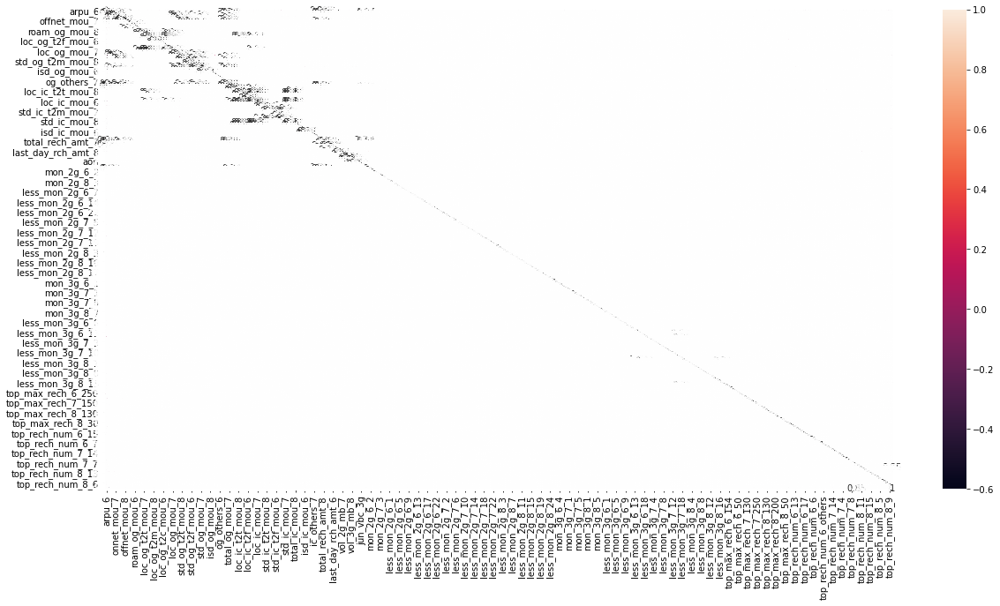

In [1486]:
# check the correlation metrix
plt.figure(figsize=(20,10))
sns.heatmap(X_train_sm.corr(), annot=True)
plt.show()

#### As we can see that with the help of heatmap we are not able to find the correlation, so in this case we are checking the multicollinearity at the time of model building with the help of `Variance Inflation Factor`

# Step6: Model Building
## Logistic Regression

In [1487]:
# importing useful library
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.feature_selection import RFE

### Build First Model

In [1488]:
# instantiating a model
logreg = LogisticRegression(random_state=100)

# using rfe
rfe = RFE(logreg, 20).fit(X_train_sm, y_train_sm)

In [1489]:
# check the variables supported by rfe
list(zip(X_train_sm.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 8),
 ('arpu_7', True, 1),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 5),
 ('onnet_mou_7', False, 16),
 ('onnet_mou_8', False, 62),
 ('offnet_mou_6', False, 9),
 ('offnet_mou_7', False, 130),
 ('offnet_mou_8', False, 132),
 ('roam_ic_mou_6', False, 19),
 ('roam_ic_mou_7', False, 107),
 ('roam_ic_mou_8', False, 71),
 ('roam_og_mou_6', True, 1),
 ('roam_og_mou_7', False, 96),
 ('roam_og_mou_8', False, 91),
 ('loc_og_t2t_mou_6', False, 38),
 ('loc_og_t2t_mou_7', False, 50),
 ('loc_og_t2t_mou_8', False, 66),
 ('loc_og_t2m_mou_6', False, 148),
 ('loc_og_t2m_mou_7', True, 1),
 ('loc_og_t2m_mou_8', False, 34),
 ('loc_og_t2f_mou_6', False, 75),
 ('loc_og_t2f_mou_7', False, 205),
 ('loc_og_t2f_mou_8', False, 35),
 ('loc_og_t2c_mou_6', False, 27),
 ('loc_og_t2c_mou_7', False, 32),
 ('loc_og_t2c_mou_8', False, 20),
 ('loc_og_mou_6', False, 63),
 ('loc_og_mou_7', False, 64),
 ('loc_og_mou_8', False, 154),
 ('std_og_t2t_mou_6', False, 40),
 ('std_og_t2t_mou_7', False, 82),
 ('s

In [1490]:
# creating a list of variables supported by rfe
col = X_train_sm.columns[rfe.support_]
col

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

## Forward Selection Method

In [1491]:
# importing Statsmodel
import statsmodels.api as sm

In [1492]:
# check the data
X_train_sm.shape, y_train_sm.shape

((35948, 334), (35948,))

### Build Second Model

In [1493]:
# creat a variable
X_train_sm1 = X_train_sm['arpu_7']

In [1494]:
# build the second model
X_train_stm = sm.add_constant(X_train_sm1)
logreg2 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg2.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35946
Model Family:                Binomial   Df Model:                            1
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10084.
Date:                Mon, 31 May 2021   Deviance:                       20167.
Time:                        20:11:14   Pearson chi2:                 6.25e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.2744      0.038    -86.582      0.0

In [1495]:
# getting the predicted value on the train
y_train_pred = logreg2.predict(X_train_stm).values.reshape(-1)
y_train_pred[:10]

array([3.07232640e-01, 7.14324117e-01, 3.39124047e-02, 5.78263019e-07,
       2.53508644e-03, 1.12598093e-04, 1.00226555e-01, 4.78727791e-02,
       9.95381692e-02, 4.43574994e-02])

#### Creating a dataframe with actual target variable and predicted target variable

In [1496]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,3.072326e-01,0
1,0,7.143241e-01,1
2,0,3.391240e-02,2
3,0,5.782630e-07,3
4,0,2.535086e-03,4


#### Check the model performance with the default threshold value 0.5

In [1497]:
# making a prediction based on default threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,3.072326e-01,0,0
1,0,7.143241e-01,1,1
2,0,3.391240e-02,2,0
3,0,5.782630e-07,3,0
4,0,2.535086e-03,4,0


In [1498]:
# check the confusion metrics
cf = confusion_matrix(y_train_pred_final['churn'], y_train_pred_final['predicted'])
cf

array([[16937,  1037],
       [ 1418, 16556]], dtype=int64)

In [1499]:
#   Predicted     not_churn    churn
#   Actual          
#  not_churn       16959      1015
#   churn          1372       16602

- As we know for this business problem it is important to find the churn customers accurately.
- For this the best metrix is consider to be sensitivity/recall.
#### lets check the `sensitivity/Recall` with the help of different ways

In [1500]:
# creating a variable of different attributes of confusion metrix
TN = cf[0,0]       # True Negative
FP = cf[0,1]       # False Positive
FN = cf[1,0]       # False Negative
TP = cf[1,1]       # True Positive

In [1501]:
# check the sensitivity with the help of confusion metrix
sensitivity = (TP / (TP+FN))*100
sensitivity

92.11082674974963

In [1502]:
# check the sensitivity with the help of classification report
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93     17974
           1       0.94      0.92      0.93     17974

    accuracy                           0.93     35948
   macro avg       0.93      0.93      0.93     35948
weighted avg       0.93      0.93      0.93     35948



###### As we can see with the help of this one independent variable we get 92% sensitivity.
###### And this result we get with the help of default threshold `0.5`.
###### With the help of more `independent variables` and `optimal threshold` value we can increase the sensitivity.
###### And before approving the model we have to check the `ROC Curve` also for the goodness of our model
###### And the final test of the model is on the `test set` before that we cannot say that any model with more than `90%` sensitivity is consider to be the best model.

### ROC Curve
- For checking the tradeoff between `True Positive Rate` and `False Positive Rate`.
- For checkin the goodness of the model
- And it also help us for finding how accurately our model is predicting the `churn customer`.

In [1503]:
# importing useful library
from sklearn import metrics

In [1504]:
# defining the ROC Curve

def roc(actual, prob):
    fpr, tpr, thresholds = metrics.roc_curve(actual, prob, drop_intermediate=False)
    auc_score = metrics.roc_auc_score(actual, prob)
    plt.figure(figsize=(5,5))
    plt.plot(fpr, tpr, label= '(area = %0.2f)' % auc_score)
    plt.plot([0,1], [0,1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate or [1-Specificity]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc= 'lower right')
    plt.show()
    
    return None

In [1505]:
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final['churn'], y_train_pred_final['churn_prob'], drop_intermediate=False)

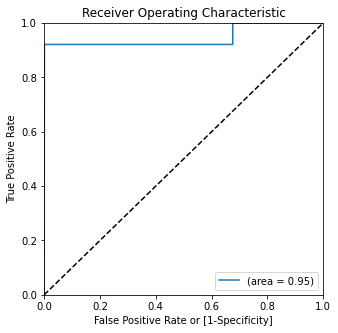

In [1506]:
# draw the roc curve
roc(y_train_pred_final['churn'], y_train_pred_final['churn_prob'])

- As we can see the Area under the Curve comes out to be 95% it means the model is more accurate to predict the churn customer.
- Lets check this model with the optimal threshold and than we are checking this model on the test set also which is the real test.

### Finding the Optimal Cutoff

In [1507]:
# create different variables from all the possible cut-offs
cut_offs = [float(x)/10 for x in range(10)]

for i in cut_offs:
    y_train_pred_final[i] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>i else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,3.072326e-01,0,0,1,1,1,1,0,0,0,0,0,0
1,0,7.143241e-01,1,1,1,1,1,1,1,1,1,1,0,0
2,0,3.391240e-02,2,0,1,0,0,0,0,0,0,0,0,0
3,0,5.782630e-07,3,0,1,0,0,0,0,0,0,0,0,0
4,0,2.535086e-03,4,0,1,0,0,0,0,0,0,0,0,0


In [1508]:
# calculate the sensitivity, specificity, accuracy for the different sets of cut-offs
cutoff_df = pd.DataFrame( columns= ['prob', 'sens', 'spec', 'acc'])

for i in cut_offs:
    cm1 = metrics.confusion_matrix(y_train_pred_final['churn'], y_train_pred_final[i])
    total = sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total
    
    sens = cm1[1,1] / (cm1[1,1]+cm1[1,0]) 
    spec = cm1[0,0] / (cm1[0,0]+cm1[0,1])
    cutoff_df.loc[i] = [i, accuracy, sens, spec]
print(cutoff_df)

     prob      sens      spec       acc
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.734255  0.921108  0.547402
0.2   0.2  0.820018  0.921108  0.718927
0.3   0.3  0.876655  0.921108  0.832202
0.4   0.4  0.911678  0.921108  0.902248
0.5   0.5  0.931707  0.921108  0.942306
0.6   0.6  0.943947  0.921108  0.966785
0.7   0.7  0.950929  0.921108  0.980750
0.8   0.8  0.955603  0.921108  0.990097
0.9   0.9  0.959441  0.921108  0.997775


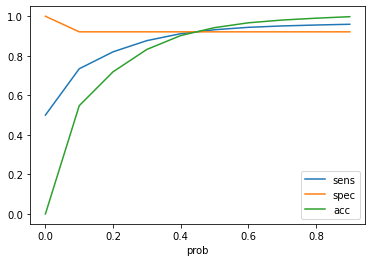

In [1509]:
# plotting the accuracy, sensitivity and specificity for the different cut-offs/thresholds
cutoff_df.plot.line(x= 'prob', y= ['sens','spec','acc'])
plt.show()

- As we can see after `0.5` threshold the sensitivity is kind of flat, so that threshold would be consider as an optimal threshold value.
- Which is also an deault threshold.

In [1510]:
# for checking the variables
X_train_sm[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

### Build Third Model

In [1511]:
# add the variable
X_train_sm1 = X_train_sm[['arpu_7','arpu_8']]

In [1512]:
# build the third model
X_train_stm = sm.add_constant(X_train_sm1)
logreg3 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg3.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35945
Model Family:                Binomial   Df Model:                            2
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8653.1
Date:                Mon, 31 May 2021   Deviance:                       17306.
Time:                        20:11:15   Pearson chi2:                 3.53e+04
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.9578      0.047    -84.635      0.0

### Check the VIF

In [1513]:
# importing useful library
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [1514]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,arpu_7,4.97
1,arpu_8,4.97


In [1515]:
# making prediction 
y_train_pred = logreg3.predict(X_train_stm).values.reshape(-1)

In [1516]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,0.177515,0
1,0,0.216648,1
2,0,0.235060,2
3,0,0.000003,3
4,0,0.001263,4


In [1517]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,0.177515,0,0
1,0,0.216648,1,0
2,0,0.235060,2,0
3,0,0.000003,3,0
4,0,0.001263,4,0


In [1518]:
# check the confusion metrics
cf = confusion_matrix(y_train_pred_final['churn'], y_train_pred_final['predicted'])
cf

array([[16779,  1195],
       [ 1418, 16556]], dtype=int64)

In [1519]:
# creating a variable of different attributes of confusion metrix
TN = cf[0,0]       # True Negative
FP = cf[0,1]       # False Positive
FN = cf[1,0]       # False Negative
TP = cf[1,1]       # True Positive

In [1520]:
# check the sensitivity with the help of confusion metrix
sensitivity = (TP / (TP+FN))*100
sensitivity

92.11082674974963

In [1521]:
# check the sensitivity with the help of classification report
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       0.92      0.93      0.93     17974
           1       0.93      0.92      0.93     17974

    accuracy                           0.93     35948
   macro avg       0.93      0.93      0.93     35948
weighted avg       0.93      0.93      0.93     35948



- As we can see by adding `arpu_8` variable in the model there is not much improvement in the model.
- Maybe this variable is not important for the prediction of target variable.

### Build Fourth Model

In [1522]:
# add the variable
X_train_sm1 = X_train_sm[['arpu_7','arpu_8','roam_og_mou_6']]

In [1523]:
# build the fourth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg4 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg4.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35944
Model Family:                Binomial   Df Model:                            3
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:17   Pearson chi2:                 2.55e+04
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -3.99e+04   1.26e+05     -0.316

- As we can see the P-value of the `roam_og_mou_6` independent variable is greater then 5 which means this variable is insignificant for the prediction of target variable.
- Lets check the `VIF` value than we decide further about the treatment of this variable

### Check the VIF

In [1524]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,arpu_7,5.00
1,arpu_8,5.00
2,roam_og_mou_6,1.09


- As we can see by adding the `roam_og_mou_6` variable in the model VIF value of the other two independent variables are also increase.
- So we are not including this variable.

In [1525]:
# drop the roam_og_mou_6 variable
X_train_sm1.drop('roam_og_mou_6', axis=1, inplace=True)

### Build Fifth Model

In [1526]:
# add the variable
X_train_sm1 = X_train_sm[['arpu_7','arpu_8','loc_og_t2m_mou_7']]

In [1527]:
# build the fifth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg5 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg5.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35944
Model Family:                Binomial   Df Model:                            3
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5975.6
Date:                Mon, 31 May 2021   Deviance:                       11951.
Time:                        20:11:17   Pearson chi2:                 2.36e+10
No. Iterations:                    10                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -7.1844      0.105  

### Check the VIF

In [1528]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,arpu_7,5.52
1,arpu_8,4.98
2,loc_og_t2m_mou_7,1.63


- As we can see the `arpu_7` independent variable VIF value is greater than 5%.
- Which means this variable is multicollinear with the other two independent variables together.
- So we are going to drop that variable

In [1529]:
# drop the arpu_7 variable
X_train_sm1.drop('arpu_7', axis=1, inplace=True)

### Build Sixth Model

In [1530]:
# for checking the variables
X_train_sm[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

In [1531]:
# add the variable
X_train_sm1 = X_train_sm[['arpu_8','loc_og_t2m_mou_7','std_og_mou_6']]

In [1532]:
# build the sixth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg6 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg6.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35944
Model Family:                Binomial   Df Model:                            3
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4738.3
Date:                Mon, 31 May 2021   Deviance:                       9476.6
Time:                        20:11:17   Pearson chi2:                 2.12e+11
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -22.9024      0.749  

### Check the VIF

In [1533]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,arpu_8,2.04
1,loc_og_t2m_mou_7,1.54
2,std_og_mou_6,1.42


In [1534]:
# making prediction 
y_train_pred = logreg6.predict(X_train_stm).values.reshape(-1)

In [1535]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,2.383235e-20,0
1,0,4.180186e-03,1
2,0,7.165606e-01,2
3,0,1.418948e-08,3
4,0,6.851627e-07,4


In [1536]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,2.383235e-20,0,0
1,0,4.180186e-03,1,0
2,0,7.165606e-01,2,1
3,0,1.418948e-08,3,0
4,0,6.851627e-07,4,0


In [1537]:
# check the confusion metrics
cf = confusion_matrix(y_train_pred_final['churn'], y_train_pred_final['predicted'])
cf

array([[16865,  1109],
       [ 1418, 16556]], dtype=int64)

In [1538]:
# creating a variable of different attributes of confusion metrix
TN = cf[0,0]       # True Negative
FP = cf[0,1]       # False Positive
FN = cf[1,0]       # False Negative
TP = cf[1,1]       # True Positive

In [1539]:
# check the sensitivity with the help of confusion metrix
sensitivity = (TP / (TP+FN))*100
sensitivity

92.11082674974963

- As we can see there is not much improvement in the sensitivity by adding the `std_og_mou_6` variable.
- Maybe this variable is not much effective for the prediction of target variable.
- Lets add some other variable in the model

### Build Seventh Model

In [1540]:
# add the variable
X_train_sm1 = X_train_sm[['arpu_8','loc_og_t2m_mou_7','std_og_mou_6','total_og_mou_6']]

In [1541]:
# build the seventh model
X_train_stm = sm.add_constant(X_train_sm1)
logreg7 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg7.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35943
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4423.8
Date:                Mon, 31 May 2021   Deviance:                       8847.6
Time:                        20:11:18   Pearson chi2:                 6.26e+11
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -23.3300      0.675  

### Check the VIF

In [1542]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,arpu_8,2.16
1,loc_og_t2m_mou_7,2.78
2,std_og_mou_6,7.75
3,total_og_mou_6,10.78


- As we can see `total_og_mou_6` variable is more than 5% VIF value.
- So we are going to drop this variable

In [1543]:
# drop the total_og_mou_6 variable
X_train_sm1.drop('total_og_mou_6', axis=1, inplace=True)

### Build Eighth Model

In [1544]:
# check the data
X_train_sm[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

In [1545]:
# add the variable
X_train_sm1 = X_train_sm[['arpu_8','loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8']]

In [1546]:
# build the eighth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg8 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg8.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35943
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4671.3
Date:                Mon, 31 May 2021   Deviance:                       9342.6
Time:                        20:11:18   Pearson chi2:                 4.08e+11
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -23.3114      0.767  

### Check the VIF

In [1547]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,arpu_8,29.41
1,loc_og_t2m_mou_7,1.54
2,std_og_mou_6,1.42
3,total_rech_amt_8,28.66


- As we can see by adding `total_rech_amt_8` variable in the model VIF value of `total_rech_amt_8` and `arpu_8` variable is getting higher than 5%.
- But as we can see that VIF of `arpu_8` is more than `total_rech_amt_8` variable, so we are going to drop `arpu_8` variable.

In [1548]:
# drop the arpu_8 variable
X_train_sm1.drop('arpu_8', axis=1, inplace=True)

### Build Ninth Model

In [1549]:
# build the ninth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg9 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg9.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35944
Model Family:                Binomial   Df Model:                            3
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5185.3
Date:                Mon, 31 May 2021   Deviance:                       10371.
Time:                        20:11:18   Pearson chi2:                 1.03e+10
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -26.0717      0.813  

### Check the VIF

In [1550]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.51
1,std_og_mou_6,1.40
2,total_rech_amt_8,1.99


In [1551]:
# making prediction 
y_train_pred = logreg9.predict(X_train_stm).values.reshape(-1)

In [1552]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,4.071304e-24,0
1,0,2.329189e-02,1
2,0,6.520987e-01,2
3,0,9.528381e-08,3
4,0,1.314633e-06,4


In [1553]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,4.071304e-24,0,0
1,0,2.329189e-02,1,0
2,0,6.520987e-01,2,1
3,0,9.528381e-08,3,0
4,0,1.314633e-06,4,0


In [1554]:
# check the confusion metrics
cf = confusion_matrix(y_train_pred_final['churn'], y_train_pred_final['predicted'])
cf

array([[16732,  1242],
       [ 1418, 16556]], dtype=int64)

In [1555]:
# creating a variable of different attributes of confusion metrix
TN = cf[0,0]       # True Negative
FP = cf[0,1]       # False Positive
FN = cf[1,0]       # False Negative
TP = cf[1,1]       # True Positive

In [1556]:
# check the sensitivity with the help of confusion metrix
sensitivity = (TP / (TP+FN))*100
sensitivity

92.11082674974963

- As we can see there is not any changes in the result of the model

In [1557]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7']]

### Build Tenth Model

In [1558]:
# build the tenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg10 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg10.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35943
Model Family:                Binomial   Df Model:                            4
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3113.4
Date:                Mon, 31 May 2021   Deviance:                       6226.8
Time:                        20:11:19   Pearson chi2:                 2.03e+12
No. Iterations:                    13                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -21.0318      0.696  

### Check the VIF

In [1559]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.55
1,std_og_mou_6,1.40
2,total_rech_amt_8,2.61
3,max_rech_amt_7,1.89


In [1560]:
# making prediction 
y_train_pred = logreg10.predict(X_train_stm).values.reshape(-1)

In [1561]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,6.659085e-17,0
1,0,2.335841e-07,1
2,0,2.537798e-03,2
3,0,4.243332e-08,3
4,0,1.200381e-04,4


In [1562]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,6.659085e-17,0,0
1,0,2.335841e-07,1,0
2,0,2.537798e-03,2,0
3,0,4.243332e-08,3,0
4,0,1.200381e-04,4,0


In [1563]:
# check the result of the model
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98     17974
           1       0.96      1.00      0.98     17974

    accuracy                           0.98     35948
   macro avg       0.98      0.98      0.98     35948
weighted avg       0.98      0.98      0.98     35948



- As we can see with this model we are getting 100% sensitivity.
- Lets check the confusion matrix for the safety

In [1564]:
# check the confusion metrics
cf = confusion_matrix(y_train_pred_final['churn'], y_train_pred_final['predicted'])
cf

array([[17257,   717],
       [    0, 17974]], dtype=int64)

- As we can see the model is predicted all the churner customer correctly.
- But this does't mean that by adding other variable our model is not making prediction at the same level which it done right now.
- Lets check some other variables also

In [1565]:
# check the data
X_train_sm[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

In [1566]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6']]

### Build Eleventh Model

In [1567]:
# build the eleventh model
X_train_stm = sm.add_constant(X_train_sm1)
logreg11 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg11.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35942
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:20   Pearson chi2:                 6.56e+11
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -43.0436      3.384  

### Check the VIF

In [1568]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.55
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.64
3,max_rech_amt_7,1.92
4,vol_2g_mb_6,1.07


In [1569]:
# making prediction 
y_train_pred = logreg11.predict(X_train_stm).values.reshape(-1)

In [1570]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,1.063071e-16,0
1,0,2.662256e-11,1
2,0,4.639699e-03,2
3,0,1.170471e-07,3
4,0,2.215183e-04,4


In [1571]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,1.063071e-16,0,0
1,0,2.662256e-11,1,0
2,0,4.639699e-03,2,0
3,0,1.170471e-07,3,0
4,0,2.215183e-04,4,0


In [1572]:
# check the result of the model
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     17974
           1       0.97      1.00      0.98     17974

    accuracy                           0.98     35948
   macro avg       0.98      0.98      0.98     35948
weighted avg       0.98      0.98      0.98     35948



- As we can see by adding this variable recall of other `target variable value` also increases.

In [1573]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','jul_vbc_3g']]

### Build Twelveth Model

In [1574]:
# build the twelveth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg12 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg12.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35941
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:22   Pearson chi2:                 1.18e+12
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -6.085e+04   1.65e+05  

### Check the VIF

In [1575]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.57
1,std_og_mou_6,1.44
2,total_rech_amt_8,2.72
3,max_rech_amt_7,2.05
4,vol_2g_mb_6,1.08
5,jul_vbc_3g,1.25


- As we can see `P-value` of `jul_vbc_3g` variable is very high which means this variable is not significant for the prediction of target variable.
- So we are going to drop this variable and check the other variable.

In [1576]:
# drop the arpu_8 variable
X_train_sm1.drop('jul_vbc_3g', axis=1, inplace=True)

In [1577]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','criteria']]

### Build Thirteenth Model

In [1578]:
# build the thirteenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg13 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg13.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35941
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:24   Pearson chi2:                 2.42e-06
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -9.544e+04   3.89e+05  

### Check the VIF

In [1579]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.57
1,std_og_mou_6,1.51
2,total_rech_amt_8,3.81
3,max_rech_amt_7,1.97
4,vol_2g_mb_6,1.08
5,criteria,3.35


- As we can see by adding `criteria` variable the P-value of many variables is increased.
- So we are going to drop that variable whose P-value is maximum which is `vol_2g_mb_6`.
- After that we are checking the model.

In [1580]:
# drop the arpu_8 variable
X_train_sm1.drop('vol_2g_mb_6', axis=1, inplace=True)

### Build forteenth Model

In [1581]:
# build the forteenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg14 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg14.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35942
Model Family:                Binomial   Df Model:                            5
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:25   Pearson chi2:                 2.97e+17
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -4.225e+15   4.48e+05  

### Check the VIF

In [1582]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.57
1,std_og_mou_6,1.50
2,total_rech_amt_8,3.80
3,max_rech_amt_7,1.95
4,criteria,3.33


- As we can see by removing `vol_2g_mb_6` variable P-value of others variable improved a lot

In [1583]:
# making prediction 
y_train_pred = logreg14.predict(X_train_stm).values.reshape(-1)

In [1584]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,0.0,0
1,0,0.0,1
2,0,0.0,2
3,0,0.0,3
4,0,0.0,4


In [1585]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,0.0,0,0
1,0,0.0,1,0
2,0,0.0,2,0
3,0,0.0,3,0
4,0,0.0,4,0


In [1586]:
# check the value of churn_prob
y_train_pred_final['churn_prob'].value_counts()

1.0    18040
0.0    17908
Name: churn_prob, dtype: int64

- As we can see the value of probability will be changes as a binary value maybe this is because of `criteria` variable.

In [1587]:
# check the data
X_train_sm[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

### Build fifteenth Model

In [1588]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1']]

In [1589]:
# build the fifteenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg15 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg15.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35941
Model Family:                Binomial   Df Model:                            6
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:27   Pearson chi2:                 2.61e+10
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             -137.8004     19.437  

### Check the VIF

In [1590]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.72
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.67
3,max_rech_amt_7,1.93
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.12


In [1591]:
# making prediction 
y_train_pred = logreg15.predict(X_train_stm).values.reshape(-1)

In [1592]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,2.372345e-58,0
1,0,2.427928e-42,1
2,0,5.893263e-18,2
3,0,1.605375e-23,3
4,0,1.189411e-12,4


In [1593]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,2.372345e-58,0,0
1,0,2.427928e-42,1,0
2,0,5.893263e-18,2,0
3,0,1.605375e-23,3,0
4,0,1.189411e-12,4,0


In [1594]:
# check the result of the model
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     17974
           1       0.99      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



### Build sixteenth Model

In [1595]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','less_mon_3g_6_1']]

In [1596]:
# build the sixteenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg16 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg16.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35940
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:29   Pearson chi2:                 8.53e+18
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -3.408e+15   4.74e+05  

### Check the VIF

In [1597]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.78
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.68
3,max_rech_amt_7,1.93
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.76
6,less_mon_3g_6_1,1.80


In [1598]:
# making prediction 
y_train_pred = logreg16.predict(X_train_stm).values.reshape(-1)

In [1599]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,0.0,0
1,0,0.0,1
2,0,0.0,2
3,0,0.0,3
4,0,0.0,4


- As we can see after adding `less_mon_3g_6_1` variable we get the probability value as a binary.
- So we are going to drop that variable.

### Build Seventeenth Model

In [1600]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_max_rech_7_50']]

In [1601]:
# build the Seventeenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg17 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg17.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35940
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:31   Pearson chi2:                 6.59e+11
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -304.0734     85.59

### Check the VIF

In [1602]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.72
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.68
3,max_rech_amt_7,1.98
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.12
6,top_max_rech_7_50,1.03


- As we can see P-value of `top_max_rech_7_50` variable is very high.
- So we are going to drop this variable.

In [1603]:
# check the data
X_train1[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

### Build Eighteenth Model

In [1604]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_max_rech_8_50']]

In [1605]:
# build the Eighteenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg18 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg18.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35940
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:33   Pearson chi2:                 2.00e+09
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -159.1052     40.81

### Check the VIF

In [1606]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.72
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.67
3,max_rech_amt_7,1.95
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.12
6,top_max_rech_8_50,1.01


- As we can see P-value of `top_max_rech_8_50` variable is very high.
- So we are going to drop this variable.

### Build Nineteenth Model

In [1607]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11']]

In [1608]:
# build the Nineteenth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg19 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg19.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35940
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:35   Pearson chi2:                 3.40e+07
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -301.1327     33.94

### Check the VIF

In [1609]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.80
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.68
3,max_rech_amt_7,1.94
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.55
6,top_rech_num_6_11,1.59


In [1610]:
# making prediction 
y_train_pred = logreg19.predict(X_train_stm).values.reshape(-1)

In [1611]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,2.294102e-116,0
1,0,4.808286e-70,1
2,0,3.993196e-24,2
3,0,3.645416e-36,3
4,0,2.968715e-24,4


In [1612]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,2.294102e-116,0,0
1,0,4.808286e-70,1,0
2,0,3.993196e-24,2,0
3,0,3.645416e-36,3,0
4,0,2.968715e-24,4,0


In [1613]:
# check the result of the model
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17974
           1       1.00      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



- As we can see the sensitivity of the target variable's values is 100%.
- Let see by adding some more variable.

In [1614]:
# check the data
X_train_sm[col].columns

Index(['arpu_7', 'arpu_8', 'roam_og_mou_6', 'loc_og_t2m_mou_7', 'std_og_mou_6',
       'total_og_mou_6', 'total_rech_amt_8', 'max_rech_amt_7', 'vol_2g_mb_6',
       'jul_vbc_3g', 'criteria', 'less_mon_2g_7_1', 'less_mon_3g_6_1',
       'top_max_rech_7_50', 'top_max_rech_8_50', 'top_rech_num_6_11',
       'top_rech_num_7_11', 'top_rech_num_7_others', 'top_rech_num_8_10',
       'top_rech_num_8_others'],
      dtype='object')

### Build Twentyth Model

In [1615]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11']]

In [1616]:
# build the Twentyth model
X_train_stm = sm.add_constant(X_train_sm1)
logreg20 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg20.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35939
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:37   Pearson chi2:                 4.50e+15
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -477.8318     73.26

### Check the VIF

In [1617]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.83
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.69
3,max_rech_amt_7,1.95
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.75
6,top_rech_num_6_11,1.91
7,top_rech_num_7_11,1.93


In [1618]:
# making prediction 
y_train_pred = logreg20.predict(X_train_stm).values.reshape(-1)

In [1619]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,6.857380e-273,0
1,0,1.223534e-142,1
2,0,9.062930e-74,2
3,0,2.741928e-90,3
4,0,6.492152e-55,4


In [1620]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,6.857380e-273,0,0
1,0,1.223534e-142,1,0
2,0,9.062930e-74,2,0
3,0,2.741928e-90,3,0
4,0,6.492152e-55,4,0


In [1621]:
# check the result of the model
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17974
           1       1.00      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



### Build Twenty-one Model

In [1622]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11','top_rech_num_7_others']]

In [1623]:
# build the Twenty-one model
X_train_stm = sm.add_constant(X_train_sm1)
logreg21 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg21.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35938
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:40   Pearson chi2:                 4.50e+15
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  -529.18

### Check the VIF

In [1624]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.90
1,std_og_mou_6,1.49
2,total_rech_amt_8,2.81
3,max_rech_amt_7,2.39
4,vol_2g_mb_6,1.09
5,less_mon_2g_7_1,1.76
6,top_rech_num_6_11,1.91
7,top_rech_num_7_11,1.94
8,top_rech_num_7_others,2.68


- As we can see by adding `top_rech_num_7_others` variable P-value of `top_rech_num_7_11` and `top_rech_num_7_others` variables become very high.
- So we are droping `top_rech_num_7_others` variable and adding other variable in place of this variable.

### Build Twenty-two Model

In [1625]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11','top_rech_num_8_10']]

In [1626]:
# build the Twenty-two model
X_train_stm = sm.add_constant(X_train_sm1)
logreg22 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg22.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35938
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:42   Pearson chi2:                 8.11e+17
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             -4.014e+15   4.79e+0

### Check the VIF

In [1627]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.84
1,std_og_mou_6,1.41
2,total_rech_amt_8,2.69
3,max_rech_amt_7,1.95
4,vol_2g_mb_6,1.07
5,less_mon_2g_7_1,1.85
6,top_rech_num_6_11,2.05
7,top_rech_num_7_11,2.13
8,top_rech_num_8_10,2.08


In [1628]:
# making prediction 
y_train_pred = logreg22.predict(X_train_stm).values.reshape(-1)

In [1629]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,0.0,0
1,0,0.0,1
2,0,0.0,2
3,0,0.0,3
4,0,0.0,4


- As we can see by adding `top_rech_num_8_10` value of target variables value comes 0 and 1.
- So we are going to drop this variable.

### Build Twenty-three Model

In [1630]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11','top_rech_num_8_others']]

In [1631]:
# build the Twenty-three model
X_train_stm = sm.add_constant(X_train_sm1)
logreg23 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg23.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35938
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:44   Pearson chi2:                 3.03e+10
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  -187.58

### Check the VIF

In [1632]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.95
1,std_og_mou_6,1.53
2,total_rech_amt_8,2.73
3,max_rech_amt_7,2.52
4,vol_2g_mb_6,1.09
5,less_mon_2g_7_1,1.76
6,top_rech_num_6_11,1.91
7,top_rech_num_7_11,1.93
8,top_rech_num_8_others,2.78


- As we can see `vol_2g_mb_6` variable P-value is very high so we are going to drop this variable.

### Build Twenty-four Model

In [1633]:
# add the variable
X_train_sm1 = X_train_sm[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11','top_rech_num_8_others']]

In [1634]:
# build the Twenty-four model
X_train_stm = sm.add_constant(X_train_sm1)
logreg24 = sm.GLM(y_train_sm, X_train_stm, family= sm.families.Binomial()).fit()
print(logreg24.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                35948
Model:                            GLM   Df Residuals:                    35939
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Mon, 31 May 2021   Deviance:                          nan
Time:                        20:11:46   Pearson chi2:                 4.09e+09
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  -156.36

### Check the VIF

In [1635]:
# creating VIF for checking the multicollinearity
vif = pd.DataFrame()
vif['Variables'] = X_train_sm1.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm1.values, i) for i in range(X_train_sm1.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif.sort_values(by = 'VIF', ascending= False)
vif

,Variables,VIF
0,loc_og_t2m_mou_7,1.94
1,std_og_mou_6,1.53
2,total_rech_amt_8,2.70
3,max_rech_amt_7,2.51
4,less_mon_2g_7_1,1.75
5,top_rech_num_6_11,1.91
6,top_rech_num_7_11,1.93
7,top_rech_num_8_others,2.73


In [1636]:
# making prediction 
y_train_pred = logreg24.predict(X_train_stm).values.reshape(-1)

In [1637]:
# creating a dataframe
y_train_pred_final = pd.DataFrame({'churn': y_train_sm, 'churn_prob': y_train_pred})
y_train_pred_final['custID'] = y_train_sm.index
y_train_pred_final.head()

,churn,churn_prob,custID
0,0,1.385063e-83,0
1,0,3.062597e-52,1
2,0,8.716244e-34,2
3,0,2.577403e-66,3
4,0,6.278757e-35,4


In [1638]:
# making a prediction based on optimal threshold
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,custID,predicted
0,0,1.385063e-83,0,0
1,0,3.062597e-52,1,0
2,0,8.716244e-34,2,0
3,0,2.577403e-66,3,0
4,0,6.278757e-35,4,0


In [1639]:
# check the result of the model
print(classification_report(y_train_pred_final['churn'], y_train_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17974
           1       1.00      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



- As we can see there are multiple models whose sensitivity comes out to be good and these models are model-no `2,3,6,10,11,15,19,20,24`.
- Now we are testing these models on the test set which is the actual test of the model.

# Evaluation of Logistic Model on the Test Set

### Check the model-2

In [1640]:
# creat a variable
X_test2 = X_test1['arpu_7']

In [1641]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg2.predict(X_test2)

In [1642]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,1.744097e-02,29304
46648,0,7.672643e-01,46648
80770,0,6.583273e-03,80770
44462,0,8.796115e-04,44462
11039,0,3.005343e-07,11039


In [1643]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,1.744097e-02,29304,0
46648,0,7.672643e-01,46648,1
80770,0,6.583273e-03,80770,0
44462,0,8.796115e-04,44462,0
11039,0,3.005343e-07,11039,0


In [1644]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97      7706
           1       0.01      1.00      0.01         3

    accuracy                           0.94      7709
   macro avg       0.50      0.97      0.49      7709
weighted avg       1.00      0.94      0.97      7709



- As we can see with the `model_2` we are getting 100% sesitivity on the test set also.
- So this model could be consider the best model.
##### Lets try the other model also

### Check the model-3

In [1645]:
X_test1.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_rech_gm,criteria,mon_2g_6_1,mon_2g_6_2,mon_2g_6_3,mon_2g_7_1,mon_2g_7_2,mon_2g_7_3,mon_2g_8_1,mon_2g_8_2,mon_2g_8_3,less_mon_2g_6_1,less_mon_2g_6_2,less_mon_2g_6_3,less_mon_2g_6_4,less_mon_2g_6_5,less_mon_2g_6_6,less_mon_2g_6_7,less_mon_2g_6_8,less_mon_2g_6_9,less_mon_2g_6_10,less_mon_2g_6_11,less_mon_2g_6_12,less_mon_2g_6_13,less_mon_2g_6_14,less_mon_2g_6_15,less_mon_2g_6_16,less_mon_2g_6_17,less_mon_2g_6_18,less_mon_2g_6_19,less_mon_2g_6_21,less_mon_2g_6_22,less_mon_2g_7_1,less_mon_2g_7_2,less_mon_2g_7_3,less_mon_2g_7_4,less_mon_2g_7_5,less_mon_2g_7_6,less_mon_2g_7_7,less_mon_2g_7_8,less_mon_2g_7_9,less_mon_2g_7_10,less_mon_2g_7_11,less_mon_2g_7_12,less_mon_2g_7_13,less_mon_2g_7_14,less_mon_2g_7_15,less_mon_2g_7_16,less_mon_2g_7_17,less_mon_2g_7_18,less_mon_2g_7_19,less_mon_2g_7_20,less_mon_2g_7_23,less_mon_2g_8_1,less_mon_2g_8_2,less_mon_2g_8_3,less_mon_2g_8_4,less_mon_2g_8_5,less_mon_2g_8_6,less_mon_2g_8_7,less_mon_2g_8_8,less_mon_2g_8_9,less_mon_2g_8_10,less_mon_2g_8_11,less_mon_2g_8_12,less_mon_2g_8_13,less_mon_2g_8_14,less_mon_2g_8_15,less_mon_2g_8_16,less_mon_2g_8_17,less_mon_2g_8_18,less_mon_2g_8_19,mon_3g_6_1,mon_3g_6_2,mon_3g_6_3,mon_3g_6_4,mon_3g_6_5,mon_3g_6_6,mon_3g_6_7,mon_3g_6_8,mon_3g_7_1,mon_3g_7_2,mon_3g_7_3,mon_3g_7_4,mon_3g_7_5,mon_3g_7_6,mon_3g_7_7,mon_3g_7_8,mon_3g_8_1,mon_3g_8_2,mon_3g_8_3,mon_3g_8_4,mon_3g_8_5,mon_3g_8_6,mon_3g_8_7,less_mon_3g_6_1,less_mon_3g_6_2,less_mon_3g_6_3,less_mon_3g_6_4,less_mon_3g_6_5,less_mon_3g_6_6,less_mon_3g_6_7,less_mon_3g_6_8,less_mon_3g_6_9,less_mon_3g_6_10,less_mon_3g_6_11,less_mon_3g_6_15,less_mon_3g_6_16,less_mon_3g_6_18,less_mon_3g_7_1,less_mon_3g_7_2,less_mon_3g_7_3,less_mon_3g_7_4,less_mon_3g_7_5,less_mon_3g_7_6,less_mon_3g_7_7,less_mon_3g_7_8,less_mon_3g_7_9,less_mon_3g_7_10,less_mon_3g_7_11,less_mon_3g_7_15,less_mon_3g_7_16,less_mon_3g_8_1,less_mon_3g_8_2,less_mon_3g_8_3,less_mon_3g_8_4,less_mon_3g_8_5,less_mon_3g_8_6,less_mon_3g_8_7,less_mon_3g_8_8,less_mon_3g_8_9,less_mon_3g_8_10,less_mon_3g_8_11,less_mon_3g_8_12,less_mon_3g_8_14,less_mon_3g_8_17,top_max_rech_6_120,top_max_rech_6_128,top_max_rech_6_154,top_max_rech_6_200,top_max_rech_6_250,top_max_rech_6_252,top_max_rech_6_50,top_max_rech_6_others,top_max_rech_7_120,top_max_rech_7_128,top_max_rech_7_130,top_max_rech_7_150,top_max_rech_7_154,top_max_rech_7_200,top_max_rech_7_250,top_max_rech_7_252,top_max_rech_7_50,top_max_rech_7_others,top_max_rech_8_130,to

In [1646]:
# creat a variable
X_test2 = X_test1[['arpu_7','arpu_8']]

In [1647]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg3.predict(X_test2)

In [1648]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,0.003526,29304
46648,0,0.530715,46648
80770,0,0.024129,80770
44462,0,0.000036,44462
11039,0,0.000012,11039


In [1649]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,0.003526,29304,0
46648,0,0.530715,46648,1
80770,0,0.024129,80770,0
44462,0,0.000036,44462,0
11039,0,0.000012,11039,0


In [1650]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.93      0.96      7706
           1       0.01      1.00      0.01         3

    accuracy                           0.93      7709
   macro avg       0.50      0.96      0.49      7709
weighted avg       1.00      0.93      0.96      7709



In [1651]:
confusion_matrix(y_test_pred_final['churn'], y_test_pred_final['predicted'])

array([[7143,  563],
       [   0,    3]], dtype=int64)

In [1652]:
round((7155/7706)*100,0)

93.0

##### As we can see with `model_3` also we get the 100% sensitivity for predicting the churn customer accurately but in terms of predicting the non-churn customer this model is less effective then the `model_2`. But according to business problem we have to find the churn customers accurately as compared to non-churn customers.

### Check the model-6

In [1653]:
# create a variable
X_test2 = X_test1[['arpu_8','loc_og_t2m_mou_7','std_og_mou_6']]

In [1654]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg6.predict(X_test2)

In [1655]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,9.019867e-31,29304
46648,0,1.251199e-01,46648
80770,0,2.089250e-13,80770
44462,0,6.450978e-17,44462
11039,0,7.573917e-07,11039


In [1656]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,9.019867e-31,29304,0
46648,0,1.251199e-01,46648,0
80770,0,2.089250e-13,80770,0
44462,0,6.450978e-17,44462,0
11039,0,7.573917e-07,11039,0


In [1657]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.93      0.97      7706
           1       0.01      1.00      0.01         3

    accuracy                           0.93      7709
   macro avg       0.50      0.97      0.49      7709
weighted avg       1.00      0.93      0.96      7709



- As we can see `model_6` gives the same result which `model_3` gives with minor improvement in the sensitivity of the non-churn class.

### Check the model-10

In [1658]:
# create a variable
X_test2 = X_test1[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7']]

In [1659]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg10.predict(X_test2)

In [1660]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,3.042640e-25,29304
46648,0,5.619730e-04,46648
80770,0,1.977534e-11,80770
44462,0,3.118821e-13,44462
11039,0,8.303208e-13,11039


In [1661]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,3.042640e-25,29304,0
46648,0,5.619730e-04,46648,0
80770,0,1.977534e-11,80770,0
44462,0,3.118821e-13,44462,0
11039,0,8.303208e-13,11039,0


In [1662]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98      7706
           1       0.01      1.00      0.02         3

    accuracy                           0.96      7709
   macro avg       0.50      0.98      0.50      7709
weighted avg       1.00      0.96      0.98      7709



- As we can see `model_10` gives better performance as compared to all pervious model in terms of sensitivity of churn and non-churn customer both.

### Check the model-11

In [1663]:
# create a variable
X_test2 = X_test1[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6']]

In [1664]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg11.predict(X_test2)

In [1665]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,5.379826e-25,29304
46648,0,8.676736e-05,46648
80770,0,9.786650e-26,80770
44462,0,7.675258e-13,44462
11039,0,6.189247e-14,11039


In [1666]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,5.379826e-25,29304,0
46648,0,8.676736e-05,46648,0
80770,0,9.786650e-26,80770,0
44462,0,7.675258e-13,44462,0
11039,0,6.189247e-14,11039,0


In [1667]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98      7706
           1       0.01      1.00      0.02         3

    accuracy                           0.97      7709
   macro avg       0.51      0.98      0.50      7709
weighted avg       1.00      0.97      0.98      7709



- As we can see `model_11` gives good result as compared to all the previous model.

### Check the model-15

In [1668]:
# create a variable
X_test2 = X_test1[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1']]

In [1669]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg15.predict(X_test2)

In [1670]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,2.464164e-75,29304
46648,0,4.072590e-21,46648
80770,0,4.509976e-77,80770
44462,0,3.620462e-38,44462
11039,0,4.189502e-52,11039


In [1671]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,2.464164e-75,29304,0
46648,0,4.072590e-21,46648,0
80770,0,4.509976e-77,80770,0
44462,0,3.620462e-38,44462,0
11039,0,4.189502e-52,11039,0


In [1672]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00      7706
           1       0.07      1.00      0.13         3

    accuracy                           0.99      7709
   macro avg       0.53      1.00      0.56      7709
weighted avg       1.00      0.99      1.00      7709



- As we can see `model_15` gives better result as compared to all the previous models.

### Check the model-19

In [1673]:
# create a variable
X_test2 = X_test1[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11']]

In [1674]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg19.predict(X_test2)

In [1675]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,3.213080e-160,29304
46648,0,8.248570e-31,46648
80770,0,9.054082e-167,80770
44462,0,2.512810e-72,44462
11039,0,6.423261e-76,11039


In [1676]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,3.213080e-160,29304,0
46648,0,8.248570e-31,46648,0
80770,0,9.054082e-167,80770,0
44462,0,2.512810e-72,44462,0
11039,0,6.423261e-76,11039,0


In [1677]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7706
           1       0.13      1.00      0.23         3

    accuracy                           1.00      7709
   macro avg       0.57      1.00      0.61      7709
weighted avg       1.00      1.00      1.00      7709



- As we can see `model_19` gives better result as compared to all the previous models.

### Check the model-20

In [1678]:
# create a variable
X_test2 = X_test1[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','vol_2g_mb_6','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11']]

In [1679]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg20.predict(X_test2)

In [1680]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,0.000000e+00,29304
46648,0,1.475826e-77,46648
80770,0,3.298087e-244,80770
44462,0,1.391501e-165,44462
11039,0,6.402245e-190,11039


In [1681]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,0.000000e+00,29304,0
46648,0,1.475826e-77,46648,0
80770,0,3.298087e-244,80770,0
44462,0,1.391501e-165,44462,0
11039,0,6.402245e-190,11039,0


In [1682]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7706
           1       0.27      1.00      0.43         3

    accuracy                           1.00      7709
   macro avg       0.64      1.00      0.71      7709
weighted avg       1.00      1.00      1.00      7709



- As we can see `model_20` also gives better result.

### Check the model-24

In [1683]:
# create a variable
X_test2 = X_test1[['loc_og_t2m_mou_7','std_og_mou_6','total_rech_amt_8','max_rech_amt_7','less_mon_2g_7_1','top_rech_num_6_11','top_rech_num_7_11','top_rech_num_8_others']]

In [1684]:
# making a prediction
X_test2 = sm.add_constant(X_test2)
y_test_pred = logreg24.predict(X_test2)

In [1685]:
# creating a dataframe
y_test_pred_final = pd.DataFrame({'churn': y_test, 'churn_prob': y_test_pred})
y_test_pred_final['custID'] = y_test.index
y_test_pred_final.head()

,churn,churn_prob,custID
29304,0,5.464627e-134,29304
46648,0,1.486113e-34,46648
80770,0,7.751896e-57,80770
44462,0,1.357909e-90,44462
11039,0,1.480898e-83,11039


In [1686]:
# making a prediction based on optimal threshold
y_test_pred_final['predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x>0.5 else 0)
y_test_pred_final.head()

,churn,churn_prob,custID,predicted
29304,0,5.464627e-134,29304,0
46648,0,1.486113e-34,46648,0
80770,0,7.751896e-57,80770,0
44462,0,1.357909e-90,44462,0
11039,0,1.480898e-83,11039,0


In [1687]:
# check the result of the model
print(classification_report(y_test_pred_final['churn'], y_test_pred_final['predicted']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7706
           1       0.43      1.00      0.60         3

    accuracy                           1.00      7709
   macro avg       0.71      1.00      0.80      7709
weighted avg       1.00      1.00      1.00      7709



- As we can see in `Logistic Regression` models `model_24` gives very good result in all the aspect of metrices.
- Now we are building some of the advanced Machine Learning algorithm and try to evaluate those models also on the test set.
- And check thier prediction and metrices.

## Decision Tree Model

###### Before starting decision tree model there are some variables value which is present in the train set but not present in the test set and there are some variables value which is present in the test set but not present in the train set.
###### So we are not creating those variable's dummy variable because those variables are categorical variables

In [1689]:
# check the result
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((17987, 129), (7709, 129), (17987,), (7709,))

In [1690]:
# creating a dummy variable for decision tree
X_train_dt = pd.get_dummies(X_train, columns=['max_rech_cat_6','max_rech_cat_7','max_rech_cat_8','rech_num_cat_6','rech_num_cat_7','rech_num_cat_8'], prefix=['top_max_rech_6','top_max_rech_7','top_max_rech_8','top_rech_num_6','top_rech_num_7','top_rech_num_8'], drop_first=True)
X_test_dt = pd.get_dummies(X_test, columns=['max_rech_cat_6','max_rech_cat_7','max_rech_cat_8','rech_num_cat_6','rech_num_cat_7','rech_num_cat_8'], prefix=['top_max_rech_6','top_max_rech_7','top_max_rech_8','top_rech_num_6','top_rech_num_7','top_rech_num_8'], drop_first=True)

In [1691]:
# creating test set variable also
y_train_dt = y_train
y_test_dt = y_test

In [1692]:
# check the result
X_train_dt.shape, X_test_dt.shape, y_train_dt.shape, y_test_dt.shape

((17987, 195), (7709, 191), (17987,), (7709,))

###### As we can see stil there are some variables which is not present in the test set so we are going to drop them from the train set

In [1693]:
# list of variables which is not present in test set
col_notin_test = ['top_max_rech_8_200','top_rech_num_6_17','top_rech_num_6_3','top_rech_num_8_15']

In [1694]:
# dropping the columns from the train set
X_train_dt.drop(columns=col_notin_test, axis=1, inplace=True)

In [1695]:
# check the result
X_train_dt.shape, X_test_dt.shape

((17987, 191), (7709, 191))

## Balance the Data

In [1696]:
# import useful library for balance the data
from imblearn.over_sampling import RandomOverSampler

In [1697]:
# balance the data
over_sample = RandomOverSampler(sampling_strategy=1)
X_train_sm, y_train_sm = over_sample.fit_resample(X_train_dt, y_train_dt)

In [1698]:
# check the result
y_train_sm.value_counts()

1    17974
0    17974
Name: churn, dtype: int64

## Decision Tree Model

In [1699]:
# importing useful library
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

##### Starting with the simple model without any hyper-parameter tuning

## Building 1st Model

In [1700]:
# build a model without any hyper-parameter tuning
dt1= DecisionTreeClassifier(random_state=100)
dt1.fit(X_train_sm, y_train_sm)

DecisionTreeClassifier(random_state=100)

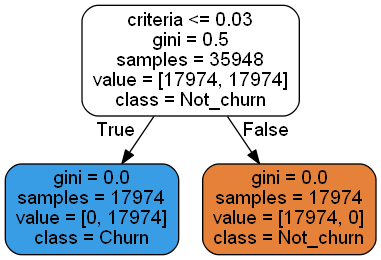

In [1701]:
# check the graph of the model
dot_data = StringIO()
export_graphviz(dt1, out_file= dot_data, filled=True, rounded=True,
                feature_names=X_train_sm.columns,
                class_names=['Not_churn','Churn'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

##### As we can see the intepretation of this simple decision tree model without any hyper-parameter tuning, according to this model:
- If customers criteria is less than 0.03 then that customer will churn and if this statement will not true than that customer will not churn.
### Lets check the sensitivity of this model

In [1702]:
# making a prediction
y_train_pred_dt1 = dt1.predict(X_train_sm)

In [1703]:
# check the sensitivity
print(classification_report(y_train_sm, y_train_pred_dt1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17974
           1       1.00      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



### Evaluation of the model

In [1704]:
# making a prediction
y_test_pred_dt1 = dt1.predict(X_test_dt)

In [1705]:
# check the senstivity
print(classification_report(y_test_dt, y_test_pred_dt1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7706
           1       1.00      1.00      1.00         3

    accuracy                           1.00      7709
   macro avg       1.00      1.00      1.00      7709
weighted avg       1.00      1.00      1.00      7709



- As we can see that this simple `Decision Tree` model perform well on the both set without any hyper-parameter tuning.
- Maybe this is because we have only 3 customers who churn the company in the test.
- Lets see the model with the help of hyper-parameter tuning.

### Hyper-parameter Tuning

In [1706]:
# importing useful library
from sklearn.model_selection import GridSearchCV

## Building 2nd Model

In [1707]:
# instantiating a object
dt2 = DecisionTreeClassifier(random_state=100)

In [1708]:
# create a list of different parameter using GridSearchCV
param = {
         'max_depth' : [2,4,6,8,10,15,20],
         'min_samples_leaf' : [5,10,15,20,50,100],
         'criterion' : ['gini','entropy']
}

In [1709]:
# instantiating the grid search
grid_search2 = GridSearchCV(estimator=dt2, 
                           param_grid=param,
                           cv=4, n_jobs=-1, verbose=1, scoring='accuracy')

In [1710]:
# fit the grid search
grid_search2.fit(X_train_sm, y_train_sm)

Fitting 4 folds for each of 84 candidates, totalling 336 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=100),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 15, 20],
                         'min_samples_leaf': [5, 10, 15, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [1711]:
# check the result with dataframe
score2 = pd.DataFrame(grid_search2.cv_results_)
score2.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.507365,0.007411,0.056503,0.003274,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
1,0.519424,0.011076,0.051010,0.005068,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
2,0.526574,0.018922,0.057853,0.003727,gini,2,15,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
3,0.506280,0.014008,0.054096,0.004191,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
4,0.502088,0.007288,0.058498,0.005511,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1


- As we can see the result of one hyper-parameter technique which is GridSearchCV.
- Lets see the top 5 combinations of parameters which gives more `mean_test_score` among them which is the highest score that would be consider the best combination of parameters for our decision tree model.

In [1712]:
# check the top best combinations of parameters
score2.nlargest(5, 'mean_test_score')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.507365,0.007411,0.056503,0.003274,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
1,0.519424,0.011076,0.051010,0.005068,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
2,0.526574,0.018922,0.057853,0.003727,gini,2,15,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
3,0.506280,0.014008,0.054096,0.004191,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1
4,0.502088,0.007288,0.058498,0.005511,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",1.0,1.0,1.0,1.0,1.0,0.0,1


- As we can these are the 5 best combination of parameters.
- Lets see according to GridSearchCV which is the best set of parameters

In [1713]:
# check the best set of parameters
grid_search2.best_estimator_

DecisionTreeClassifier(max_depth=2, min_samples_leaf=5, random_state=100)

In [1714]:
# creating a variable of it for analysing
dt2_best = grid_search2.best_estimator_

In [1715]:
# making a prediction
y_train_pred_dt2 = dt2_best.predict(X_train_sm)

In [1716]:
# check the sensitivity
print(classification_report(y_train_sm, y_train_pred_dt2))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17974
           1       1.00      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



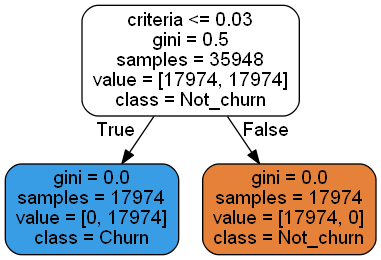

In [1717]:
# check the graph of the model
dot_data = StringIO()
export_graphviz(dt2_best, out_file= dot_data, filled=True, rounded=True,
                feature_names=X_train_sm.columns,
                class_names=['Not_churn','Churn'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

### Evaluating this model

In [1718]:
# making a prediction
y_test_pred_dt2 = dt2_best.predict(X_test_dt)

In [1719]:
# check the sensitivity
print(classification_report(y_test_dt, y_test_pred_dt2))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7706
           1       1.00      1.00      1.00         3

    accuracy                           1.00      7709
   macro avg       1.00      1.00      1.00      7709
weighted avg       1.00      1.00      1.00      7709



- As we can see with the help of this model also we are getting 100% sensitivity on the both set
- But it interpret with only one variable which is `criteria` but we want more interpretation so we are droping this variable.
- Again building tuned model on the remaining variables

In [1720]:
# creating a variable of all the columns
col_dt = X_train_dt.columns
col_dt

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'top_rech_num_8_14', 'top_rech_num_8_2', 'top_rech_num_8_3',
       'top_rech_num_8_4', 'top_rech_num_8_5', 'top_rech_num_8_6',
       'top_rech_num_8_7', 'top_rech_num_8_8', 'top_rech_num_8_9',
       'top_rech_num_8_others'],
      dtype='object', length=191)

In [1721]:
# drop the criteria variable
col_dt = col_dt.drop('criteria', 1)

## Building 3rd Model

In [1722]:
# instantiating a object
dt3 = DecisionTreeClassifier(random_state=100)

In [1723]:
# create a list of different parameter using GridSearchCV
param = {
         'max_depth' : [2,4,6,8,10,15,20],
         'min_samples_leaf' : [5,10,15,20,50,100],
         'criterion' : ['gini','entropy']
}

In [1724]:
# instantiating the grid search
grid_search3 = GridSearchCV(estimator=dt3, 
                           param_grid=param,
                           cv=4, n_jobs=-1, verbose=1, scoring='accuracy')

In [1725]:
# fit the grid search
grid_search3.fit(X_train_sm[col_dt], y_train_sm)

Fitting 4 folds for each of 84 candidates, totalling 336 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=100),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 15, 20],
                         'min_samples_leaf': [5, 10, 15, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [1726]:
# check the result with dataframe
score3 = pd.DataFrame(grid_search3.cv_results_)
score3.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.818309,0.050247,0.037788,0.001971,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.983309,0.984311,0.985535,0.984311,0.984366,0.000789,73
1,0.925085,0.091105,0.051769,0.012296,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.983198,0.984311,0.985535,0.984088,0.984283,0.000834,75
2,0.918975,0.074612,0.051787,0.018047,gini,2,15,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.983198,0.984311,0.985535,0.984088,0.984283,0.000834,75
3,0.814905,0.127218,0.045734,0.006480,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.983198,0.984311,0.985535,0.984088,0.984283,0.000834,75
4,0.911728,0.020774,0.038367,0.008829,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.983198,0.984311,0.985535,0.984088,0.984283,0.000834,75


In [1727]:
# check the top best combinations of parameters
score3.nlargest(5, 'mean_test_score')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
6,1.101846,0.022615,0.041411,0.003241,gini,4,5,"{'criterion': 'gini', 'max_depth': 4, 'min_sam...",1.0,0.999889,0.999555,1.0,0.999861,0.000182,1
12,0.948156,0.051913,0.031227,0.007933,gini,6,5,"{'criterion': 'gini', 'max_depth': 6, 'min_sam...",1.0,0.999889,0.999555,1.0,0.999861,0.000182,1
18,0.962014,0.020024,0.044971,0.010390,gini,8,5,"{'criterion': 'gini', 'max_depth': 8, 'min_sam...",1.0,0.999889,0.999555,1.0,0.999861,0.000182,1
24,1.084357,0.019068,0.043685,0.002956,gini,10,5,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",1.0,0.999889,0.999555,1.0,0.999861,0.000182,1
30,1.083416,0.013287,0.043482,0.004458,gini,15,5,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",1.0,0.999889,0.999555,1.0,0.999861,0.000182,1


In [1728]:
# check the best set of parameters
grid_search3.best_estimator_

DecisionTreeClassifier(max_depth=4, min_samples_leaf=5, random_state=100)

In [1729]:
# creating a variable of it for analysing
dt3_best = grid_search3.best_estimator_

In [1730]:
# making a prediction
y_train_pred_dt3 = dt3_best.predict(X_train_sm[col_dt])

In [1731]:
# check the sensitivity
print(classification_report(y_train_sm, y_train_pred_dt3))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17974
           1       1.00      1.00      1.00     17974

    accuracy                           1.00     35948
   macro avg       1.00      1.00      1.00     35948
weighted avg       1.00      1.00      1.00     35948



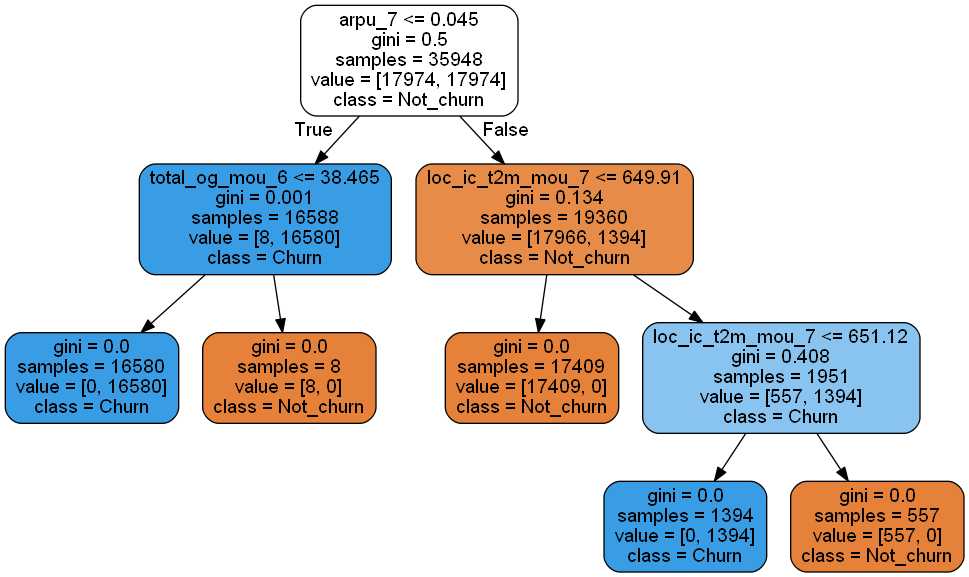

In [1732]:
# check the graph of the model
dot_data = StringIO()
export_graphviz(dt3_best, out_file= dot_data, filled=True, rounded=True,
                feature_names=X_train_sm[col_dt].columns,
                class_names=['Not_churn','Churn'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

- As we can see with `model_3` sensitivity on the training set is declined.
- Lets check the sensitivity on the test set also.

### Evaluating this model

In [1733]:
# making a prediction
y_test_pred_dt3 = dt3_best.predict(X_test_dt[col_dt])

In [1734]:
# check the sensitivity
print(classification_report(y_test_dt, y_test_pred_dt3))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7706
           1       0.43      1.00      0.60         3

    accuracy                           1.00      7709
   macro avg       0.71      1.00      0.80      7709
weighted avg       1.00      1.00      1.00      7709

